<h1 style="text-align: center;font-size: 48px;">Προεπεξεργασία Δεδομένων</h1>


In [58]:
import pandas as pd
import numpy as np

# Set pandas display options to show all columns and rows
pd.set_option('display.max_columns', None)  # Show all columns
pd.set_option('display.max_rows', None)     # Show all rows 
pd.set_option('display.max_colwidth', None) # Show full column width

# Loading the data from the CSV file
file_path = 'data.csv'
data = pd.read_csv(file_path, delimiter=';')

# Display the column names
print("Original Column Names:")
print(data.columns.tolist())

Original Column Names:
['Marital status', 'Application mode', 'Application order', 'Course', 'Daytime/evening attendance\t', 'Previous qualification', 'Previous qualification (grade)', 'Nacionality', "Mother's qualification", "Father's qualification", "Mother's occupation", "Father's occupation", 'Admission grade', 'Displaced', 'Educational special needs', 'Debtor', 'Tuition fees up to date', 'Gender', 'Scholarship holder', 'Age at enrollment', 'International', 'Curricular units 1st sem (credited)', 'Curricular units 1st sem (enrolled)', 'Curricular units 1st sem (evaluations)', 'Curricular units 1st sem (approved)', 'Curricular units 1st sem (grade)', 'Curricular units 1st sem (without evaluations)', 'Curricular units 2nd sem (credited)', 'Curricular units 2nd sem (enrolled)', 'Curricular units 2nd sem (evaluations)', 'Curricular units 2nd sem (approved)', 'Curricular units 2nd sem (grade)', 'Curricular units 2nd sem (without evaluations)', 'Unemployment rate', 'Inflation rate', 'GDP'

# Καθαρισμός των ονομάτων
Καθαρίζουμε τα ονόματα των στηλών για να διασφαλίσουμε ότι δεν περιέχουν περιττούς χαρακτήρες όπως κενά & tabs.

In [59]:
# Clean column names
data.columns = data.columns.str.strip().str.replace('\t', '')

# Replace spaces with underscores
data.columns = data.columns.str.replace(' ', '_')

# Display the cleaned column names
print("Cleaned Column Names:")
print(data.columns.tolist())


Cleaned Column Names:
['Marital_status', 'Application_mode', 'Application_order', 'Course', 'Daytime/evening_attendance', 'Previous_qualification', 'Previous_qualification_(grade)', 'Nacionality', "Mother's_qualification", "Father's_qualification", "Mother's_occupation", "Father's_occupation", 'Admission_grade', 'Displaced', 'Educational_special_needs', 'Debtor', 'Tuition_fees_up_to_date', 'Gender', 'Scholarship_holder', 'Age_at_enrollment', 'International', 'Curricular_units_1st_sem_(credited)', 'Curricular_units_1st_sem_(enrolled)', 'Curricular_units_1st_sem_(evaluations)', 'Curricular_units_1st_sem_(approved)', 'Curricular_units_1st_sem_(grade)', 'Curricular_units_1st_sem_(without_evaluations)', 'Curricular_units_2nd_sem_(credited)', 'Curricular_units_2nd_sem_(enrolled)', 'Curricular_units_2nd_sem_(evaluations)', 'Curricular_units_2nd_sem_(approved)', 'Curricular_units_2nd_sem_(grade)', 'Curricular_units_2nd_sem_(without_evaluations)', 'Unemployment_rate', 'Inflation_rate', 'GDP', '

# Διαχείριση NaN values
Ελέγχουμε για τυχόν ελλιπής τιμές. Αν και σε αυτήν την περίπτωση,  γνωρίζουμε εξαρχής οτι δεν υπάρχουν. 

In [60]:
# Checking for missing values
missing_values = data.isnull().sum()
print("Missing values per column:", missing_values)

Missing values per column: Marital_status                                    0
Application_mode                                  0
Application_order                                 0
Course                                            0
Daytime/evening_attendance                        0
Previous_qualification                            0
Previous_qualification_(grade)                    0
Nacionality                                       0
Mother's_qualification                            0
Father's_qualification                            0
Mother's_occupation                               0
Father's_occupation                               0
Admission_grade                                   0
Displaced                                         0
Educational_special_needs                         0
Debtor                                            0
Tuition_fees_up_to_date                           0
Gender                                            0
Scholarship_holder                   

# Μετατροπή της μεταβλητής στόχου
Μετατρέπουμε τις κατηγορίες του Target ('Dropout', 'Enrolled', 'Graduate') σε αριθμητικές τιμές (0, 1, 2).

In [61]:
# Map the target variable to numerical values
target_mapping = {'Dropout': 0, 'Enrolled': 1, 'Graduate': 2}
data['Target'] = data['Target'].map(target_mapping)

# Verify the mapping
print("Unique values in 'Target':", data['Target'].unique())
print("Data type of 'Target':", data['Target'].dtype)

Unique values in 'Target': [0 2 1]
Data type of 'Target': int64


# Έλεγχος Κατανομής της Μεταβλητής Στόχου

Σε αυτό το βήμα, χρησιμοποιούμε την συνάρτηση `Counter` από τη βιβλιοθήκη `collections` για να ελέγξουμε την κατανομή των δειγμάτων στις κατηγορίες της μεταβλητής στόχου `Target`. Ο λόγος που ελέγχουμε την κατανομή της μεταβλητής στόχου είναι για να καταλάβουμε αν το σύνολο δεδομένων μας έχει ισορροπημένες κατηγορίες ή αν κάποιες κατηγορίες είναι υπερεκπροσωπούμενες ή υποεκπροσωπούμενες (π.χ. αν έχουμε πολύ περισσότερους μαθητές που έκαναν "dropout" σε σχέση με αυτούς που αποφοίτησαν).

In [62]:
from collections import Counter

print("Class distribution:")
print(Counter(data['Target']))

Class distribution:
Counter({2: 2209, 0: 1421, 1: 794})


# Κατηγοριοποίηση Χαρακτηριστικών (Features)
Διαχωρίζμος χαρακτηριστικών του dataset σε διαφορετικές κατηγορίες ανάλογα με τον τύπο τους (Numerical, Binary, Ordinal, Nominal). Αν και όχι ξεκάθαρα ordinal ("Mother's_qualification", "Father's_qualification",'Previous_qualification' )θεώρησα οτί θα βοηθούσε.

In [63]:
numerical_features = [
    'Age_at_enrollment',
    'Admission_grade',
    'Previous_qualification_(grade)',
    'Curricular_units_1st_sem_(credited)',
    'Curricular_units_1st_sem_(enrolled)',
    'Curricular_units_1st_sem_(evaluations)',
    'Curricular_units_1st_sem_(approved)',
    'Curricular_units_1st_sem_(grade)',
    'Curricular_units_1st_sem_(without_evaluations)',
    'Curricular_units_2nd_sem_(credited)',
    'Curricular_units_2nd_sem_(enrolled)',
    'Curricular_units_2nd_sem_(evaluations)',
    'Curricular_units_2nd_sem_(approved)',
    'Curricular_units_2nd_sem_(grade)',
    'Curricular_units_2nd_sem_(without_evaluations)',
    'Unemployment_rate',
    'Inflation_rate',
    'GDP',
    'Application_order'
]
binary_features = [
    'Displaced',
    'Gender',
    'International',
    'Educational_special_needs',
    'Debtor',
    'Tuition_fees_up_to_date',
    'Scholarship_holder',
    'Daytime/evening_attendance'  
]
nominal_features = [
    'Marital_status',
    'Nacionality',
    "Mother's_occupation",
    "Father's_occupation",
    'Application_mode',
    'Course',
    "Mother's_qualification",
    "Father's_qualification",
    'Previous_qualification'
]

# Έλεγχος Τύπων Δεδομένων

In [64]:
# Check data types
print(data.dtypes)

Marital_status                                      int64
Application_mode                                    int64
Application_order                                   int64
Course                                              int64
Daytime/evening_attendance                          int64
Previous_qualification                              int64
Previous_qualification_(grade)                    float64
Nacionality                                         int64
Mother's_qualification                              int64
Father's_qualification                              int64
Mother's_occupation                                 int64
Father's_occupation                                 int64
Admission_grade                                   float64
Displaced                                           int64
Educational_special_needs                           int64
Debtor                                              int64
Tuition_fees_up_to_date                             int64
Gender        

# ------------------------------------------------------------------------------------
# "Mother's_qualification","Father's_qualification",'Previous_qualification'
# ------------------------------------------------------------------------------------

Δημιουργία Mapping που αντιστοιχούν στις κατηγορίες εκπαίδευσης για τη μητέρα, τον πατέρα και την προηγούμενη εκπαίδευση του φοιτητη. Αυτοί οι χάρτες επιτρέπουν την αντιστοίχηση των κωδικών σε συγκεκριμένα επίπεδα εκπαίδευσης.


In [65]:
from sklearn.preprocessing import OrdinalEncoder

# Create mappings for each qualification feature based on provided codes

# Mother's Qualification Mapping
mothers_qualification_mapping = {
    1: 'Secondary Education - 12th Year of Schooling or Eq.',
    2: 'Higher Education - Bachelor\'s Degree',
    3: 'Higher Education - Degree',
    4: 'Higher Education - Master\'s',
    5: 'Higher Education - Doctorate',
    6: 'Frequency of Higher Education',
    9: '12th Year of Schooling - Not Completed',
    10: '11th Year of Schooling - Not Completed',
    11: '7th Year (Old)',
    12: 'Other - 11th Year of Schooling',
    14: '10th Year of Schooling',
    18: 'General commerce course',
    19: 'Basic Education 3rd Cycle (9th/10th/11th Year) or Equiv.',
    22: 'Technical-professional course',
    26: '7th year of schooling',
    27: '2nd cycle of the general high school course',
    29: '9th Year of Schooling - Not Completed',
    30: '8th year of schooling',
    34: 'Unknown',
    35: 'Can\'t read or write',
    36: 'Can read without having a 4th year of schooling',
    37: 'Basic education 1st cycle (4th/5th year) or equiv.',
    38: 'Basic Education 2nd Cycle (6th/7th/8th Year) or Equiv.',
    39: 'Technological specialization course',
    40: 'Higher education - degree (1st cycle)',
    41: 'Specialized higher studies course',
    42: 'Professional higher technical course',
    43: 'Higher Education - Master (2nd cycle)',
    44: 'Higher Education - Doctorate (3rd cycle)'
}

# Father's Qualification Mapping
fathers_qualification_mapping = {
    1: 'Secondary Education - 12th Year of Schooling or Eq.',
    2: 'Higher Education - Bachelor\'s Degree',
    3: 'Higher Education - Degree',
    4: 'Higher Education - Master\'s',
    5: 'Higher Education - Doctorate',
    6: 'Frequency of Higher Education',
    9: '12th Year of Schooling - Not Completed',
    10: '11th Year of Schooling - Not Completed',
    11: '7th Year (Old)',
    12: 'Other - 11th Year of Schooling',
    13: '2nd year complementary high school course',
    14: '10th Year of Schooling',
    18: 'General commerce course',
    19: 'Basic Education 3rd Cycle (9th/10th/11th Year) or Equiv.',
    20: 'Complementary High School Course',
    22: 'Technical-professional course',
    25: 'Complementary High School Course - not concluded',
    26: '7th year of schooling',
    27: '2nd cycle of the general high school course',
    29: '9th Year of Schooling - Not Completed',
    30: '8th year of schooling',
    31: 'General Course of Administration and Commerce',
    33: 'Supplementary Accounting and Administration',
    34: 'Unknown',
    35: 'Can\'t read or write',
    36: 'Can read without having a 4th year of schooling',
    37: 'Basic education 1st cycle (4th/5th year) or equiv.',
    38: 'Basic Education 2nd Cycle (6th/7th/8th Year) or Equiv.',
    39: 'Technological specialization course',
    40: 'Higher education - degree (1st cycle)',
    41: 'Specialized higher studies course',
    42: 'Professional higher technical course',
    43: 'Higher Education - Master (2nd cycle)',
    44: 'Higher Education - Doctorate (3rd cycle)'
}
# Previous Qualification Mapping
previous_qualification_mapping = {
    1: 'Secondary education',
    2: 'Higher education - Bachelor\'s Degree',
    3: 'Higher education - Degree',
    4: 'Higher education - Master\'s',
    5: 'Higher education - Doctorate',
    6: 'Frequency of Higher Education',
    9: '12th Year of Schooling - Not Completed',
    10: '11th Year of Schooling - Not Completed',
    12: 'Other - 11th Year of Schooling',
    14: '10th Year of Schooling',
    15: '10th Year of Schooling - Not Completed',
    19: 'Basic Education 3rd Cycle (9th/10th/11th Year) or Equiv.',
    38: 'Basic Education 2nd Cycle (6th/7th/8th Year) or Equiv.',
    39: 'Technological Specialization Course',
    40: 'Higher Education - Degree (1st Cycle)',
    42: 'Professional Higher Technical Course',
    43: 'Higher Education - Master (2nd Cycle)'
}



# Χαρτογράφηση Κωδικών Προσόντων σε Κατηγορίες
Χρησιμοποιούμε τους χάρτες που δημιουργήσαμε για να χαρτογραφήσουμε τους κωδικούς των προσόντων στις κατηγορίες τους για τις στήλες μητέρας, πατέρα και προηγούμενης εκπαίδευσης.

In [66]:
# Map codes to categories for each feature
data["Mother's_qualification_mapped"] = data["Mother's_qualification"].map(mothers_qualification_mapping)
data["Father's_qualification_mapped"] = data["Father's_qualification"].map(fathers_qualification_mapping)
data["Previous_qualification_mapped"] = data["Previous_qualification"].map(previous_qualification_mapping)

# Fill missing mappings with 'Unknown'
data["Mother's_qualification_mapped"] = data["Mother's_qualification_mapped"].fillna('Unknown')
data["Father's_qualification_mapped"] = data["Father's_qualification_mapped"].fillna('Unknown')
data["Previous_qualification_mapped"] = data["Previous_qualification_mapped"].fillna('Unknown')


# Δημιουργία Ομαδοποιήσεων για τα Εκπαιδευτικά Επίπεδα
Χρησιμοποιούμε τις κατηγορίες εκπαίδευσης για να δημιουργήσουμε ομαδοποιήσεις, οι οποίες θα μας επιτρέψουν να συγκεντρώσουμε τα δεδομένα σε ευρύτερες κατηγορίες (π.χ. Πρωτοβάθμια, Δευτεροβάθμια Εκπαίδευση).

In [67]:
# Define groupings for educational levels
qualification_groupings = {
    'No Formal Education': [
        "Can't read or write",
        'Can read without having a 4th year of schooling'
    ],
    'Primary Education': [
        'Basic education 1st cycle (4th/5th year) or equiv.',
        'Basic Education 2nd Cycle (6th/7th/8th Year) or Equiv.',
        '7th Year (Old)',
        '7th year of schooling',
        '8th year of schooling'
    ],
    'Lower Secondary Education': [
        '9th Year of Schooling - Not Completed',
        '10th Year of Schooling',
        '10th Year of Schooling - Not Completed',
        '11th Year of Schooling - Not Completed',
        'Other - 11th Year of Schooling',
        '12th Year of Schooling - Not Completed',
        'Basic Education 3rd Cycle (9th/10th/11th Year) or Equiv.',
        'General commerce course',
        'Technical-professional course',
        '2nd cycle of the general high school course',
        '2nd year complementary high school course',
        'General Course of Administration and Commerce',
        'Supplementary Accounting and Administration',
        'Complementary High School Course',
        'Complementary High School Course - not concluded'
    ],
    'Unknown': [
        'Unknown'
    ],
    'Upper Secondary Education': [
        'Secondary Education - 12th Year of Schooling or Eq.',
        'Secondary education'
    ],
    'Post-Secondary Non-Higher Education': [
        'Frequency of Higher Education',
        'Technological specialization course',
        'Specialized higher studies course',
        'Professional higher technical course'
    ],
    'Bachelor’s Degree': [
        "Higher Education - Bachelor\'s Degree",
        'Higher Education - Degree',
        'Higher education - degree (1st cycle)'
    ],
    'Master’s Degree': [
        'Higher Education - Master’s',
        'Higher Education - Master (2nd cycle)'
    ],
    'Doctorate Degree': [
        'Higher Education - Doctorate',
        'Higher Education - Doctorate (3rd cycle)'
    ],
   
}

# Function to create code to group mapping
def create_code_to_group_mapping(mapping, groupings):
    code_to_group = {}
    for code, category in mapping.items():
        for group, categories in groupings.items():
            if category in categories:
                code_to_group[code] = group
                break
        else:
            code_to_group[code] = 'Unknown'
    return code_to_group



# Χαρτογράφηση Κωδικών σε Ομάδες Εκπαίδευσης
Χρησιμοποιούμε τις συναρτήσεις για να χαρτογραφήσουμε τους κωδικούς των στήλων προσόντων στις νέες ομάδες εκπαίδευσης που έχουμε ορίσει.

In [68]:
# Create code to group mappings
mother_code_to_group = create_code_to_group_mapping(mothers_qualification_mapping, qualification_groupings)
father_code_to_group = create_code_to_group_mapping(fathers_qualification_mapping, qualification_groupings)
previous_code_to_group = create_code_to_group_mapping(previous_qualification_mapping, qualification_groupings)

# Map codes to grouped categories
data["Mother's_qualification_grouped"] = data["Mother's_qualification"].map(mother_code_to_group)
data["Father's_qualification_grouped"] = data["Father's_qualification"].map(father_code_to_group)
data["Previous_qualification_grouped"] = data["Previous_qualification"].map(previous_code_to_group)

# Fill missing values with 'Unknown'
data["Mother's_qualification_grouped"] = data["Mother's_qualification_grouped"].fillna('Unknown')
data["Father's_qualification_grouped"] = data["Father's_qualification_grouped"].fillna('Unknown')
data["Previous_qualification_grouped"] = data["Previous_qualification_grouped"].fillna('Unknown')




# Επιβεβαίωση του αποτελέσματος
print("\nGrouped Qualifications:")
print(data[['Mother\'s_qualification_grouped', 'Father\'s_qualification_grouped', 'Previous_qualification_grouped']].head())



Grouped Qualifications:
  Mother's_qualification_grouped Father's_qualification_grouped  \
0      Lower Secondary Education      Lower Secondary Education   
1      Upper Secondary Education              Bachelor’s Degree   
2              Primary Education              Primary Education   
3              Primary Education              Primary Education   
4              Primary Education              Primary Education   

  Previous_qualification_grouped  
0      Upper Secondary Education  
1      Upper Secondary Education  
2      Upper Secondary Education  
3      Upper Secondary Education  
4      Upper Secondary Education  


# Ομαδοποίηση 'Marital_status'
Σε αυτό το βήμα, ομαδοποιούμε τη στήλη 'Marital_status' σε ευρύτερες κατηγορίες. Συγκεκριμένα:
- Η κατηγορία 1 αντιστοιχεί σε "single" (άγαμος).
- Οι κατηγορίες 2 και 5 αντιστοιχούν σε "married_facto_union" (έγγαμος ή σε συμβίωση).
- Οι κατηγορίες 3, 4, και 6 αντιστοιχούν σε "widowed_divorced_separated" (χήρος, διαζευγμένος ή σε διάσταση).
- Οποιαδήποτε άλλη τιμή ταξινομείται ως "unknown" για να διαχειριστούμε πιθανές μη αναμενόμενες τιμές.


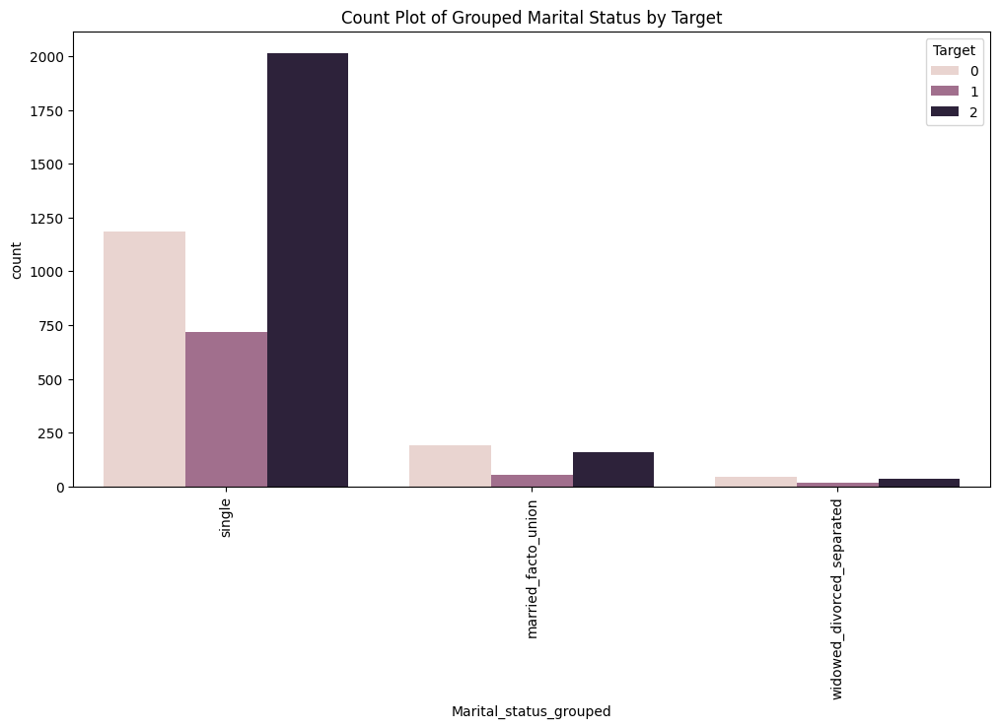

In [69]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder

# Function to group marital status categories
def group_marital_status(status):
    if status in [1]:  # Single
        return 'single'
    elif status in [2, 5]:  # Married + Facto Union
        return 'married_facto_union'
    elif status in [3, 4, 6]:  # Widower + Divorced + Legally Separated
        return 'widowed_divorced_separated'
    else:
        return 'unknown'  # In case there are unexpected values

# Applying the grouping function to the 'Marital_status' columns
data['Marital_status_grouped'] = data['Marital_status'].apply(group_marital_status)

# Visualize grouped 'Marital_status' 
plt.figure(figsize=(12, 6))
sns.countplot(x='Marital_status_grouped', hue='Target', data=data)
plt.title("Count Plot of Grouped Marital Status by Target")
plt.xticks(rotation=90)
plt.show()


# Ομαδοποίηση 'Nacionality'

Σε αυτό το βήμα, πραγματοποιούμε ομαδοποίηση των χωρών από τις οποίες προέρχονται οι φοιτητές σε ευρύτερες κατηγορίες και στη συνέχεια εφαρμόζουμε την τεχνική της one-hot κωδικοποίησης. Η ομαδοποίηση βοηθά στη μείωση του πλήθους των μοναδικών κατηγοριών που περιλαμβάνει η μεταβλητή 'Nacionality'.

Αναλυτικά βήματα:
1. **Έλεγχος μοναδικών τιμών της στήλης 'Nacionality'**: Πριν την ομαδοποίηση, ελέγχουμε ποιες εθνικότητες περιλαμβάνονται στη στήλη 'Nacionality'.
   
2. **Συνάρτηση Ομαδοποίησης Εθνικοτήτων**: Δημιουργούμε μια συνάρτηση για την ομαδοποίηση των χωρών σε:
   - `Portugal`: για την Πορτογαλία.
   - `Portuguese-speaking`: για τις πορτογαλόφωνες χώρες.
   - `Spanish-speaking`: για τις ισπανόφωνες χώρες.
   - `Other`: για τις υπόλοιπες χώρες.

3. **Εφαρμογή Ομαδοποίησης**: Δημιουργία συνάρτησης γι τη στήλη 'Nacionality' για να δημιουργήσουμε μια νέα στήλη, την 'Nacionality_grouped', που περιλαμβάνει τις ομαδοποιημένες εθνικότητες.

4. **Έλεγχος Ομαδοποίησης**: Επαληθεύουμε ότι η νέα στήλη δημιουργήθηκε σωστά και περιέχει τις αναμενόμενες ομαδοποιημένες εθνικότητες.

5. **Πλήθος Εμφανίσεων των Ομαδοποιημένων Κατηγοριών**: Τυπώνουμε το πλήθος και τη συχνότητα των κατηγοριών στη νέα στήλη για να κατανοήσουμε καλύτερα την κατανομή τους.


Unique nationalities before grouping:
[  1  62   6  41  26 103  13  25  21 101  11  22  32 100  24 109   2 108
 105  14  17]
Unique nationalities after grouping:
['Portugal' 'Other' 'Spanish-speaking' 'Portuguese-speaking']
Value counts of grouped nationalities:
Nacionality_grouped
Portugal               0.975136
Portuguese-speaking    0.016727
Other                  0.004295
Spanish-speaking       0.003843
Name: proportion, dtype: float64


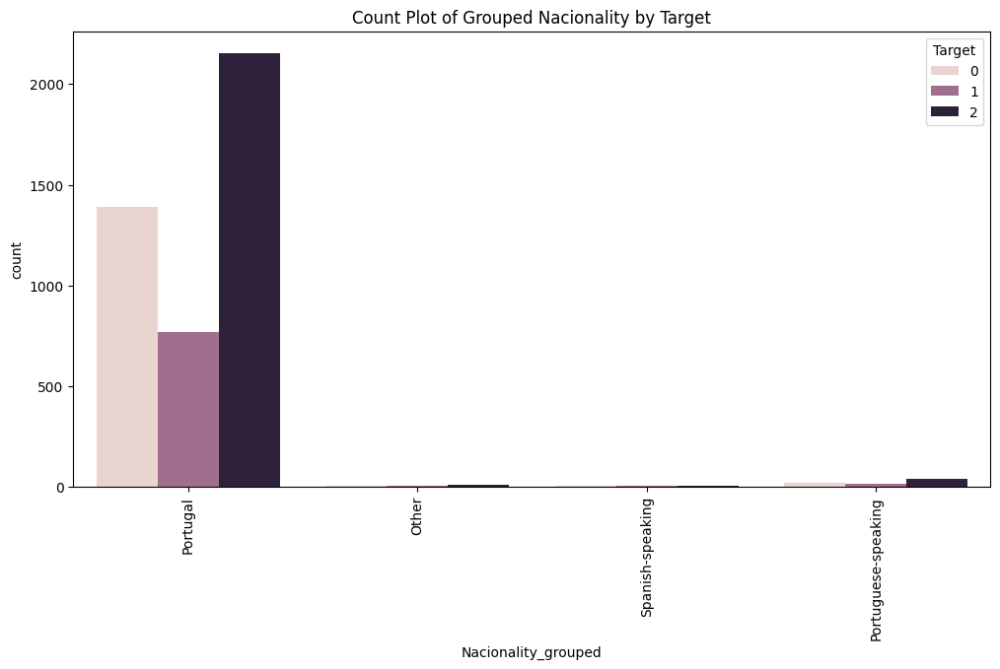

In [70]:

# Unique nationalities before grouping
print("Unique nationalities before grouping:")
print(data['Nacionality'].unique())  # Check if 'Nacionality' column exists and contains expected data

# Function to group nationalities
def group_nationality(nationality):
    if nationality == 1:  # Portugal
        return 'Portugal'
    elif nationality in [21, 22, 24, 25, 26, 41]:  # Portuguese-speaking countries
        return 'Portuguese-speaking'
    elif nationality in [6, 101, 109, 108]:  # Spanish-speaking countries
        return 'Spanish-speaking'
    else:  # All other countries
        return 'Other'

# Appling the grouping function to the 'Nacionality' column
data['Nacionality_grouped'] = data['Nacionality'].apply(group_nationality)

# Verify if 'Nacionality_grouped' is created successfully
print("Unique nationalities after grouping:")
print(data['Nacionality_grouped'].unique())


# Print the value counts of 'Nacionality_grouped' 
print("Value counts of grouped nationalities:")
print(data['Nacionality_grouped'].value_counts(normalize=True))

# Visualize grouped 'Marital_status' 
plt.figure(figsize=(12, 6))
sns.countplot(x='Nacionality_grouped', hue='Target', data=data)
plt.title("Count Plot of Grouped Nacionality by Target")
plt.xticks(rotation=90)
plt.show()


# Αφαίρεση της μεταβλητής "Nationality"

Μετά την ομαδοποίηση της μεταβλητής "Nationality", διαπιστώσαμε ότι η  πλειονότητα των φοιτητών προέρχεται από την Πορτογαλία (97.51%), καθιστώντας τη μεταβλητή "Nationality_grouped" σχεδόν ομογενή. Οι υπόλοιπες κατηγορίες έχουν τόσο μικρά ποσοστά που δεν προσφέρουν ουσιαστική πληροφορία για την πρόβλεψη της μεταβλητής στόχου. Η διατήρηση μιας μεταβλητής με τόσο ανισομερή κατανομή μπορεί να εισάγει θόρυβο στο μοντέλο, μειώνοντας την ακρίβεια των προβλέψεων.

Αποφασίζουμε να αφαιρέσουμε τη μεταβλητή "Nationality" από το σύνολο δεδομένων μας, καθώς η σχεδόν ομογενής κατανομή της δεν προσφέρει ουσιαστική πληροφορία για το μοντέλο μας και θα μπορούσε να επηρεάσει αρνητικά την απόδοσή του.


In [71]:
# Αφαίρεση της μεταβλητής "Nationality_grouped"
data = data.drop(columns=['Nacionality', 'Nacionality_grouped'])

# "Mother's_occupation" και "Father's_occupation"


In [72]:
occupation_mapping = {
    0: 'Student',
    1: 'Legislators and Senior Managers',
    2: 'Specialists and Professionals',
    3: 'Technicians and Associate Professionals',
    4: 'Administrative Staff',
    5: 'Service and Sales Workers',
    6: 'Agricultural and Fisheries Workers',
    7: 'Craft and Related Trades Workers',
    8: 'Machine Operators and Assemblers',
    9: 'Unskilled Workers',
    10: 'Armed Forces',
    90: 'Other',
    99: 'Unknown',  # Use 'Unknown' for (blank) values if they exist
    101: 'Armed Forces Officers',
    102: 'Armed Forces Sergeants',
    103: 'Other Armed Forces personnel',
    112: 'Directors of Admin and Commercial Services',
    114: 'Service Industry Managers',
    121: 'Physical Science Specialists',
    122: 'Health Professionals',
    123: 'Teachers',
    124: 'Finance and Public Relations Specialists',
    125: 'ICT Specialists',
    131: 'Science and Engineering Technicians',
    132: 'Health Technicians',
    134: 'Legal and Cultural Services Technicians',
    135: 'ICT Technicians',
    141: 'Office and Secretarial Staff',
    143: 'Data and Financial Service Operators',
    144: 'Other Admin Support Staff',
    151: 'Personal Service Workers',
    152: 'Sales Workers',
    153: 'Personal Care Workers',
    154: 'Security Services',
    161: 'Skilled Farmers',
    163: 'Subsistence Farmers and Fishermen',
    171: 'Construction Workers',
    172: 'Metal Workers',
    173: 'Precision Instrument Workers',
    174: 'Electrical and Electronics Workers',
    175: 'Craft Workers in Food, Wood, and Clothing',
    181: 'Fixed Plant Operators',
    182: 'Assembly Workers',
    183: 'Vehicle Drivers',
    191: 'Cleaning Workers',
    192: 'Unskilled Agricultural Workers',
    193: 'Unskilled Industry Workers',
    194: 'Meal Preparation Assistants',
    195: 'Street Vendors'
}

# Map occupations for mother's and father's occupation columns
data["Mother's_occupation_mapped"] = data["Mother's_occupation"].map(occupation_mapping)
data["Father's_occupation_mapped"] = data["Father's_occupation"].map(occupation_mapping)

# Fill any missing values after mapping with 'Unknown'
data["Mother's_occupation_mapped"] = data["Mother's_occupation_mapped"].fillna('Unknown')
data["Father's_occupation_mapped"] = data["Father's_occupation_mapped"].fillna('Unknown')

# Display sample mapping results
print("Sample of mapped occupations for mother's and father's occupations:")
print(data[["Mother's_occupation_mapped", "Father's_occupation_mapped"]].head())

# Define broader occupation groupings
def group_occupation(mapped_occupation):
    if mapped_occupation in [
        'Legislators and Senior Managers', 'Directors of Admin and Commercial Services', 
        'Service Industry Managers'
    ]:
        return 'Legislators and Senior Managers'
    elif mapped_occupation in [
        'Specialists and Professionals', 'Physical Science Specialists', 'Health Professionals',
        'Teachers', 'Finance and Public Relations Specialists', 'ICT Specialists'
    ]:
        return 'Specialists and Professionals'
    elif mapped_occupation in [
        'Technicians and Associate Professionals', 'Science and Engineering Technicians', 
        'Health Technicians', 'Legal and Cultural Services Technicians', 'ICT Technicians'
    ]:
        return 'Technicians and Associate Professionals'
    elif mapped_occupation in [
        'Administrative Staff', 'Office and Secretarial Staff', 'Data and Financial Service Operators',
        'Other Admin Support Staff'
    ]:
        return 'Administrative Staff'
    elif mapped_occupation in [
        'Service and Sales Workers', 'Personal Service Workers', 'Sales Workers', 'Personal Care Workers'
    ]:
        return 'Service and Sales Workers'
    elif mapped_occupation in [
        'Agricultural and Fisheries Workers', 'Skilled Farmers', 'Subsistence Farmers and Fishermen'
    ]:
        return 'Agricultural and Fisheries Workers'
    elif mapped_occupation in [
        'Craft and Related Trades Workers', 'Construction Workers', 'Metal Workers',
        'Precision Instrument Workers', 'Electrical and Electronics Workers', 'Craft Workers in Food, Wood, and Clothing'
    ]:
        return 'Craft and Related Trades Workers'
    elif mapped_occupation in [
        'Machine Operators and Assemblers', 'Fixed Plant Operators', 'Assembly Workers'
    ]:
        return 'Machine Operators and Assemblers'
    elif mapped_occupation in [
        'Unskilled Workers', 'Cleaning Workers', 'Unskilled Agricultural Workers', 
        'Unskilled Industry Workers', 'Meal Preparation Assistants', 'Street Vendors'
    ]:
        return 'Unskilled Workers'
    elif mapped_occupation == 'Armed Forces' or mapped_occupation in [
        'Armed Forces Officers', 'Armed Forces Sergeants', 'Other Armed Forces personnel'
    ]:
        return 'Armed Forces'
    elif mapped_occupation == 'Student':
        return 'Student'
    else:
        return 'Other'

# Apply grouping to the mapped columns
data['Mother_Occupation_Grouped'] = data["Mother's_occupation_mapped"].apply(group_occupation)
data['Father_Occupation_Grouped'] = data["Father's_occupation_mapped"].apply(group_occupation)

# Display grouped occupation categories
print("Sample of grouped occupations for mother's and father's occupations:")
print(data[["Mother_Occupation_Grouped", "Father_Occupation_Grouped"]].head())

# Check the distribution of grouped categories to verify
print("Distribution of Mother's grouped occupations:")
print(data['Mother_Occupation_Grouped'].value_counts(normalize=True))
print("\nDistribution of Father's grouped occupations:")
print(data['Father_Occupation_Grouped'].value_counts(normalize=True))

Sample of mapped occupations for mother's and father's occupations:
                Mother's_occupation_mapped  \
0                Service and Sales Workers   
1  Technicians and Associate Professionals   
2                        Unskilled Workers   
3                Service and Sales Workers   
4                        Unskilled Workers   

                Father's_occupation_mapped  
0                        Unskilled Workers  
1  Technicians and Associate Professionals  
2                        Unskilled Workers  
3  Technicians and Associate Professionals  
4                        Unskilled Workers  
Sample of grouped occupations for mother's and father's occupations:
                 Mother_Occupation_Grouped  \
0                Service and Sales Workers   
1  Technicians and Associate Professionals   
2                        Unskilled Workers   
3                Service and Sales Workers   
4                        Unskilled Workers   

                 Father_Occupation_Grou

# Ομαδοποίηση Επαγγελμάτων σε Ευρύτερες Κατηγορίες

Η συνάρτηση `group_occupation` δημιουργεί ευρύτερες κατηγορίες επαγγελμάτων βασισμένες σε συγκεκριμένους κωδικούς επαγγελμάτων. 
Αυτές οι κατηγορίες βοηθούν στη μείωση της πολυπλοκότητας των δεδομένων και στην καλύτερη ανάλυσή τους. Οι κατηγορίες περιλαμβάνουν:
- Νομοθέτες και Ανώτατα Στελέχη
- Ειδικοί και Επαγγελματίες
- Τεχνικοί και Βοηθοί Επαγγελματίες
- Διοικητικοί Υπάλληλοι
- Εργαζόμενοι στις Υπηρεσίες και τις Πωλήσεις
- Αγρότες και Εργαζόμενοι στην Αλιεία
- Τεχνίτες και Συναφή Επαγγέλματα
- Χειριστές Μηχανών και Εργάτες
- Ανειδίκευτοι Εργάτες
- Ένοπλες Δυνάμεις
- Άλλες Κατηγορίες
  
Εφαρμόζουμε τη συνάρτηση `group_occupation` στις στήλες που περιέχουν τα επαγγέλματα της μητέρας και του πατέρα για να δημιουργήσουμε 
νέες στήλες με τις ευρύτερες κατηγορίες επαγγελμάτων. Στη συνέχεια, εμφανίζουμε την κατανομή των κατηγοριών για να δούμε πώς διανέμονται 
τα επαγγέλματα στο σύνολο δεδομένων.


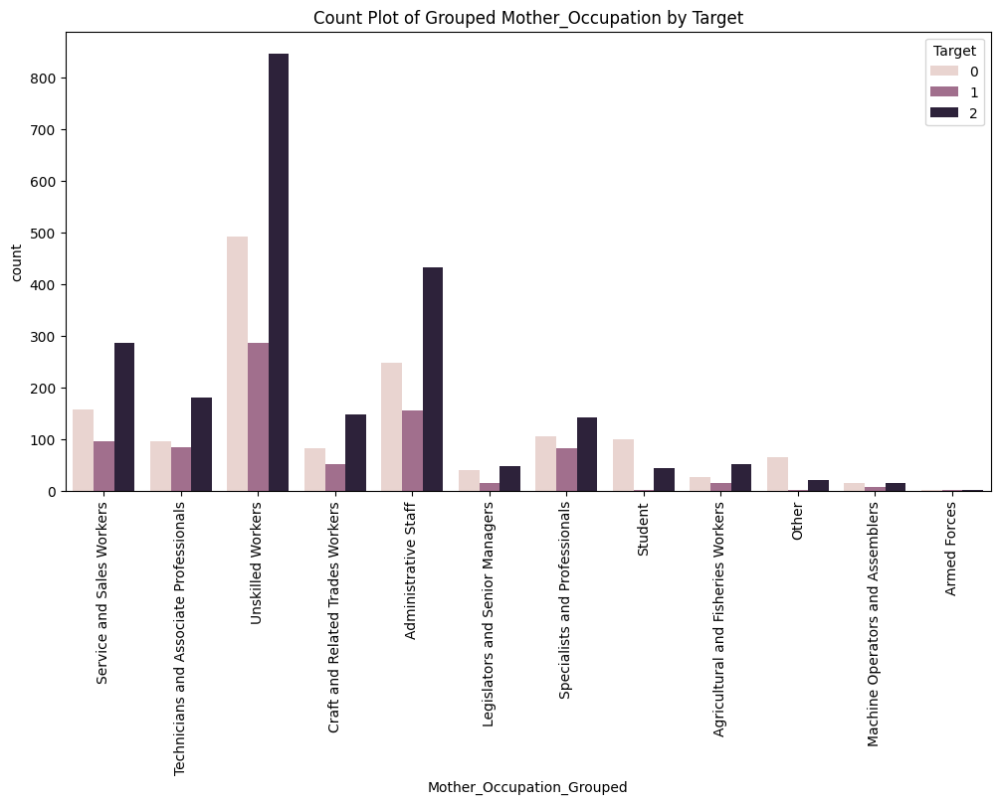

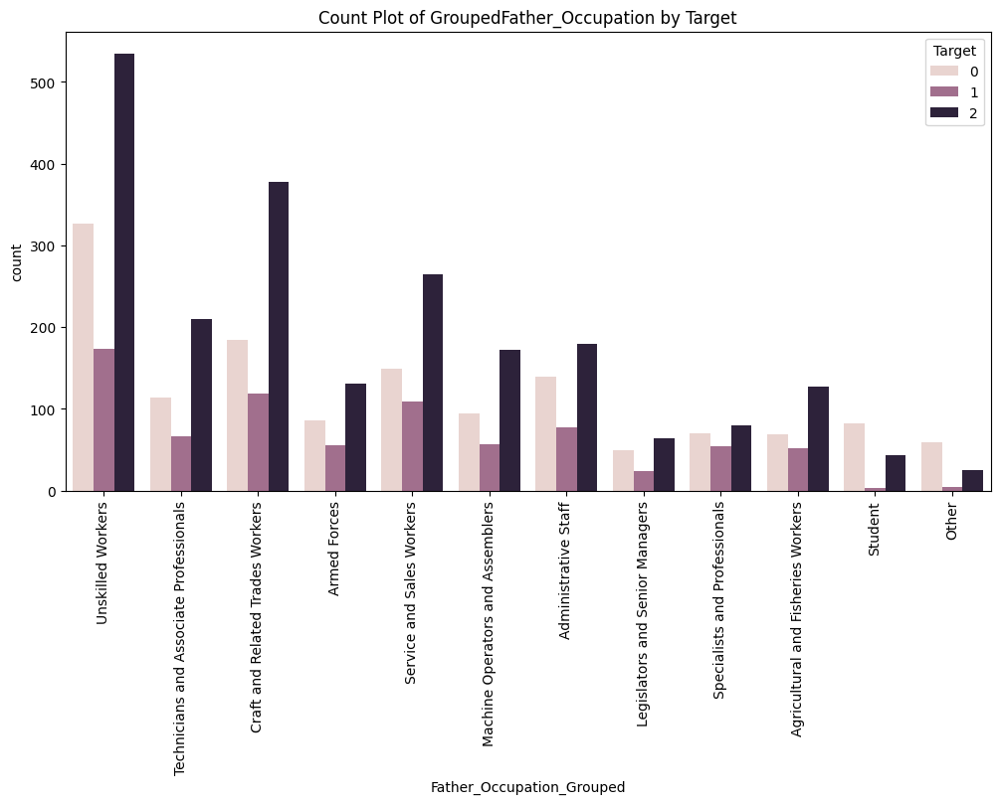

In [73]:


# Visualize grouped Mother_Occupation_Grouped 
plt.figure(figsize=(12, 6))
sns.countplot(x='Mother_Occupation_Grouped', hue='Target', data=data)
plt.title("Count Plot of Grouped Mother_Occupation by Target")
plt.xticks(rotation=90)
plt.show()

# Visualize grouped 'Father_Occupation_Grouped' 
plt.figure(figsize=(12, 6))
sns.countplot(x='Father_Occupation_Grouped', hue='Target', data=data)
plt.title("Count Plot of GroupedFather_Occupation by Target")
plt.xticks(rotation=90)
plt.show()


### <span style="color:gray;"><em>Συμπέρασμα κατανομής επαγγελμάτων:</em></span>

Η κατανομή των επαγγελματικών ομάδων και για τους δύο γονείς δείχνει ότι το μεγαλύτερο ποσοστό ανήκει σε Unskilled Workers , κάτι που μπορεί να είναι ενδεικτικό της κοινωνικοοικονομικής κατάστασης του πληθυσμού των φοιτητών. Οι φοιτητές με γόνεις που έργάζονται ως ανειδίκευτοι εργάτες, ιδιαίτερα των μητέρων, φαίνεται να συνδέεται περισσότερο με επιτυχία (Graduation) παρά με dropout. Οπως και τα επαγγέλματα που σχετίζονται με  διοικητικούς υπαλλήλους παρουσιάζουν υψηλότερο ποσοστό επιτυχίας.

# Χ² Test - Ανάλυση Κατηγοριών Κατά Επάγγελμα
Χρησιμοποιούμε το Χ² test για να ελέγξουμε αν υπάρχει στατιστικά σημαντική συσχέτιση μεταξύ των κατηγοριών επαγγέλματος της μητέρας και του πατέρα με τη μεταβλητή στόχου. Το Χ² test μας δίνει ένα στατιστικό μέτρο και μια p-τιμή, με την p-τιμή να δείχνει αν η συσχέτιση είναι στατιστικά σημαντική.

In [74]:
import scipy.stats as stats

# Perform chi-square test for Mother's occupation group and the target variable
contingency_table_mother = pd.crosstab(data['Mother_Occupation_Grouped'], data['Target'])
chi2_mother, p_mother, dof_mother, expected_mother = stats.chi2_contingency(contingency_table_mother)

print(f"Chi-square statistic for Mother's occupation: {chi2_mother}")
print(f"P-value for Mother's occupation: {p_mother}")

# Perform chi-square test for Father's occupation group and the target variable
contingency_table_father = pd.crosstab(data['Father_Occupation_Grouped'], data['Target'])
chi2_father, p_father, dof_father, expected_father = stats.chi2_contingency(contingency_table_father)

print(f"Chi-square statistic for Father's occupation: {chi2_father}")
print(f"P-value for Father's occupation: {p_father}")

Chi-square statistic for Mother's occupation: 203.5769284373107
P-value for Mother's occupation: 2.267052232813727e-31
Chi-square statistic for Father's occupation: 156.75434667830618
P-value for Father's occupation: 2.521965287426892e-22


### <span style="color:gray;"><em>Αποτελέσματα του Ελέγχου Χ^2 & P:</em></span>

Γενικά:
Το στατιστικό Χ^2 είναι ένα μέτρο που δείχνει πόσο αποκλίνουν οι παρατηρούμενες τιμές από τις αναμενόμενες τιμές. Όσο μεγαλύτερο είναι αυτό το στατιστικό, τόσο μεγαλύτερη είναι η διαφορά μεταξύ των παρατηρούμενων και αναμενόμενων τιμών, γεγονός που υποδηλώνει ότι η σχέση μεταξύ των δύο μεταβλητών είναι ισχυρότερη.

Η τιμή P μας βοηθά να καθορίσουμε αν το παρατηρούμενο στατιστικό Χ^2 είναι σημαντικό. Μας λέει την πιθανότητα να παρατηρήσουμε ένα στατιστικό Χ^2 τόσο ακραίο όσο αυτό που υπολογίστηκε, εάν η μηδενική υπόθεση ήταν αληθής (δηλαδή, ότι δεν υπάρχει σχέση μεταξύ των μεταβλητών).

- **Εάν η τιμή P είναι μικρότερη από 0.05**, απορρίπτουμε τη μηδενική υπόθεση, δηλαδή πιστεύουμε ότι υπάρχει σημαντική σχέση μεταξύ των μεταβλητών.
- **Εάν η τιμή P είναι μεγαλύτερη από 0.05**, δεν απορρίπτουμε τη μηδενική υπόθεση, δηλαδή πιστεύουμε ότι δεν υπάρχει σημαντική σχέση μεταξύ των μεταβλητών.

Ο αριθμός των βαθμών ελευθερίας μπορεί να υπολογιστεί με τον εξής τύπο:

**dof=(αριθμός κατηγοριών επαγγελμάτων−1)×(αριθμός κατηγοριών αποτελεσμάτων−1)=(12−1)×(3−1)=11×2=22**

Οι υψηλές τιμές του στατιστικού x^2 (203.57 και 164.38) σημαίνουν ότι τα παρατηρούμενα δεδομένα αποκλίνουν σημαντικά από τα αναμενόμενα, υπό την μηδενική υπόθεση (δηλαδή την υπόθεση ότι δεν υπάρχει σχέση). Αυτές οι τιμές είναι πολύ πάνω από την κρίσιμη τιμή (33.92 για 22 βαθμούς ελευθερίας στο επίπεδο σημαντικότητας 0.05), καθιστώντας τη σχέση στατιστικά σημαντική.

Οι εξαιρετικά χαμηλές τιμές p (2.2670e-31 και 8.9161e-24) υποδηλώνουν ότι η πιθανότητα οι αποκλίσεις αυτές να οφείλονται στην τύχη είναι σχεδόν μηδενική, πράγμα που σημαίνει ότι υπάρχει μια ισχυρή σχέση μεταξύ του επαγγέλματος των γονέων και της έκβασης των σπουδών των μαθητών.

- **Στατιστική Σημαντικότητα**: Δεδομένου ότι και οι δύο τιμές Χ^2 δείχνουν πολύ χαμηλές τιμές P, συμπεραίνουμε ότι και το επάγγελμα της μητέρας και του πατέρα είναι στατιστικά σημαντικοί παράγοντες για την επιτυχία του φοιτητή (αν εγκατέλειψε, παραμένει εγγεγραμμένος ή αποφοίτησε).
- **Σημαντικότητα Σχέσης**: Η μεγαλύτερη τιμή Χ^2 για το επάγγελμα της μητέρας συγκριτικά με το επάγγελμα του πατέρα υποδηλώνει ότι το επάγγελμα της μητέρας μπορεί να έχει ελαφρώς ισχυρότερη σχέση με τα αποτελέσματα των φοιτητών, αν και και τα δύο είναι σημαντικά.
- **Συμπέρασμα**: Ο έλεγχος Χ^2 μας λέει ότι υπάρχει μια σχέση, αλλά δεν μας δείχνει πόσο ισχυρή είναι η σχέση ή ποιες επαγγελματικές ομάδες οδηγούν σε καλύτερα ή χειρότερα αποτελέσματα. Ωστόσο, υπολογίσαμε τη μέση τιμή στόχου ανά επαγγελματική ομάδα, η οποία βοηθά στην ερμηνεία της κατεύθυνσης αυτής της σχέσης. Για παράδειγμα, τα παιδιά γονέων σε επαγγέλματα υψηλής ειδίκευσης ή επαγγελματικά φαίνεται να έχουν μεγαλύτερες πιθανότητες να παραμείνουν εγγεγραμμένοι ή να αποφοιτήσουν.


# Μέσος Όρος Τιμών Στόχου Ανά Κατηγορία Επαγγέλματος
Υπολογίζουμε τον μέσο όρο της μεταβλητής στόχου για κάθε κατηγορία επαγγέλματος της μητέρας και του πατέρα, ώστε να δούμε ποιες κατηγορίες συνδέονται περισσότερο με κάθε κατηγορία στόχου (π.χ. dropout ή gaduate).

In [75]:
# Calculate the mean of the target variable for each occupation group
mother_occ_target_corr = data.groupby('Mother_Occupation_Grouped')['Target'].mean()
father_occ_target_corr = data.groupby('Father_Occupation_Grouped')['Target'].mean()


print("Mean target value by Mother's occupation group:")
print(mother_occ_target_corr)
print("\nMean target value by Father's occupation group:")
print(father_occ_target_corr)

Mean target value by Mother's occupation group:
Mother_Occupation_Grouped
Administrative Staff                       1.219424
Agricultural and Fisheries Workers         1.274725
Armed Forces                               1.000000
Craft and Related Trades Workers           1.236559
Legislators and Senior Managers            1.088235
Machine Operators and Assemblers           0.972222
Other                                      0.505747
Service and Sales Workers                  1.240223
Specialists and Professionals              1.115854
Student                                    0.618056
Technicians and Associate Professionals    1.231198
Unskilled Workers                          1.218115
Name: Target, dtype: float64

Mean target value by Father's occupation group:
Father_Occupation_Grouped
Administrative Staff                       1.103535
Agricultural and Fisheries Workers         1.233871
Armed Forces                               1.164835
Craft and Related Trades Workers          

### <span style="color:gray;"><em>Μέσες Τιμές Στόχου ανά Επαγγελματική Κατηγορία:</em></span>

0 = Dropout   1 = Enrolled    2 = Graduate

#### Επάγγελμα Μητέρας:
Οι ομάδες με τις υψηλότερες μέσες τιμές στόχου, που υποδεικνύουν περισσότερους μαθητές που συνεχίζουν να φοιτούν ή αποφοιτούν, περιλαμβάνουν τους "Εργάτες Γεωργίας και Αλιείας" (1.27) και τους "Εργαζόμενους Υπηρεσιών και Πωλήσεων" (1.24). 
Αντίθετα, οι χαμηλότερες τιμές στόχου παρατηρούνται στις κατηγορίες όπως "Άλλοι" (0.50) και "Φοιτητής" (0.61), που πιθανόν συνδέονται με υψηλότερα ποσοστά εγκατάλειψης.

#### Επάγγελμα Πατέρα:
Υψηλότερες τιμές παρατηρούνται στους "Τεχνίτες και Σχετιζόμενους με Επαγγέλματα Κατασκευών" (1.28) και τους "Τεχνικούς και Επαγγελματίες Συνεργατών" (1.24). 
Αντίθετα, χαμηλότερες τιμές εντοπίζονται στις κατηγορίες "Άλλοι" (0.57) και "Φοιτητής" (0.69), κάτι που υποδηλώνει ότι αυτές οι ομάδες αντιμετωπίζουν περισσότερες προκλήσεις στην ολοκλήρωση των σπουδών τους.


In [76]:
#  Target category percentages by occupation
# This gives the percentage breakdown of the target variable for each occupation group.
mother_occ_target_percentage = data.groupby('Mother_Occupation_Grouped')['Target'].value_counts(normalize=True).unstack()
father_occ_target_percentage = data.groupby('Father_Occupation_Grouped')['Target'].value_counts(normalize=True).unstack()

# Calculate the proportion of each occupation group for mother and father
mother_occ_proportion = data['Mother_Occupation_Grouped'].value_counts(normalize=True)
father_occ_proportion = data['Father_Occupation_Grouped'].value_counts(normalize=True)

# Combine occupation proportions and target percentages
mother_combined = pd.concat([mother_occ_proportion, mother_occ_target_percentage], axis=1)
father_combined = pd.concat([father_occ_proportion, father_occ_target_percentage], axis=1)

# Rename the columns for clarity
mother_combined.columns = ['Proportion', 'Dropout', 'Enrolled', 'Graduate']
father_combined.columns = ['Proportion', 'Dropout', 'Enrolled', 'Graduate']


# Adjusting the display settings to make the DataFrame wider and more readable
pd.set_option('display.width', 120)
pd.set_option('display.max_columns', None)


print("\nMother's occupation group combined proportions and target percentages:")
print(mother_combined)

print("\nFather's occupation group combined proportions and target percentages:")
print(father_combined)



Mother's occupation group combined proportions and target percentages:
                                         Proportion   Dropout  Enrolled  Graduate
Mother_Occupation_Grouped                                                        
Unskilled Workers                          0.366863  0.303142  0.175601  0.521257
Administrative Staff                       0.188517  0.297362  0.185851  0.516787
Service and Sales Workers                  0.121383  0.290503  0.178771  0.530726
Technicians and Associate Professionals    0.081148  0.267409  0.233983  0.498607
Specialists and Professionals              0.074141  0.317073  0.250000  0.432927
Craft and Related Trades Workers           0.063065  0.290323  0.182796  0.526882
Student                                    0.032550  0.687500  0.006944  0.305556
Legislators and Senior Managers            0.023056  0.382353  0.147059  0.470588
Agricultural and Fisheries Workers         0.020570  0.285714  0.153846  0.560440
Other                     

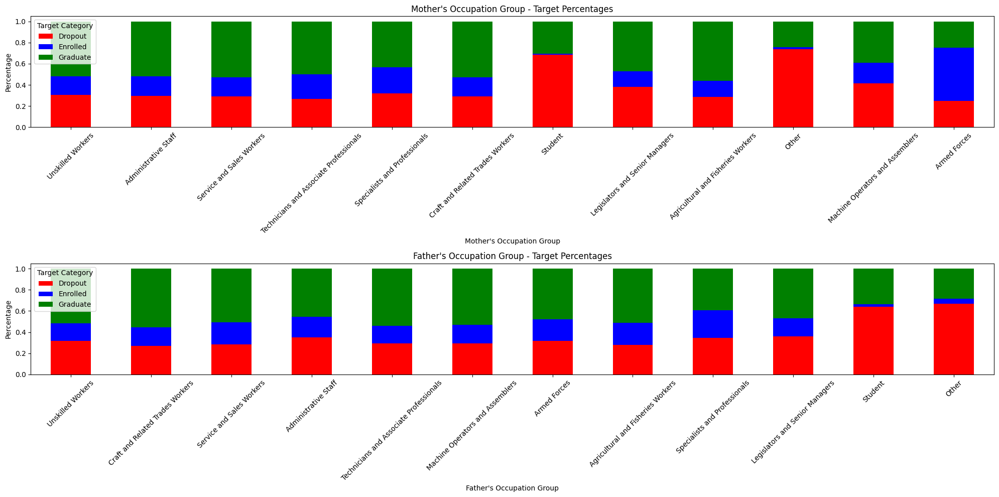

In [77]:
import matplotlib.pyplot as plt


fig, axes = plt.subplots(2, 1, figsize=(20, 10))

# Bar plot for mother's occupation group
mother_combined[['Dropout', 'Enrolled', 'Graduate']].plot(kind='bar', stacked=True, ax=axes[0], color=['red', 'blue', 'green'])
axes[0].set_title("Mother's Occupation Group - Target Percentages")
axes[0].set_xlabel("Mother's Occupation Group")
axes[0].set_ylabel("Percentage")
axes[0].legend(title='Target Category')
axes[0].set_xticklabels(mother_combined.index, rotation=45)

# Bar plot for father's occupation group
father_combined[['Dropout', 'Enrolled', 'Graduate']].plot(kind='bar', stacked=True, ax=axes[1], color=['red', 'blue', 'green'])
axes[1].set_title("Father's Occupation Group - Target Percentages")
axes[1].set_xlabel("Father's Occupation Group")
axes[1].set_ylabel("Percentage")
axes[1].legend(title='Target Category')
axes[1].set_xticklabels(father_combined.index, rotation=45)

plt.tight_layout()
plt.show()


# Create Mappings for Application Mode and Course

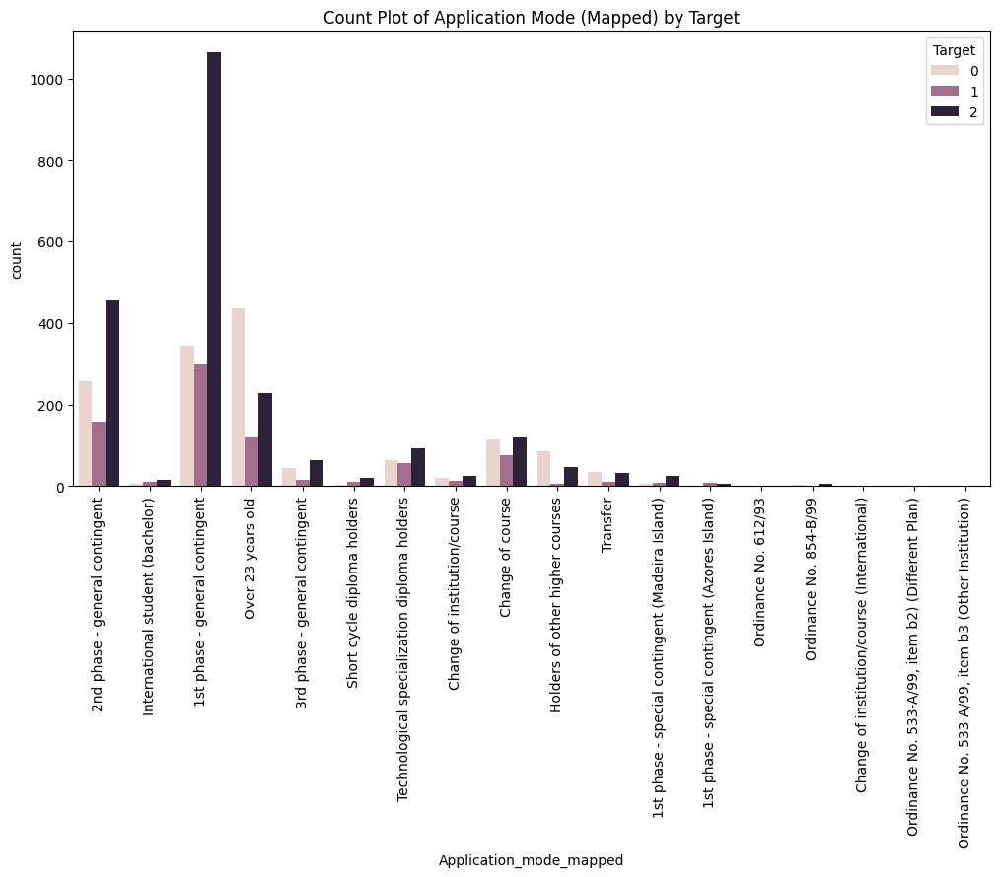

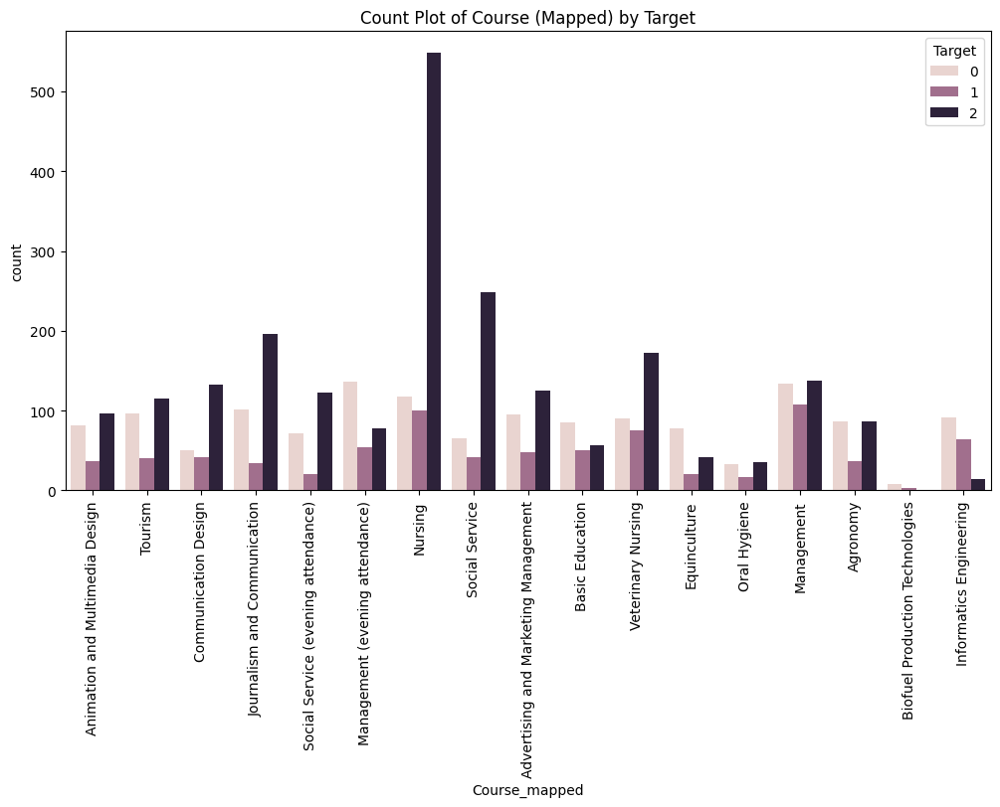

In [78]:
# Mapping for 'Application_mode'
application_mode_mapping = {
    1: '1st phase - general contingent',
    2: 'Ordinance No. 612/93',
    5: '1st phase - special contingent (Azores Island)',
    7: 'Holders of other higher courses',
    10: 'Ordinance No. 854-B/99',
    15: 'International student (bachelor)',
    16: '1st phase - special contingent (Madeira Island)',
    17: '2nd phase - general contingent',
    18: '3rd phase - general contingent',
    26: 'Ordinance No. 533-A/99, item b2) (Different Plan)',
    27: 'Ordinance No. 533-A/99, item b3 (Other Institution)',
    39: 'Over 23 years old',
    42: 'Transfer',
    43: 'Change of course',
    44: 'Technological specialization diploma holders',
    51: 'Change of institution/course',
    53: 'Short cycle diploma holders',
    57: 'Change of institution/course (International)'
}

# Mapping for 'Course'
course_mapping = {
    33: 'Biofuel Production Technologies',
    171: 'Animation and Multimedia Design',
    8014: 'Social Service (evening attendance)',
    9003: 'Agronomy',
    9070: 'Communication Design',
    9085: 'Veterinary Nursing',
    9119: 'Informatics Engineering',
    9130: 'Equinculture',
    9147: 'Management',
    9238: 'Social Service',
    9254: 'Tourism',
    9500: 'Nursing',
    9556: 'Oral Hygiene',
    9670: 'Advertising and Marketing Management',
    9773: 'Journalism and Communication',
    9853: 'Basic Education',
    9991: 'Management (evening attendance)'
}

# Apply the mappings
data['Application_mode_mapped'] = data['Application_mode'].replace(application_mode_mapping)
data['Course_mapped'] = data['Course'].replace(course_mapping)

# Visualize mapped 'Application_mode' before encoding
plt.figure(figsize=(12, 6))
sns.countplot(x='Application_mode_mapped', hue='Target', data=data)
plt.title("Count Plot of Application Mode (Mapped) by Target")
plt.xticks(rotation=90)
plt.show()

# Visualize mapped 'Course' before encoding
plt.figure(figsize=(12, 6))
sns.countplot(x='Course_mapped', hue='Target', data=data)
plt.title("Count Plot of Course (Mapped) by Target")
plt.xticks(rotation=90)
plt.show()

In [79]:
print(data.columns.tolist())

['Marital_status', 'Application_mode', 'Application_order', 'Course', 'Daytime/evening_attendance', 'Previous_qualification', 'Previous_qualification_(grade)', "Mother's_qualification", "Father's_qualification", "Mother's_occupation", "Father's_occupation", 'Admission_grade', 'Displaced', 'Educational_special_needs', 'Debtor', 'Tuition_fees_up_to_date', 'Gender', 'Scholarship_holder', 'Age_at_enrollment', 'International', 'Curricular_units_1st_sem_(credited)', 'Curricular_units_1st_sem_(enrolled)', 'Curricular_units_1st_sem_(evaluations)', 'Curricular_units_1st_sem_(approved)', 'Curricular_units_1st_sem_(grade)', 'Curricular_units_1st_sem_(without_evaluations)', 'Curricular_units_2nd_sem_(credited)', 'Curricular_units_2nd_sem_(enrolled)', 'Curricular_units_2nd_sem_(evaluations)', 'Curricular_units_2nd_sem_(approved)', 'Curricular_units_2nd_sem_(grade)', 'Curricular_units_2nd_sem_(without_evaluations)', 'Unemployment_rate', 'Inflation_rate', 'GDP', 'Target', "Mother's_qualification_mapp

## Ανάλυση Συσχέτισης των Χαρακτηριστικών με τη Μεταβλητή Στόχο

### Σύνοψη Αποτελεσμάτων Συσχέτισης

Η ανάλυση συσχέτισης πραγματοποιήθηκε για να ελεγχθεί η ισχύς και η κατεύθυνση της συσχέτισης μεταξύ των χαρακτηριστικών και της μεταβλητής στόχου (Target). Ακολουθούν τα βασικά συμπεράσματα για τα χαρακτηριστικά πριν και μετά την ομαδοποίηση:

### Πριν την Ομαδοποίηση και Χαρτογράφηση

Παρατηρείται ότι το `Application_mode` έχει τη μεγαλύτερη (αρνητική) συσχέτιση με τη μεταβλητή στόχο (Target), με συντελεστή -0.2217. Αυτό δείχνει ότι το συγκεκριμένο χαρακτηριστικό ενδέχεται να έχει κάποιου είδους σχέση με την έκβαση των φοιτητών (π.χ., το αν αποφοίτησαν, παραμένουν εγγεγραμμένοι ή διέκοψαν τις σπουδές τους). Οι υπόλοιπες συσχετίσεις είναι πολύ μικρές, υποδεικνύοντας αδύναμες σχέσεις με τη μεταβλητή στόχο.

### Μετά την Ομαδοποίηση και Χαρτογράφηση

Μετά την ομαδοποίηση και χαρτογράφηση, τα αποτελέσματα δείχνουν και πάλι μικρές συσχετίσεις με τη μεταβλητή στόχο. Ωστόσο, υπάρχει μία ελαφρώς μεγαλύτερη αρνητική συσχέτιση για το `Mother_Occupation_Grouped` (-0.1000) και το `Previous_qualification_grouped` (-0.0995), ενώ το `Application_mode_mapped` συνεχίζει να έχει κάποια αρνητική συσχέτιση.

### Συμπεράσματα

- **Ασθενείς Συσχετίσεις**: Γενικά, οι συσχετίσεις μεταξύ των χαρακτηριστικών και της μεταβλητής στόχου είναι ασθενείς. Κανένα χαρακτηριστικό δεν παρουσιάζει ισχυρή συσχέτιση με την έκβαση των φοιτητών, κάτι που δείχνει ότι δεν υπάρχει κάποια χαρακτηριστική τιμή ή ομάδα χαρακτηριστικών που να συνδέεται άμεσα με τη μεταβλητή στόχο.
- **Χρήση Tree-Based Αλγορίθμων**: Δεδομένων των μικρών συσχετίσεων, οι αλγόριθμοι tree-based (όπως Random Forest και XGBoost) πιθανώς να μπορέσουν να εντοπίσουν πιο πολύπλοκα, μη γραμμικά μοτίβα στα δεδομένα.
- **Περιορισμένη Σημασία των Μεμονωμένων Χαρακτηριστικών**: Η ανάλυση δείχνει ότι δεν υπάρχει κάποιο χαρακτηριστικό με σημαντική επίδραση στη μεταβλητή στόχο. Ως εκ τούτου, θα χρειαστεί να εξεταστεί η απόδοση του μοντέλου με συνδυασμό όλων των χαρακτηριστικών, αντί για χρήση συγκεκριμένων μόνο μεταβλητών.



In [80]:
correlation = data[['Marital_status',
    "Mother's_occupation",
    "Father's_occupation",
    'Application_mode',
    'Course',
    "Mother's_qualification",
    "Father's_qualification",
    'Previous_qualification'
                    ,'Target']].corr()

print(correlation['Target'].sort_values(ascending=False))

Target                    1.000000
Course                    0.034219
Father's_qualification   -0.001393
Father's_occupation      -0.001899
Mother's_occupation      -0.005629
Mother's_qualification   -0.043178
Previous_qualification   -0.056039
Marital_status           -0.089804
Application_mode         -0.221747
Name: Target, dtype: float64


In [81]:
correlation = data[['Marital_status_grouped', 
                    'Mother_Occupation_Grouped', 
                    'Father_Occupation_Grouped', 
                    'Application_mode_mapped', 
                    'Course_mapped', 
                    "Mother's_qualification_grouped", 
                    "Father's_qualification_grouped", 
                    'Previous_qualification_grouped', 
                    'Target']].apply(lambda x: pd.factorize(x)[0]).corr()

print(correlation['Target'].sort_values(ascending=False))

Target                            1.000000
Course_mapped                     0.008840
Mother's_qualification_grouped   -0.057223
Application_mode_mapped          -0.062068
Father_Occupation_Grouped        -0.063072
Father's_qualification_grouped   -0.076501
Marital_status_grouped           -0.084664
Previous_qualification_grouped   -0.099513
Mother_Occupation_Grouped        -0.100020
Name: Target, dtype: float64


# ----------Επεξεργασία Αριθμητικών Χαρακτηριστικών--------



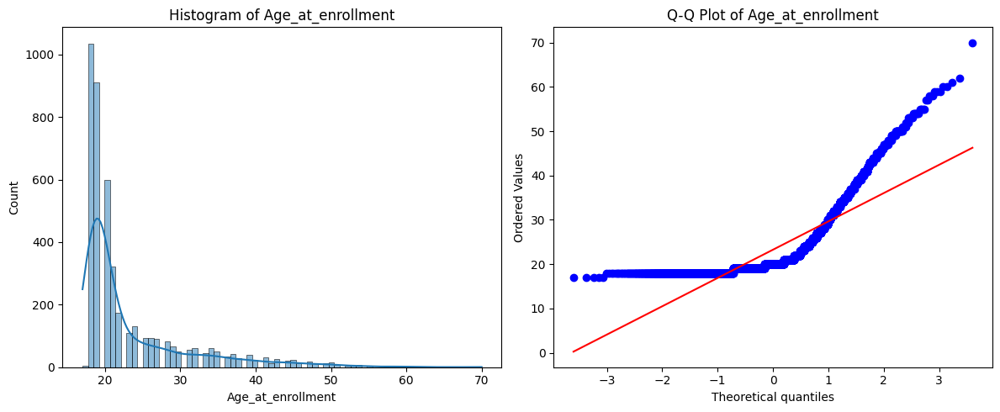

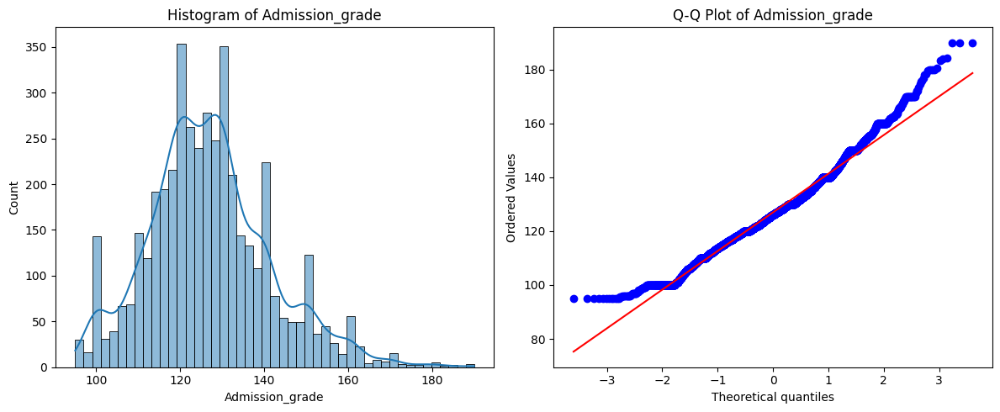

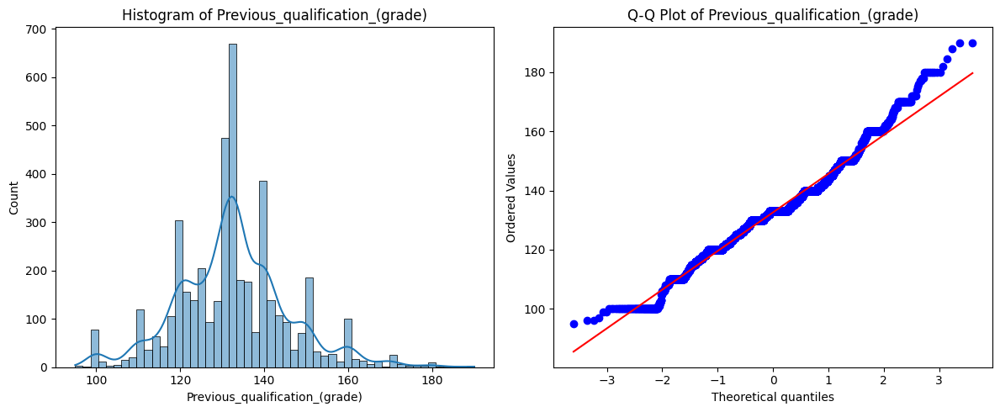

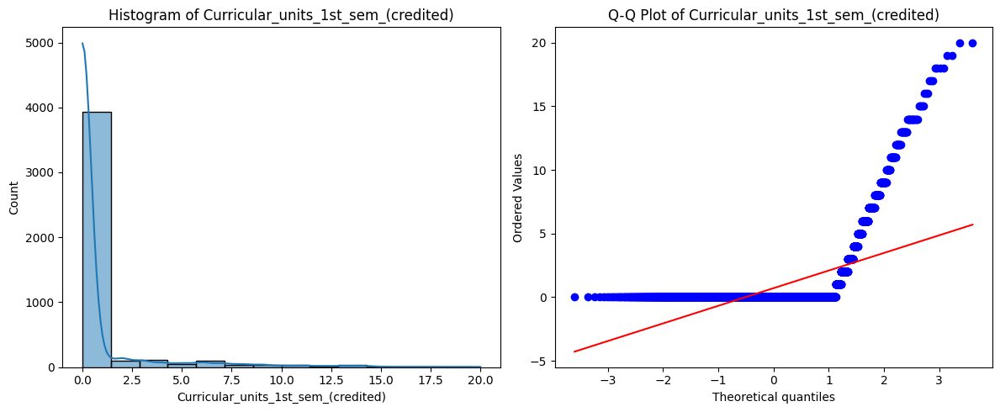

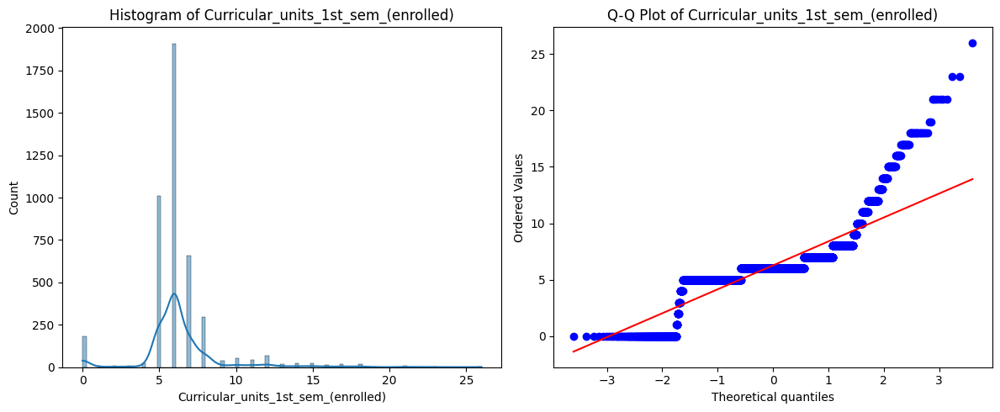

...

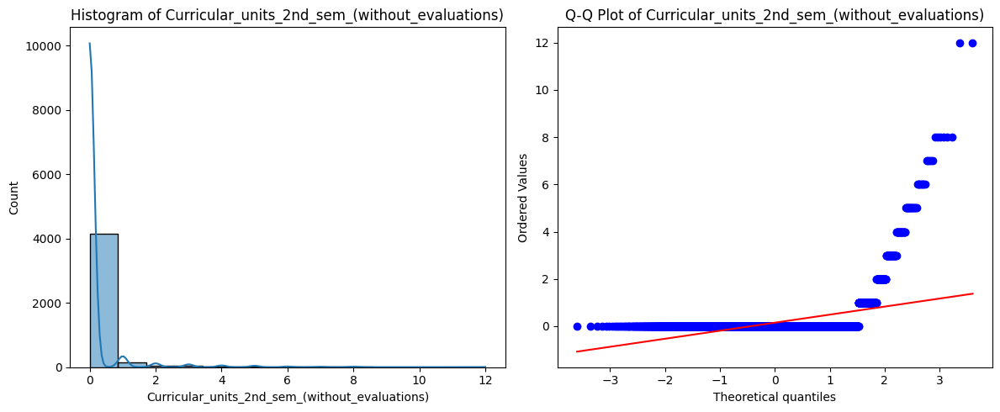

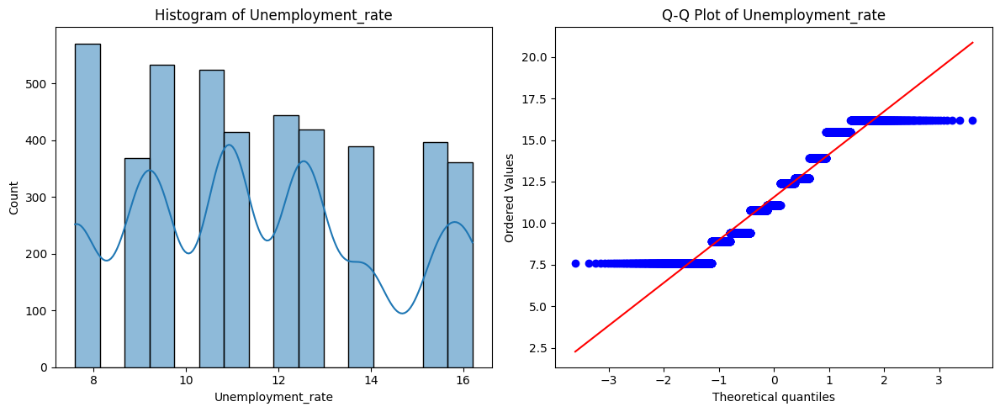

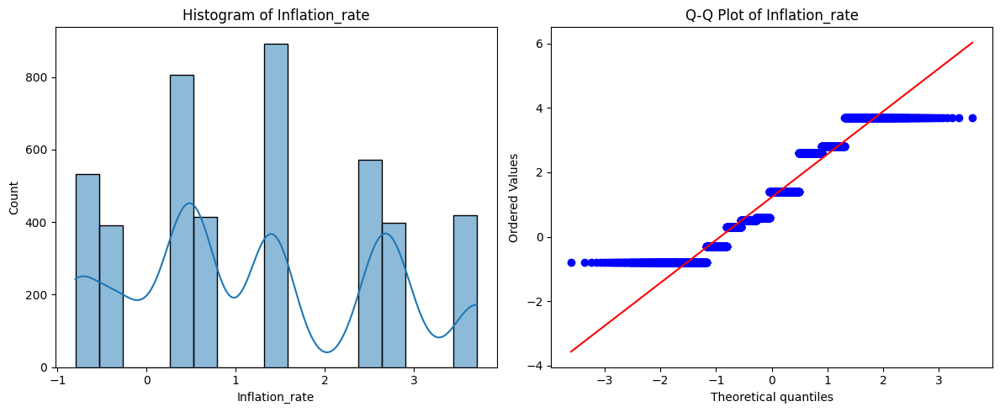

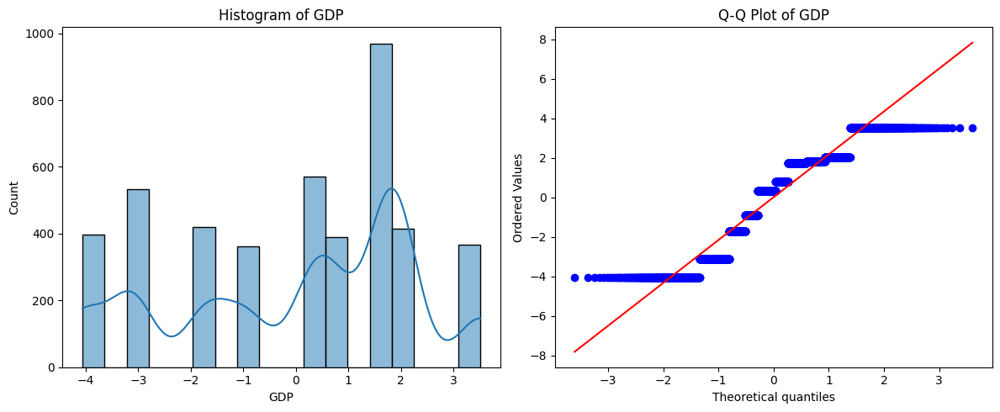

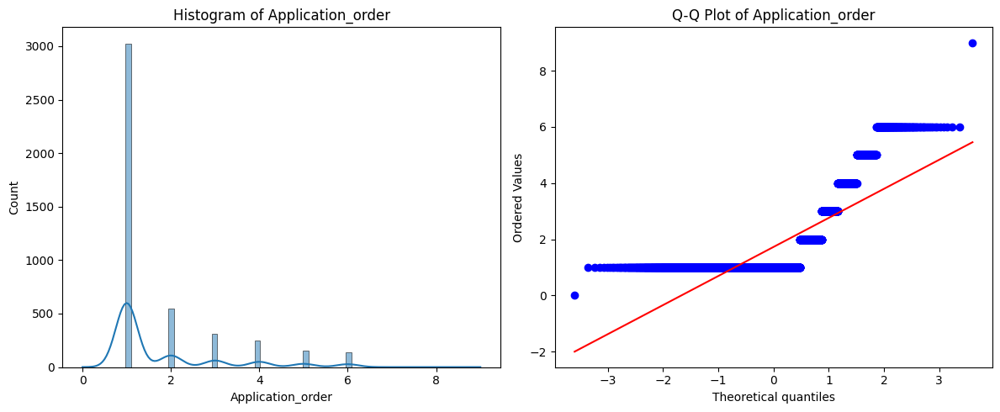

In [82]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import shapiro, probplot

numerical_features = [
    'Age_at_enrollment',
    'Admission_grade',
    'Previous_qualification_(grade)',
    'Curricular_units_1st_sem_(credited)',
    'Curricular_units_1st_sem_(enrolled)',
    'Curricular_units_1st_sem_(evaluations)',
    'Curricular_units_1st_sem_(approved)',
    'Curricular_units_1st_sem_(grade)',
    'Curricular_units_1st_sem_(without_evaluations)',
    'Curricular_units_2nd_sem_(credited)',
    'Curricular_units_2nd_sem_(enrolled)',
    'Curricular_units_2nd_sem_(evaluations)',
    'Curricular_units_2nd_sem_(approved)',
    'Curricular_units_2nd_sem_(grade)',
    'Curricular_units_2nd_sem_(without_evaluations)',
    'Unemployment_rate',
    'Inflation_rate',
    'GDP',
    'Application_order'
]

for feature in numerical_features:
    plt.figure(figsize=(12, 5))
    
    # Ιστόγραμμα με KDE
    plt.subplot(1, 2, 1)
    sns.histplot(data[feature], kde=True)
    plt.title(f"Histogram of {feature}")
    
    # Q-Q Plot
    plt.subplot(1, 2, 2)
    probplot(data[feature], dist="norm", plot=plt)
    plt.title(f"Q-Q Plot of {feature}")
    
    plt.tight_layout()
    plt.show()
    
   

# Ανάλυση Πίνακα Συσχετίσεων (Heatmap)

Ο πίνακας συσχετίσεων (heatmap) που δημιουργήθηκε αποτυπώνει τις συσχετίσεις μεταξύ των αριθμητικών χαρακτηριστικών και της μεταβλητής στόχου `Target`. Στόχος αυτής της ανάλυσης ήταν να εντοπιστούν οι ισχυρότερες γραμμικές σχέσεις ανάμεσα στα χαρακτηριστικά του συνόλου δεδομένων και την πρόβλεψη της έκβασης του φοιτητή (π.χ. dropout, enrolled, graduate).

Παρατηρούμε υψηλή θετική συσχέτιση μεταξύ των μεταβλητών που σχετίζονται με τις επιτυχίες του 1ου και του 2ου εξαμήνου. Για παράδειγμα, οι μεταβλητές Curricular_units_1st_sem_(credited) και Curricular_units_1st_sem_(approved) έχουν ισχυρή συσχέτιση (0.77), υποδεικνύοντας ότι οι φοιτητές που εγγράφηκαν σε πολλές μονάδες το 1ο εξάμηνο είχαν και υψηλότερη πιθανότητα επιτυχίας σε αυτές.

Παρόμοια, οι μεταβλητές του 2ου εξαμήνου όπως Curricular_units_2nd_sem_(credited) και Curricular_units_2nd_sem_(approved) παρουσιάζουν πολύ υψηλή συσχέτιση (0.84).

Οι μονάδες που έχουν εγγραφεί και εγκριθεί στο 1ο και 2ο εξάμηνο παρουσιάζουν σημαντική συγγένεια, όπως η συσχέτιση μεταξύ Curricular_units_1st_sem_(credited) και Curricular_units_2nd_sem_(credited) (0.94). Αυτό μπορεί να σημαίνει ότι οι φοιτητές που είχαν επιτυχημένη απόδοση στο πρώτο εξάμηνο συνέχισαν την ίδια απόδοση στο δεύτερο.

Η μεταβλητή Age_at_enrollment δείχνει αρνητική συσχέτιση με τις περισσότερες από τις υπόλοιπες μεταβλητές, ειδικά με την Application_order (-0.27). Αυτό μπορεί να δείχνει ότι οι μεγαλύτερης ηλικίας φοιτητές εγγράφονται με διαφορετική σειρά ή αντιμετωπίζουν διαφορετικές προκλήσεις από τους νεότερους.


Οι μεταβλητές Unemployment_rate, Inflation_rate, και GDP δεν παρουσιάζουν ισχυρή συσχέτιση με τις υπόλοιπες εκπαιδευτικές μεταβλητές. Θα μπορούσε  να δείχνει ότι οι οικονομικές συνθήκες της χώρας δεν επηρεάζουν άμεσα την απόδοση ή τις εγγραφές των φοιτητών.

Οι βαθμολογίες όπως Admission_grade και Previous_qualification_(grade) έχουν μέτρια θετική συσχέτιση με κάποιες εκπαιδευτικές μεταβλητές, δείχνοντας ότι οι υψηλότερες βαθμολογίες κατά την εισαγωγή μπορεί να σχετίζονται με την απόδοση στα μαθήματα.


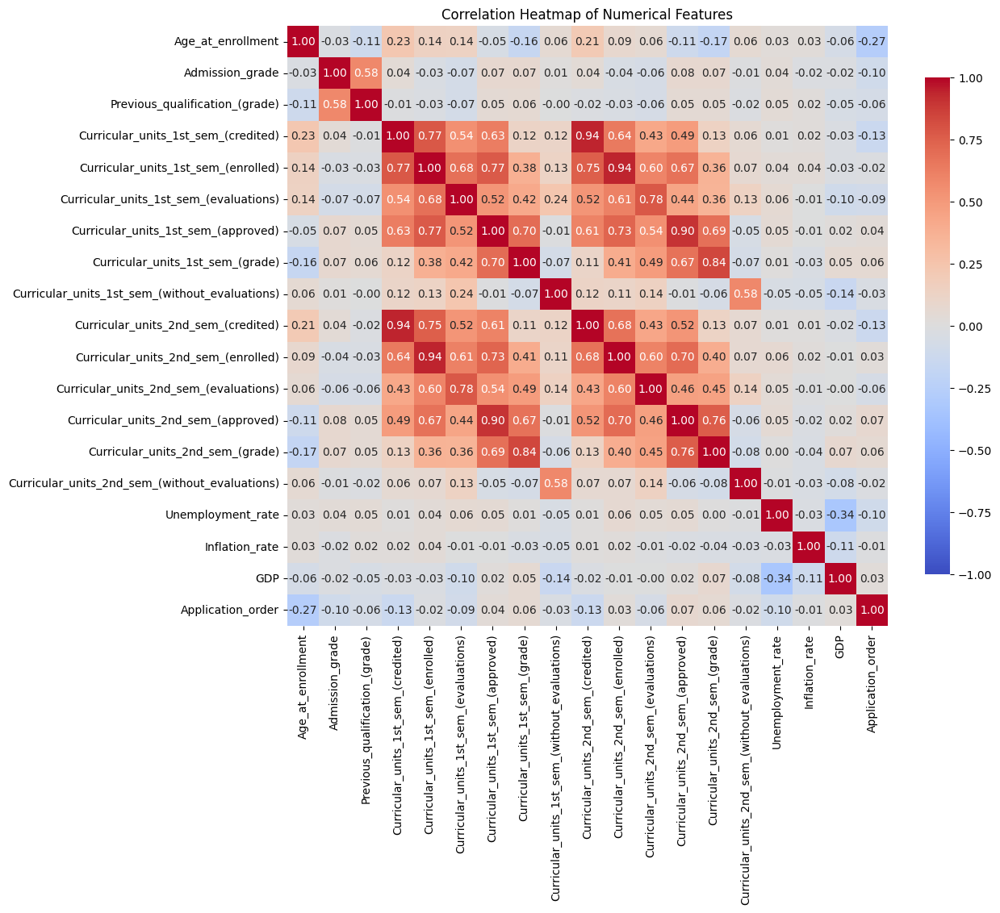

In [83]:
import seaborn as sns
import matplotlib.pyplot as plt

numerical_data = data[numerical_features]

# Calculate the correlation matrix
correlation_matrix = numerical_data.corr()

# Set up the matplotlib figure
plt.figure(figsize=(12, 10))

# Create a heatmap with the correlation matrix
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", vmin=-1, vmax=1, square=True, cbar_kws={"shrink": .8})

# Add title
plt.title("Correlation Heatmap of Numerical Features")

# Show plot
plt.show()


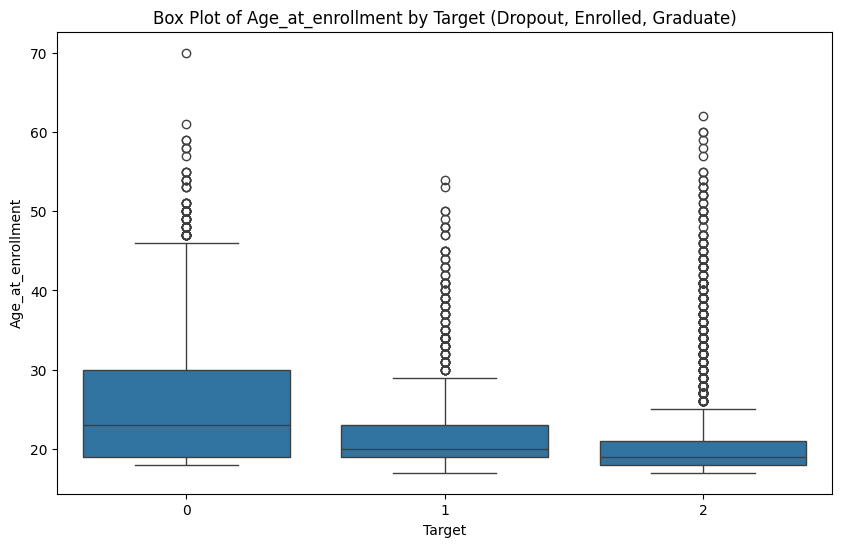

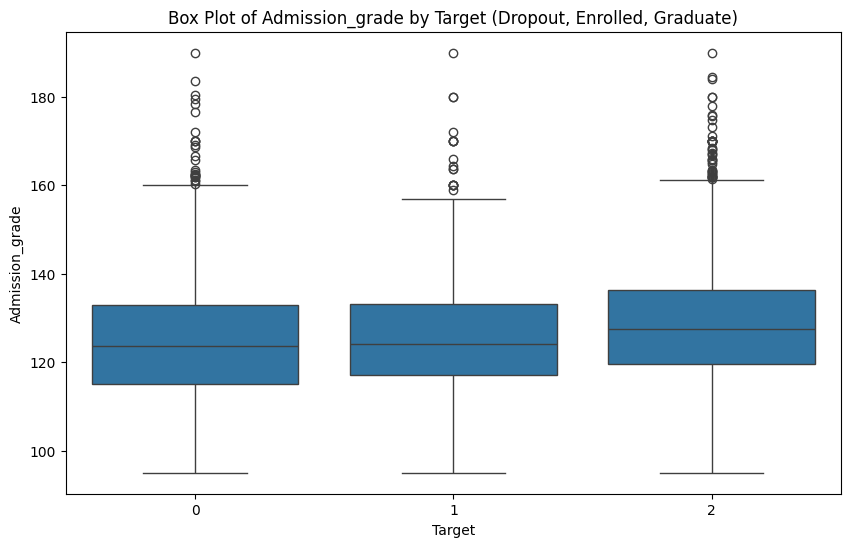

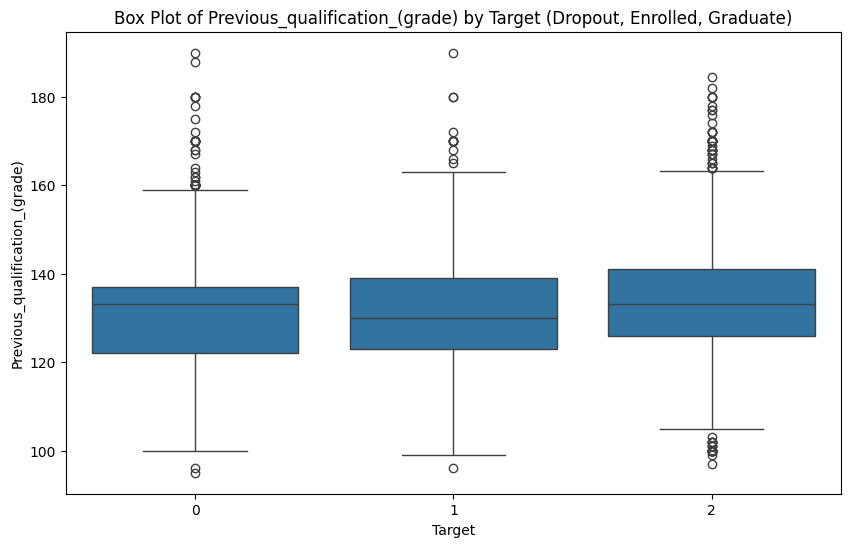

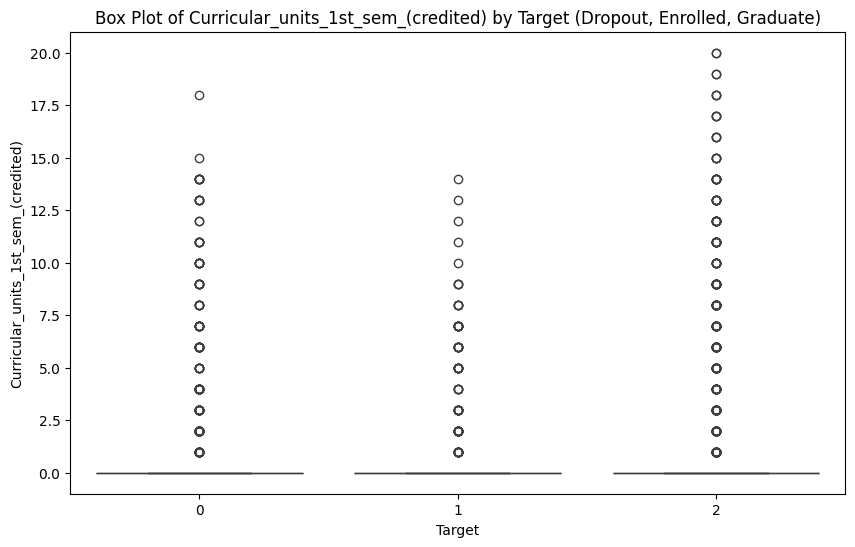

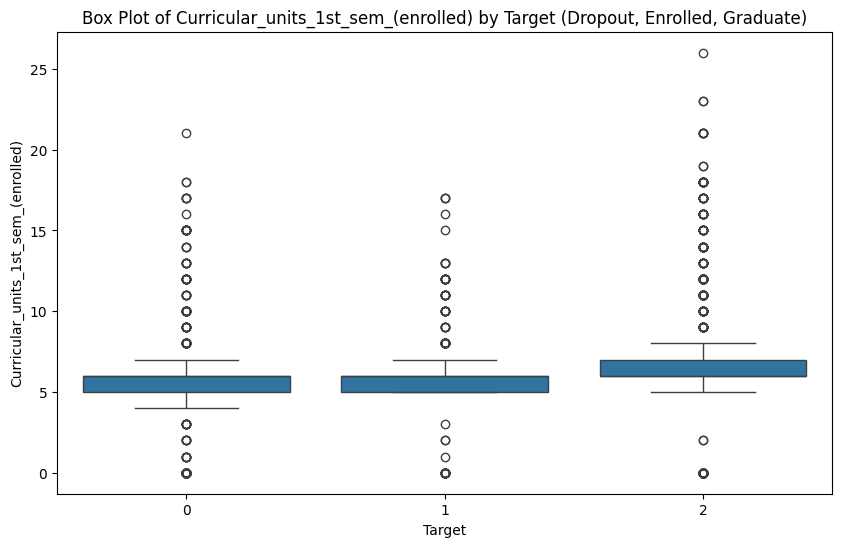

...

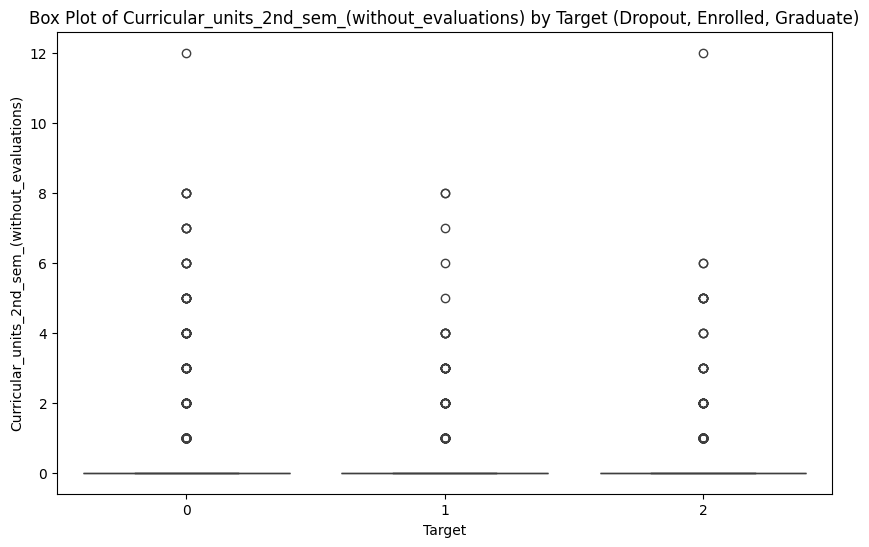

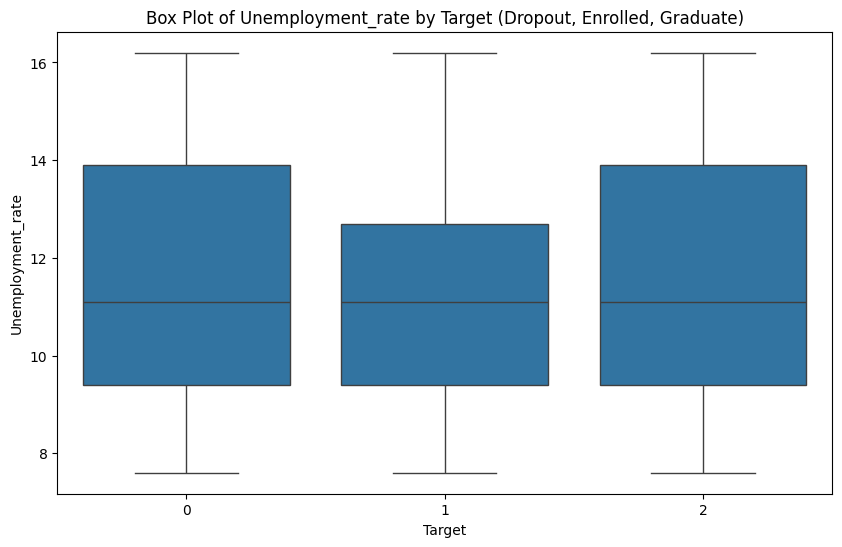

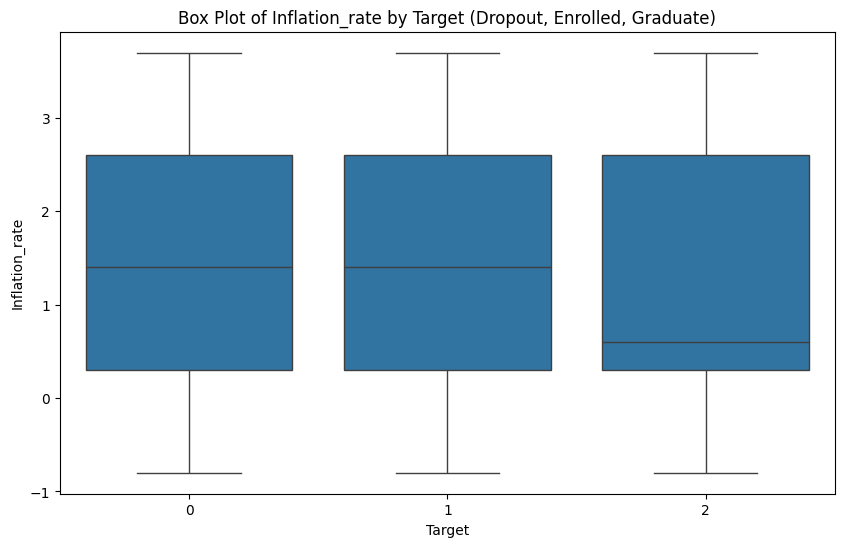

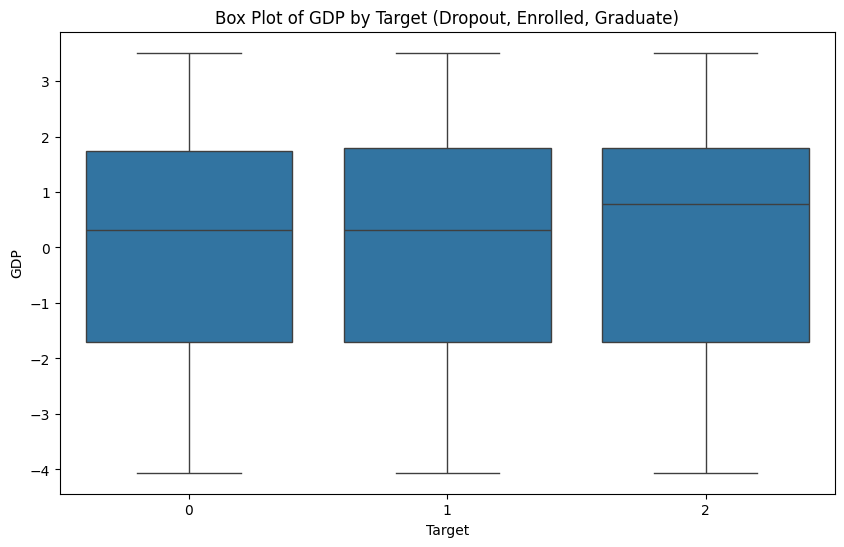

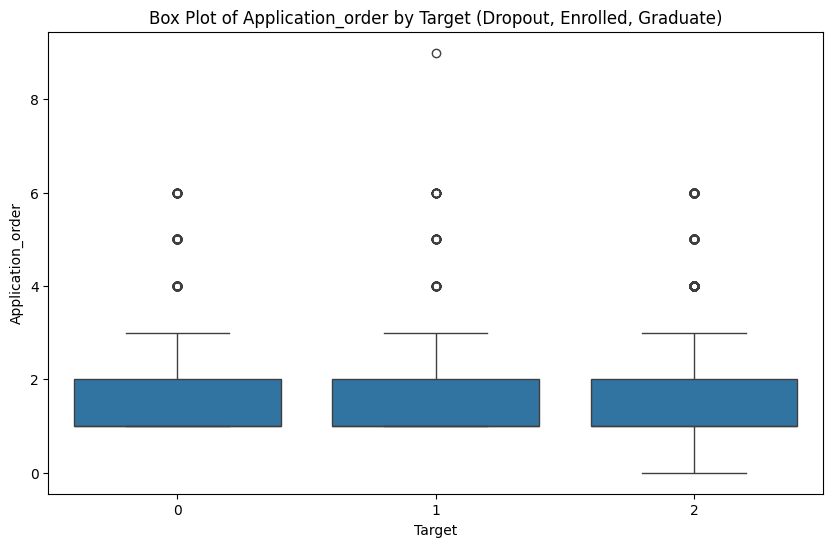

In [84]:
# Create box plots to analyze the relationship between numerical features and the target variable
for feature in numerical_features:
    plt.figure(figsize=(10, 6))
    sns.boxplot(x='Target', y=feature, data=data)
    plt.title(f"Box Plot of {feature} by Target (Dropout, Enrolled, Graduate)")
    plt.show()



In [85]:
# Detect outliers using IQR method
Q1 = data[numerical_features].quantile(0.25)
Q3 = data[numerical_features].quantile(0.75)
IQR = Q3 - Q1

# Define outliers as values outside the 1.5*IQR range
outliers = (data[numerical_features] < (Q1 - 1.5 * IQR)) | (data[numerical_features] > (Q3 + 1.5 * IQR))

# Count the number of outliers per feature
outlier_counts = outliers.sum()
print(outlier_counts)

Age_at_enrollment                                 441
Admission_grade                                    86
Previous_qualification_(grade)                    179
Curricular_units_1st_sem_(credited)               577
Curricular_units_1st_sem_(enrolled)               424
Curricular_units_1st_sem_(evaluations)            158
Curricular_units_1st_sem_(approved)               180
Curricular_units_1st_sem_(grade)                  726
Curricular_units_1st_sem_(without_evaluations)    294
Curricular_units_2nd_sem_(credited)               530
Curricular_units_2nd_sem_(enrolled)               369
Curricular_units_2nd_sem_(evaluations)            109
Curricular_units_2nd_sem_(approved)                44
Curricular_units_2nd_sem_(grade)                  877
Curricular_units_2nd_sem_(without_evaluations)    282
Unemployment_rate                                   0
Inflation_rate                                      0
GDP                                                 0
Application_order           

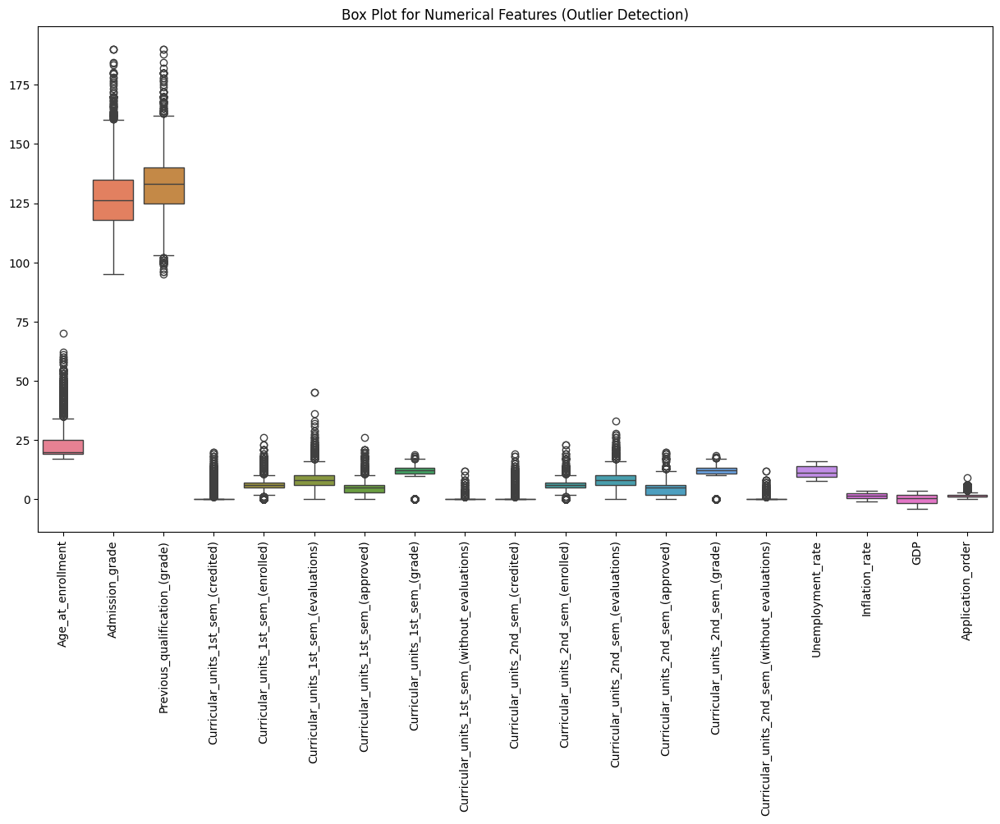

In [86]:
import matplotlib.pyplot as plt
import seaborn as sns

# Visualize outliers in the numerical features using box plots
plt.figure(figsize=(15, 8))
sns.boxplot(data=data[numerical_features])
plt.xticks(rotation=90)
plt.title('Box Plot for Numerical Features (Outlier Detection)')
plt.show()

## Συνοπτική Ανάλυση στατιστικών χαρακτηριστικών ανά κατηγορία στόχου

Η παρακάτω ανάλυση παρέχει μια περίληψη των στατιστικών των βασικών χαρακτηριστικών του dataset για τις διαφορετικές κατηγορίες στόχου: Dropout (0), Enrolled (1) και Graduate (2). Αυτή η προσέγγιση βοηθά στην κατανόηση του πώς διαφέρουν τα χαρακτηριστικά ανά κατηγορία και μπορεί να προσφέρει χρήσιμες ενδείξεις για το ποια χαρακτηριστικά συμβάλλουν περισσότερο στην επιτυχία ή την αποτυχία των φοιτητών.

### 1. Ηλικία κατά την εγγραφή (Age_at_enrollment)
- **Μέση τιμή**: Οι φοιτητές που ανήκουν στην κατηγορία Dropout (26.07) έχουν, κατά μέσο όρο, υψηλότερη ηλικία κατά την εγγραφή από αυτούς που παραμένουν εγγεγραμμένοι (22.37) ή αποφοιτούν (21.78).
- **Συμπέρασμα**: Οι μεγαλύτεροι φοιτητές φαίνεται να έχουν αυξημένη πιθανότητα εγκατάλειψης, γεγονός που μπορεί να αντικατοπτρίζει διαφορετικές ανάγκες και προτεραιότητες συγκριτικά με τους νεότερους.

### 2. Βαθμός Εισαγωγής (Admission_grade)
- **Μέση τιμή**: Οι αποφοιτήσαντες έχουν υψηλότερο μέσο βαθμό εισαγωγής (128.79), ενώ οι εγκαταλείψαντες έχουν χαμηλότερο (124.96).
- **Συμπέρασμα**: Ο υψηλότερος βαθμός εισαγωγής συνδέεται με καλύτερα αποτελέσματα, γεγονός που υποδηλώνει ότι η ακαδημαϊκή προετοιμασία κατά την εισαγωγή παίζει σημαντικό ρόλο στην πορεία των φοιτητών.

### 3. Βαθμός προηγούμενου τίτλου σπουδών (Previous_qualification_(grade))
- **Μέση τιμή**: Οι αποφοιτήσαντες έχουν επίσης υψηλότερους μέσους βαθμούς (134.08) στον προηγούμενο τίτλο σπουδών τους συγκριτικά με τους εγκαταλείψαντες (131.11).
- **Συμπέρασμα**: Ο βαθμός του προηγούμενου τίτλου σπουδών μπορεί να είναι δείκτης ακαδημαϊκής ικανότητας, με υψηλότερες τιμές να συνδέονται με αυξημένες πιθανότητες αποφοίτησης.

### 4. Μαθήματα Α΄ εξαμήνου (Curricular_units_1st_sem)
   - **Credited**: Οι φοιτητές που αποφοιτούν έχουν πιστωθεί περισσότερες μονάδες (μέσος όρος 0.85), σε αντίθεση με τους εγκαταλείψαντες (0.61).
   - **Enrolled**: Οι αποφοιτήσαντες παρακολουθούν κατά μέσο όρο περισσότερα μαθήματα (6.67) από τους εγκαταλείψαντες (5.82).
   - **Evaluations**: Η κατηγορία Enrolled παρουσιάζει υψηλότερο μέσο όρο αξιολογήσεων (9.34) σε σχέση με τις άλλες κατηγορίες.
   - **Approved**: Οι αποφοιτήσαντες έχουν υψηλότερο μέσο όρο εγκεκριμένων μονάδων (6.23), ενώ οι εγκαταλείψαντες έχουν χαμηλότερο (2.55).
   - **Grade**: Οι αποφοιτήσαντες έχουν υψηλότερο μέσο βαθμό στο Α' εξάμηνο (12.64).
- **Συμπέρασμα**: Η απόδοση στις μονάδες του πρώτου εξαμήνου σχετίζεται θετικά με τις πιθανότητες αποφοίτησης, ενώ η χαμηλή απόδοση συνδέεται με αυξημένο κίνδυνο εγκατάλειψης.

### 5. Μαθήματα Β΄ εξαμήνου (Curricular_units_2nd_sem)
   - **Credited**: Ο μέσος αριθμός πιστωμένων μονάδων είναι υψηλότερος για τους αποφοιτήσαντες (0.67).
   - **Enrolled**: Οι αποφοιτήσαντες είναι εγγεγραμμένοι σε περισσότερες μονάδες (6.63) από τους εγκαταλείψαντες (5.78).
   - **Evaluations**: Το μέσος όρος αξιολογήσεων είναι υψηλότερος για την κατηγορία Enrolled (9.43).
   - **Approved**: Ο μέσος αριθμός εγκεκριμένων μονάδων είναι υψηλότερος για τους αποφοιτήσαντες (6.18).
   - **Grade**: Ο μέσος βαθμός των αποφοιτησάντων στο Β΄ εξάμηνο είναι υψηλότερος (12.69).
- **Συμπέρασμα**: Παρόμοια με το πρώτο εξάμηνο, η καλή απόδοση στις μονάδες του δεύτερου εξαμήνου είναι σημαντική για την επιτυχία των φοιτητών.

### 6. Οικονομικοί Δείκτες
   - **Ανεργία (Unemployment_rate)**: Η μέση τιμή της ανεργίας είναι σχεδόν ίδια και για τις τρεις κατηγορίες στόχου.
   - **Πληθωρισμός (Inflation_rate)**: Ο πληθωρισμός είναι παρόμοιος και για τις τρεις κατηγορίες στόχου, χωρίς σημαντική διαφοροποίηση.
   - **ΑΕΠ (GDP)**: Οι φοιτητές που παραμένουν εγγεγραμμένοι και αυτοί που αποφοιτούν έχουν ελαφρώς υψηλότερο μέσο ΑΕΠ σε σχέση με τους εγκαταλείψαντες.
- **Συμπέρασμα**: Οι οικονομικοί δείκτες δεν φαίνεται να έχουν ισχυρή συσχέτιση με την επιτυχία των φοιτητών, αλλά ίσως υποδεικνύουν ελαφρές διαφορές στην κατανομή.

### 7. Σειρά Αίτησης (Application_order)
- **Μέση τιμή**: Οι αποφοιτήσαντες έχουν ελαφρώς υψηλότερο μέσο αριθμό αίτησης (1.85) σε σχέση με τους εγκαταλείψαντες (1.59).
- **Συμπέρασμα**: Ο αριθμός αίτησης μπορεί να δείχνει μια ελαφρά διαφορά στην δέσμευση των φοιτητών.

### Συνολική Συμπερασματική Ανάλυση
Γενικά, οι φοιτητές που εγκαταλείπουν τείνουν να έχουν υψηλότερη ηλικία, χαμηλότερους βαθμούς εισαγωγής, και χαμηλότερες επιδόσεις στις μονάδες του πρώτου και δεύτερου εξαμήνου συγκριτικά με τους φοιτητές που αποφοιτούν. Οι φοιτητές που παραμένουν εγγεγραμμένοι, αλλά δεν αποφοιτούν, φαίνεται να έχουν μέσες επιδόσεις, κυρίως στις αξιολογήσεις.


In [87]:
# Calculate summary statistics for outliers per target category
for feature in numerical_features:
    outliers_by_category = data.groupby('Target')[feature].describe()
    print(f"Summary statistics of {feature} per target category:")
    print(outliers_by_category)
    print("\n")

Summary statistics of Age_at_enrollment per target category:
         count       mean       std   min   25%   50%   75%   max
Target                                                           
0       1421.0  26.068966  8.704024  18.0  19.0  23.0  30.0  70.0
1        794.0  22.369018  6.302672  17.0  19.0  20.0  23.0  54.0
2       2209.0  21.783612  6.693218  17.0  18.0  19.0  21.0  62.0


Summary statistics of Admission_grade per target category:
         count        mean        std   min    25%    50%      75%    max
Target                                                                   
0       1421.0  124.961365  15.125159  95.0  115.0  123.6  133.000  190.0
1        794.0  125.534257  13.792559  95.0  117.0  124.1  133.275  190.0
2       2209.0  128.794432  14.071440  95.0  119.7  127.4  136.400  190.0


Summary statistics of Previous_qualification_(grade) per target category:
         count        mean        std   min    25%    50%    75%    max
Target                        

In [88]:
from collections import Counter

print("Class distribution:")
print(Counter(data['Target']))

Class distribution:
Counter({2: 2209, 0: 1421, 1: 794})


In [89]:

print(data.columns.tolist())

['Marital_status', 'Application_mode', 'Application_order', 'Course', 'Daytime/evening_attendance', 'Previous_qualification', 'Previous_qualification_(grade)', "Mother's_qualification", "Father's_qualification", "Mother's_occupation", "Father's_occupation", 'Admission_grade', 'Displaced', 'Educational_special_needs', 'Debtor', 'Tuition_fees_up_to_date', 'Gender', 'Scholarship_holder', 'Age_at_enrollment', 'International', 'Curricular_units_1st_sem_(credited)', 'Curricular_units_1st_sem_(enrolled)', 'Curricular_units_1st_sem_(evaluations)', 'Curricular_units_1st_sem_(approved)', 'Curricular_units_1st_sem_(grade)', 'Curricular_units_1st_sem_(without_evaluations)', 'Curricular_units_2nd_sem_(credited)', 'Curricular_units_2nd_sem_(enrolled)', 'Curricular_units_2nd_sem_(evaluations)', 'Curricular_units_2nd_sem_(approved)', 'Curricular_units_2nd_sem_(grade)', 'Curricular_units_2nd_sem_(without_evaluations)', 'Unemployment_rate', 'Inflation_rate', 'GDP', 'Target', "Mother's_qualification_mapp

In [90]:
import catboost
print("CatBoost is installed and ready to use.")

CatBoost is installed and ready to use.


In [91]:
# Check data types
print(data.dtypes)

Marital_status                                      int64
Application_mode                                    int64
Application_order                                   int64
Course                                              int64
Daytime/evening_attendance                          int64
Previous_qualification                              int64
Previous_qualification_(grade)                    float64
Mother's_qualification                              int64
Father's_qualification                              int64
Mother's_occupation                                 int64
Father's_occupation                                 int64
Admission_grade                                   float64
Displaced                                           int64
Educational_special_needs                           int64
Debtor                                              int64
Tuition_fees_up_to_date                             int64
Gender                                              int64
Scholarship_ho

## RANDOM FOREST - Original Feutures - controlled group splits with 5-Fold validation


Training and Evaluating on Group 1

Training on Fold 1 of Group 1
Classification Report for Fold 1 of Group 1:
              precision    recall  f1-score   support

     Dropout       0.80      0.68      0.74       142
    Enrolled       0.66      0.68      0.67       159
    Graduate       0.74      0.82      0.78       148

    accuracy                           0.73       449
   macro avg       0.73      0.73      0.73       449
weighted avg       0.73      0.73      0.73       449



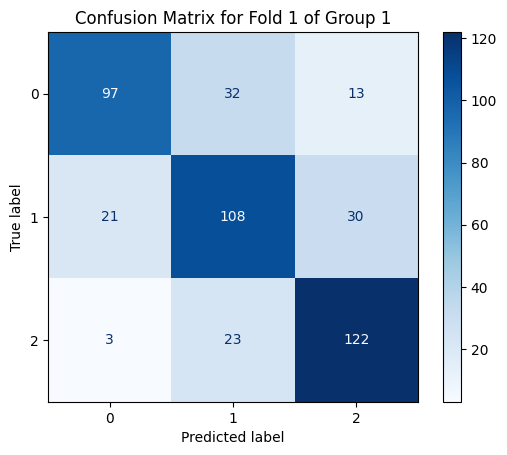


Training on Fold 2 of Group 1
Classification Report for Fold 2 of Group 1:
              precision    recall  f1-score   support

     Dropout       0.85      0.63      0.72       143
    Enrolled       0.57      0.69      0.62       158
    Graduate       0.72      0.73      0.73       147

    accuracy                           0.69       448
   macro avg       0.71      0.68      0.69       448
weighted avg       0.71      0.69      0.69       448



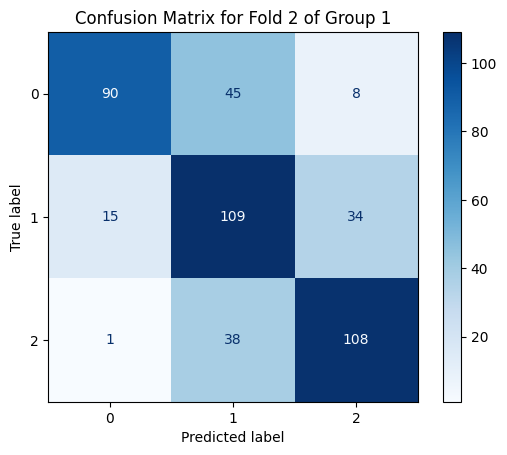


Training on Fold 3 of Group 1
Classification Report for Fold 3 of Group 1:
              precision    recall  f1-score   support

     Dropout       0.84      0.65      0.73       142
    Enrolled       0.59      0.64      0.62       159
    Graduate       0.67      0.76      0.72       147

    accuracy                           0.68       448
   macro avg       0.70      0.68      0.69       448
weighted avg       0.70      0.68      0.68       448



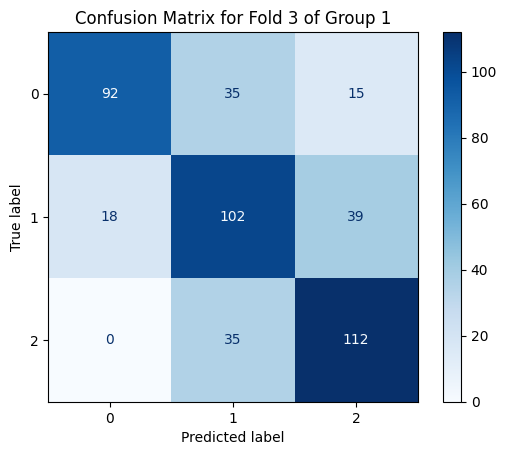


Training on Fold 4 of Group 1
Classification Report for Fold 4 of Group 1:
              precision    recall  f1-score   support

     Dropout       0.88      0.75      0.81       142
    Enrolled       0.71      0.77      0.74       159
    Graduate       0.80      0.85      0.83       147

    accuracy                           0.79       448
   macro avg       0.80      0.79      0.79       448
weighted avg       0.79      0.79      0.79       448



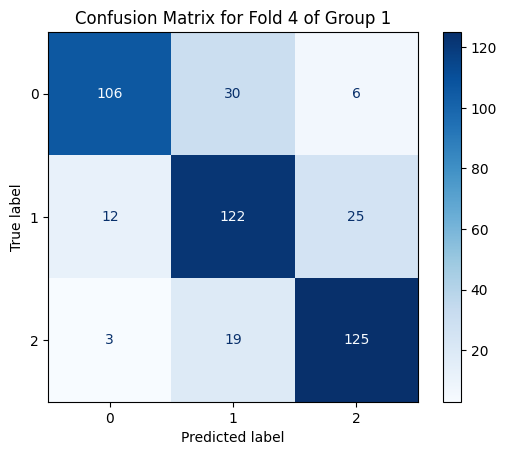


Training on Fold 5 of Group 1
Classification Report for Fold 5 of Group 1:
              precision    recall  f1-score   support

     Dropout       0.83      0.68      0.75       142
    Enrolled       0.66      0.73      0.69       159
    Graduate       0.74      0.78      0.76       147

    accuracy                           0.73       448
   macro avg       0.74      0.73      0.73       448
weighted avg       0.74      0.73      0.73       448



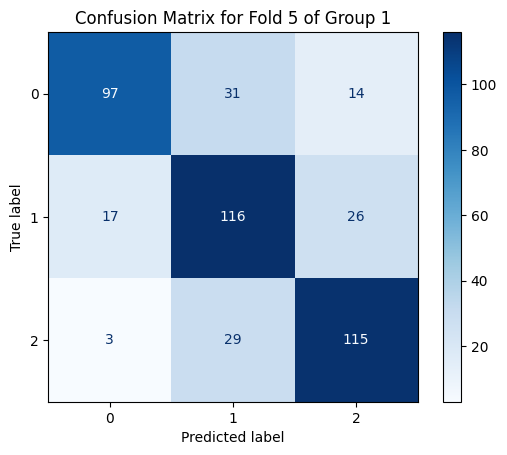


Summary of 5-Fold Cross-Validation Results for Group 1:
Classification Report for Fold 1:
              precision    recall  f1-score   support

     Dropout       0.80      0.68      0.74       142
    Enrolled       0.66      0.68      0.67       159
    Graduate       0.74      0.82      0.78       148

    accuracy                           0.73       449
   macro avg       0.73      0.73      0.73       449
weighted avg       0.73      0.73      0.73       449

Classification Report for Fold 2:
              precision    recall  f1-score   support

     Dropout       0.85      0.63      0.72       143
    Enrolled       0.57      0.69      0.62       158
    Graduate       0.72      0.73      0.73       147

    accuracy                           0.69       448
   macro avg       0.71      0.68      0.69       448
weighted avg       0.71      0.69      0.69       448

Classification Report for Fold 3:
              precision    recall  f1-score   support

     Dropout       0.84 

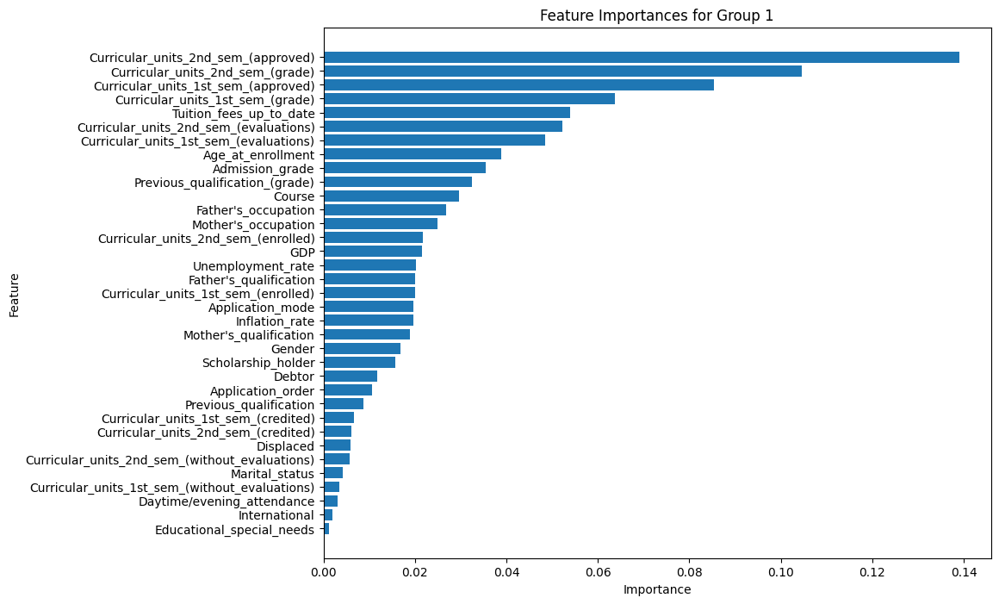


Training and Evaluating on Group 2

Training on Fold 1 of Group 2
Classification Report for Fold 1 of Group 2:
              precision    recall  f1-score   support

     Dropout       0.81      0.64      0.72       142
    Enrolled       0.67      0.73      0.70       158
    Graduate       0.74      0.82      0.78       148

    accuracy                           0.73       448
   macro avg       0.74      0.73      0.73       448
weighted avg       0.74      0.73      0.73       448



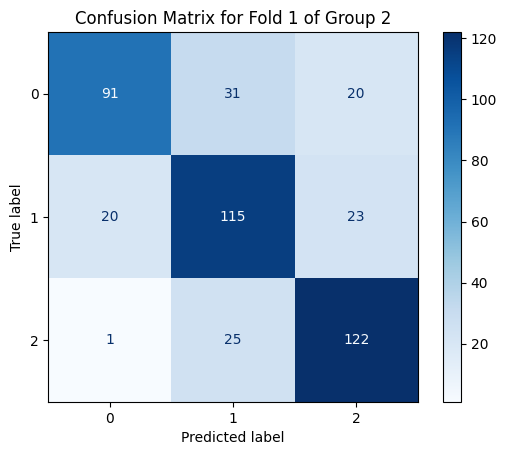


Training on Fold 2 of Group 2
Classification Report for Fold 2 of Group 2:
              precision    recall  f1-score   support

     Dropout       0.83      0.68      0.74       142
    Enrolled       0.61      0.69      0.64       159
    Graduate       0.70      0.73      0.71       147

    accuracy                           0.70       448
   macro avg       0.71      0.70      0.70       448
weighted avg       0.71      0.70      0.70       448



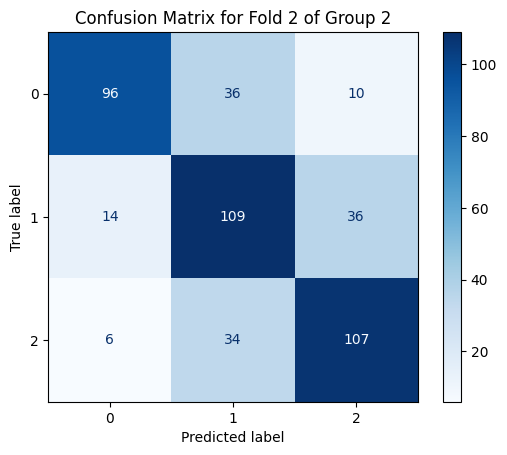


Training on Fold 3 of Group 2
Classification Report for Fold 3 of Group 2:
              precision    recall  f1-score   support

     Dropout       0.79      0.68      0.73       142
    Enrolled       0.64      0.66      0.65       159
    Graduate       0.69      0.77      0.73       147

    accuracy                           0.70       448
   macro avg       0.71      0.70      0.70       448
weighted avg       0.71      0.70      0.70       448



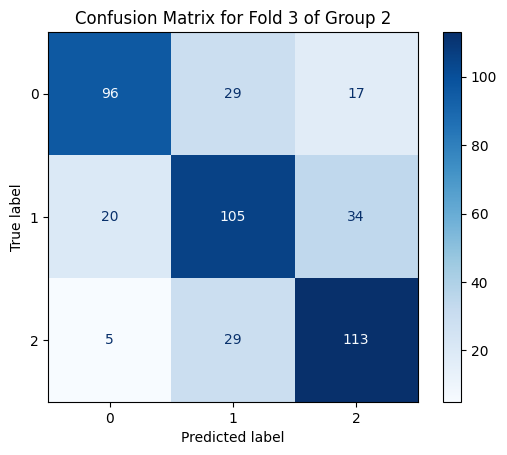


Training on Fold 4 of Group 2
Classification Report for Fold 4 of Group 2:
              precision    recall  f1-score   support

     Dropout       0.82      0.65      0.73       142
    Enrolled       0.64      0.73      0.68       159
    Graduate       0.75      0.79      0.77       147

    accuracy                           0.73       448
   macro avg       0.74      0.72      0.73       448
weighted avg       0.74      0.73      0.73       448



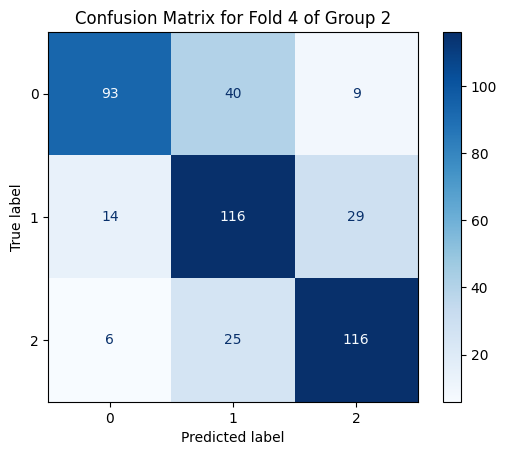


Training on Fold 5 of Group 2
Classification Report for Fold 5 of Group 2:
              precision    recall  f1-score   support

     Dropout       0.78      0.63      0.70       142
    Enrolled       0.69      0.70      0.70       159
    Graduate       0.69      0.82      0.75       147

    accuracy                           0.72       448
   macro avg       0.72      0.72      0.72       448
weighted avg       0.72      0.72      0.72       448



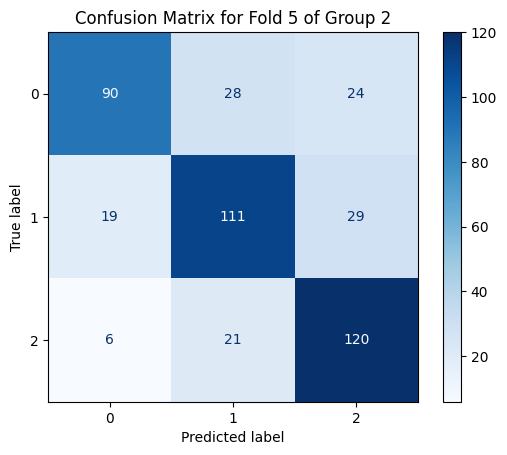


Summary of 5-Fold Cross-Validation Results for Group 2:
Classification Report for Fold 1:
              precision    recall  f1-score   support

     Dropout       0.81      0.64      0.72       142
    Enrolled       0.67      0.73      0.70       158
    Graduate       0.74      0.82      0.78       148

    accuracy                           0.73       448
   macro avg       0.74      0.73      0.73       448
weighted avg       0.74      0.73      0.73       448

Classification Report for Fold 2:
              precision    recall  f1-score   support

     Dropout       0.83      0.68      0.74       142
    Enrolled       0.61      0.69      0.64       159
    Graduate       0.70      0.73      0.71       147

    accuracy                           0.70       448
   macro avg       0.71      0.70      0.70       448
weighted avg       0.71      0.70      0.70       448

Classification Report for Fold 3:
              precision    recall  f1-score   support

     Dropout       0.79 

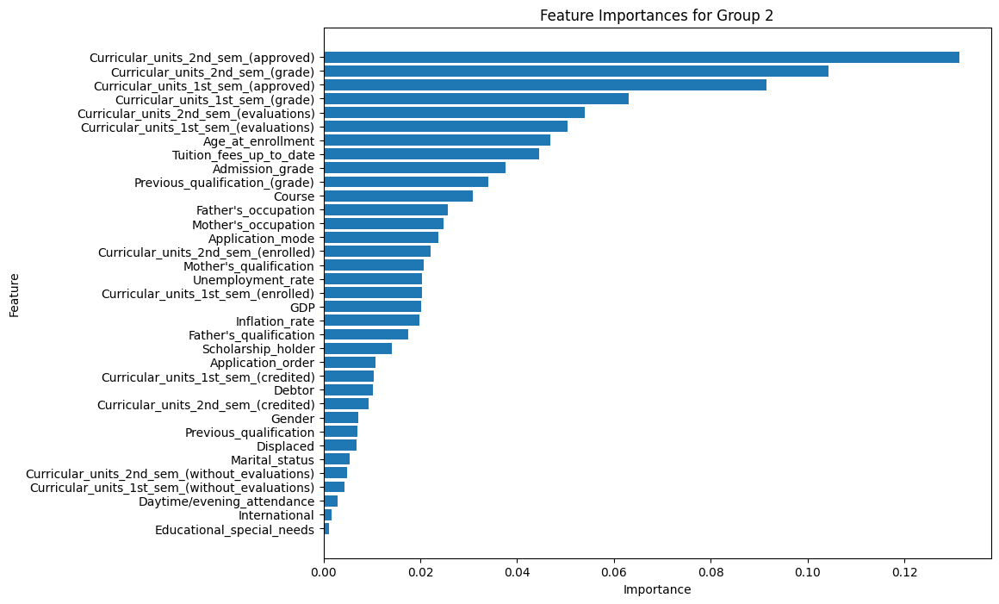


Training and Evaluating on Group 3

Training on Fold 1 of Group 3
Classification Report for Fold 1 of Group 3:
              precision    recall  f1-score   support

     Dropout       0.81      0.68      0.74       142
    Enrolled       0.62      0.70      0.66       159
    Graduate       0.73      0.74      0.73       148

    accuracy                           0.71       449
   macro avg       0.72      0.71      0.71       449
weighted avg       0.71      0.71      0.71       449



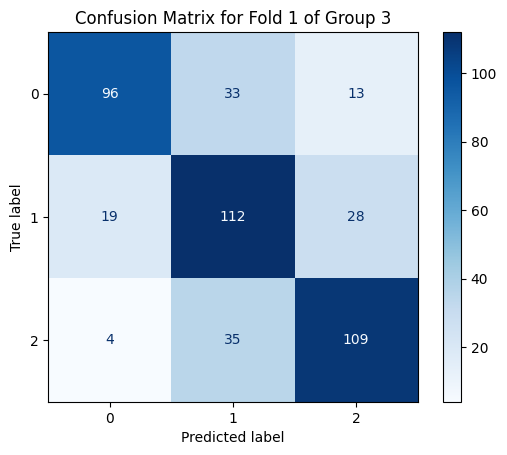


Training on Fold 2 of Group 3
Classification Report for Fold 2 of Group 3:
              precision    recall  f1-score   support

     Dropout       0.82      0.61      0.70       142
    Enrolled       0.57      0.67      0.62       159
    Graduate       0.70      0.74      0.72       148

    accuracy                           0.67       449
   macro avg       0.70      0.67      0.68       449
weighted avg       0.69      0.67      0.68       449



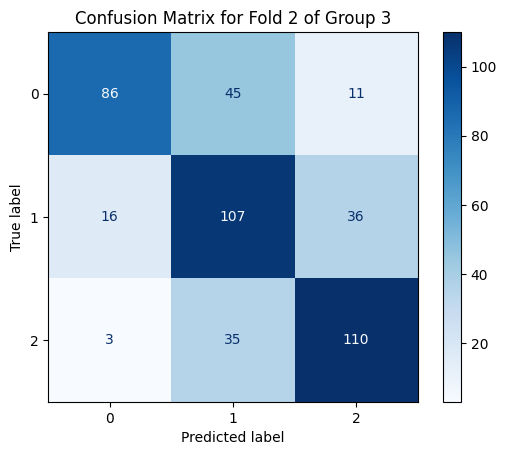


Training on Fold 3 of Group 3
Classification Report for Fold 3 of Group 3:
              precision    recall  f1-score   support

     Dropout       0.81      0.64      0.71       143
    Enrolled       0.64      0.71      0.67       158
    Graduate       0.73      0.80      0.77       147

    accuracy                           0.72       448
   macro avg       0.73      0.72      0.72       448
weighted avg       0.73      0.72      0.72       448



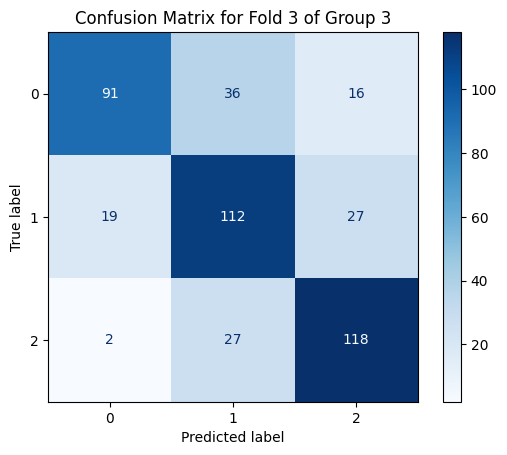


Training on Fold 4 of Group 3
Classification Report for Fold 4 of Group 3:
              precision    recall  f1-score   support

     Dropout       0.89      0.75      0.81       142
    Enrolled       0.69      0.75      0.72       159
    Graduate       0.77      0.82      0.79       147

    accuracy                           0.77       448
   macro avg       0.78      0.77      0.77       448
weighted avg       0.78      0.77      0.77       448



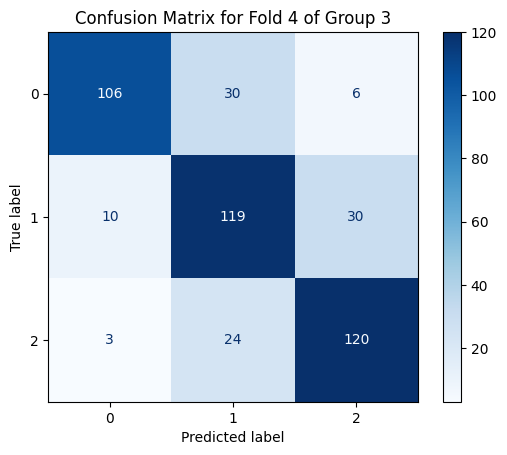


Training on Fold 5 of Group 3
Classification Report for Fold 5 of Group 3:
              precision    recall  f1-score   support

     Dropout       0.82      0.69      0.75       142
    Enrolled       0.64      0.73      0.68       159
    Graduate       0.77      0.78      0.77       147

    accuracy                           0.73       448
   macro avg       0.74      0.73      0.74       448
weighted avg       0.74      0.73      0.73       448



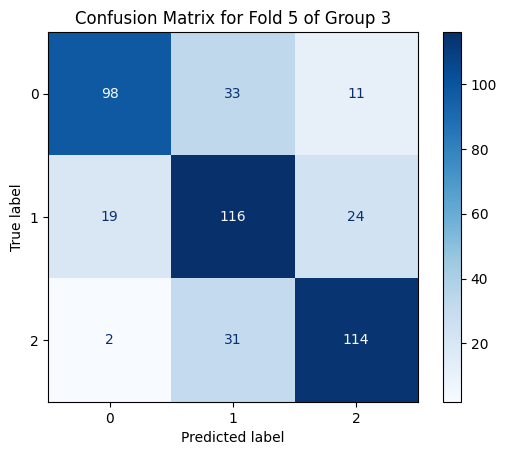


Summary of 5-Fold Cross-Validation Results for Group 3:
Classification Report for Fold 1:
              precision    recall  f1-score   support

     Dropout       0.81      0.68      0.74       142
    Enrolled       0.62      0.70      0.66       159
    Graduate       0.73      0.74      0.73       148

    accuracy                           0.71       449
   macro avg       0.72      0.71      0.71       449
weighted avg       0.71      0.71      0.71       449

Classification Report for Fold 2:
              precision    recall  f1-score   support

     Dropout       0.82      0.61      0.70       142
    Enrolled       0.57      0.67      0.62       159
    Graduate       0.70      0.74      0.72       148

    accuracy                           0.67       449
   macro avg       0.70      0.67      0.68       449
weighted avg       0.69      0.67      0.68       449

Classification Report for Fold 3:
              precision    recall  f1-score   support

     Dropout       0.81 

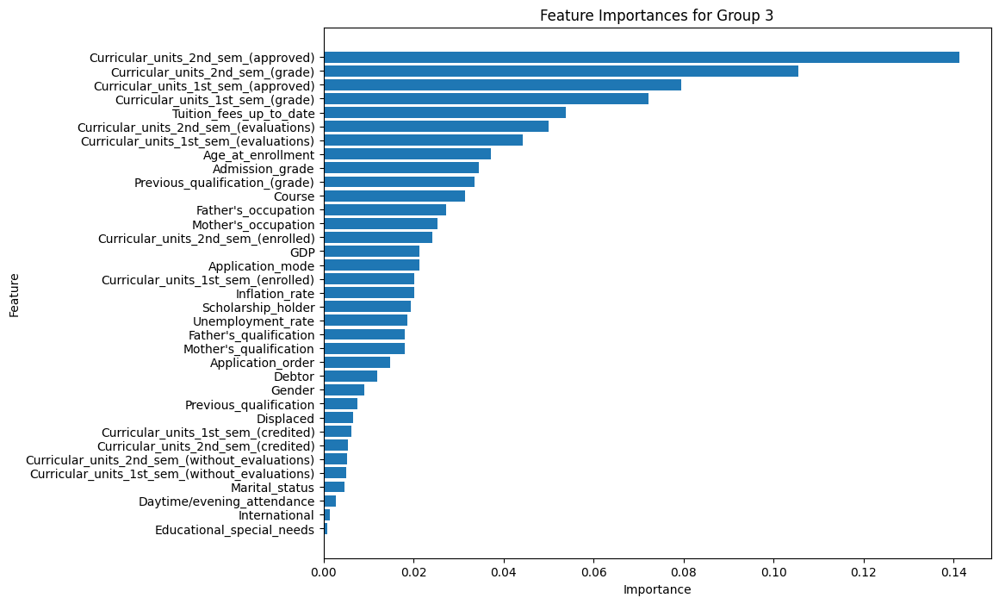

In [92]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Define the columns to use, excluding original and grouped columns
all_features = [
    'Marital_status',  'Application_order',"Mother's_qualification", 
    "Father's_qualification", 
    'Previous_qualification',
    'Application_mode', 
    'Course',
    "Mother's_occupation", 
    "Father's_occupation",
    'Daytime/evening_attendance', 'Previous_qualification_(grade)', 'Admission_grade',
    'Displaced', 'Educational_special_needs', 'Debtor', 'Tuition_fees_up_to_date',
    'Gender', 'Scholarship_holder', 'Age_at_enrollment', 'International',
    'Curricular_units_1st_sem_(credited)', 'Curricular_units_1st_sem_(enrolled)',
    'Curricular_units_1st_sem_(evaluations)', 'Curricular_units_1st_sem_(approved)',
    'Curricular_units_1st_sem_(grade)', 'Curricular_units_1st_sem_(without_evaluations)',
    'Curricular_units_2nd_sem_(credited)', 'Curricular_units_2nd_sem_(enrolled)',
    'Curricular_units_2nd_sem_(evaluations)', 'Curricular_units_2nd_sem_(approved)',
    'Curricular_units_2nd_sem_(grade)', 'Curricular_units_2nd_sem_(without_evaluations)',
    'Unemployment_rate', 'Inflation_rate', 'GDP',]

# Split data into each class subset
graduate_data = data[data['Target'] == 2]
dropout_data = data[data['Target'] == 0]
enrolled_data = data[data['Target'] == 1]

# Define the split groups for Graduates and Dropouts
graduate_splits = [graduate_data.iloc[:736], graduate_data.iloc[736:1472], graduate_data.iloc[1472:]]
dropout_splits = [dropout_data.iloc[:711], dropout_data.iloc[711:]]

# Define each group combination
groups = {
    "Group 1": pd.concat([graduate_splits[0], dropout_splits[0], enrolled_data]),
    "Group 2": pd.concat([graduate_splits[1], dropout_splits[1], enrolled_data]),
    "Group 3": pd.concat([graduate_splits[2], dropout_splits[0], enrolled_data])
}

# Train and evaluate Random Forest model on each group using stratified 5-fold cross-validation
for group_name, group_data in groups.items():
    print(f"\nTraining and Evaluating on {group_name}")

    # Separate features and target
    X = group_data[all_features]
    y = group_data['Target']

    # Initialize stratified K-Fold cross-validator
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    # Initialize an empty list to store evaluation results
    evaluation_reports = []

    # Start stratified 5-fold cross-validation
    for fold, (train_idx, test_idx) in enumerate(skf.split(X, y)):
        print(f"\nTraining on Fold {fold + 1} of {group_name}")

        # Split data into training and testing sets for this fold
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

        # Initialize and train Random Forest model
        model = RandomForestClassifier(n_estimators=100, max_depth=10, random_state=42)
        model.fit(X_train, y_train)


        
       

        # Make predictions and evaluate the model
        y_pred = model.predict(X_test)
        report = classification_report(y_test, y_pred, target_names=['Dropout', 'Enrolled', 'Graduate'])
        print(f"Classification Report for Fold {fold + 1} of {group_name}:\n{report}")

        # Compute confusion matrix
        cm = confusion_matrix(y_test, y_pred)

        # Plot confusion matrix
        disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
        disp.plot(cmap=plt.cm.Blues)
        plt.title(f'Confusion Matrix for Fold {fold + 1} of {group_name}')
        plt.show()

        # Append the report to the list for further analysis
        evaluation_reports.append(report)

    # summary of the reports after all folds have been completed for each group
    print(f"\nSummary of 5-Fold Cross-Validation Results for {group_name}:")
    for i, report in enumerate(evaluation_reports, 1):
        print(f"Classification Report for Fold {i}:\n{report}")

    # Plot feature importances
    feature_importances = model.feature_importances_
    sorted_indices = feature_importances.argsort()[::-1]
    plt.figure(figsize=(10, 8))
    plt.barh([all_features[i] for i in sorted_indices], feature_importances[sorted_indices])
    plt.xlabel('Importance')
    plt.ylabel('Feature')
    plt.title(f'Feature Importances for {group_name}')
    plt.gca().invert_yaxis()
    plt.show()


# RANDOM FOREST & SHAP - Original Feutures - controlled group splits with 5-Fold validation

### Ερμηνεία Αποτελεσμάτων SHAP - 5 Κορυφαία Χαρακτηριστικά Ανά Κατηγορία

- **Κατηγορία 0 (Dropout)**:
  - `Curricular_units_2nd_sem_(approved)`
  - `Curricular_units_2nd_sem_(grade)`
  - `Tuition_fees_up_to_date`
  - `Curricular_units_1st_sem_(approved)`
  - `Age_at_enrollment`

- **Κατηγορία 1 (Enrolled)**:
  - `Curricular_units_2nd_sem_(approved)`
  - `Curricular_units_1st_sem_(approved)`
  - `Curricular_units_2nd_sem_(grade)`
  - `Curricular_units_1st_sem_(evaluations)`
  - `Tuition_fees_up_to_date`

- **Κατηγορία 2 (Graduate)**:
  - `Curricular_units_2nd_sem_(approved)`
  - `Curricular_units_1st_sem_(approved)`
  - `Curricular_units_2nd_sem_(grade)`
  - `Curricular_units_1st_sem_(grade)`
  - `Tuition_fees_up_to_date`

### Σύνοψη Αποτελεσμάτων Ταξινόμησης

| Κατηγορία | Precision | Recall | F1-score | Παρατηρήσεις |
|-----------|-----------|--------|----------|--------------|
| **Dropout**   | 0.78 - 0.88 | 0.63 - 0.75 | 0.70 - 0.81 | Ικανοποιητική απόδοση στην πρόβλεψη εγκατάλειψης. |
| **Enrolled**  | 0.57 - 0.71 | 0.64 - 0.77 | 0.62 - 0.74 | Δυσκολία στη διάκριση  |
| **Graduate**  | 0.67 - 0.80 | 0.67 - 0.85 | 0.71 - 0.83 | Υψηλή απόδοση στην πρόβλεψη αποφοίτησης. |

### Σταθερότητα μεταξύ Folds
- **accuracy**: Το μοντέλο έχει ακρίβεια περίπου 0.68 έως 0.79 σε όλα τα folds, υποδεικνύοντας σταθερή απόδοση.
- **Διακύμανση**: Ελαφρές διακυμάνσεις στο precision, recall, και F1-score, αλλά η κατηγορία "Enrolled" συνεχίζει να είναι η πιο δύσκολη για       ταξινόμηση.


c:\users\hp i7\appdata\local\programs\python\python39\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm



Training and Evaluating on Group 1

Training on Fold 1 of Group 1
Classification Report for Fold 1 of Group 1:
              precision    recall  f1-score   support

     Dropout       0.80      0.68      0.74       142
    Enrolled       0.66      0.68      0.67       159
    Graduate       0.74      0.82      0.78       148

    accuracy                           0.73       449
   macro avg       0.73      0.73      0.73       449
weighted avg       0.73      0.73      0.73       449



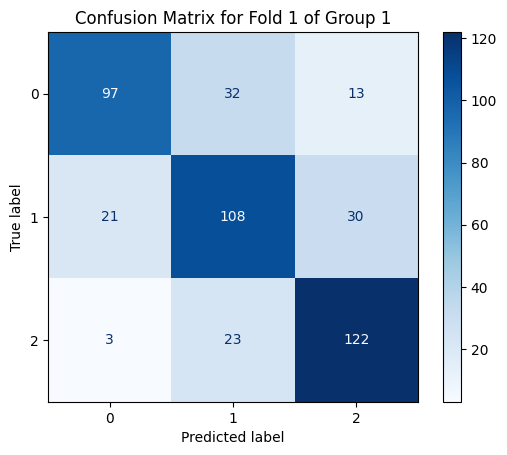


Training on Fold 2 of Group 1
Classification Report for Fold 2 of Group 1:
              precision    recall  f1-score   support

     Dropout       0.85      0.63      0.72       143
    Enrolled       0.57      0.69      0.62       158
    Graduate       0.72      0.73      0.73       147

    accuracy                           0.69       448
   macro avg       0.71      0.68      0.69       448
weighted avg       0.71      0.69      0.69       448



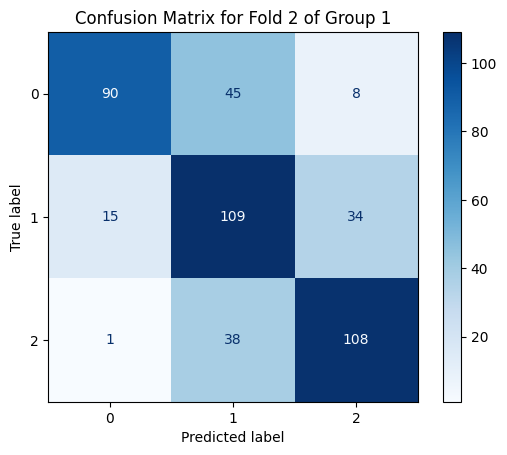


Training on Fold 3 of Group 1
Classification Report for Fold 3 of Group 1:
              precision    recall  f1-score   support

     Dropout       0.84      0.65      0.73       142
    Enrolled       0.59      0.64      0.62       159
    Graduate       0.67      0.76      0.72       147

    accuracy                           0.68       448
   macro avg       0.70      0.68      0.69       448
weighted avg       0.70      0.68      0.68       448



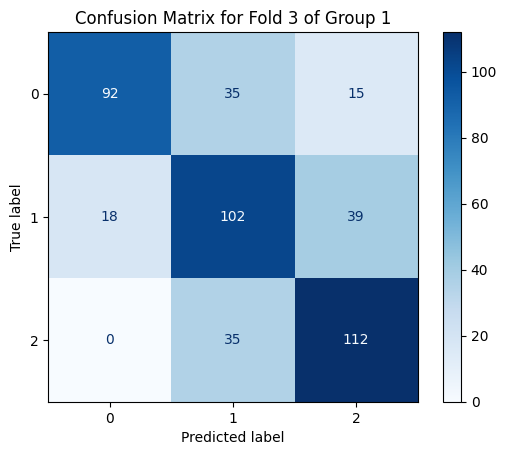


Training on Fold 4 of Group 1
Classification Report for Fold 4 of Group 1:
              precision    recall  f1-score   support

     Dropout       0.88      0.75      0.81       142
    Enrolled       0.71      0.77      0.74       159
    Graduate       0.80      0.85      0.83       147

    accuracy                           0.79       448
   macro avg       0.80      0.79      0.79       448
weighted avg       0.79      0.79      0.79       448



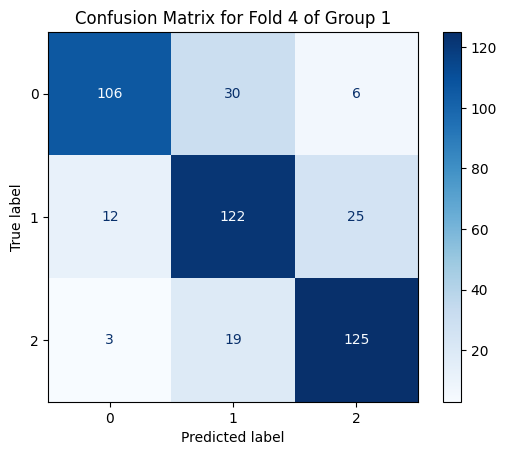


Training on Fold 5 of Group 1
Classification Report for Fold 5 of Group 1:
              precision    recall  f1-score   support

     Dropout       0.83      0.68      0.75       142
    Enrolled       0.66      0.73      0.69       159
    Graduate       0.74      0.78      0.76       147

    accuracy                           0.73       448
   macro avg       0.74      0.73      0.73       448
weighted avg       0.74      0.73      0.73       448



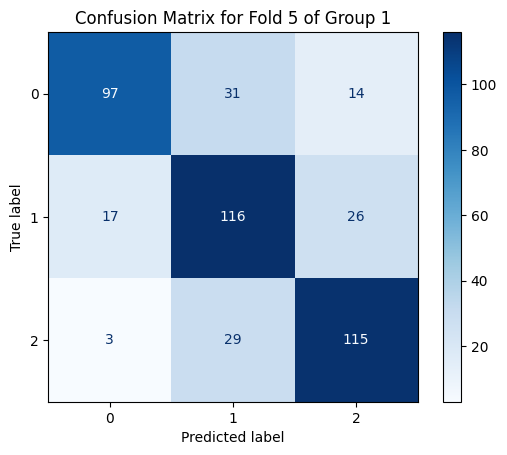


Training and Evaluating on Group 2

Training on Fold 1 of Group 2
Classification Report for Fold 1 of Group 2:
              precision    recall  f1-score   support

     Dropout       0.81      0.64      0.72       142
    Enrolled       0.67      0.73      0.70       158
    Graduate       0.74      0.82      0.78       148

    accuracy                           0.73       448
   macro avg       0.74      0.73      0.73       448
weighted avg       0.74      0.73      0.73       448



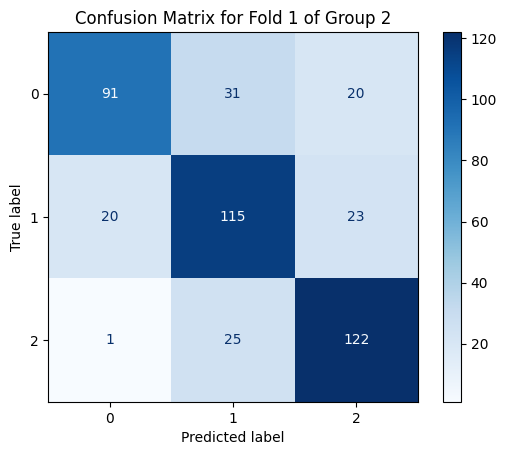


Training on Fold 2 of Group 2
Classification Report for Fold 2 of Group 2:
              precision    recall  f1-score   support

     Dropout       0.83      0.68      0.74       142
    Enrolled       0.61      0.69      0.64       159
    Graduate       0.70      0.73      0.71       147

    accuracy                           0.70       448
   macro avg       0.71      0.70      0.70       448
weighted avg       0.71      0.70      0.70       448



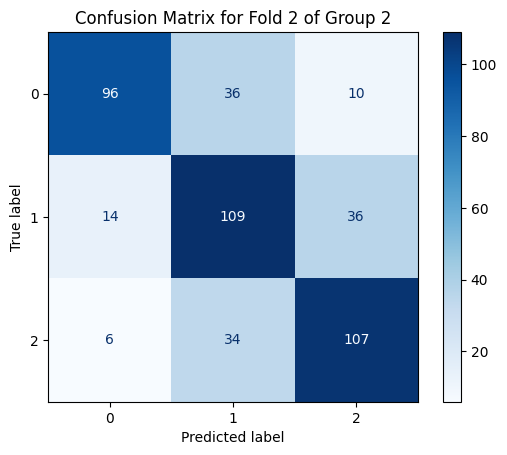


Training on Fold 3 of Group 2
Classification Report for Fold 3 of Group 2:
              precision    recall  f1-score   support

     Dropout       0.79      0.68      0.73       142
    Enrolled       0.64      0.66      0.65       159
    Graduate       0.69      0.77      0.73       147

    accuracy                           0.70       448
   macro avg       0.71      0.70      0.70       448
weighted avg       0.71      0.70      0.70       448



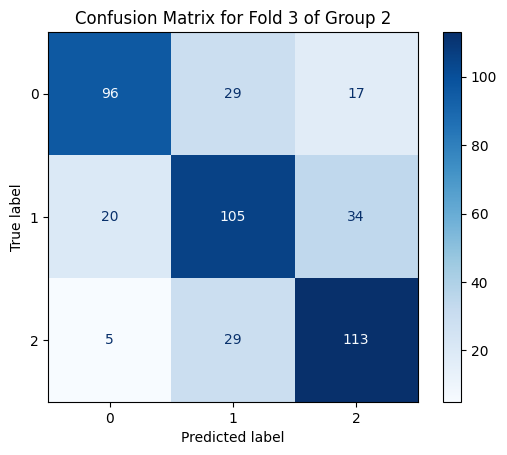


Training on Fold 4 of Group 2
Classification Report for Fold 4 of Group 2:
              precision    recall  f1-score   support

     Dropout       0.82      0.65      0.73       142
    Enrolled       0.64      0.73      0.68       159
    Graduate       0.75      0.79      0.77       147

    accuracy                           0.73       448
   macro avg       0.74      0.72      0.73       448
weighted avg       0.74      0.73      0.73       448



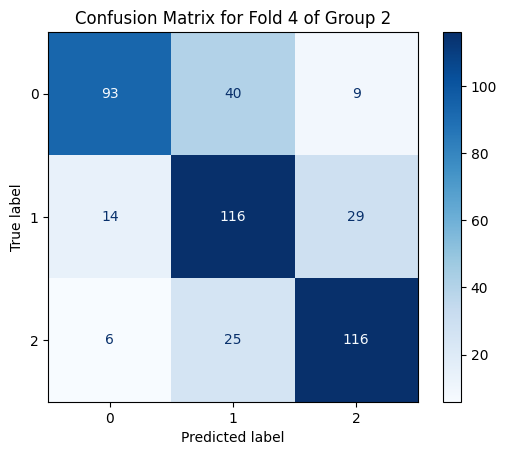


Training on Fold 5 of Group 2
Classification Report for Fold 5 of Group 2:
              precision    recall  f1-score   support

     Dropout       0.78      0.63      0.70       142
    Enrolled       0.69      0.70      0.70       159
    Graduate       0.69      0.82      0.75       147

    accuracy                           0.72       448
   macro avg       0.72      0.72      0.72       448
weighted avg       0.72      0.72      0.72       448



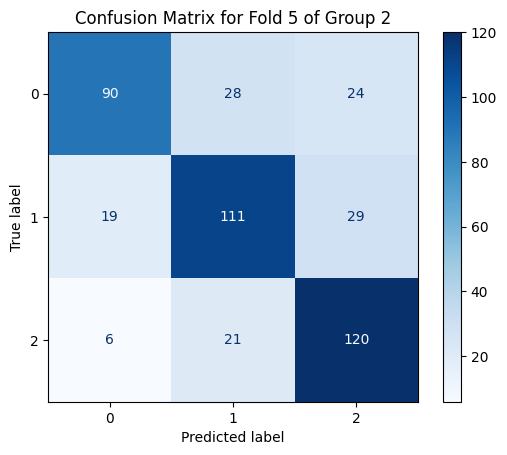


Training and Evaluating on Group 3

Training on Fold 1 of Group 3
Classification Report for Fold 1 of Group 3:
              precision    recall  f1-score   support

     Dropout       0.81      0.68      0.74       142
    Enrolled       0.62      0.70      0.66       159
    Graduate       0.73      0.74      0.73       148

    accuracy                           0.71       449
   macro avg       0.72      0.71      0.71       449
weighted avg       0.71      0.71      0.71       449



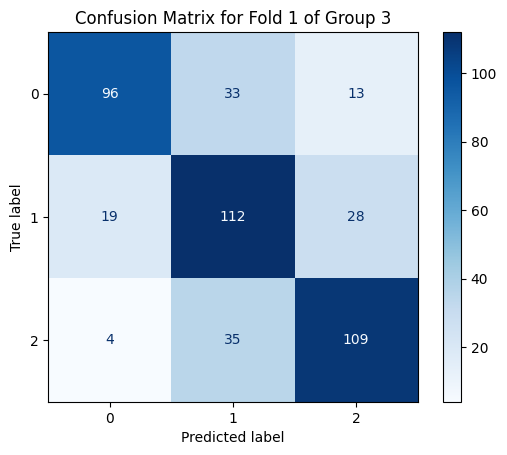


Training on Fold 2 of Group 3
Classification Report for Fold 2 of Group 3:
              precision    recall  f1-score   support

     Dropout       0.82      0.61      0.70       142
    Enrolled       0.57      0.67      0.62       159
    Graduate       0.70      0.74      0.72       148

    accuracy                           0.67       449
   macro avg       0.70      0.67      0.68       449
weighted avg       0.69      0.67      0.68       449



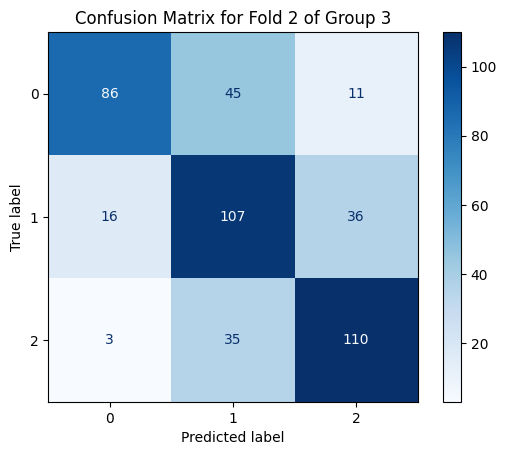


Training on Fold 3 of Group 3
Classification Report for Fold 3 of Group 3:
              precision    recall  f1-score   support

     Dropout       0.81      0.64      0.71       143
    Enrolled       0.64      0.71      0.67       158
    Graduate       0.73      0.80      0.77       147

    accuracy                           0.72       448
   macro avg       0.73      0.72      0.72       448
weighted avg       0.73      0.72      0.72       448



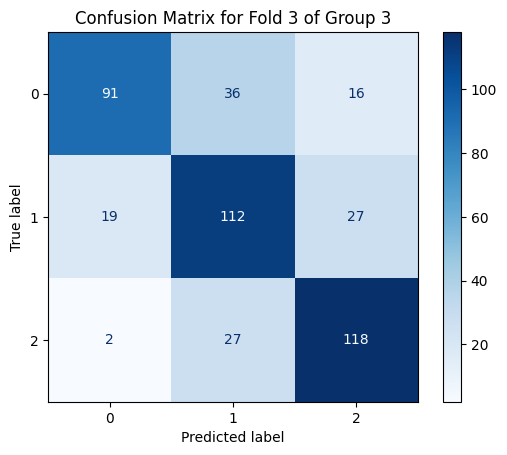


Training on Fold 4 of Group 3
Classification Report for Fold 4 of Group 3:
              precision    recall  f1-score   support

     Dropout       0.89      0.75      0.81       142
    Enrolled       0.69      0.75      0.72       159
    Graduate       0.77      0.82      0.79       147

    accuracy                           0.77       448
   macro avg       0.78      0.77      0.77       448
weighted avg       0.78      0.77      0.77       448



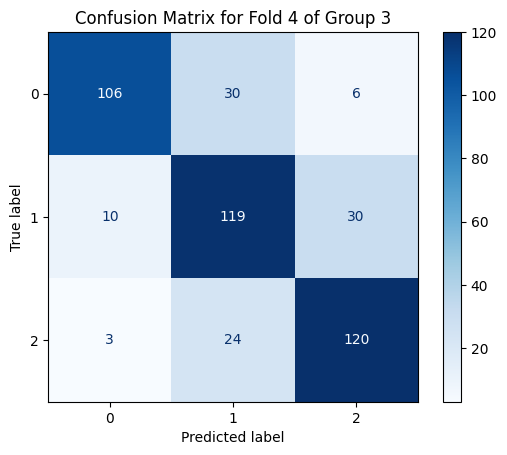


Training on Fold 5 of Group 3
Classification Report for Fold 5 of Group 3:
              precision    recall  f1-score   support

     Dropout       0.82      0.69      0.75       142
    Enrolled       0.64      0.73      0.68       159
    Graduate       0.77      0.78      0.77       147

    accuracy                           0.73       448
   macro avg       0.74      0.73      0.74       448
weighted avg       0.74      0.73      0.73       448



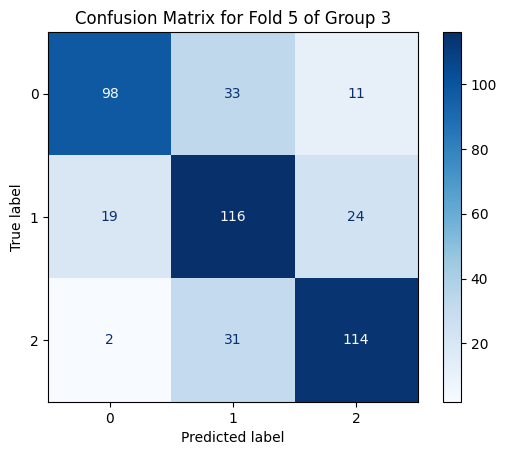

NameError: name 'explainer' is not defined

In [93]:

import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import shap  # Import SHAP library

# Define the columns to use, excluding original and grouped columns
all_features = [
    'Marital_status', 'Application_order', "Mother's_qualification",
    "Father's_qualification", 'Previous_qualification',
    'Application_mode', 'Course', "Mother's_occupation",
    "Father's_occupation", 'Daytime/evening_attendance', 
    'Previous_qualification_(grade)', 'Admission_grade',
    'Displaced', 'Educational_special_needs', 'Debtor', 
    'Tuition_fees_up_to_date', 'Gender', 'Scholarship_holder', 
    'Age_at_enrollment', 'International',
    'Curricular_units_1st_sem_(credited)', 'Curricular_units_1st_sem_(enrolled)',
    'Curricular_units_1st_sem_(evaluations)', 'Curricular_units_1st_sem_(approved)',
    'Curricular_units_1st_sem_(grade)', 'Curricular_units_1st_sem_(without_evaluations)',
    'Curricular_units_2nd_sem_(credited)', 'Curricular_units_2nd_sem_(enrolled)',
    'Curricular_units_2nd_sem_(evaluations)', 'Curricular_units_2nd_sem_(approved)',
    'Curricular_units_2nd_sem_(grade)', 'Curricular_units_2nd_sem_(without_evaluations)',
    'Unemployment_rate', 'Inflation_rate', 'GDP',
]

# Split data into each class subset
graduate_data = data[data['Target'] == 2]
dropout_data = data[data['Target'] == 0]
enrolled_data = data[data['Target'] == 1]

# Define the split groups for Graduates and Dropouts
graduate_splits = [graduate_data.iloc[:736], graduate_data.iloc[736:1472], graduate_data.iloc[1472:]]
dropout_splits = [dropout_data.iloc[:711], dropout_data.iloc[711:]]

# Define each group combination
groups = {
    "Group 1": pd.concat([graduate_splits[0], dropout_splits[0], enrolled_data]),
    "Group 2": pd.concat([graduate_splits[1], dropout_splits[1], enrolled_data]),
    "Group 3": pd.concat([graduate_splits[2], dropout_splits[0], enrolled_data])
}

# Train and evaluate Random Forest model on each group using stratified 5-fold cross-validation
for group_name, group_data in groups.items():
    print(f"\nTraining and Evaluating on {group_name}")

    # Separate features and target
    X = group_data[all_features]
    y = group_data['Target']

    # Initialize stratified K-Fold cross-validator
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    # Initialize an empty list to store evaluation results
    evaluation_reports = []

    # Start stratified 5-fold cross-validation
    for fold, (train_idx, test_idx) in enumerate(skf.split(X, y)):
        print(f"\nTraining on Fold {fold + 1} of {group_name}")

        # Split data into training and testing sets for this fold
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

        # Initialize and train Random Forest model
        model = RandomForestClassifier(n_estimators=100, max_depth=10, random_state=42)
        model.fit(X_train, y_train)

        # Make predictions and evaluate the model
        y_pred = model.predict(X_test)
        report = classification_report(y_test, y_pred, target_names=['Dropout', 'Enrolled', 'Graduate'])
        print(f"Classification Report for Fold {fold + 1} of {group_name}:\n{report}")

        # Compute confusion matrix
        cm = confusion_matrix(y_test, y_pred)

        # Plot confusion matrix
        disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
        disp.plot(cmap=plt.cm.Blues)
        plt.title(f'Confusion Matrix for Fold {fold + 1} of {group_name}')
        plt.show()


# SHAP Analysis

# Compute SHAP values
shap_values = explainer.shap_values(X_sample)

# Determine the number of classes
n_classes = shap_values.shape[2] 
print(f"Number of classes: {n_classes}")

# Loop through each class and plot the SHAP summary plot
for i in range(n_classes):
    print(f"SHAP Summary Plot for Class {model.classes_[i]}:")
    # Extract SHAP values for class i
    shap_values_class_i = shap_values[:, :, i]
    
    # Verify that shapes match
    assert shap_values_class_i.shape == X_sample.shape, f"Shape mismatch for class {i}"
    
    # Plot the SHAP summary plot
    shap.summary_plot(
        shap_values_class_i,
        X_sample,
        plot_type='bar',
        class_names=[str(model.classes_[i])]
    )

# RANDOM FOREST & RFE ( ORIGINAL FEUTURES/ GROUP SPLITTING/ 5 FOLD

### Σύγκριση Απόδοσης Random Forest με και χωρίς RFE

#### Αποτελέσματα Χωρίς RFE
Χρησιμοποιώντας όλα τα χαρακτηριστικά, τα αποτελέσματα για τον Random Forest αλγόριθμο έδειξαν:

| Κατηγορία      | Precision      | Recall         | F1-score       | Παρατηρήσεις                                   |
|----------------|----------------|----------------|----------------|------------------------------------------------|
| **Dropout**    | 0.77 - 0.88    | 0.63 - 0.75    | 0.70 - 0.81    | Ικανοποιητική απόδοση στην πρόβλεψη εγκατάλειψης. |
| **Enrolled**   | 0.57 - 0.71    | 0.64 - 0.77    | 0.62 - 0.74    | Δυσκολία στη διάκριση της κατηγορίας "Enrolled". |
| **Graduate**   | 0.67 - 0.80    | 0.67 - 0.85    | 0.71 - 0.83    | Υψηλή απόδοση στην πρόβλεψη αποφοίτησης.        |
| **Accuracy**   | 0.68 - 0.79    | -              | -              | Σταθερή απόδοση σε όλα τα folds.                |

#### Αποτελέσματα με RFE
Με τη χρήση του RFE για επιλογή των 20 πιο σημαντικών χαρακτηριστικών, η απόδοση του Random Forest αλγόριθμου ήταν η εξής:

| Κατηγορία      | Precision      | Recall         | F1-score       | Παρατηρήσεις                                   |
|----------------|----------------|----------------|----------------|------------------------------------------------|
| **Dropout**    | 0.79 - 0.89    | 0.62 - 0.70    | 0.71 - 0.80    | Ελαφρά βελτίωση στην απόδοση ανά κατηγορία σε ορισμένα folds. |
| **Enrolled**   | 0.58 - 0.71    | 0.65 - 0.73    | 0.63 - 0.72    | Μειωμένη ακρίβεια αλλά σταθερότητα.             |
| **Graduate**   | 0.68 - 0.78    | 0.71 - 0.84    | 0.70 - 0.81    | Καλή απόδοση στην πρόβλεψη αποφοίτησης, παρόμοια με χωρίς RFE. |
| **Accuracy**   | 0.69 - 0.77    | -              | -              | Σταθερή απόδοση σε όλα τα folds, με ελαφρές διακυμάνσεις. |

#### Σύγκριση και Συμπεράσματα
- **Ακρίβεια**: Η διαφορά στην ακρίβεια μεταξύ των δύο προσεγγίσεων είναι ελάχιστη. Χωρίς RFE, η ακρίβεια κυμαίνεται από 0.68 έως 0.79, ενώ με RFE είναι ελαφρώς πιο σταθερή μεταξύ 0.69 και 0.77.
- **Χαρακτηριστικά**: Με τη χρήση του RFE, επιλέχθηκαν τα πιο σημαντικά χαρακτηριστικά, κάτι που απλοποίησε το μοντέλο και ενδεχομένως μείωσε την υπερεκπαίδευση (overfitting) χωρίς να μειώσει σημαντικά την απόδοση.
- **Κατηγορία "Enrolled"**: Και στις δύο προσεγγίσεις, η κατηγορία "Enrolled" συνεχίζει να παρουσιάζει τις μεγαλύτερες δυσκολίες για ταξινόμηση, με μικρές βελτιώσεις όταν χρησιμοποιήθηκε το RFE.




Training and Evaluating on Group 1
Selected Features:
Index(['Mother's_qualification', 'Father's_qualification', 'Course', 'Mother's_occupation', 'Father's_occupation',
       'Previous_qualification_(grade)', 'Admission_grade', 'Tuition_fees_up_to_date', 'Age_at_enrollment',
       'Curricular_units_1st_sem_(enrolled)', 'Curricular_units_1st_sem_(evaluations)',
       'Curricular_units_1st_sem_(approved)', 'Curricular_units_1st_sem_(grade)',
       'Curricular_units_2nd_sem_(enrolled)', 'Curricular_units_2nd_sem_(evaluations)',
       'Curricular_units_2nd_sem_(approved)', 'Curricular_units_2nd_sem_(grade)', 'Unemployment_rate',
       'Inflation_rate', 'GDP'],
      dtype='object')

Training on Fold 1 of Group 1
Classification Report for Fold 1 of Group 1:
              precision    recall  f1-score   support

     Dropout       0.83      0.68      0.75       142
    Enrolled       0.65      0.69      0.67       159
    Graduate       0.73      0.80      0.76       148

    accuracy

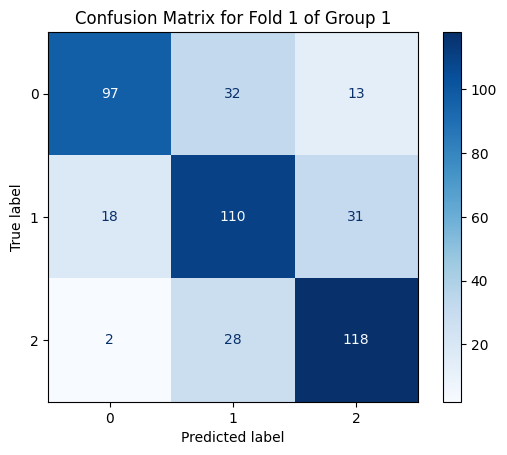


Training on Fold 2 of Group 1
Classification Report for Fold 2 of Group 1:
              precision    recall  f1-score   support

     Dropout       0.89      0.62      0.73       143
    Enrolled       0.58      0.72      0.64       158
    Graduate       0.72      0.75      0.73       147

    accuracy                           0.69       448
   macro avg       0.73      0.69      0.70       448
weighted avg       0.72      0.69      0.70       448



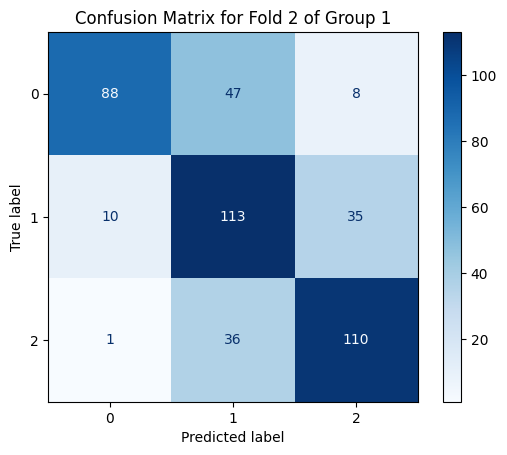


Training on Fold 3 of Group 1
Classification Report for Fold 3 of Group 1:
              precision    recall  f1-score   support

     Dropout       0.82      0.63      0.71       142
    Enrolled       0.62      0.65      0.63       159
    Graduate       0.68      0.80      0.74       147

    accuracy                           0.69       448
   macro avg       0.71      0.69      0.69       448
weighted avg       0.70      0.69      0.69       448



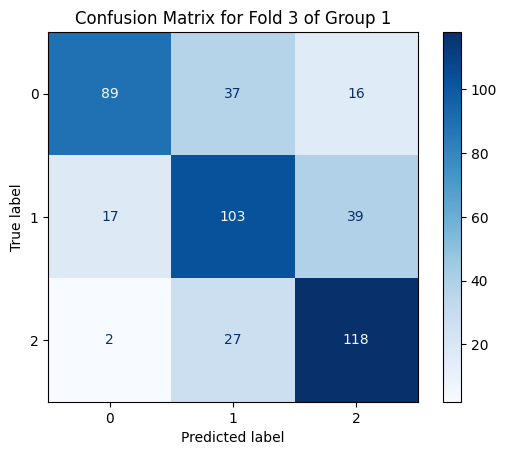


Training on Fold 4 of Group 1
Classification Report for Fold 4 of Group 1:
              precision    recall  f1-score   support

     Dropout       0.85      0.75      0.80       142
    Enrolled       0.71      0.73      0.72       159
    Graduate       0.78      0.84      0.81       147

    accuracy                           0.77       448
   macro avg       0.78      0.77      0.77       448
weighted avg       0.78      0.77      0.77       448



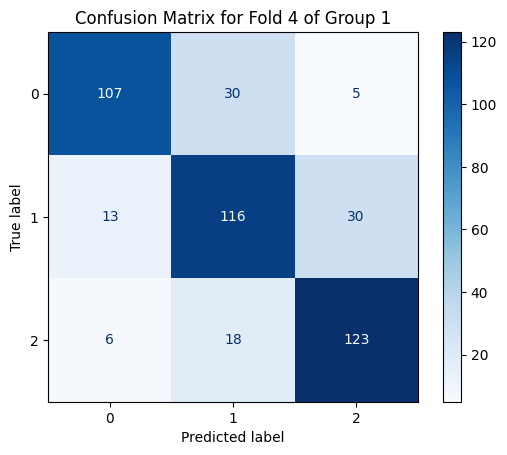


Training on Fold 5 of Group 1
Classification Report for Fold 5 of Group 1:
              precision    recall  f1-score   support

     Dropout       0.84      0.70      0.76       142
    Enrolled       0.65      0.69      0.67       159
    Graduate       0.72      0.78      0.75       147

    accuracy                           0.72       448
   macro avg       0.73      0.72      0.73       448
weighted avg       0.73      0.72      0.72       448



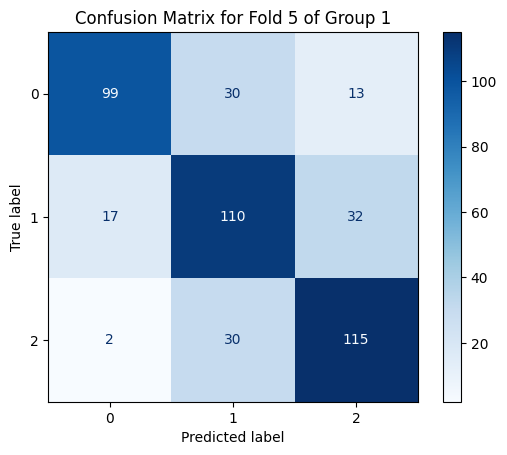


Summary of 5-Fold Cross-Validation Results for Group 1:
Classification Report for Fold 1:
              precision    recall  f1-score   support

     Dropout       0.83      0.68      0.75       142
    Enrolled       0.65      0.69      0.67       159
    Graduate       0.73      0.80      0.76       148

    accuracy                           0.72       449
   macro avg       0.73      0.72      0.73       449
weighted avg       0.73      0.72      0.72       449

Classification Report for Fold 2:
              precision    recall  f1-score   support

     Dropout       0.89      0.62      0.73       143
    Enrolled       0.58      0.72      0.64       158
    Graduate       0.72      0.75      0.73       147

    accuracy                           0.69       448
   macro avg       0.73      0.69      0.70       448
weighted avg       0.72      0.69      0.70       448

Classification Report for Fold 3:
              precision    recall  f1-score   support

     Dropout       0.82 

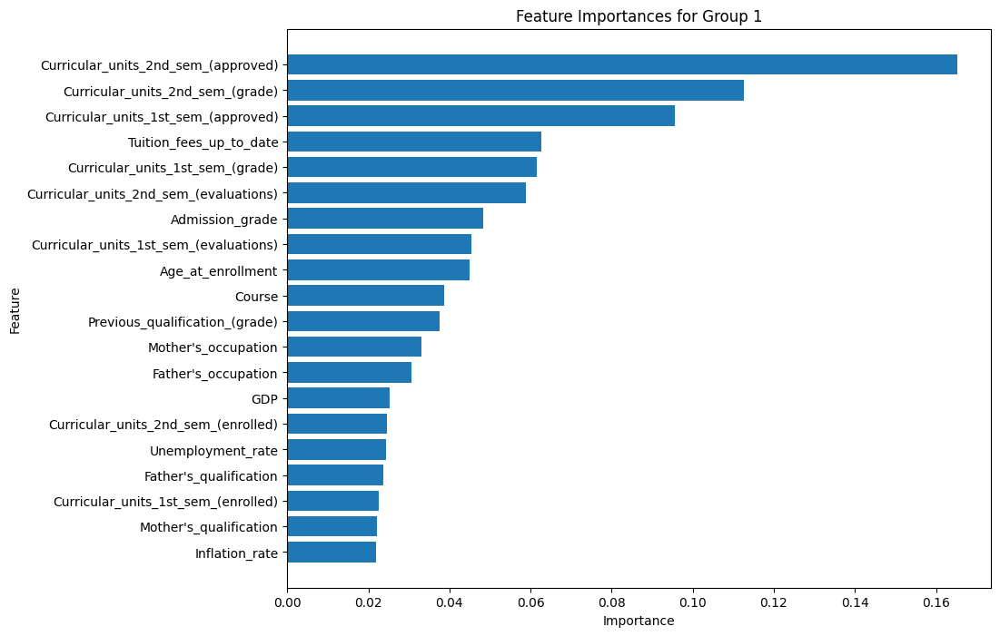


Training and Evaluating on Group 2
Selected Features:
Index(['Mother's_qualification', 'Father's_qualification', 'Application_mode', 'Course', 'Mother's_occupation',
       'Father's_occupation', 'Previous_qualification_(grade)', 'Admission_grade', 'Tuition_fees_up_to_date',
       'Age_at_enrollment', 'Curricular_units_1st_sem_(enrolled)', 'Curricular_units_1st_sem_(evaluations)',
       'Curricular_units_1st_sem_(approved)', 'Curricular_units_1st_sem_(grade)',
       'Curricular_units_2nd_sem_(enrolled)', 'Curricular_units_2nd_sem_(evaluations)',
       'Curricular_units_2nd_sem_(approved)', 'Curricular_units_2nd_sem_(grade)', 'Unemployment_rate', 'GDP'],
      dtype='object')

Training on Fold 1 of Group 2
Classification Report for Fold 1 of Group 2:
              precision    recall  f1-score   support

     Dropout       0.81      0.64      0.71       142
    Enrolled       0.65      0.68      0.66       158
    Graduate       0.72      0.82      0.77       148

    accuracy     

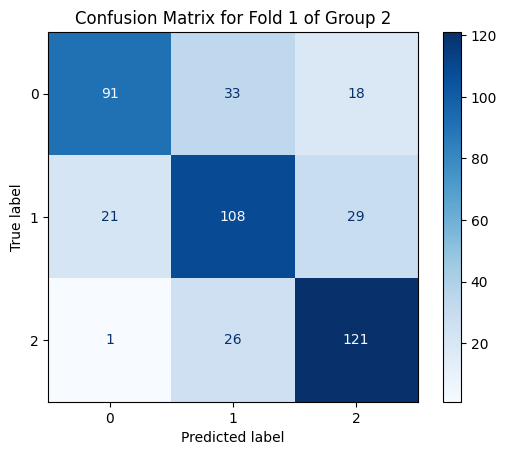


Training on Fold 2 of Group 2
Classification Report for Fold 2 of Group 2:
              precision    recall  f1-score   support

     Dropout       0.83      0.67      0.74       142
    Enrolled       0.62      0.72      0.66       159
    Graduate       0.70      0.71      0.70       147

    accuracy                           0.70       448
   macro avg       0.72      0.70      0.70       448
weighted avg       0.71      0.70      0.70       448



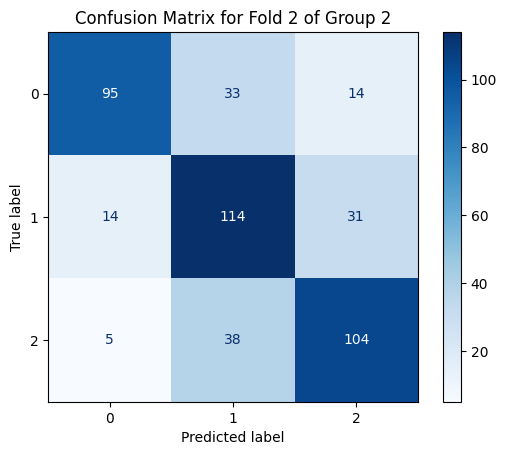


Training on Fold 3 of Group 2
Classification Report for Fold 3 of Group 2:
              precision    recall  f1-score   support

     Dropout       0.79      0.68      0.73       142
    Enrolled       0.63      0.65      0.64       159
    Graduate       0.69      0.76      0.72       147

    accuracy                           0.69       448
   macro avg       0.70      0.70      0.70       448
weighted avg       0.70      0.69      0.69       448



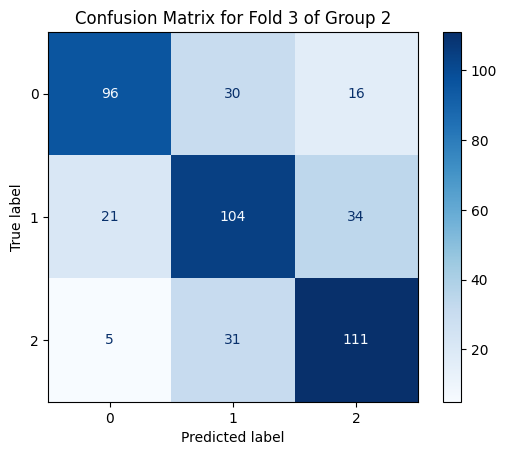


Training on Fold 4 of Group 2
Classification Report for Fold 4 of Group 2:
              precision    recall  f1-score   support

     Dropout       0.84      0.65      0.74       142
    Enrolled       0.63      0.73      0.68       159
    Graduate       0.75      0.78      0.76       147

    accuracy                           0.72       448
   macro avg       0.74      0.72      0.73       448
weighted avg       0.74      0.72      0.72       448



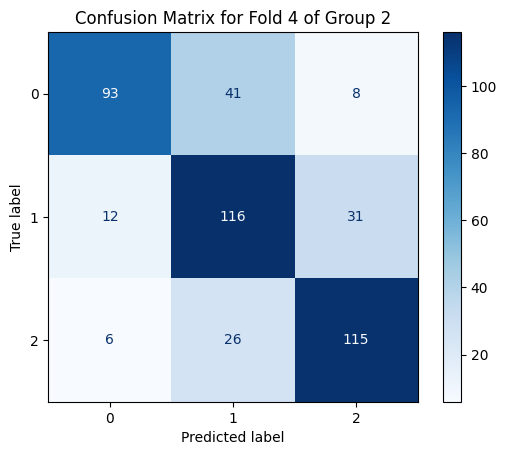


Training on Fold 5 of Group 2
Classification Report for Fold 5 of Group 2:
              precision    recall  f1-score   support

     Dropout       0.79      0.66      0.72       142
    Enrolled       0.70      0.70      0.70       159
    Graduate       0.70      0.81      0.75       147

    accuracy                           0.72       448
   macro avg       0.73      0.72      0.72       448
weighted avg       0.73      0.72      0.72       448



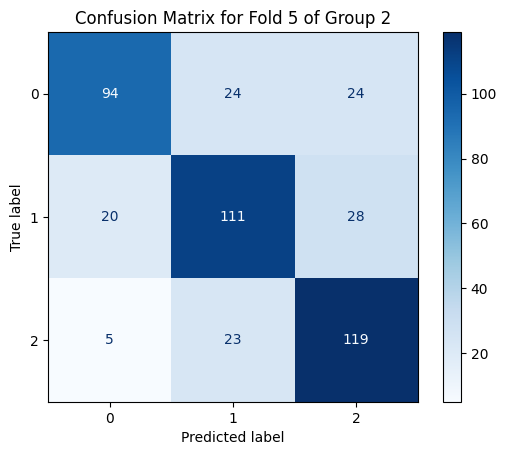


Summary of 5-Fold Cross-Validation Results for Group 2:
Classification Report for Fold 1:
              precision    recall  f1-score   support

     Dropout       0.81      0.64      0.71       142
    Enrolled       0.65      0.68      0.66       158
    Graduate       0.72      0.82      0.77       148

    accuracy                           0.71       448
   macro avg       0.72      0.71      0.71       448
weighted avg       0.72      0.71      0.71       448

Classification Report for Fold 2:
              precision    recall  f1-score   support

     Dropout       0.83      0.67      0.74       142
    Enrolled       0.62      0.72      0.66       159
    Graduate       0.70      0.71      0.70       147

    accuracy                           0.70       448
   macro avg       0.72      0.70      0.70       448
weighted avg       0.71      0.70      0.70       448

Classification Report for Fold 3:
              precision    recall  f1-score   support

     Dropout       0.79 

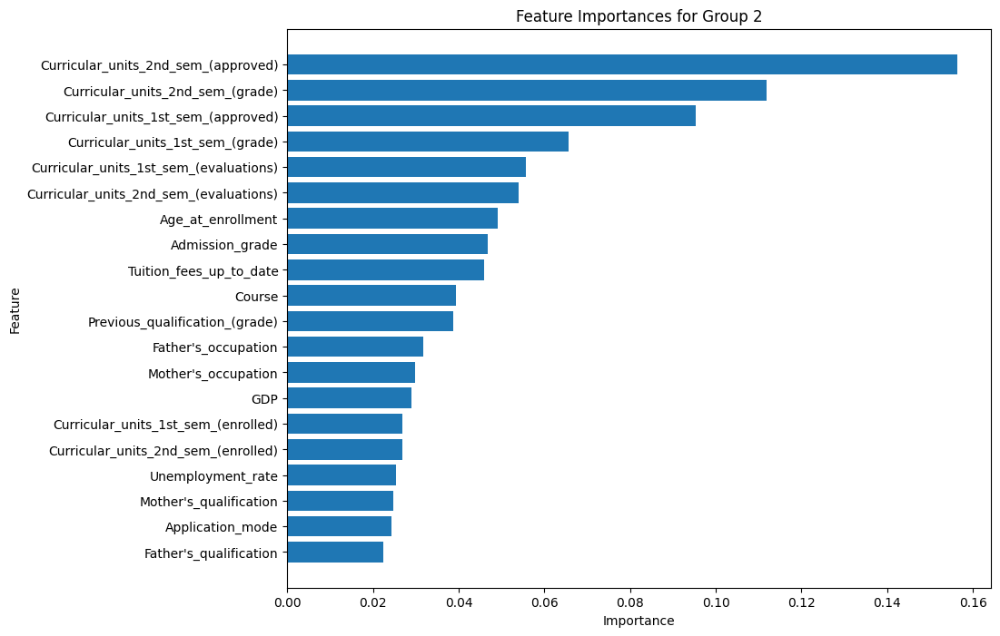


Training and Evaluating on Group 3
Selected Features:
Index(['Father's_qualification', 'Course', 'Mother's_occupation', 'Father's_occupation',
       'Previous_qualification_(grade)', 'Admission_grade', 'Tuition_fees_up_to_date', 'Scholarship_holder',
       'Age_at_enrollment', 'Curricular_units_1st_sem_(enrolled)', 'Curricular_units_1st_sem_(evaluations)',
       'Curricular_units_1st_sem_(approved)', 'Curricular_units_1st_sem_(grade)',
       'Curricular_units_2nd_sem_(enrolled)', 'Curricular_units_2nd_sem_(evaluations)',
       'Curricular_units_2nd_sem_(approved)', 'Curricular_units_2nd_sem_(grade)', 'Unemployment_rate',
       'Inflation_rate', 'GDP'],
      dtype='object')

Training on Fold 1 of Group 3
Classification Report for Fold 1 of Group 3:
              precision    recall  f1-score   support

     Dropout       0.82      0.65      0.73       142
    Enrolled       0.61      0.71      0.66       159
    Graduate       0.73      0.74      0.73       148

    accuracy    

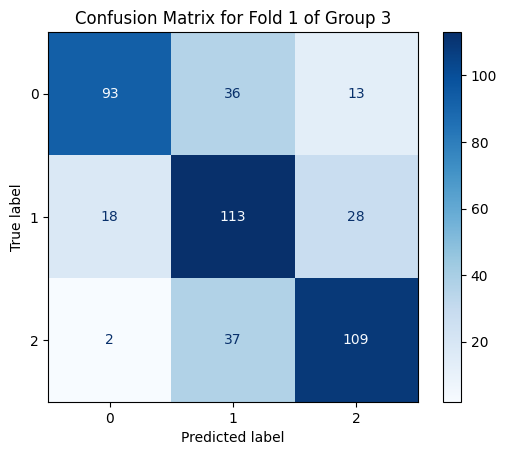


Training on Fold 2 of Group 3
Classification Report for Fold 2 of Group 3:
              precision    recall  f1-score   support

     Dropout       0.87      0.63      0.73       142
    Enrolled       0.60      0.69      0.64       159
    Graduate       0.70      0.76      0.73       148

    accuracy                           0.70       449
   macro avg       0.72      0.70      0.70       449
weighted avg       0.72      0.70      0.70       449



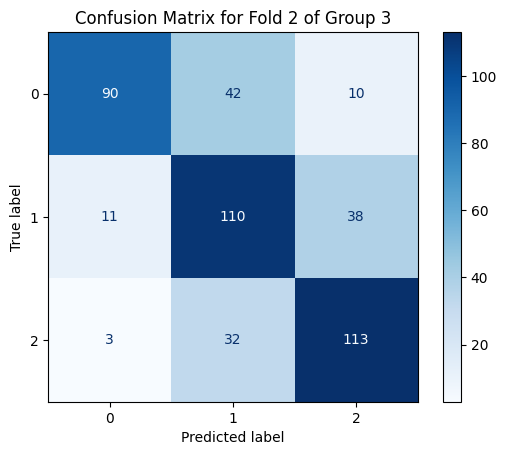


Training on Fold 3 of Group 3
Classification Report for Fold 3 of Group 3:
              precision    recall  f1-score   support

     Dropout       0.81      0.64      0.71       143
    Enrolled       0.60      0.68      0.64       158
    Graduate       0.71      0.76      0.74       147

    accuracy                           0.69       448
   macro avg       0.71      0.69      0.70       448
weighted avg       0.71      0.69      0.70       448



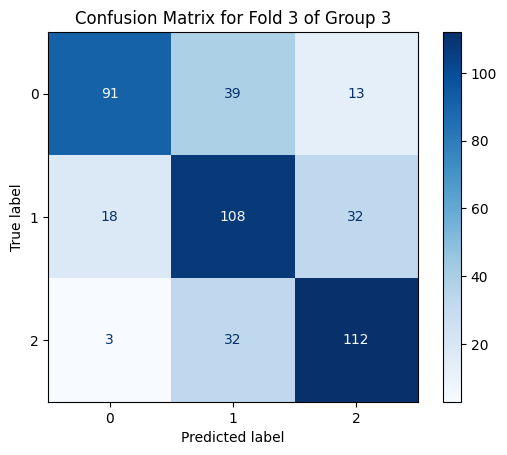


Training on Fold 4 of Group 3
Classification Report for Fold 4 of Group 3:
              precision    recall  f1-score   support

     Dropout       0.88      0.74      0.80       142
    Enrolled       0.65      0.72      0.69       159
    Graduate       0.76      0.78      0.77       147

    accuracy                           0.75       448
   macro avg       0.76      0.75      0.75       448
weighted avg       0.76      0.75      0.75       448



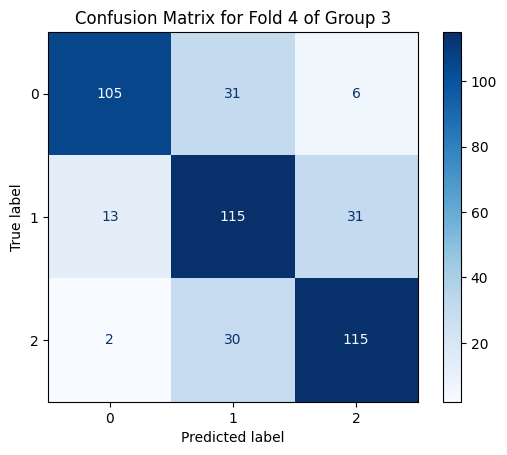


Training on Fold 5 of Group 3
Classification Report for Fold 5 of Group 3:
              precision    recall  f1-score   support

     Dropout       0.82      0.70      0.75       142
    Enrolled       0.65      0.70      0.67       159
    Graduate       0.74      0.78      0.75       147

    accuracy                           0.72       448
   macro avg       0.73      0.72      0.73       448
weighted avg       0.73      0.72      0.72       448



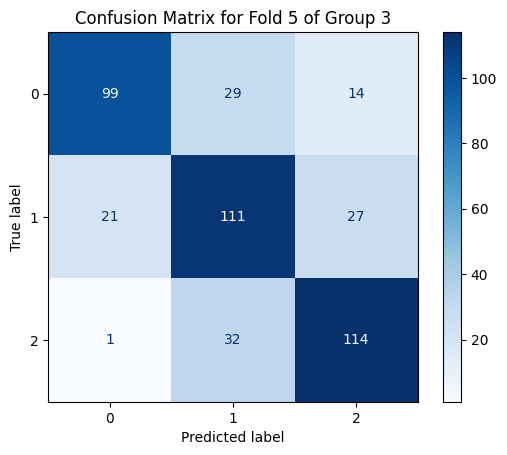


Summary of 5-Fold Cross-Validation Results for Group 3:
Classification Report for Fold 1:
              precision    recall  f1-score   support

     Dropout       0.82      0.65      0.73       142
    Enrolled       0.61      0.71      0.66       159
    Graduate       0.73      0.74      0.73       148

    accuracy                           0.70       449
   macro avg       0.72      0.70      0.71       449
weighted avg       0.71      0.70      0.70       449

Classification Report for Fold 2:
              precision    recall  f1-score   support

     Dropout       0.87      0.63      0.73       142
    Enrolled       0.60      0.69      0.64       159
    Graduate       0.70      0.76      0.73       148

    accuracy                           0.70       449
   macro avg       0.72      0.70      0.70       449
weighted avg       0.72      0.70      0.70       449

Classification Report for Fold 3:
              precision    recall  f1-score   support

     Dropout       0.81 

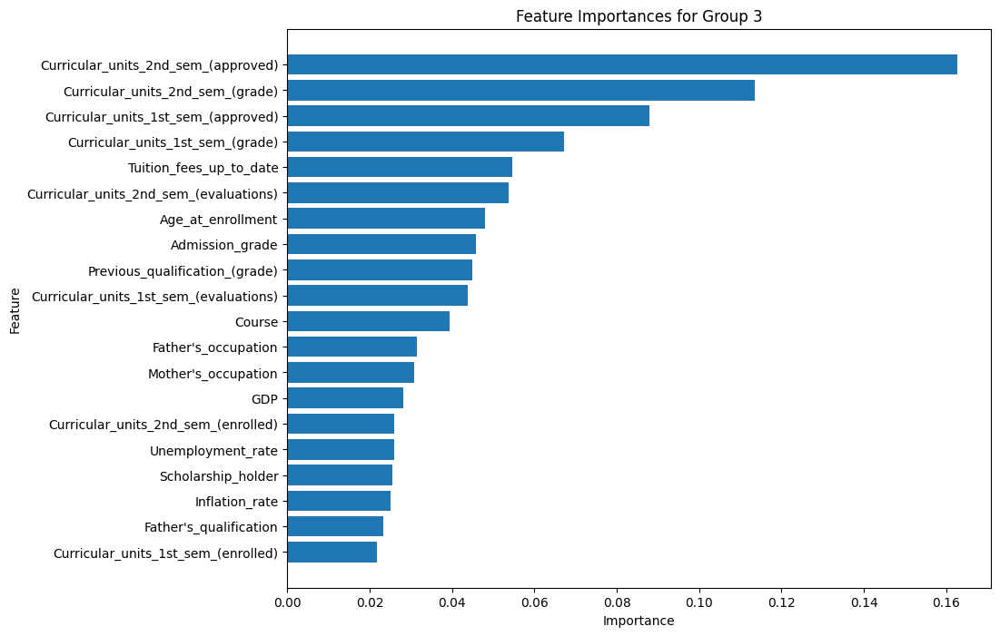

In [96]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import RFE
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Define the columns to use, excluding original and grouped columns
all_features = [
    'Marital_status', 'Application_order', "Mother's_qualification", 
    "Father's_qualification", 'Previous_qualification', 'Application_mode', 
    'Course', "Mother's_occupation", "Father's_occupation",
    'Daytime/evening_attendance', 'Previous_qualification_(grade)', 'Admission_grade',
    'Displaced', 'Educational_special_needs', 'Debtor', 'Tuition_fees_up_to_date',
    'Gender', 'Scholarship_holder', 'Age_at_enrollment', 'International',
    'Curricular_units_1st_sem_(credited)', 'Curricular_units_1st_sem_(enrolled)',
    'Curricular_units_1st_sem_(evaluations)', 'Curricular_units_1st_sem_(approved)',
    'Curricular_units_1st_sem_(grade)', 'Curricular_units_1st_sem_(without_evaluations)',
    'Curricular_units_2nd_sem_(credited)', 'Curricular_units_2nd_sem_(enrolled)',
    'Curricular_units_2nd_sem_(evaluations)', 'Curricular_units_2nd_sem_(approved)',
    'Curricular_units_2nd_sem_(grade)', 'Curricular_units_2nd_sem_(without_evaluations)',
    'Unemployment_rate', 'Inflation_rate', 'GDP'
]

# Split data into each class subset
graduate_data = data[data['Target'] == 2]
dropout_data = data[data['Target'] == 0]
enrolled_data = data[data['Target'] == 1]

# Define the split groups for Graduates and Dropouts
graduate_splits = [graduate_data.iloc[:736], graduate_data.iloc[736:1472], graduate_data.iloc[1472:]]
dropout_splits = [dropout_data.iloc[:711], dropout_data.iloc[711:]]

# Define each group combination
groups = {
    "Group 1": pd.concat([graduate_splits[0], dropout_splits[0], enrolled_data]),
    "Group 2": pd.concat([graduate_splits[1], dropout_splits[1], enrolled_data]),
    "Group 3": pd.concat([graduate_splits[2], dropout_splits[0], enrolled_data])
}

# Train and evaluate Random Forest model on each group using stratified 5-fold cross-validation
for group_name, group_data in groups.items():
    print(f"\nTraining and Evaluating on {group_name}")

    # Separate features and target
    X = group_data[all_features]
    y = group_data['Target']

    # Initialize the Random Forest model
    estimator = RandomForestClassifier(n_estimators=100, max_depth=10, random_state=42)

    # Initialize RFE
    n_features_to_select = 20
    rfe = RFE(estimator=estimator, n_features_to_select=n_features_to_select, step=1)

    # Fit RFE on the data
    rfe.fit(X, y)

    # Get the selected features
    selected_features = X.columns[rfe.support_]
    print("Selected Features:")
    print(selected_features)

    # Transform the data to keep only selected features
    X_selected = X[selected_features]

    # Initialize stratified K-Fold cross-validator
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    # Initialize an empty list to store evaluation results
    evaluation_reports = []

    # Start stratified 5-fold cross-validation
    for fold, (train_idx, test_idx) in enumerate(skf.split(X_selected, y)):
        print(f"\nTraining on Fold {fold + 1} of {group_name}")

        # Split data into training and testing sets for this fold
        X_train, X_test = X_selected.iloc[train_idx], X_selected.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

        # Initialize and train Random Forest model
        model = RandomForestClassifier(n_estimators=100, max_depth=10, random_state=42)
        model.fit(X_train, y_train)

       # Make predictions and evaluate the model
        y_pred = model.predict(X_test)
        report = classification_report(y_test, y_pred, target_names=['Dropout', 'Enrolled', 'Graduate'])
        print(f"Classification Report for Fold {fold + 1} of {group_name}:\n{report}")

        # Compute confusion matrix
        cm = confusion_matrix(y_test, y_pred)

        # Plot confusion matrix
        disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
        disp.plot(cmap=plt.cm.Blues)
        plt.title(f'Confusion Matrix for Fold {fold + 1} of {group_name}')
        plt.show()

        # Append the report to the list for further analysis
        evaluation_reports.append(report)

    # Summary of the reports after all folds have been completed for each group
    print(f"\nSummary of 5-Fold Cross-Validation Results for {group_name}:")
    for i, report in enumerate(evaluation_reports, 1):
        print(f"Classification Report for Fold {i}:\n{report}")

    # Plot feature importances
    feature_importances = model.feature_importances_
    sorted_indices = feature_importances.argsort()[::-1]
    plt.figure(figsize=(10, 8))
    plt.barh([selected_features[i] for i in sorted_indices], feature_importances[sorted_indices])
    plt.xlabel('Importance')
    plt.ylabel('Feature')
    plt.title(f'Feature Importances for {group_name}')
    plt.gca().invert_yaxis()
    plt.show()

# RANDOM FOREST - Original Feutures dropout Marital_status Educational Special Needs International Daytime/Evening Attendance Curricular_units_1st_sem_(without_evaluations) Curricular_units_2nd_sem_(without_evaluations)- controlled group splits with 5-Fold validation

## Σύνοψη Αποτελεσμάτων Ταξινόμησης - Random Forest με drop out last 5 important feutures

| Κατηγορία       | Precision         | Recall           | F1-score        | Παρατηρήσεις                                                                 |
|-----------------|-------------------|------------------|-----------------|-------------------------------------------------------------------------------|
| **Dropout**     | 0.80 - 0.87       | 0.60 - 0.75     | 0.71 - 0.81     | Ικανοποιητική απόδοση στην πρόβλεψη εγκατάλειψης με σταθερές τιμές στα folds. |
| **Enrolled**    | 0.56 - 0.71       | 0.65 - 0.74     | 0.62 - 0.72     | Μειωμένη ακρίβεια και δυσκολία στη διάκριση αυτής της κατηγορίας.            |
| **Graduate**    | 0.68 - 0.79       | 0.69 - 0.84     | 0.72 - 0.78     | Υψηλή απόδοση στην πρόβλεψη αποφοίτησης, σταθερή ανάμεσα στα folds.          |

### Ακρίβεια και Σταθερότητα
- **Ακρίβεια**: Η ακρίβεια κυμαίνεται μεταξύ 0.68 και 0.77 σε όλα τα folds, υποδεικνύοντας μια σταθερή απόδοση.
- **Σταθερότητα**: Παρατηρούνται ελαφρές διακυμάνσεις στις μετρήσεις ανά fold, με την κατηγορία "Enrolled" να αποτελεί την πιο δύσκολη κατηγορία για ταξινόμηση.

### Συνολικές Παρατηρήσεις
- Το μοντέλο επιδεικνύει καλή απόδοση στη διάκριση μεταξύ των κατηγοριών "Dropout" και "Graduate" σε όλα τα folds.
- Η κατηγορία "Enrolled" παρουσιάζει χαμηλότερη ακρίβεια και F1-score, γεγονός που υποδηλώνει ότι αυτή η κατηγορία παραμένει η πιο δύσκολη για σωστή ταξινόμηση, ακόμα και με την χρήση των αρχικών χαρακτηριστικών.
- Το μοντέλο με τα αρχικά χαρακτηριστικά παραμένει σταθερό ανάμεσα στις ομάδες με ελαφρές διαφοροποιήσεις, δείχνοντας ότι η επιλογή χαρακτηριστικών μπορεί να βελτιώσει την ακρίβεια για ορισμένες κατηγορίες, αν και η συνολική βελτίωση παραμένει περιορισμένη.




Training and Evaluating on Group 1

Training on Fold 1 of Group 1
Classification Report for Fold 1 of Group 1:
              precision    recall  f1-score   support

     Dropout       0.82      0.68      0.75       142
    Enrolled       0.63      0.65      0.64       159
    Graduate       0.72      0.80      0.76       148

    accuracy                           0.71       449
   macro avg       0.72      0.71      0.72       449
weighted avg       0.72      0.71      0.71       449



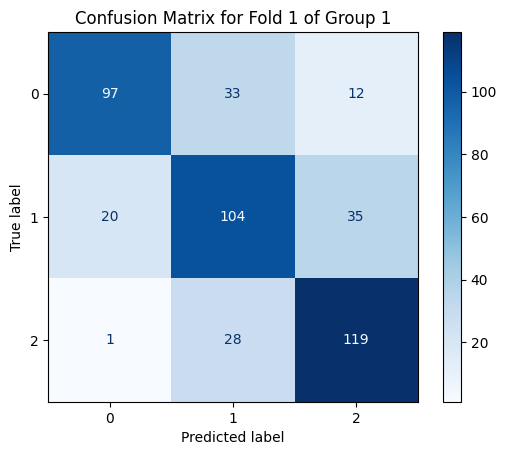


Training on Fold 2 of Group 1
Classification Report for Fold 2 of Group 1:
              precision    recall  f1-score   support

     Dropout       0.86      0.60      0.71       143
    Enrolled       0.56      0.70      0.62       158
    Graduate       0.72      0.73      0.73       147

    accuracy                           0.68       448
   macro avg       0.71      0.68      0.69       448
weighted avg       0.71      0.68      0.68       448



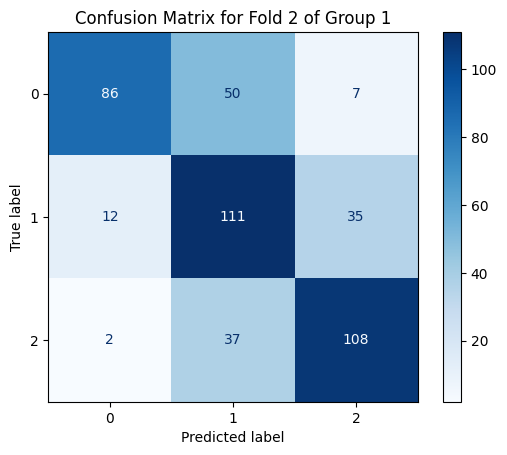


Training on Fold 3 of Group 1
Classification Report for Fold 3 of Group 1:
              precision    recall  f1-score   support

     Dropout       0.83      0.64      0.72       142
    Enrolled       0.61      0.66      0.63       159
    Graduate       0.68      0.77      0.72       147

    accuracy                           0.69       448
   macro avg       0.71      0.69      0.69       448
weighted avg       0.70      0.69      0.69       448



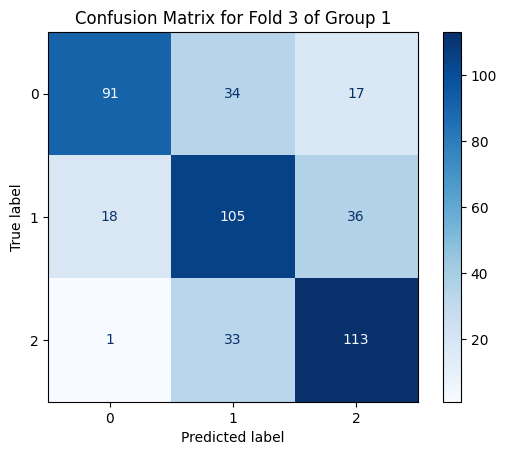


Training on Fold 4 of Group 1
Classification Report for Fold 4 of Group 1:
              precision    recall  f1-score   support

     Dropout       0.83      0.74      0.78       142
    Enrolled       0.70      0.73      0.71       159
    Graduate       0.79      0.84      0.81       147

    accuracy                           0.77       448
   macro avg       0.77      0.77      0.77       448
weighted avg       0.77      0.77      0.77       448



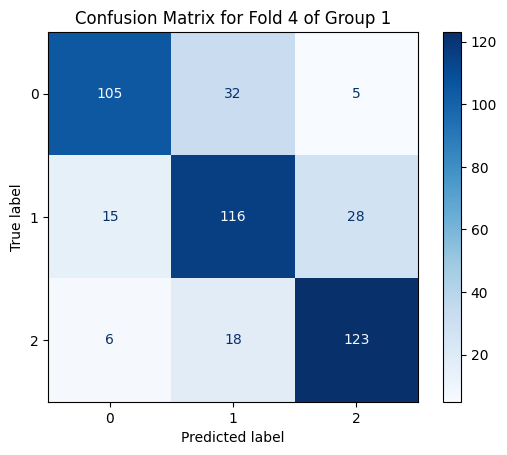


Training on Fold 5 of Group 1
Classification Report for Fold 5 of Group 1:
              precision    recall  f1-score   support

     Dropout       0.81      0.68      0.74       142
    Enrolled       0.65      0.70      0.67       159
    Graduate       0.72      0.79      0.76       147

    accuracy                           0.72       448
   macro avg       0.73      0.72      0.72       448
weighted avg       0.73      0.72      0.72       448



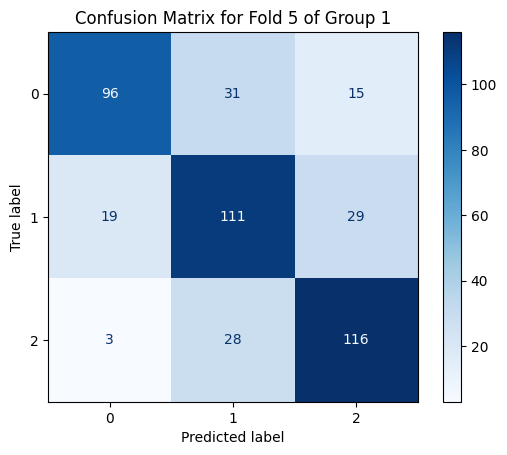


Summary of 5-Fold Cross-Validation Results for Group 1:
Classification Report for Fold 1:
              precision    recall  f1-score   support

     Dropout       0.82      0.68      0.75       142
    Enrolled       0.63      0.65      0.64       159
    Graduate       0.72      0.80      0.76       148

    accuracy                           0.71       449
   macro avg       0.72      0.71      0.72       449
weighted avg       0.72      0.71      0.71       449

Classification Report for Fold 2:
              precision    recall  f1-score   support

     Dropout       0.86      0.60      0.71       143
    Enrolled       0.56      0.70      0.62       158
    Graduate       0.72      0.73      0.73       147

    accuracy                           0.68       448
   macro avg       0.71      0.68      0.69       448
weighted avg       0.71      0.68      0.68       448

Classification Report for Fold 3:
              precision    recall  f1-score   support

     Dropout       0.83 

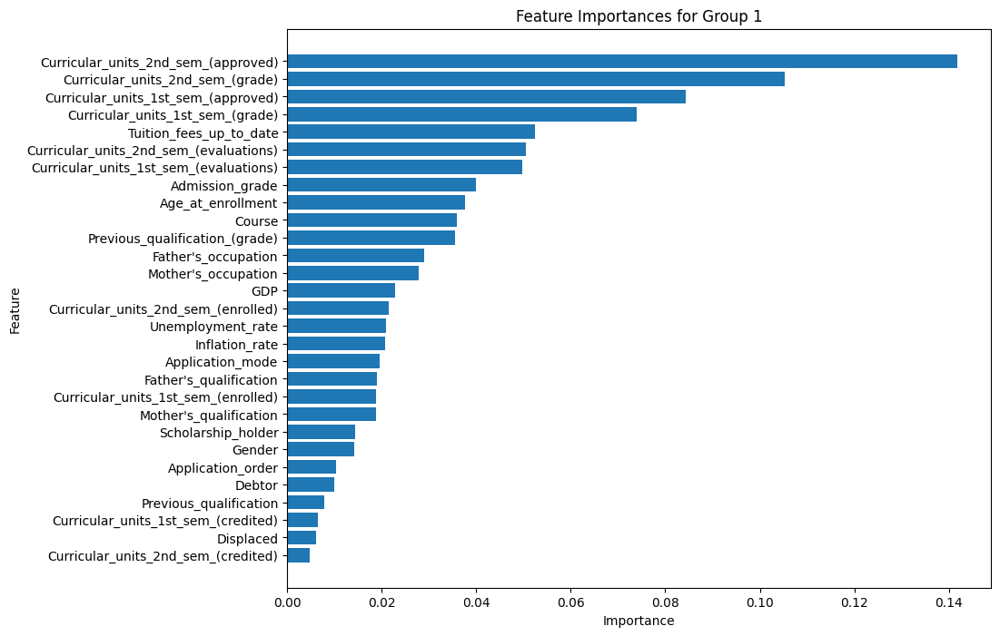


Training and Evaluating on Group 2

Training on Fold 1 of Group 2
Classification Report for Fold 1 of Group 2:
              precision    recall  f1-score   support

     Dropout       0.80      0.64      0.71       142
    Enrolled       0.66      0.70      0.68       158
    Graduate       0.73      0.82      0.77       148

    accuracy                           0.72       448
   macro avg       0.73      0.72      0.72       448
weighted avg       0.73      0.72      0.72       448



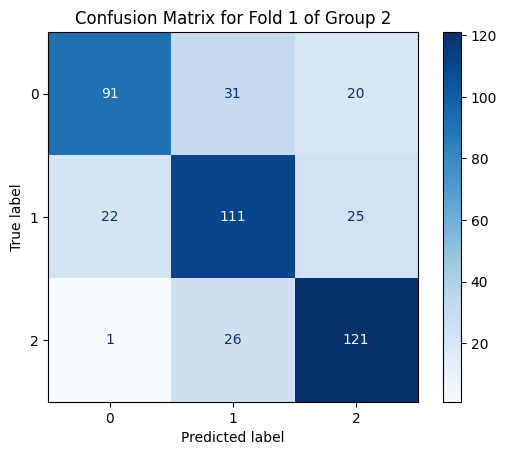


Training on Fold 2 of Group 2
Classification Report for Fold 2 of Group 2:
              precision    recall  f1-score   support

     Dropout       0.82      0.71      0.76       142
    Enrolled       0.60      0.70      0.65       159
    Graduate       0.72      0.69      0.70       147

    accuracy                           0.70       448
   macro avg       0.71      0.70      0.70       448
weighted avg       0.71      0.70      0.70       448



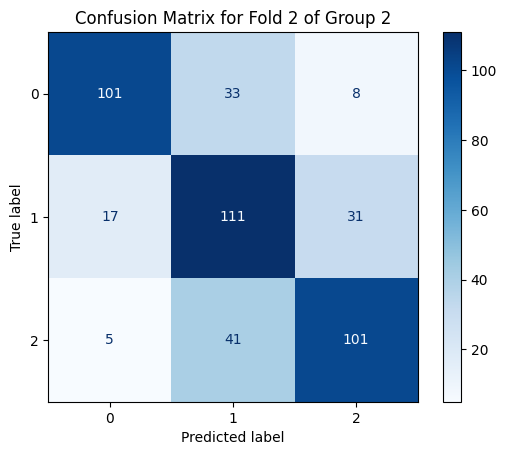


Training on Fold 3 of Group 2
Classification Report for Fold 3 of Group 2:
              precision    recall  f1-score   support

     Dropout       0.79      0.67      0.73       142
    Enrolled       0.65      0.68      0.66       159
    Graduate       0.71      0.78      0.74       147

    accuracy                           0.71       448
   macro avg       0.72      0.71      0.71       448
weighted avg       0.71      0.71      0.71       448



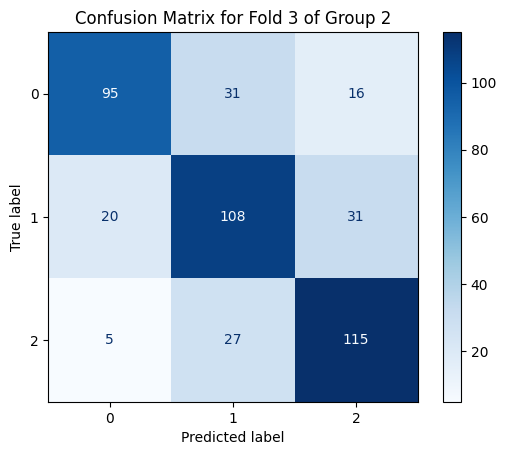


Training on Fold 4 of Group 2
Classification Report for Fold 4 of Group 2:
              precision    recall  f1-score   support

     Dropout       0.82      0.66      0.73       142
    Enrolled       0.64      0.73      0.68       159
    Graduate       0.76      0.78      0.77       147

    accuracy                           0.73       448
   macro avg       0.74      0.72      0.73       448
weighted avg       0.74      0.73      0.73       448



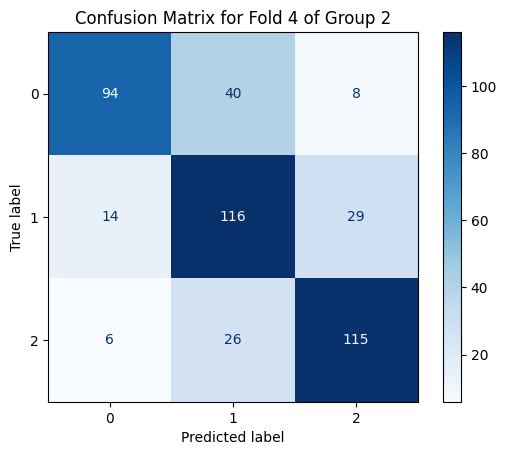


Training on Fold 5 of Group 2
Classification Report for Fold 5 of Group 2:
              precision    recall  f1-score   support

     Dropout       0.80      0.66      0.73       142
    Enrolled       0.71      0.72      0.71       159
    Graduate       0.70      0.82      0.75       147

    accuracy                           0.73       448
   macro avg       0.74      0.73      0.73       448
weighted avg       0.74      0.73      0.73       448



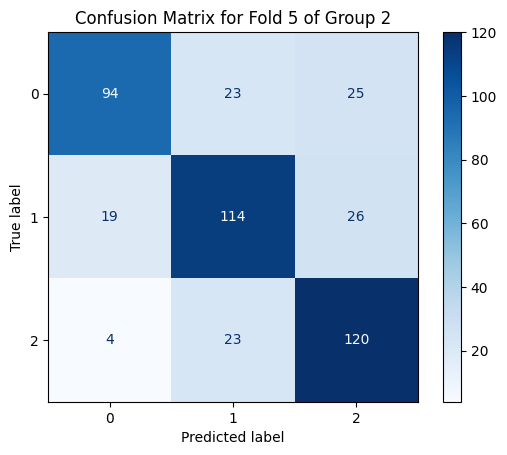


Summary of 5-Fold Cross-Validation Results for Group 2:
Classification Report for Fold 1:
              precision    recall  f1-score   support

     Dropout       0.80      0.64      0.71       142
    Enrolled       0.66      0.70      0.68       158
    Graduate       0.73      0.82      0.77       148

    accuracy                           0.72       448
   macro avg       0.73      0.72      0.72       448
weighted avg       0.73      0.72      0.72       448

Classification Report for Fold 2:
              precision    recall  f1-score   support

     Dropout       0.82      0.71      0.76       142
    Enrolled       0.60      0.70      0.65       159
    Graduate       0.72      0.69      0.70       147

    accuracy                           0.70       448
   macro avg       0.71      0.70      0.70       448
weighted avg       0.71      0.70      0.70       448

Classification Report for Fold 3:
              precision    recall  f1-score   support

     Dropout       0.79 

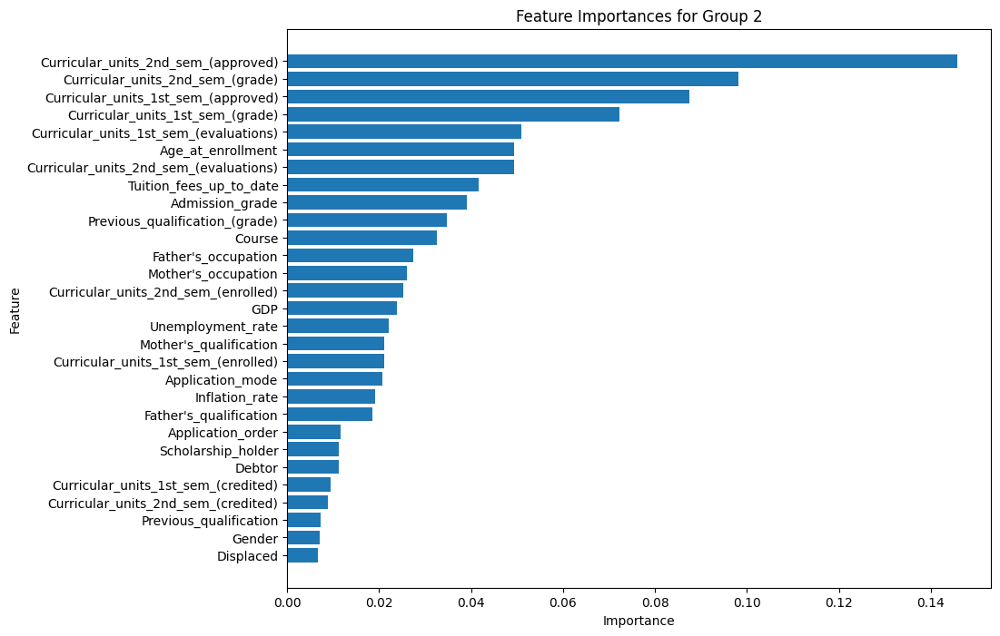


Training and Evaluating on Group 3

Training on Fold 1 of Group 3
Classification Report for Fold 1 of Group 3:
              precision    recall  f1-score   support

     Dropout       0.84      0.69      0.76       142
    Enrolled       0.65      0.74      0.69       159
    Graduate       0.75      0.76      0.75       148

    accuracy                           0.73       449
   macro avg       0.74      0.73      0.73       449
weighted avg       0.74      0.73      0.73       449



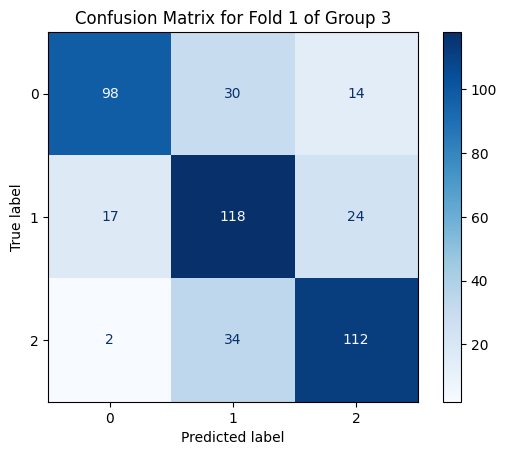


Training on Fold 2 of Group 3
Classification Report for Fold 2 of Group 3:
              precision    recall  f1-score   support

     Dropout       0.84      0.61      0.71       142
    Enrolled       0.58      0.71      0.64       159
    Graduate       0.72      0.73      0.72       148

    accuracy                           0.69       449
   macro avg       0.71      0.68      0.69       449
weighted avg       0.71      0.69      0.69       449



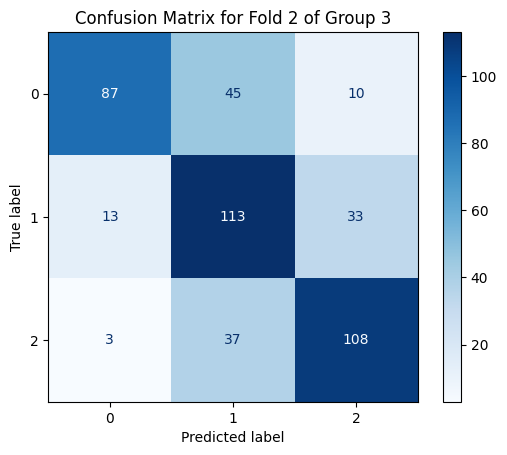


Training on Fold 3 of Group 3
Classification Report for Fold 3 of Group 3:
              precision    recall  f1-score   support

     Dropout       0.81      0.64      0.72       143
    Enrolled       0.63      0.68      0.65       158
    Graduate       0.72      0.80      0.75       147

    accuracy                           0.71       448
   macro avg       0.72      0.71      0.71       448
weighted avg       0.72      0.71      0.71       448



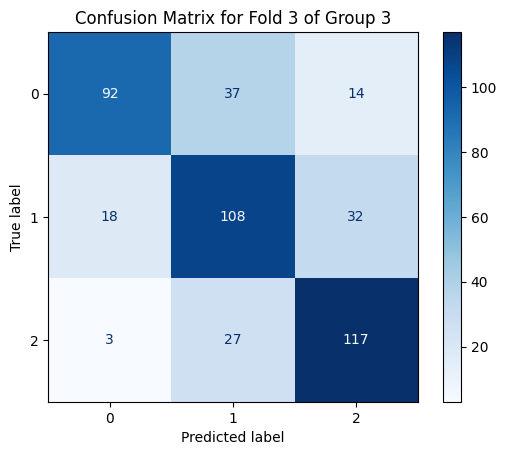


Training on Fold 4 of Group 3
Classification Report for Fold 4 of Group 3:
              precision    recall  f1-score   support

     Dropout       0.87      0.75      0.81       142
    Enrolled       0.67      0.71      0.69       159
    Graduate       0.76      0.80      0.78       147

    accuracy                           0.75       448
   macro avg       0.76      0.76      0.76       448
weighted avg       0.76      0.75      0.76       448



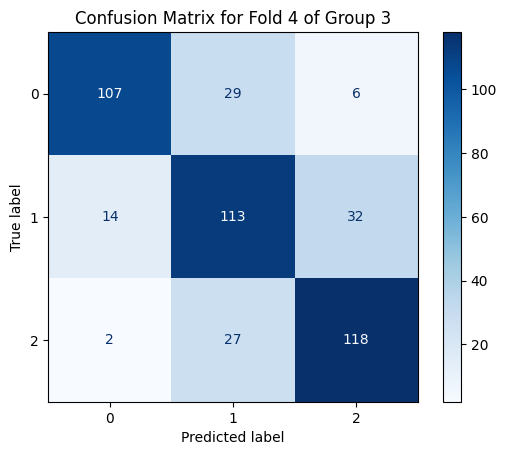


Training on Fold 5 of Group 3
Classification Report for Fold 5 of Group 3:
              precision    recall  f1-score   support

     Dropout       0.82      0.70      0.76       142
    Enrolled       0.66      0.72      0.69       159
    Graduate       0.74      0.78      0.76       147

    accuracy                           0.73       448
   macro avg       0.74      0.73      0.74       448
weighted avg       0.74      0.73      0.74       448



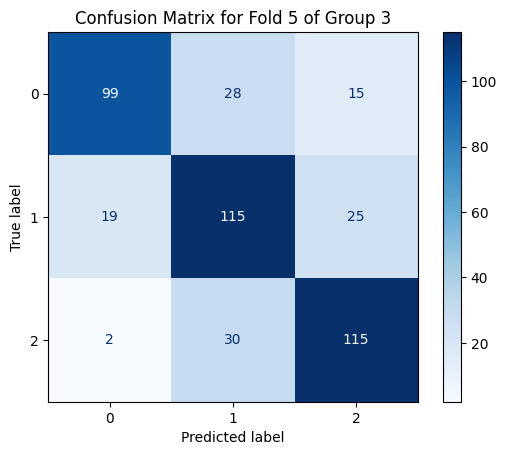


Summary of 5-Fold Cross-Validation Results for Group 3:
Classification Report for Fold 1:
              precision    recall  f1-score   support

     Dropout       0.84      0.69      0.76       142
    Enrolled       0.65      0.74      0.69       159
    Graduate       0.75      0.76      0.75       148

    accuracy                           0.73       449
   macro avg       0.74      0.73      0.73       449
weighted avg       0.74      0.73      0.73       449

Classification Report for Fold 2:
              precision    recall  f1-score   support

     Dropout       0.84      0.61      0.71       142
    Enrolled       0.58      0.71      0.64       159
    Graduate       0.72      0.73      0.72       148

    accuracy                           0.69       449
   macro avg       0.71      0.68      0.69       449
weighted avg       0.71      0.69      0.69       449

Classification Report for Fold 3:
              precision    recall  f1-score   support

     Dropout       0.81 

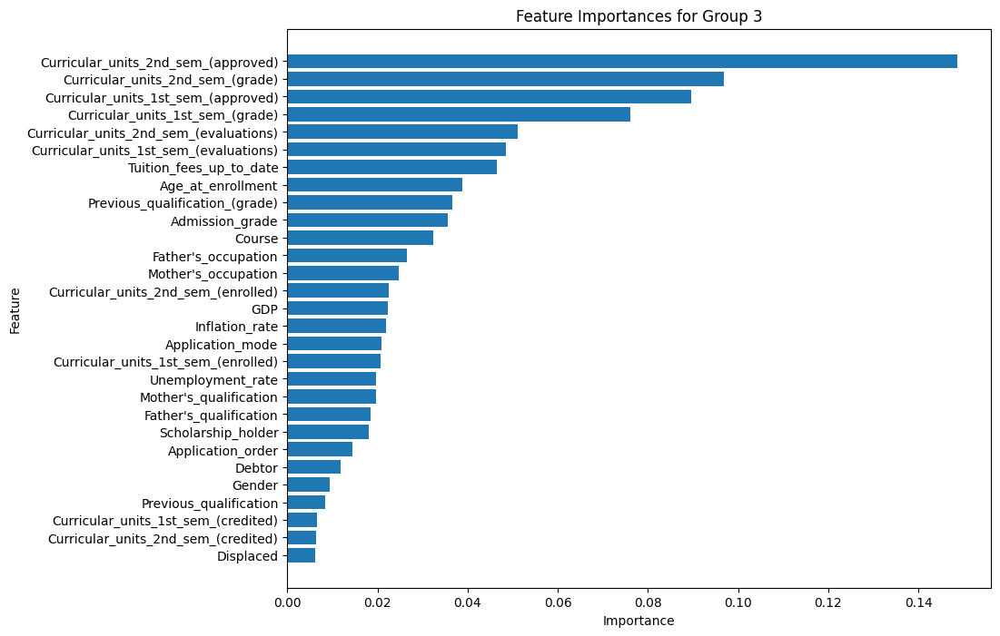

In [97]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Define the columns to use, excluding original and grouped columns
all_features = [
    'Application_order',"Mother's_qualification", 
    "Father's_qualification", 
    'Previous_qualification',
    'Application_mode', 
    'Course',
    "Mother's_occupation", 
    "Father's_occupation", 'Previous_qualification_(grade)', 'Admission_grade',
    'Displaced', 'Debtor', 'Tuition_fees_up_to_date',
    'Gender', 'Scholarship_holder', 'Age_at_enrollment',
    'Curricular_units_1st_sem_(credited)', 'Curricular_units_1st_sem_(enrolled)',
    'Curricular_units_1st_sem_(evaluations)', 'Curricular_units_1st_sem_(approved)',
    'Curricular_units_1st_sem_(grade)', 
    'Curricular_units_2nd_sem_(credited)', 'Curricular_units_2nd_sem_(enrolled)',
    'Curricular_units_2nd_sem_(evaluations)', 'Curricular_units_2nd_sem_(approved)',
    'Curricular_units_2nd_sem_(grade)',
    'Unemployment_rate', 'Inflation_rate', 'GDP',]

# Split data into each class subset
graduate_data = data[data['Target'] == 2]
dropout_data = data[data['Target'] == 0]
enrolled_data = data[data['Target'] == 1]

# Define the split groups for Graduates and Dropouts
graduate_splits = [graduate_data.iloc[:736], graduate_data.iloc[736:1472], graduate_data.iloc[1472:]]
dropout_splits = [dropout_data.iloc[:711], dropout_data.iloc[711:]]

# Define each group combination
groups = {
    "Group 1": pd.concat([graduate_splits[0], dropout_splits[0], enrolled_data]),
    "Group 2": pd.concat([graduate_splits[1], dropout_splits[1], enrolled_data]),
    "Group 3": pd.concat([graduate_splits[2], dropout_splits[0], enrolled_data])
}

# Train and evaluate Random Forest model on each group using stratified 5-fold cross-validation
for group_name, group_data in groups.items():
    print(f"\nTraining and Evaluating on {group_name}")

    # Separate features and target
    X = group_data[all_features]
    y = group_data['Target']

    # Initialize stratified K-Fold cross-validator
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    # Initialize an empty list to store evaluation results
    evaluation_reports = []

    # Start stratified 5-fold cross-validation
    for fold, (train_idx, test_idx) in enumerate(skf.split(X, y)):
        print(f"\nTraining on Fold {fold + 1} of {group_name}")

        # Split data into training and testing sets for this fold
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

        # Initialize and train Random Forest model
        model = RandomForestClassifier(n_estimators=100, max_depth=10, random_state=42)
        model.fit(X_train, y_train)

        # Make predictions and evaluate the model
        y_pred = model.predict(X_test)
        report = classification_report(y_test, y_pred, target_names=['Dropout', 'Enrolled', 'Graduate'])
        print(f"Classification Report for Fold {fold + 1} of {group_name}:\n{report}")

        # Compute confusion matrix
        cm = confusion_matrix(y_test, y_pred)

        # Plot confusion matrix
        disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
        disp.plot(cmap=plt.cm.Blues)
        plt.title(f'Confusion Matrix for Fold {fold + 1} of {group_name}')
        plt.show()

        # Append the report to the list for further analysis
        evaluation_reports.append(report)

    # summary of the reports after all folds have been completed for each group
    print(f"\nSummary of 5-Fold Cross-Validation Results for {group_name}:")
    for i, report in enumerate(evaluation_reports, 1):
        print(f"Classification Report for Fold {i}:\n{report}")

    # Plot feature importances
    feature_importances = model.feature_importances_
    sorted_indices = feature_importances.argsort()[::-1]
    plt.figure(figsize=(10, 8))
    plt.barh([all_features[i] for i in sorted_indices], feature_importances[sorted_indices])
    plt.xlabel('Importance')
    plt.ylabel('Feature')
    plt.title(f'Feature Importances for {group_name}')
    plt.gca().invert_yaxis()
    plt.show()

# RANDOM FOREST - Original Feutures Dropout last imp.feutures and  ALL 2ND SEMESTER- controlled group splits with 5-Fold validation


### Συνολική Απόδοση ανά Group

| Κατηγορία   | Precision | Recall   | F1-score | Παρατηρήσεις                                              |
|-------------|-----------|----------|----------|-----------------------------------------------------------|
| **Dropout** | 0.75 - 0.84 | 0.58 - 0.75 | 0.67 - 0.79 | Σταθερή απόδοση, με ελαφρά πτώση σε συγκεκριμένα folds, πιθανόν λόγω των περιορισμένων χαρακτηριστικών. |
| **Enrolled** | 0.54 - 0.67 | 0.63 - 0.73 | 0.60 - 0.70 | Η απόδοση στην κατηγορία αυτή παραμένει χαμηλή και ποικίλλει ανά fold, με δυσκολία στη διάκριση. |
| **Graduate** | 0.67 - 0.75 | 0.68 - 0.80 | 0.69 - 0.77 | Καλή σταθερή απόδοση στην πρόβλεψη αποφοίτησης, με μικρές διακυμάνσεις ανά fold. |
| **Accuracy** | -         | -        | 0.65 - 0.75 | Το μοντέλο παραμένει σχετικά σταθερό, με ακρίβεια κοντά στο 0.7 στα περισσότερα folds. |

### Σχόλια:
- **Dropout**: Οι προβλέψεις είναι ικανοποιητικές, ωστόσο ορισμένα folds δείχνουν ελαφρά πτώση στην απόδοση. 
- **Enrolled**: Η κατηγορία αυτή συνεχίζει να αποτελεί την πιο δύσκολη για διάκριση, με μειωμένη ακρίβεια και σταθερότητα στις μετρήσεις precision, recall και F1-score.
- **Graduate**: Σταθερή και υψηλή απόδοση, παραμένοντας κοντά στην ακρίβεια και το recall των προηγούμενων μοντέλων.
- **Accuracy**: Παρατηρείται ακρίβεια περίπου στο 0.7 σε όλα τα groups, δείχνοντας ότι το μοντέλο διατηρεί μια σχετικά σταθερή απόδοση παρά την αφαίρεση χαρακτηριστικών.

### Σύγκριση με Προηγούμενα Μοντέλα:
- **Επίδραση της Αφαίρεσης Χαρακτηριστικών**: Η αφαίρεση των τελευταίων 5 χαρακτηριστικών και όλων των δεδομένων του 2ου εξαμήνου δείχνει να μην 
επηρεάζει σημαντικά τις μετρήσεις του μοντέλου, αλλά παρουσιάζει μικρές διακυμάνσεις στην κατηγορία Dropout και Enrolled.






Training and Evaluating on Group 1

Training on Fold 1 of Group 1
Classification Report for Fold 1 of Group 1:
              precision    recall  f1-score   support

     Dropout       0.82      0.65      0.73       142
    Enrolled       0.63      0.68      0.65       159
    Graduate       0.71      0.79      0.75       148

    accuracy                           0.71       449
   macro avg       0.72      0.71      0.71       449
weighted avg       0.72      0.71      0.71       449



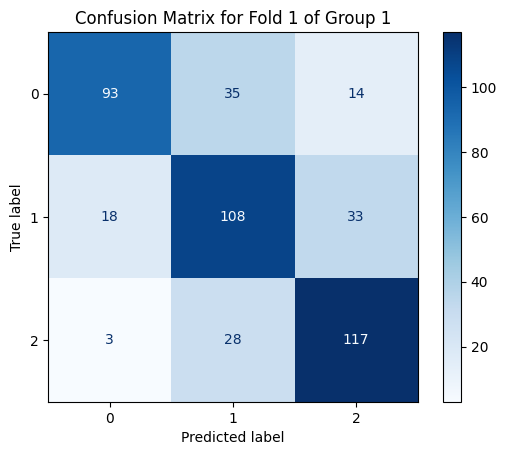


Training on Fold 2 of Group 1
Classification Report for Fold 2 of Group 1:
              precision    recall  f1-score   support

     Dropout       0.78      0.61      0.69       143
    Enrolled       0.55      0.68      0.61       158
    Graduate       0.72      0.68      0.70       147

    accuracy                           0.66       448
   macro avg       0.68      0.66      0.66       448
weighted avg       0.68      0.66      0.66       448



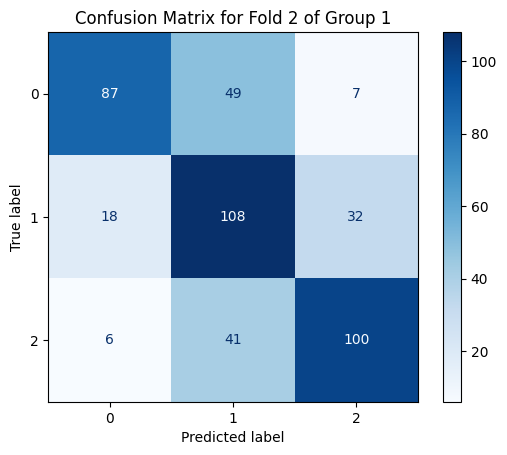


Training on Fold 3 of Group 1
Classification Report for Fold 3 of Group 1:
              precision    recall  f1-score   support

     Dropout       0.79      0.62      0.69       142
    Enrolled       0.59      0.65      0.62       159
    Graduate       0.67      0.73      0.70       147

    accuracy                           0.67       448
   macro avg       0.68      0.67      0.67       448
weighted avg       0.68      0.67      0.67       448



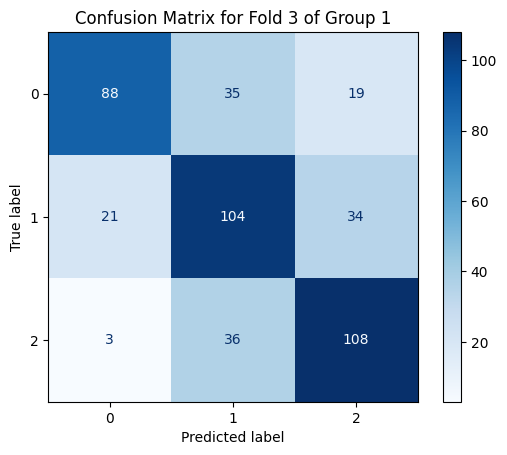


Training on Fold 4 of Group 1
Classification Report for Fold 4 of Group 1:
              precision    recall  f1-score   support

     Dropout       0.83      0.74      0.78       142
    Enrolled       0.63      0.69      0.66       159
    Graduate       0.72      0.73      0.72       147

    accuracy                           0.72       448
   macro avg       0.73      0.72      0.72       448
weighted avg       0.72      0.72      0.72       448



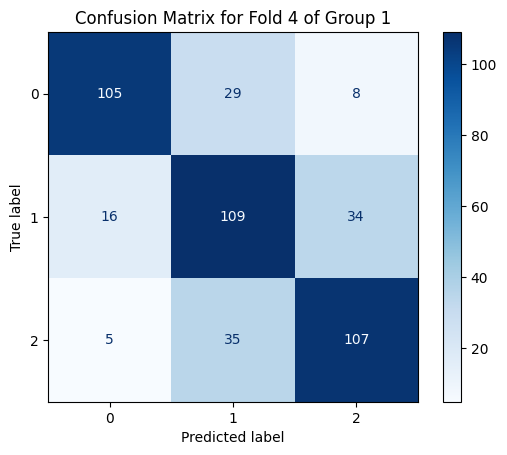


Training on Fold 5 of Group 1
Classification Report for Fold 5 of Group 1:
              precision    recall  f1-score   support

     Dropout       0.81      0.61      0.69       142
    Enrolled       0.60      0.72      0.66       159
    Graduate       0.71      0.73      0.72       147

    accuracy                           0.69       448
   macro avg       0.71      0.69      0.69       448
weighted avg       0.70      0.69      0.69       448



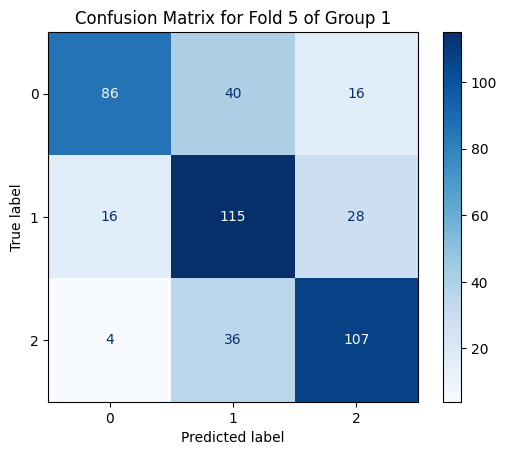


Summary of 5-Fold Cross-Validation Results for Group 1:
Classification Report for Fold 1:
              precision    recall  f1-score   support

     Dropout       0.82      0.65      0.73       142
    Enrolled       0.63      0.68      0.65       159
    Graduate       0.71      0.79      0.75       148

    accuracy                           0.71       449
   macro avg       0.72      0.71      0.71       449
weighted avg       0.72      0.71      0.71       449

Classification Report for Fold 2:
              precision    recall  f1-score   support

     Dropout       0.78      0.61      0.69       143
    Enrolled       0.55      0.68      0.61       158
    Graduate       0.72      0.68      0.70       147

    accuracy                           0.66       448
   macro avg       0.68      0.66      0.66       448
weighted avg       0.68      0.66      0.66       448

Classification Report for Fold 3:
              precision    recall  f1-score   support

     Dropout       0.79 

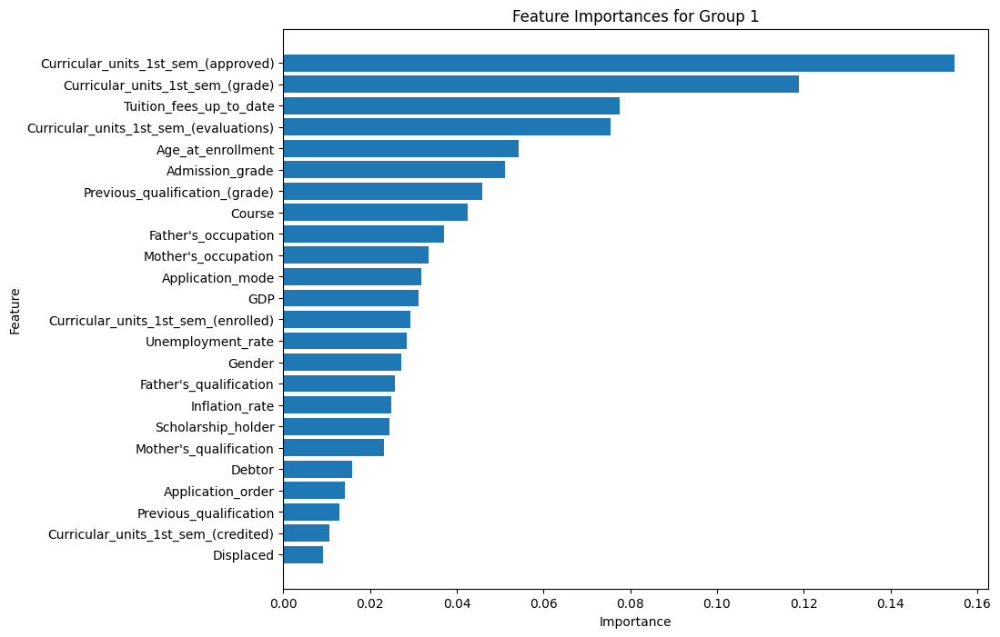


Training and Evaluating on Group 2

Training on Fold 1 of Group 2
Classification Report for Fold 1 of Group 2:
              precision    recall  f1-score   support

     Dropout       0.75      0.63      0.69       142
    Enrolled       0.64      0.69      0.66       158
    Graduate       0.72      0.76      0.74       148

    accuracy                           0.70       448
   macro avg       0.70      0.70      0.70       448
weighted avg       0.70      0.70      0.70       448



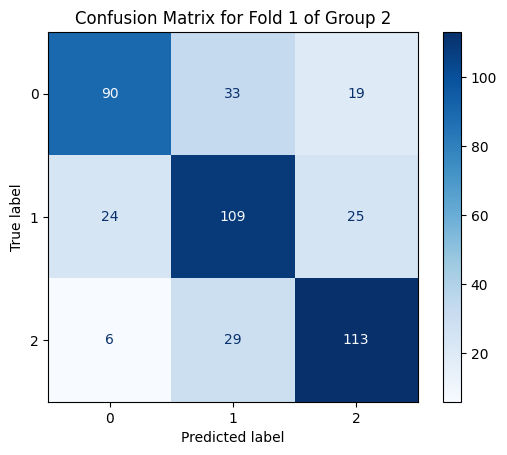


Training on Fold 2 of Group 2
Classification Report for Fold 2 of Group 2:
              precision    recall  f1-score   support

     Dropout       0.78      0.69      0.73       142
    Enrolled       0.60      0.66      0.63       159
    Graduate       0.70      0.71      0.71       147

    accuracy                           0.69       448
   macro avg       0.70      0.69      0.69       448
weighted avg       0.69      0.69      0.69       448



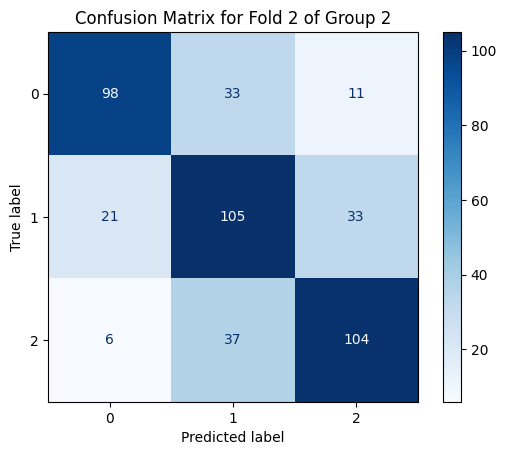


Training on Fold 3 of Group 2
Classification Report for Fold 3 of Group 2:
              precision    recall  f1-score   support

     Dropout       0.76      0.68      0.72       142
    Enrolled       0.65      0.64      0.65       159
    Graduate       0.67      0.75      0.71       147

    accuracy                           0.69       448
   macro avg       0.69      0.69      0.69       448
weighted avg       0.69      0.69      0.69       448



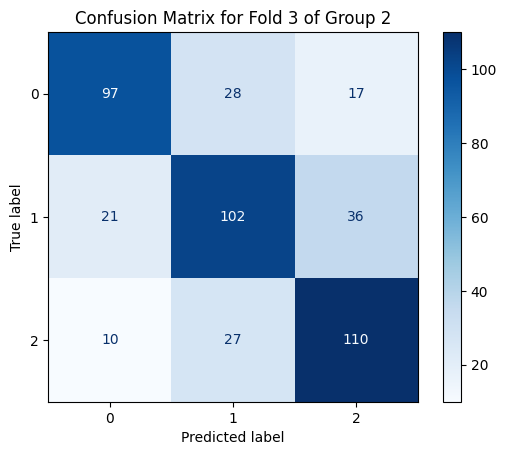


Training on Fold 4 of Group 2
Classification Report for Fold 4 of Group 2:
              precision    recall  f1-score   support

     Dropout       0.78      0.58      0.67       142
    Enrolled       0.60      0.71      0.65       159
    Graduate       0.71      0.73      0.72       147

    accuracy                           0.68       448
   macro avg       0.69      0.68      0.68       448
weighted avg       0.69      0.68      0.68       448



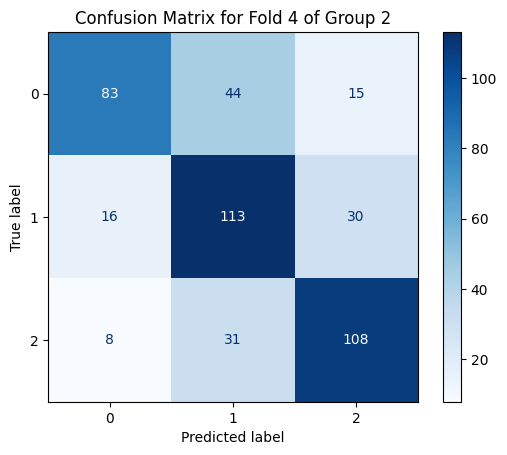


Training on Fold 5 of Group 2
Classification Report for Fold 5 of Group 2:
              precision    recall  f1-score   support

     Dropout       0.75      0.65      0.69       142
    Enrolled       0.67      0.64      0.65       159
    Graduate       0.67      0.80      0.73       147

    accuracy                           0.69       448
   macro avg       0.70      0.70      0.69       448
weighted avg       0.70      0.69      0.69       448



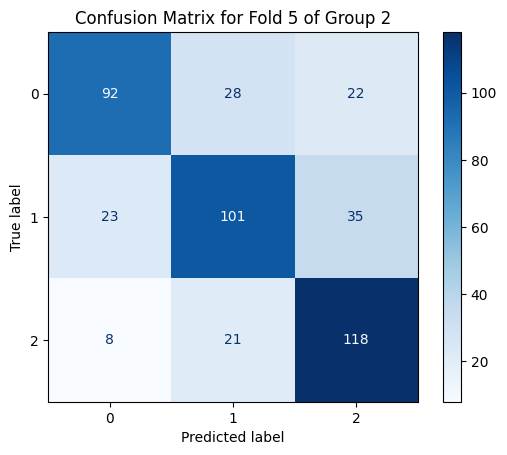


Summary of 5-Fold Cross-Validation Results for Group 2:
Classification Report for Fold 1:
              precision    recall  f1-score   support

     Dropout       0.75      0.63      0.69       142
    Enrolled       0.64      0.69      0.66       158
    Graduate       0.72      0.76      0.74       148

    accuracy                           0.70       448
   macro avg       0.70      0.70      0.70       448
weighted avg       0.70      0.70      0.70       448

Classification Report for Fold 2:
              precision    recall  f1-score   support

     Dropout       0.78      0.69      0.73       142
    Enrolled       0.60      0.66      0.63       159
    Graduate       0.70      0.71      0.71       147

    accuracy                           0.69       448
   macro avg       0.70      0.69      0.69       448
weighted avg       0.69      0.69      0.69       448

Classification Report for Fold 3:
              precision    recall  f1-score   support

     Dropout       0.76 

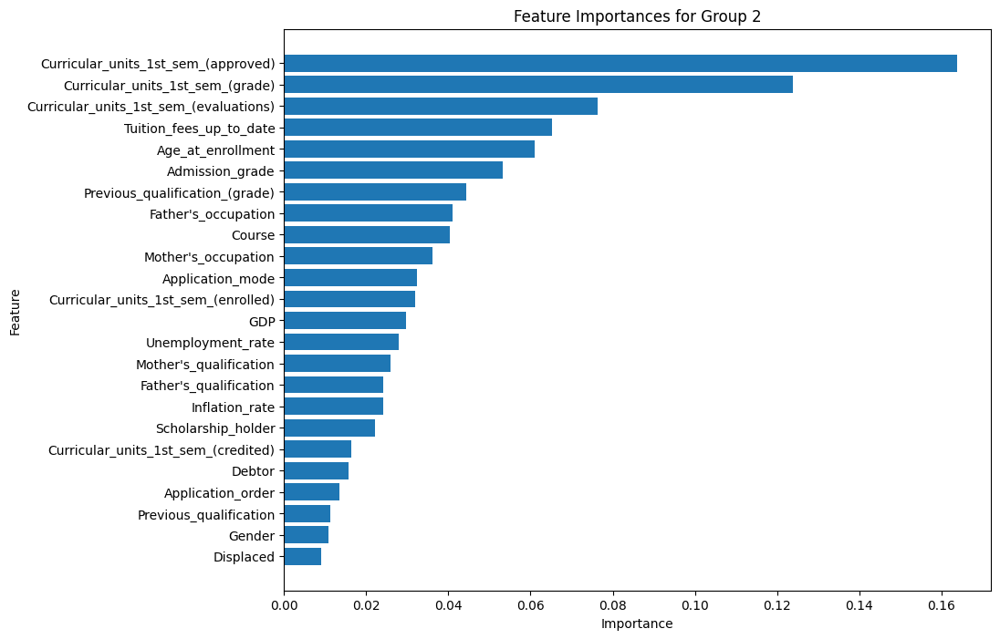


Training and Evaluating on Group 3

Training on Fold 1 of Group 3
Classification Report for Fold 1 of Group 3:
              precision    recall  f1-score   support

     Dropout       0.79      0.65      0.72       142
    Enrolled       0.61      0.72      0.66       159
    Graduate       0.74      0.72      0.73       148

    accuracy                           0.70       449
   macro avg       0.71      0.70      0.70       449
weighted avg       0.71      0.70      0.70       449



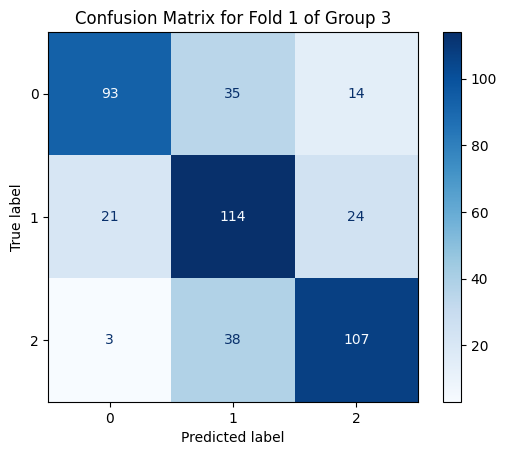


Training on Fold 2 of Group 3
Classification Report for Fold 2 of Group 3:
              precision    recall  f1-score   support

     Dropout       0.81      0.60      0.69       142
    Enrolled       0.54      0.67      0.60       159
    Graduate       0.69      0.69      0.69       148

    accuracy                           0.65       449
   macro avg       0.68      0.65      0.66       449
weighted avg       0.67      0.65      0.66       449



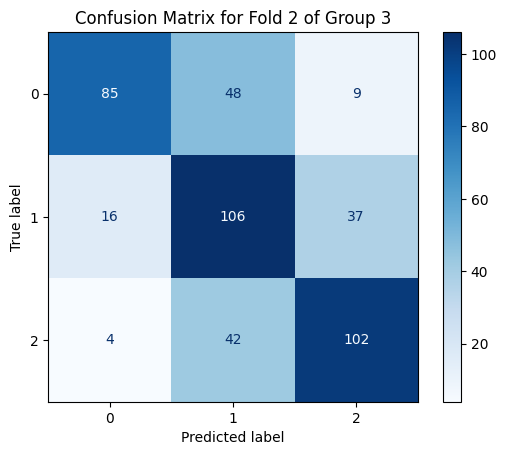


Training on Fold 3 of Group 3
Classification Report for Fold 3 of Group 3:
              precision    recall  f1-score   support

     Dropout       0.78      0.63      0.69       143
    Enrolled       0.61      0.63      0.62       158
    Graduate       0.68      0.78      0.73       147

    accuracy                           0.68       448
   macro avg       0.69      0.68      0.68       448
weighted avg       0.69      0.68      0.68       448



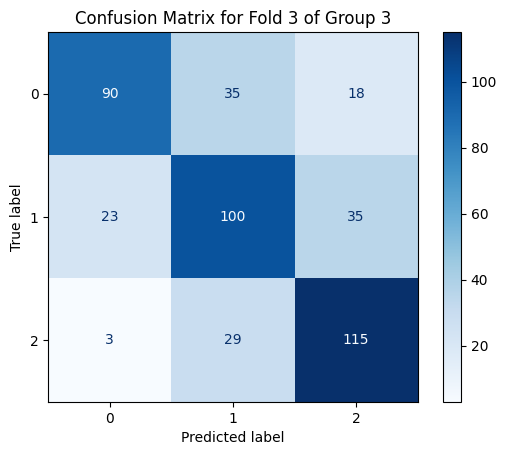


Training on Fold 4 of Group 3
Classification Report for Fold 4 of Group 3:
              precision    recall  f1-score   support

     Dropout       0.84      0.75      0.79       142
    Enrolled       0.67      0.72      0.70       159
    Graduate       0.75      0.78      0.77       147

    accuracy                           0.75       448
   macro avg       0.76      0.75      0.75       448
weighted avg       0.75      0.75      0.75       448



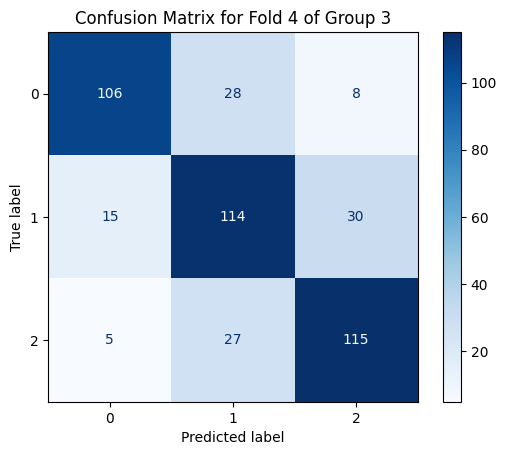


Training on Fold 5 of Group 3
Classification Report for Fold 5 of Group 3:
              precision    recall  f1-score   support

     Dropout       0.81      0.61      0.70       142
    Enrolled       0.61      0.73      0.66       159
    Graduate       0.75      0.77      0.76       147

    accuracy                           0.71       448
   macro avg       0.72      0.70      0.71       448
weighted avg       0.72      0.71      0.71       448



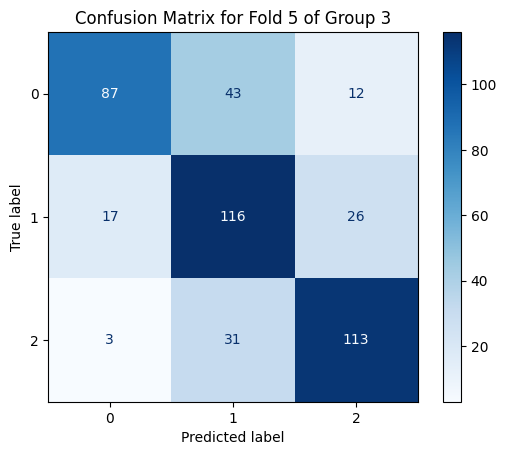


Summary of 5-Fold Cross-Validation Results for Group 3:
Classification Report for Fold 1:
              precision    recall  f1-score   support

     Dropout       0.79      0.65      0.72       142
    Enrolled       0.61      0.72      0.66       159
    Graduate       0.74      0.72      0.73       148

    accuracy                           0.70       449
   macro avg       0.71      0.70      0.70       449
weighted avg       0.71      0.70      0.70       449

Classification Report for Fold 2:
              precision    recall  f1-score   support

     Dropout       0.81      0.60      0.69       142
    Enrolled       0.54      0.67      0.60       159
    Graduate       0.69      0.69      0.69       148

    accuracy                           0.65       449
   macro avg       0.68      0.65      0.66       449
weighted avg       0.67      0.65      0.66       449

Classification Report for Fold 3:
              precision    recall  f1-score   support

     Dropout       0.78 

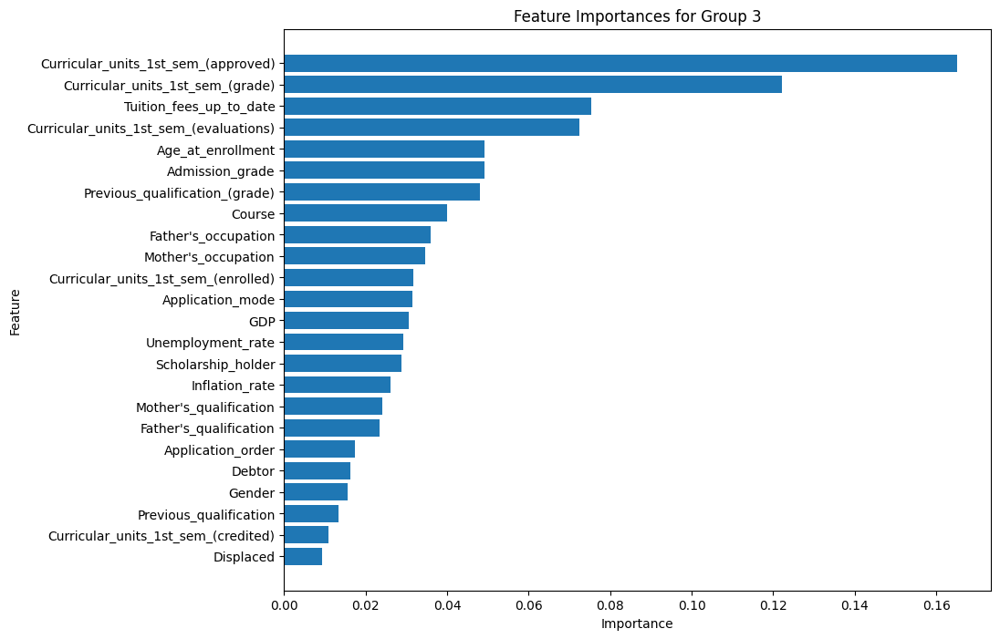

In [98]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Define the columns to use, excluding original and grouped columns
all_features = [
    'Application_order',"Mother's_qualification", 
    "Father's_qualification", 
    'Previous_qualification',
    'Application_mode', 
    'Course',
    "Mother's_occupation", 
    "Father's_occupation", 'Previous_qualification_(grade)', 'Admission_grade',
    'Displaced', 'Debtor', 'Tuition_fees_up_to_date',
    'Gender', 'Scholarship_holder', 'Age_at_enrollment',
    'Curricular_units_1st_sem_(credited)', 'Curricular_units_1st_sem_(enrolled)',
    'Curricular_units_1st_sem_(evaluations)', 'Curricular_units_1st_sem_(approved)',
    'Curricular_units_1st_sem_(grade)', 
    'Unemployment_rate', 'Inflation_rate', 'GDP',]

# Split data into each class subset
graduate_data = data[data['Target'] == 2]
dropout_data = data[data['Target'] == 0]
enrolled_data = data[data['Target'] == 1]

# Define the split groups for Graduates and Dropouts
graduate_splits = [graduate_data.iloc[:736], graduate_data.iloc[736:1472], graduate_data.iloc[1472:]]
dropout_splits = [dropout_data.iloc[:711], dropout_data.iloc[711:]]

# Define each group combination
groups = {
    "Group 1": pd.concat([graduate_splits[0], dropout_splits[0], enrolled_data]),
    "Group 2": pd.concat([graduate_splits[1], dropout_splits[1], enrolled_data]),
    "Group 3": pd.concat([graduate_splits[2], dropout_splits[0], enrolled_data])
}

# Train and evaluate Random Forest model on each group using stratified 5-fold cross-validation
for group_name, group_data in groups.items():
    print(f"\nTraining and Evaluating on {group_name}")

    # Separate features and target
    X = group_data[all_features]
    y = group_data['Target']

    # Initialize stratified K-Fold cross-validator
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    # Initialize an empty list to store evaluation results
    evaluation_reports = []

    # Start stratified 5-fold cross-validation
    for fold, (train_idx, test_idx) in enumerate(skf.split(X, y)):
        print(f"\nTraining on Fold {fold + 1} of {group_name}")

        # Split data into training and testing sets for this fold
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

        # Initialize and train Random Forest model
        model = RandomForestClassifier(n_estimators=100, max_depth=10, random_state=42)
        model.fit(X_train, y_train)

        # Make predictions and evaluate the model
        y_pred = model.predict(X_test)
        report = classification_report(y_test, y_pred, target_names=['Dropout', 'Enrolled', 'Graduate'])
        print(f"Classification Report for Fold {fold + 1} of {group_name}:\n{report}")

        # Compute confusion matrix
        cm = confusion_matrix(y_test, y_pred)

        # Plot confusion matrix
        disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
        disp.plot(cmap=plt.cm.Blues)
        plt.title(f'Confusion Matrix for Fold {fold + 1} of {group_name}')
        plt.show()

        # Append the report to the list for further analysis
        evaluation_reports.append(report)

    # summary of the reports after all folds have been completed for each group
    print(f"\nSummary of 5-Fold Cross-Validation Results for {group_name}:")
    for i, report in enumerate(evaluation_reports, 1):
        print(f"Classification Report for Fold {i}:\n{report}")

    # Plot feature importances
    feature_importances = model.feature_importances_
    sorted_indices = feature_importances.argsort()[::-1]
    plt.figure(figsize=(10, 8))
    plt.barh([all_features[i] for i in sorted_indices], feature_importances[sorted_indices])
    plt.xlabel('Importance')
    plt.ylabel('Feature')
    plt.title(f'Feature Importances for {group_name}')
    plt.gca().invert_yaxis()
    plt.show()

In [99]:
# Check the unique values in the original Target column
print("Unique values in 'Target' column:", data['Target'].unique())

# Count the occurrences of each original category in the Target column
print("Value counts for each category in the 'Target' column:")
print(data['Target'].value_counts())

Unique values in 'Target' column: [0 2 1]
Value counts for each category in the 'Target' column:
Target
2    2209
0    1421
1     794
Name: count, dtype: int64


# RANDOM FOREST & ALL FEUTURES & BINARY TARGET

Value counts for each category in the 'Binary_Target' column:
Binary_Target
Persist    3003
Dropout    1421
Name: count, dtype: int64

Training and Evaluating on Group 1

Training on Fold 1 of Group 1
Classification Report for Fold 1 of Group 1:
              precision    recall  f1-score   support

     Persist       0.82      0.90      0.86       284
     Dropout       0.89      0.81      0.85       285

    accuracy                           0.85       569
   macro avg       0.86      0.85      0.85       569
weighted avg       0.86      0.85      0.85       569



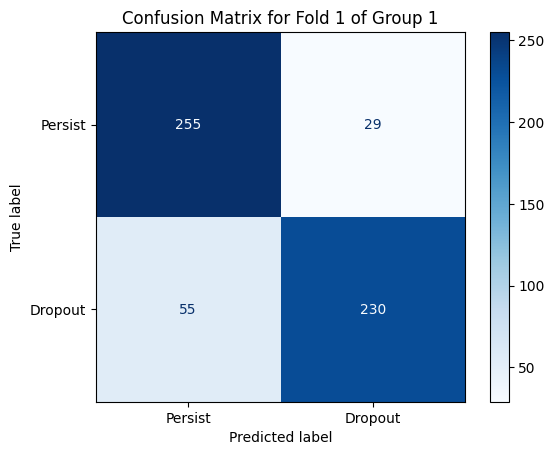


Training on Fold 2 of Group 1
Classification Report for Fold 2 of Group 1:
              precision    recall  f1-score   support

     Persist       0.83      0.85      0.84       285
     Dropout       0.85      0.82      0.84       284

    accuracy                           0.84       569
   macro avg       0.84      0.84      0.84       569
weighted avg       0.84      0.84      0.84       569



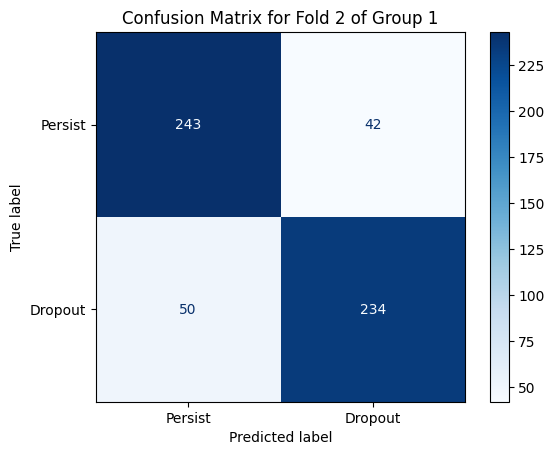


Training on Fold 3 of Group 1
Classification Report for Fold 3 of Group 1:
              precision    recall  f1-score   support

     Persist       0.82      0.89      0.85       284
     Dropout       0.88      0.81      0.84       284

    accuracy                           0.85       568
   macro avg       0.85      0.85      0.85       568
weighted avg       0.85      0.85      0.85       568



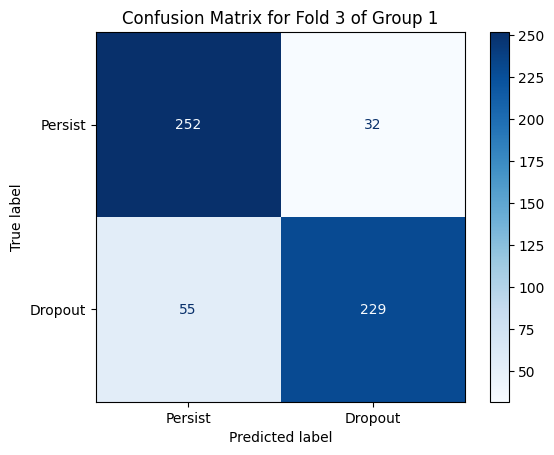


Training on Fold 4 of Group 1
Classification Report for Fold 4 of Group 1:
              precision    recall  f1-score   support

     Persist       0.83      0.87      0.85       284
     Dropout       0.86      0.82      0.84       284

    accuracy                           0.84       568
   macro avg       0.84      0.84      0.84       568
weighted avg       0.84      0.84      0.84       568



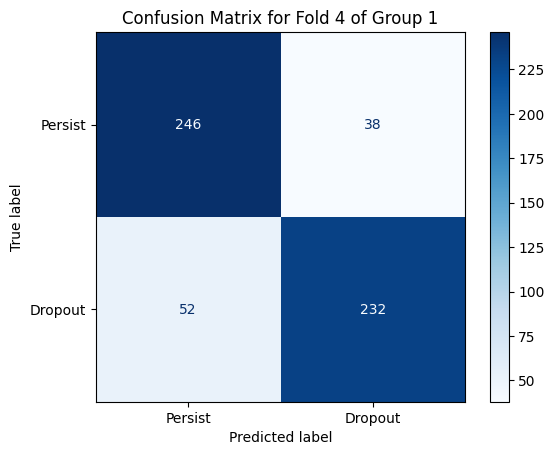


Training on Fold 5 of Group 1
Classification Report for Fold 5 of Group 1:
              precision    recall  f1-score   support

     Persist       0.85      0.90      0.87       284
     Dropout       0.90      0.83      0.86       284

    accuracy                           0.87       568
   macro avg       0.87      0.87      0.87       568
weighted avg       0.87      0.87      0.87       568



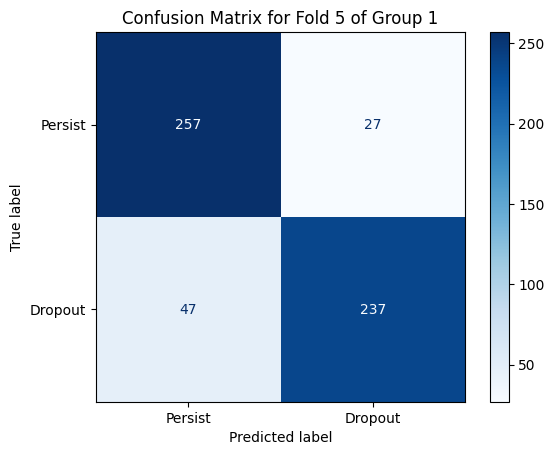


Summary of 5-Fold Cross-Validation Results for Group 1:
Classification Report for Fold 1:
              precision    recall  f1-score   support

     Persist       0.82      0.90      0.86       284
     Dropout       0.89      0.81      0.85       285

    accuracy                           0.85       569
   macro avg       0.86      0.85      0.85       569
weighted avg       0.86      0.85      0.85       569

Classification Report for Fold 2:
              precision    recall  f1-score   support

     Persist       0.83      0.85      0.84       285
     Dropout       0.85      0.82      0.84       284

    accuracy                           0.84       569
   macro avg       0.84      0.84      0.84       569
weighted avg       0.84      0.84      0.84       569

Classification Report for Fold 3:
              precision    recall  f1-score   support

     Persist       0.82      0.89      0.85       284
     Dropout       0.88      0.81      0.84       284

    accuracy           

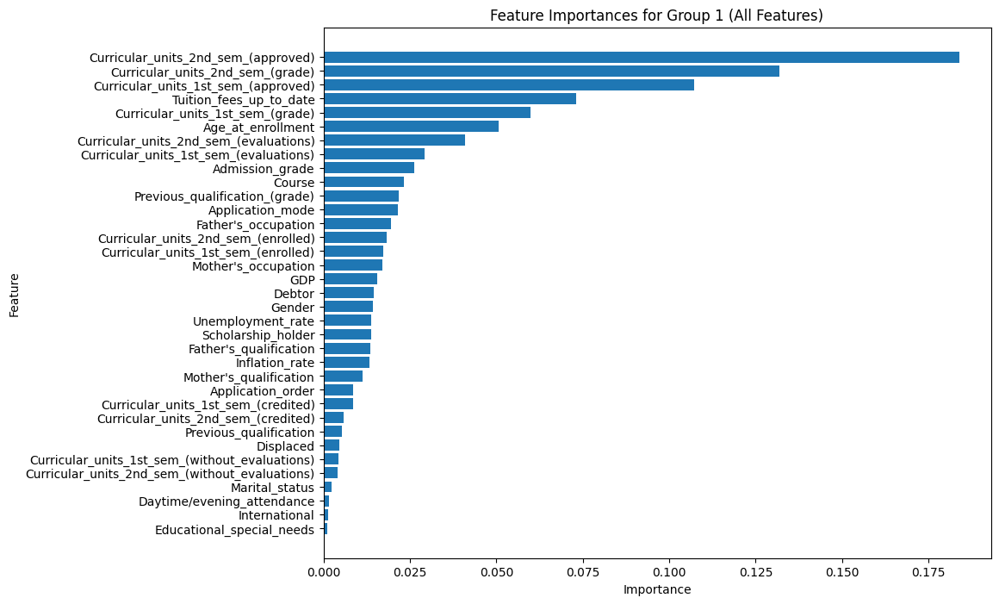


Training and Evaluating on Group 2

Training on Fold 1 of Group 2
Classification Report for Fold 1 of Group 2:
              precision    recall  f1-score   support

     Persist       0.80      0.88      0.84       284
     Dropout       0.86      0.79      0.82       285

    accuracy                           0.83       569
   macro avg       0.83      0.83      0.83       569
weighted avg       0.83      0.83      0.83       569



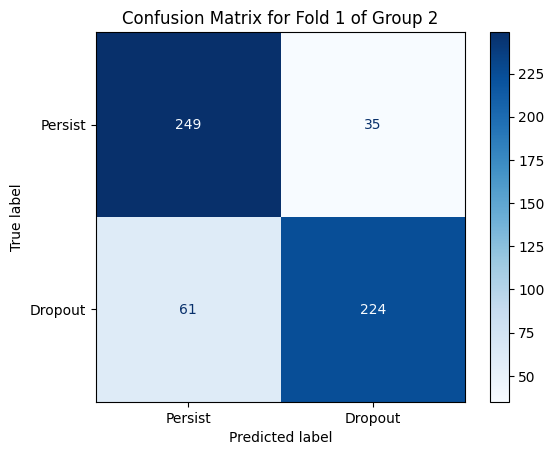


Training on Fold 2 of Group 2
Classification Report for Fold 2 of Group 2:
              precision    recall  f1-score   support

     Persist       0.83      0.86      0.85       285
     Dropout       0.86      0.82      0.84       284

    accuracy                           0.84       569
   macro avg       0.84      0.84      0.84       569
weighted avg       0.84      0.84      0.84       569



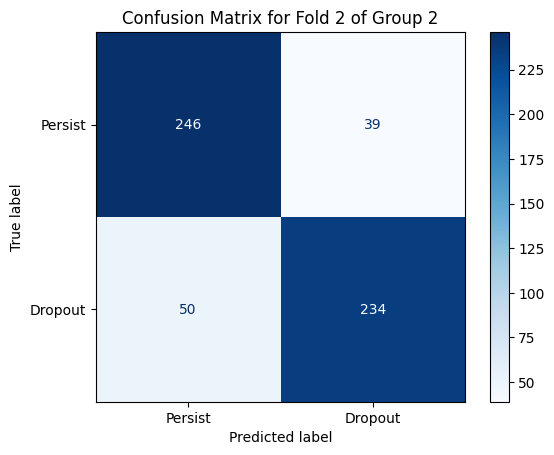


Training on Fold 3 of Group 2
Classification Report for Fold 3 of Group 2:
              precision    recall  f1-score   support

     Persist       0.82      0.90      0.86       284
     Dropout       0.89      0.80      0.84       284

    accuracy                           0.85       568
   macro avg       0.85      0.85      0.85       568
weighted avg       0.85      0.85      0.85       568



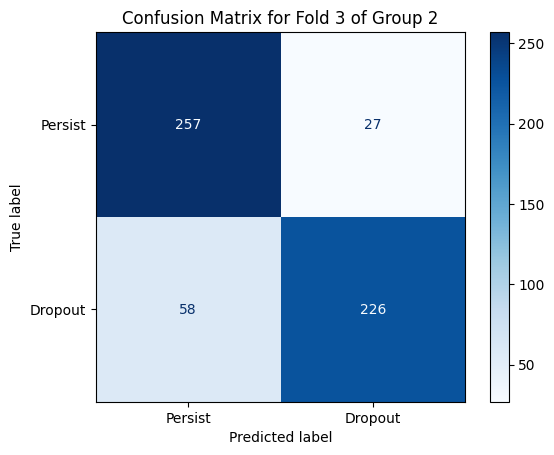


Training on Fold 4 of Group 2
Classification Report for Fold 4 of Group 2:
              precision    recall  f1-score   support

     Persist       0.81      0.88      0.85       284
     Dropout       0.87      0.80      0.83       284

    accuracy                           0.84       568
   macro avg       0.84      0.84      0.84       568
weighted avg       0.84      0.84      0.84       568



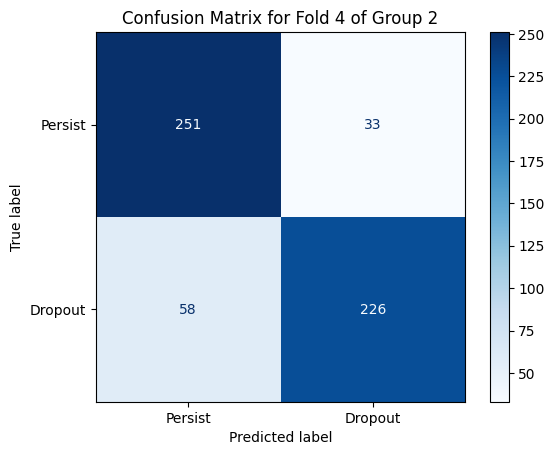


Training on Fold 5 of Group 2
Classification Report for Fold 5 of Group 2:
              precision    recall  f1-score   support

     Persist       0.82      0.86      0.84       284
     Dropout       0.86      0.81      0.83       284

    accuracy                           0.84       568
   macro avg       0.84      0.84      0.84       568
weighted avg       0.84      0.84      0.84       568



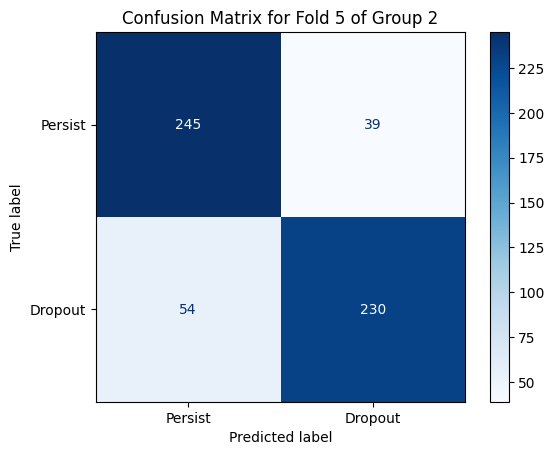


Summary of 5-Fold Cross-Validation Results for Group 2:
Classification Report for Fold 1:
              precision    recall  f1-score   support

     Persist       0.80      0.88      0.84       284
     Dropout       0.86      0.79      0.82       285

    accuracy                           0.83       569
   macro avg       0.83      0.83      0.83       569
weighted avg       0.83      0.83      0.83       569

Classification Report for Fold 2:
              precision    recall  f1-score   support

     Persist       0.83      0.86      0.85       285
     Dropout       0.86      0.82      0.84       284

    accuracy                           0.84       569
   macro avg       0.84      0.84      0.84       569
weighted avg       0.84      0.84      0.84       569

Classification Report for Fold 3:
              precision    recall  f1-score   support

     Persist       0.82      0.90      0.86       284
     Dropout       0.89      0.80      0.84       284

    accuracy           

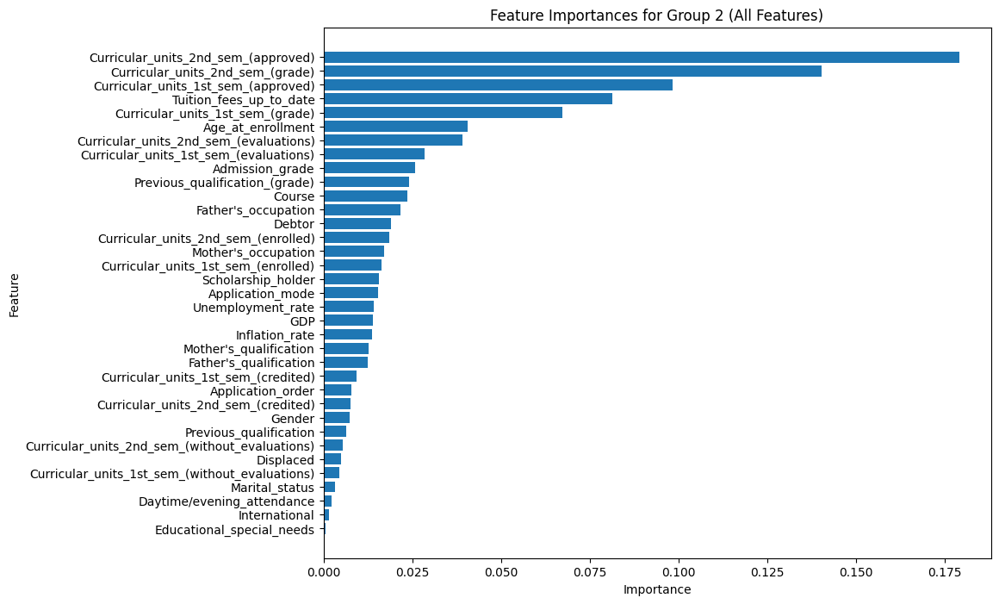

In [101]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Define the columns to use
all_features = [
    'Marital_status', 'Application_order', "Mother's_qualification", 
    "Father's_qualification", 'Previous_qualification', 'Application_mode', 
    'Course', "Mother's_occupation", "Father's_occupation",
    'Daytime/evening_attendance', 'Previous_qualification_(grade)', 'Admission_grade',
    'Displaced', 'Educational_special_needs', 'Debtor', 'Tuition_fees_up_to_date',
    'Gender', 'Scholarship_holder', 'Age_at_enrollment', 'International',
    'Curricular_units_1st_sem_(credited)', 'Curricular_units_1st_sem_(enrolled)',
    'Curricular_units_1st_sem_(evaluations)', 'Curricular_units_1st_sem_(approved)',
    'Curricular_units_1st_sem_(grade)', 'Curricular_units_1st_sem_(without_evaluations)',
    'Curricular_units_2nd_sem_(credited)', 'Curricular_units_2nd_sem_(enrolled)',
    'Curricular_units_2nd_sem_(evaluations)', 'Curricular_units_2nd_sem_(approved)',
    'Curricular_units_2nd_sem_(grade)', 'Curricular_units_2nd_sem_(without_evaluations)',
    'Unemployment_rate', 'Inflation_rate', 'GDP'
]

# Step 1: Convert 'Target' to Binary
data['Binary_Target'] = data['Target'].apply(lambda x: 'Persist' if x in [1, 2] else 'Dropout')

# Step 2: Check the new target distribution
print("Value counts for each category in the 'Binary_Target' column:")
print(data['Binary_Target'].value_counts())

# Step 3: Split the "Persist" group into two balanced groups
dropout_data = data[data['Binary_Target'] == 'Dropout']
persist_data = data[data['Binary_Target'] == 'Persist']

# Ensure there is a balance in the 'Persist' group splits
persist_split1 = persist_data.iloc[:len(dropout_data)]
persist_split2 = persist_data.iloc[len(dropout_data):2*len(dropout_data)]

# Define each group combination
groups = {
    "Group 1": pd.concat([dropout_data, persist_split1]),
    "Group 2": pd.concat([dropout_data, persist_split2])
}

# Train and evaluate Random Forest model on each group using stratified 5-fold cross-validation
for group_name, group_data in groups.items():
    print(f"\nTraining and Evaluating on {group_name}")

    # Separate features and binary target
    X = group_data[all_features]
    y = group_data['Binary_Target'].apply(lambda x: 1 if x == 'Dropout' else 0)  # Encode: 1 for Dropout, 0 for Persist

    # Initialize the Random Forest model
    model = RandomForestClassifier(n_estimators=100, max_depth=10, random_state=42)

    # Initialize stratified K-Fold cross-validator
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    # Initialize an empty list to store evaluation results
    evaluation_reports = []

    # Start stratified 5-fold cross-validation
    for fold, (train_idx, test_idx) in enumerate(skf.split(X, y)):
        print(f"\nTraining on Fold {fold + 1} of {group_name}")

        # Split data into training and testing sets for this fold
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

        # Train the model
        model.fit(X_train, y_train)

        # Make predictions and evaluate the model
        y_pred = model.predict(X_test)
        report = classification_report(y_test, y_pred, target_names=['Persist', 'Dropout'])
        print(f"Classification Report for Fold {fold + 1} of {group_name}:\n{report}")

        # Compute and display the confusion matrix
        cm = confusion_matrix(y_test, y_pred)
        disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Persist', 'Dropout'])
        disp.plot(cmap=plt.cm.Blues)
        plt.title(f'Confusion Matrix for Fold {fold + 1} of {group_name}')
        plt.show()

        # Append the report for summary
        evaluation_reports.append(report)

    # Summary of the reports after all folds have been completed for each group
    print(f"\nSummary of 5-Fold Cross-Validation Results for {group_name}:")
    for i, report in enumerate(evaluation_reports, 1):
        print(f"Classification Report for Fold {i}:\n{report}")

    # Plot feature importances
    feature_importances = model.feature_importances_
    sorted_indices = feature_importances.argsort()[::-1]
    plt.figure(figsize=(10, 8))
    plt.barh([all_features[i] for i in sorted_indices], feature_importances[sorted_indices])
    plt.xlabel('Importance')
    plt.ylabel('Feature')
    plt.title(f'Feature Importances for {group_name} (All Features)')
    plt.gca().invert_yaxis()
    plt.show()



# RANDOM FOREST & DROP OUT 2ND SEMESTER FEUTURES & BINARY TARGET

Value counts for each category in the 'Binary_Target' column:
Binary_Target
Persist    3003
Dropout    1421
Name: count, dtype: int64

Training and Evaluating on Group 1

Training on Fold 1 of Group 1
Classification Report for Fold 1 of Group 1:
              precision    recall  f1-score   support

     Persist       0.80      0.90      0.85       284
     Dropout       0.89      0.78      0.83       285

    accuracy                           0.84       569
   macro avg       0.85      0.84      0.84       569
weighted avg       0.85      0.84      0.84       569



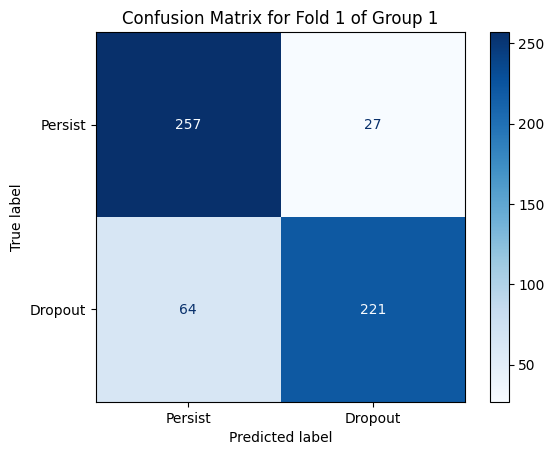


Training on Fold 2 of Group 1
Classification Report for Fold 2 of Group 1:
              precision    recall  f1-score   support

     Persist       0.80      0.87      0.84       285
     Dropout       0.86      0.79      0.82       284

    accuracy                           0.83       569
   macro avg       0.83      0.83      0.83       569
weighted avg       0.83      0.83      0.83       569



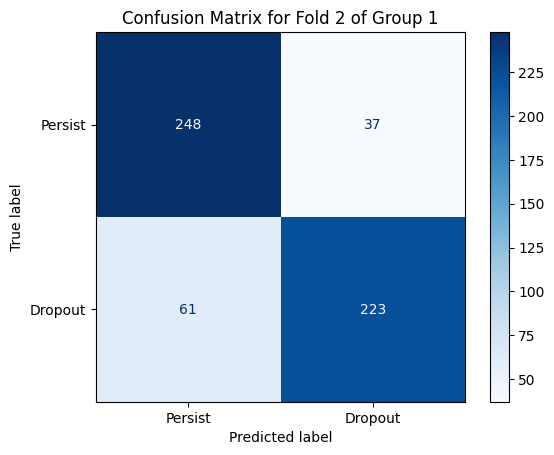


Training on Fold 3 of Group 1
Classification Report for Fold 3 of Group 1:
              precision    recall  f1-score   support

     Persist       0.80      0.87      0.83       284
     Dropout       0.85      0.79      0.82       284

    accuracy                           0.83       568
   macro avg       0.83      0.83      0.83       568
weighted avg       0.83      0.83      0.83       568



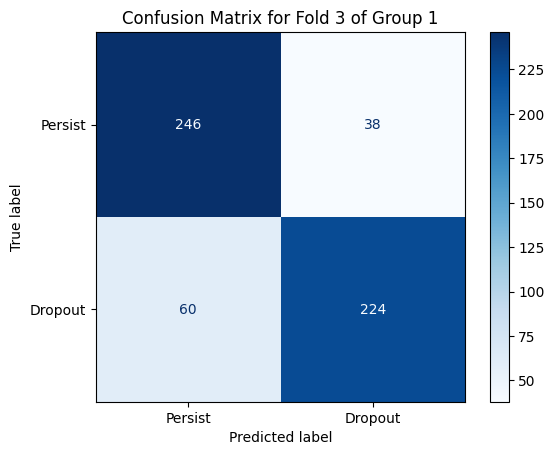


Training on Fold 4 of Group 1
Classification Report for Fold 4 of Group 1:
              precision    recall  f1-score   support

     Persist       0.81      0.83      0.82       284
     Dropout       0.83      0.80      0.81       284

    accuracy                           0.82       568
   macro avg       0.82      0.82      0.82       568
weighted avg       0.82      0.82      0.82       568



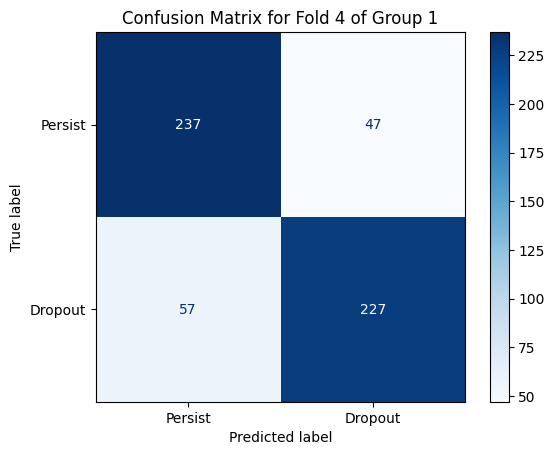


Training on Fold 5 of Group 1
Classification Report for Fold 5 of Group 1:
              precision    recall  f1-score   support

     Persist       0.80      0.87      0.84       284
     Dropout       0.86      0.78      0.82       284

    accuracy                           0.83       568
   macro avg       0.83      0.83      0.83       568
weighted avg       0.83      0.83      0.83       568



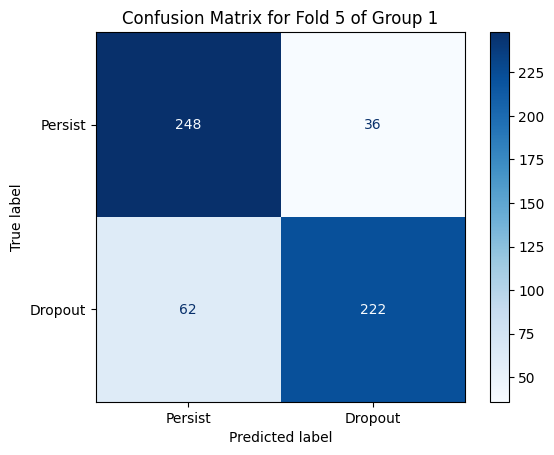


Summary of 5-Fold Cross-Validation Results for Group 1:
Classification Report for Fold 1:
              precision    recall  f1-score   support

     Persist       0.80      0.90      0.85       284
     Dropout       0.89      0.78      0.83       285

    accuracy                           0.84       569
   macro avg       0.85      0.84      0.84       569
weighted avg       0.85      0.84      0.84       569

Classification Report for Fold 2:
              precision    recall  f1-score   support

     Persist       0.80      0.87      0.84       285
     Dropout       0.86      0.79      0.82       284

    accuracy                           0.83       569
   macro avg       0.83      0.83      0.83       569
weighted avg       0.83      0.83      0.83       569

Classification Report for Fold 3:
              precision    recall  f1-score   support

     Persist       0.80      0.87      0.83       284
     Dropout       0.85      0.79      0.82       284

    accuracy           

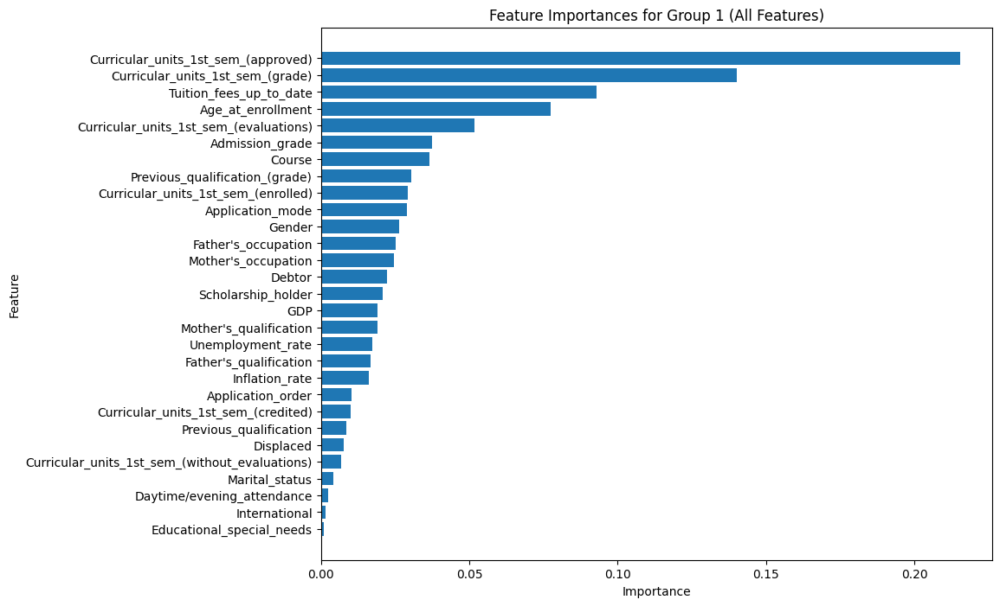


Training and Evaluating on Group 2

Training on Fold 1 of Group 2
Classification Report for Fold 1 of Group 2:
              precision    recall  f1-score   support

     Persist       0.77      0.84      0.80       284
     Dropout       0.82      0.75      0.79       285

    accuracy                           0.80       569
   macro avg       0.80      0.80      0.80       569
weighted avg       0.80      0.80      0.80       569



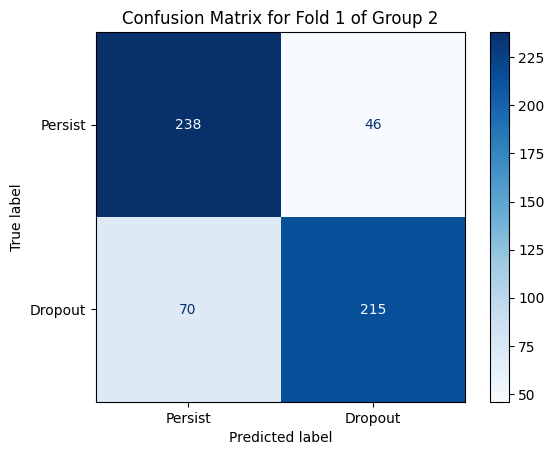


Training on Fold 2 of Group 2
Classification Report for Fold 2 of Group 2:
              precision    recall  f1-score   support

     Persist       0.79      0.84      0.82       285
     Dropout       0.83      0.78      0.81       284

    accuracy                           0.81       569
   macro avg       0.81      0.81      0.81       569
weighted avg       0.81      0.81      0.81       569



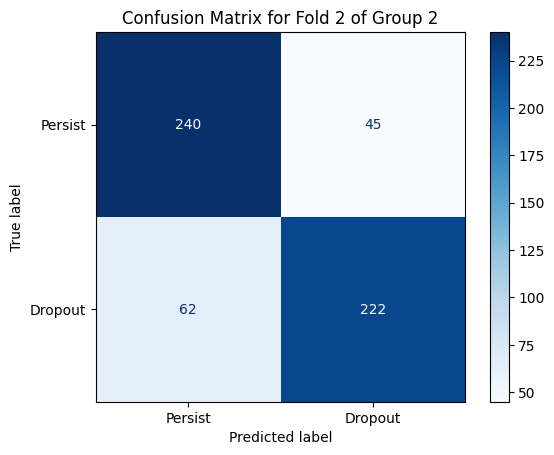


Training on Fold 3 of Group 2
Classification Report for Fold 3 of Group 2:
              precision    recall  f1-score   support

     Persist       0.80      0.90      0.84       284
     Dropout       0.88      0.77      0.82       284

    accuracy                           0.83       568
   macro avg       0.84      0.83      0.83       568
weighted avg       0.84      0.83      0.83       568



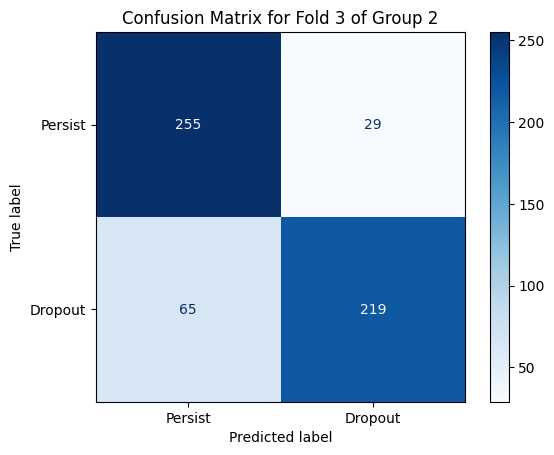


Training on Fold 4 of Group 2
Classification Report for Fold 4 of Group 2:
              precision    recall  f1-score   support

     Persist       0.79      0.86      0.82       284
     Dropout       0.84      0.78      0.81       284

    accuracy                           0.82       568
   macro avg       0.82      0.82      0.82       568
weighted avg       0.82      0.82      0.82       568



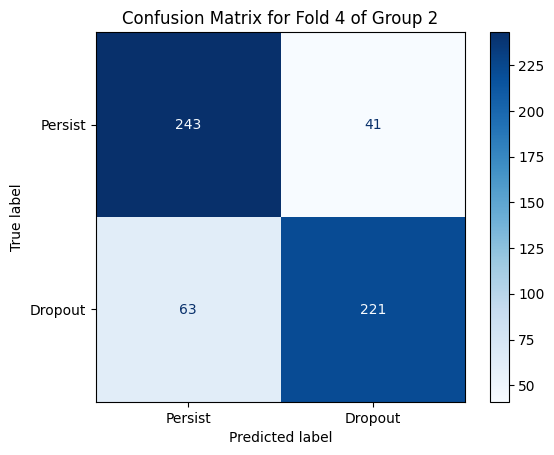


Training on Fold 5 of Group 2
Classification Report for Fold 5 of Group 2:
              precision    recall  f1-score   support

     Persist       0.80      0.85      0.82       284
     Dropout       0.84      0.78      0.81       284

    accuracy                           0.82       568
   macro avg       0.82      0.82      0.82       568
weighted avg       0.82      0.82      0.82       568



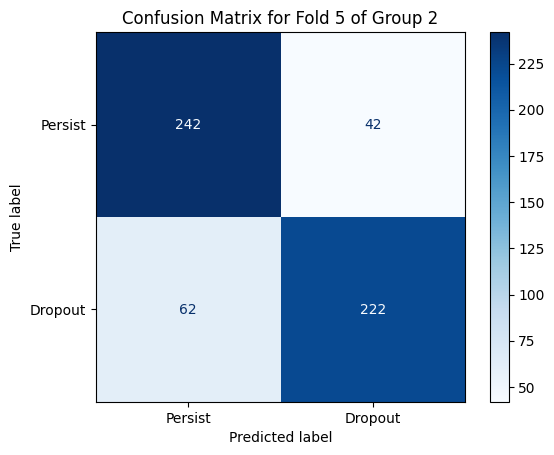


Summary of 5-Fold Cross-Validation Results for Group 2:
Classification Report for Fold 1:
              precision    recall  f1-score   support

     Persist       0.77      0.84      0.80       284
     Dropout       0.82      0.75      0.79       285

    accuracy                           0.80       569
   macro avg       0.80      0.80      0.80       569
weighted avg       0.80      0.80      0.80       569

Classification Report for Fold 2:
              precision    recall  f1-score   support

     Persist       0.79      0.84      0.82       285
     Dropout       0.83      0.78      0.81       284

    accuracy                           0.81       569
   macro avg       0.81      0.81      0.81       569
weighted avg       0.81      0.81      0.81       569

Classification Report for Fold 3:
              precision    recall  f1-score   support

     Persist       0.80      0.90      0.84       284
     Dropout       0.88      0.77      0.82       284

    accuracy           

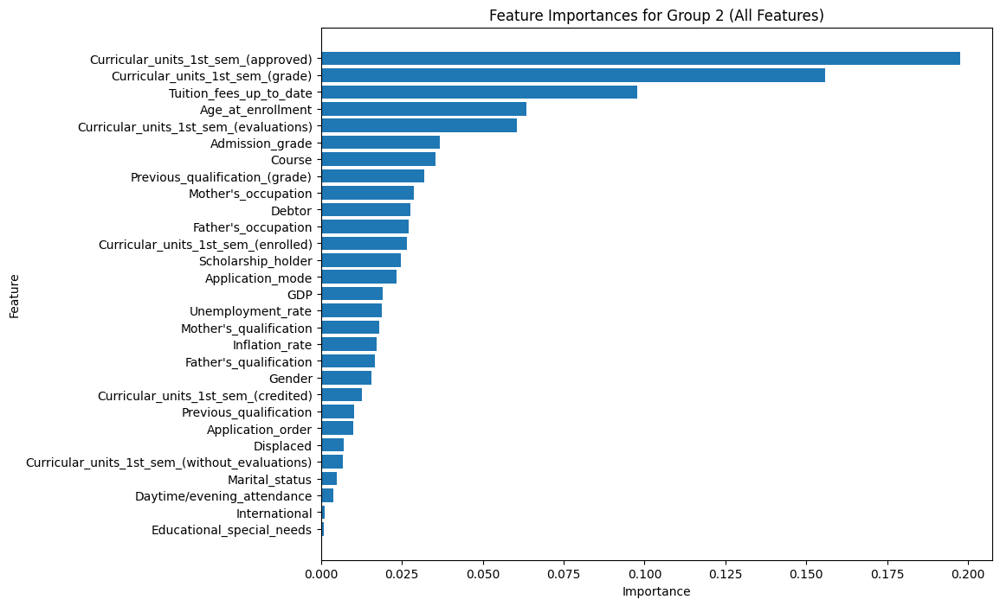

In [102]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Define the columns to use
all_features = [
    'Marital_status', 'Application_order', "Mother's_qualification", 
    "Father's_qualification", 'Previous_qualification', 'Application_mode', 
    'Course', "Mother's_occupation", "Father's_occupation",
    'Daytime/evening_attendance', 'Previous_qualification_(grade)', 'Admission_grade',
    'Displaced', 'Educational_special_needs', 'Debtor', 'Tuition_fees_up_to_date',
    'Gender', 'Scholarship_holder', 'Age_at_enrollment', 'International',
    'Curricular_units_1st_sem_(credited)', 'Curricular_units_1st_sem_(enrolled)',
    'Curricular_units_1st_sem_(evaluations)', 'Curricular_units_1st_sem_(approved)',
    'Curricular_units_1st_sem_(grade)', 'Curricular_units_1st_sem_(without_evaluations)',
    'Unemployment_rate', 'Inflation_rate', 'GDP'
]

# Step 1: Convert 'Target' to Binary
data['Binary_Target'] = data['Target'].apply(lambda x: 'Persist' if x in [1, 2] else 'Dropout')

# Step 2: Check the new target distribution
print("Value counts for each category in the 'Binary_Target' column:")
print(data['Binary_Target'].value_counts())

# Step 3: Split the "Persist" group into two balanced groups
dropout_data = data[data['Binary_Target'] == 'Dropout']
persist_data = data[data['Binary_Target'] == 'Persist']

# Ensure there is a balance in the 'Persist' group splits
persist_split1 = persist_data.iloc[:len(dropout_data)]
persist_split2 = persist_data.iloc[len(dropout_data):2*len(dropout_data)]

# Define each group combination
groups = {
    "Group 1": pd.concat([dropout_data, persist_split1]),
    "Group 2": pd.concat([dropout_data, persist_split2])
}

# Train and evaluate Random Forest model on each group using stratified 5-fold cross-validation
for group_name, group_data in groups.items():
    print(f"\nTraining and Evaluating on {group_name}")

    # Separate features and binary target
    X = group_data[all_features]
    y = group_data['Binary_Target'].apply(lambda x: 1 if x == 'Dropout' else 0)  # Encode: 1 for Dropout, 0 for Persist

    # Initialize the Random Forest model
    model = RandomForestClassifier(n_estimators=100, max_depth=10, random_state=42)

    # Initialize stratified K-Fold cross-validator
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    # Initialize an empty list to store evaluation results
    evaluation_reports = []

    # Start stratified 5-fold cross-validation
    for fold, (train_idx, test_idx) in enumerate(skf.split(X, y)):
        print(f"\nTraining on Fold {fold + 1} of {group_name}")

        # Split data into training and testing sets for this fold
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

        # Train the model
        model.fit(X_train, y_train)

        # Make predictions and evaluate the model
        y_pred = model.predict(X_test)
        report = classification_report(y_test, y_pred, target_names=['Persist', 'Dropout'])
        print(f"Classification Report for Fold {fold + 1} of {group_name}:\n{report}")

        # Compute and display the confusion matrix
        cm = confusion_matrix(y_test, y_pred)
        disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Persist', 'Dropout'])
        disp.plot(cmap=plt.cm.Blues)
        plt.title(f'Confusion Matrix for Fold {fold + 1} of {group_name}')
        plt.show()

        # Append the report for summary
        evaluation_reports.append(report)

    # Summary of the reports after all folds have been completed for each group
    print(f"\nSummary of 5-Fold Cross-Validation Results for {group_name}:")
    for i, report in enumerate(evaluation_reports, 1):
        print(f"Classification Report for Fold {i}:\n{report}")

    # Plot feature importances
    feature_importances = model.feature_importances_
    sorted_indices = feature_importances.argsort()[::-1]
    plt.figure(figsize=(10, 8))
    plt.barh([all_features[i] for i in sorted_indices], feature_importances[sorted_indices])
    plt.xlabel('Importance')
    plt.ylabel('Feature')
    plt.title(f'Feature Importances for {group_name} (All Features)')
    plt.gca().invert_yaxis()
    plt.show()



# RANDOM FOREST & RFE 10 & DROP OUT 2ND SEMESTER FEUTURES & BINARY TARGET

Value counts for each category in the 'Binary_Target' column:
Binary_Target
Persist    3003
Dropout    1421
Name: count, dtype: int64

Training and Evaluating on Group 1
Selected Features:
Index(['Course', 'Father's_occupation', 'Previous_qualification_(grade)', 'Admission_grade', 'Tuition_fees_up_to_date',
       'Age_at_enrollment', 'Curricular_units_1st_sem_(enrolled)', 'Curricular_units_1st_sem_(evaluations)',
       'Curricular_units_1st_sem_(approved)', 'Curricular_units_1st_sem_(grade)'],
      dtype='object')

Training on Fold 1 of Group 1
Classification Report for Fold 1 of Group 1:
              precision    recall  f1-score   support

     Persist       0.79      0.89      0.84       284
     Dropout       0.88      0.76      0.82       285

    accuracy                           0.83       569
   macro avg       0.83      0.83      0.83       569
weighted avg       0.83      0.83      0.83       569



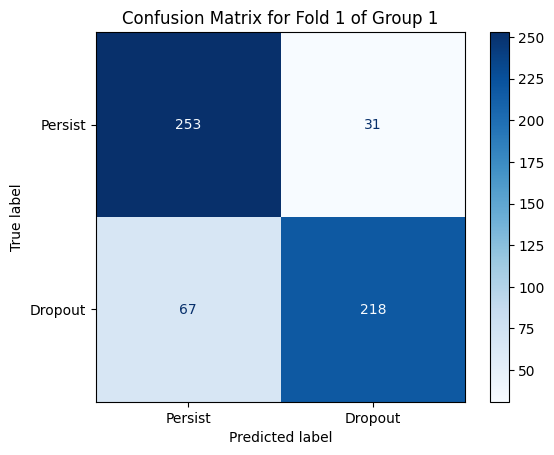


Training on Fold 2 of Group 1
Classification Report for Fold 2 of Group 1:
              precision    recall  f1-score   support

     Persist       0.79      0.89      0.83       285
     Dropout       0.87      0.76      0.81       284

    accuracy                           0.82       569
   macro avg       0.83      0.82      0.82       569
weighted avg       0.83      0.82      0.82       569



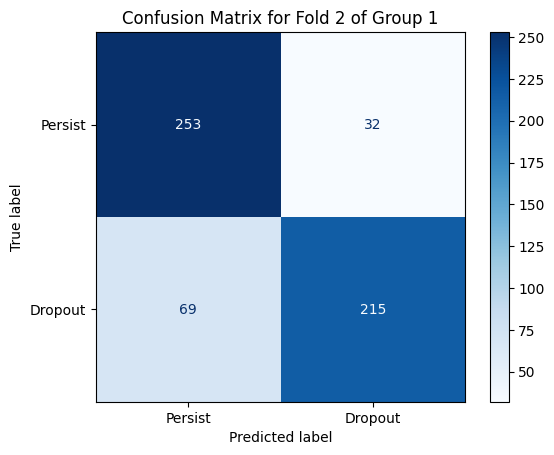


Training on Fold 3 of Group 1
Classification Report for Fold 3 of Group 1:
              precision    recall  f1-score   support

     Persist       0.79      0.89      0.84       284
     Dropout       0.88      0.76      0.82       284

    accuracy                           0.83       568
   macro avg       0.83      0.83      0.83       568
weighted avg       0.83      0.83      0.83       568



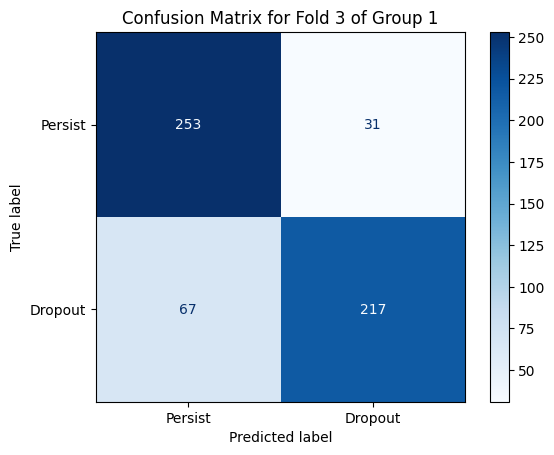


Training on Fold 4 of Group 1
Classification Report for Fold 4 of Group 1:
              precision    recall  f1-score   support

     Persist       0.76      0.82      0.79       284
     Dropout       0.81      0.74      0.77       284

    accuracy                           0.78       568
   macro avg       0.79      0.78      0.78       568
weighted avg       0.79      0.78      0.78       568



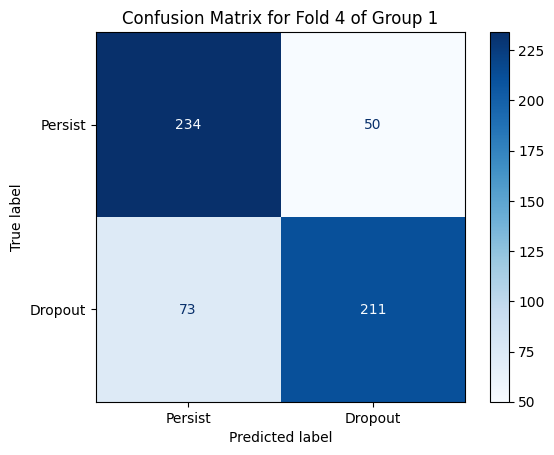


Training on Fold 5 of Group 1
Classification Report for Fold 5 of Group 1:
              precision    recall  f1-score   support

     Persist       0.79      0.87      0.83       284
     Dropout       0.85      0.77      0.81       284

    accuracy                           0.82       568
   macro avg       0.82      0.82      0.82       568
weighted avg       0.82      0.82      0.82       568



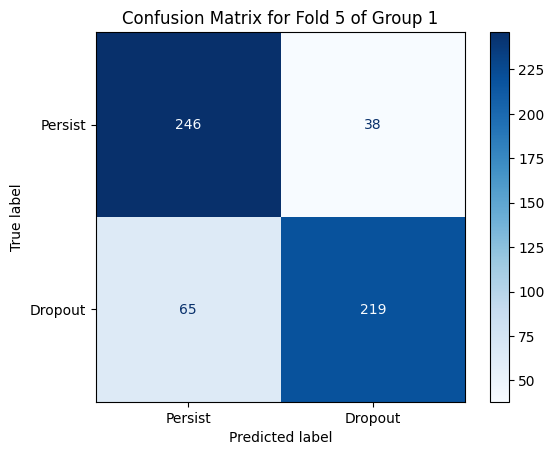


Summary of 5-Fold Cross-Validation Results for Group 1:
Classification Report for Fold 1:
              precision    recall  f1-score   support

     Persist       0.79      0.89      0.84       284
     Dropout       0.88      0.76      0.82       285

    accuracy                           0.83       569
   macro avg       0.83      0.83      0.83       569
weighted avg       0.83      0.83      0.83       569

Classification Report for Fold 2:
              precision    recall  f1-score   support

     Persist       0.79      0.89      0.83       285
     Dropout       0.87      0.76      0.81       284

    accuracy                           0.82       569
   macro avg       0.83      0.82      0.82       569
weighted avg       0.83      0.82      0.82       569

Classification Report for Fold 3:
              precision    recall  f1-score   support

     Persist       0.79      0.89      0.84       284
     Dropout       0.88      0.76      0.82       284

    accuracy           

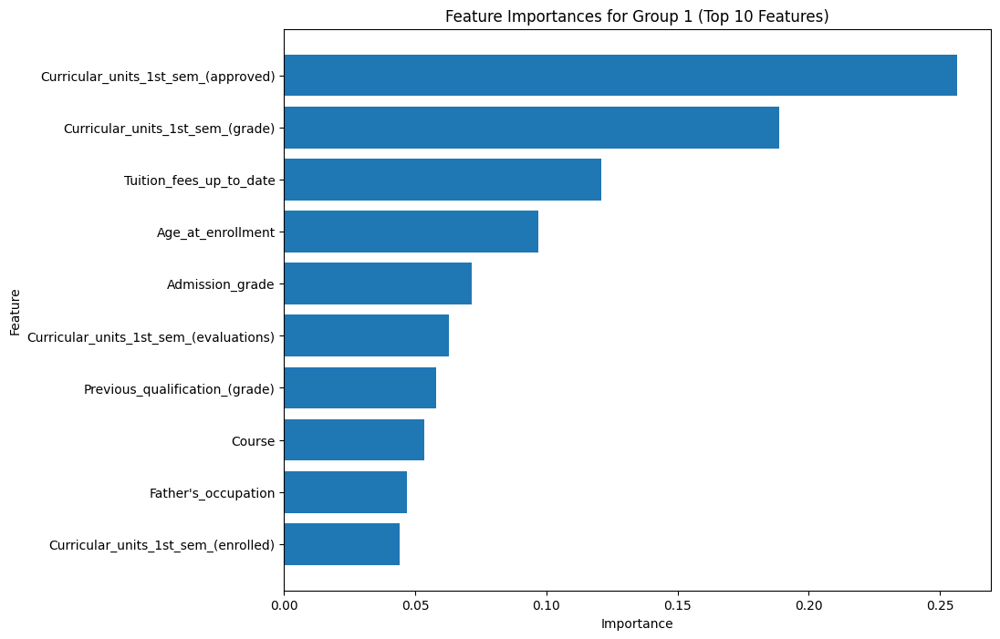


Training and Evaluating on Group 2
Selected Features:
Index(['Course', 'Father's_occupation', 'Previous_qualification_(grade)', 'Admission_grade', 'Tuition_fees_up_to_date',
       'Age_at_enrollment', 'Curricular_units_1st_sem_(evaluations)', 'Curricular_units_1st_sem_(approved)',
       'Curricular_units_1st_sem_(grade)', 'GDP'],
      dtype='object')

Training on Fold 1 of Group 2
Classification Report for Fold 1 of Group 2:
              precision    recall  f1-score   support

     Persist       0.76      0.85      0.81       284
     Dropout       0.83      0.74      0.78       285

    accuracy                           0.79       569
   macro avg       0.80      0.79      0.79       569
weighted avg       0.80      0.79      0.79       569



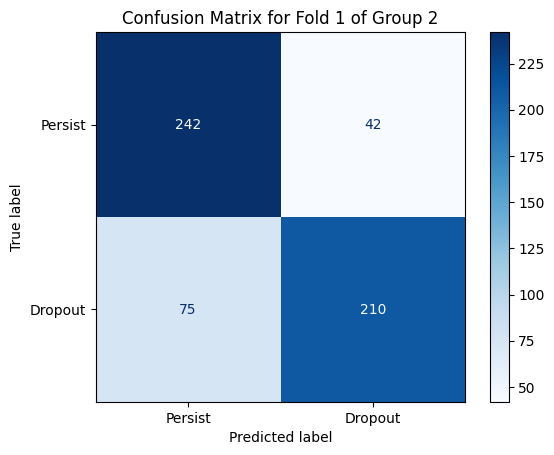


Training on Fold 2 of Group 2
Classification Report for Fold 2 of Group 2:
              precision    recall  f1-score   support

     Persist       0.78      0.82      0.80       285
     Dropout       0.81      0.76      0.78       284

    accuracy                           0.79       569
   macro avg       0.79      0.79      0.79       569
weighted avg       0.79      0.79      0.79       569



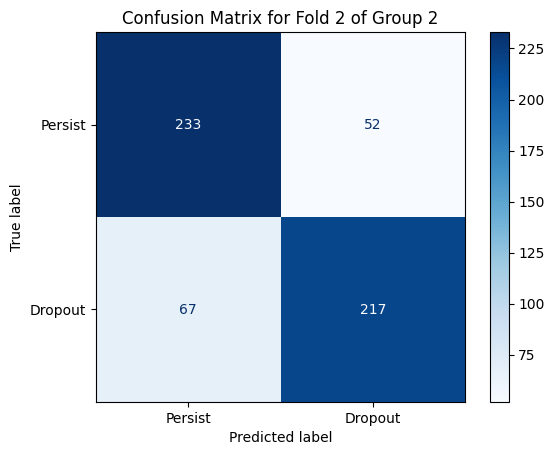


Training on Fold 3 of Group 2
Classification Report for Fold 3 of Group 2:
              precision    recall  f1-score   support

     Persist       0.80      0.88      0.84       284
     Dropout       0.87      0.78      0.82       284

    accuracy                           0.83       568
   macro avg       0.83      0.83      0.83       568
weighted avg       0.83      0.83      0.83       568



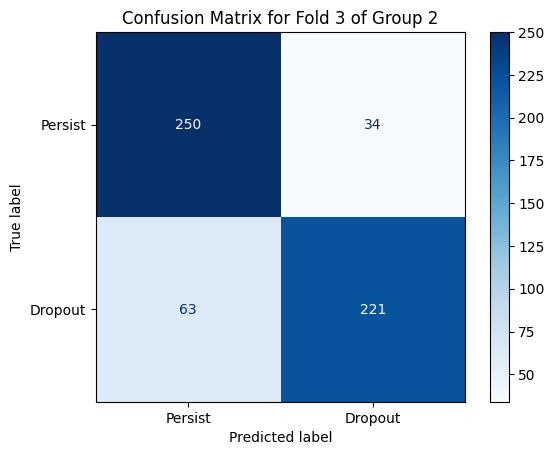


Training on Fold 4 of Group 2
Classification Report for Fold 4 of Group 2:
              precision    recall  f1-score   support

     Persist       0.78      0.83      0.81       284
     Dropout       0.82      0.77      0.79       284

    accuracy                           0.80       568
   macro avg       0.80      0.80      0.80       568
weighted avg       0.80      0.80      0.80       568



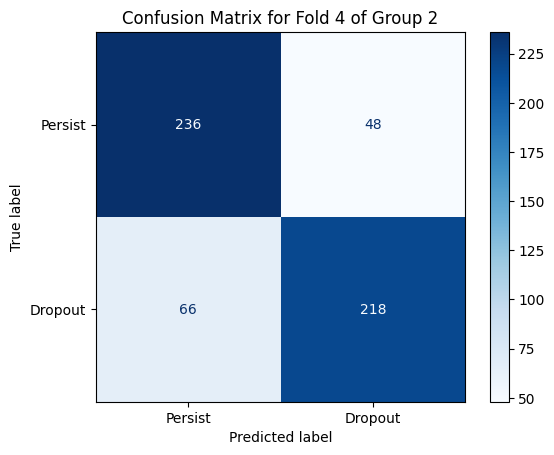


Training on Fold 5 of Group 2
Classification Report for Fold 5 of Group 2:
              precision    recall  f1-score   support

     Persist       0.78      0.83      0.80       284
     Dropout       0.82      0.77      0.79       284

    accuracy                           0.80       568
   macro avg       0.80      0.80      0.80       568
weighted avg       0.80      0.80      0.80       568



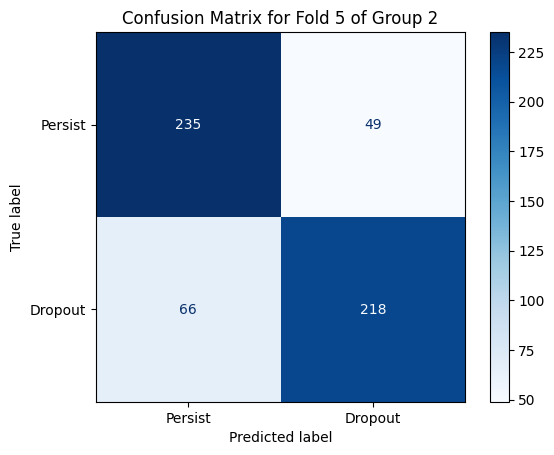


Summary of 5-Fold Cross-Validation Results for Group 2:
Classification Report for Fold 1:
              precision    recall  f1-score   support

     Persist       0.76      0.85      0.81       284
     Dropout       0.83      0.74      0.78       285

    accuracy                           0.79       569
   macro avg       0.80      0.79      0.79       569
weighted avg       0.80      0.79      0.79       569

Classification Report for Fold 2:
              precision    recall  f1-score   support

     Persist       0.78      0.82      0.80       285
     Dropout       0.81      0.76      0.78       284

    accuracy                           0.79       569
   macro avg       0.79      0.79      0.79       569
weighted avg       0.79      0.79      0.79       569

Classification Report for Fold 3:
              precision    recall  f1-score   support

     Persist       0.80      0.88      0.84       284
     Dropout       0.87      0.78      0.82       284

    accuracy           

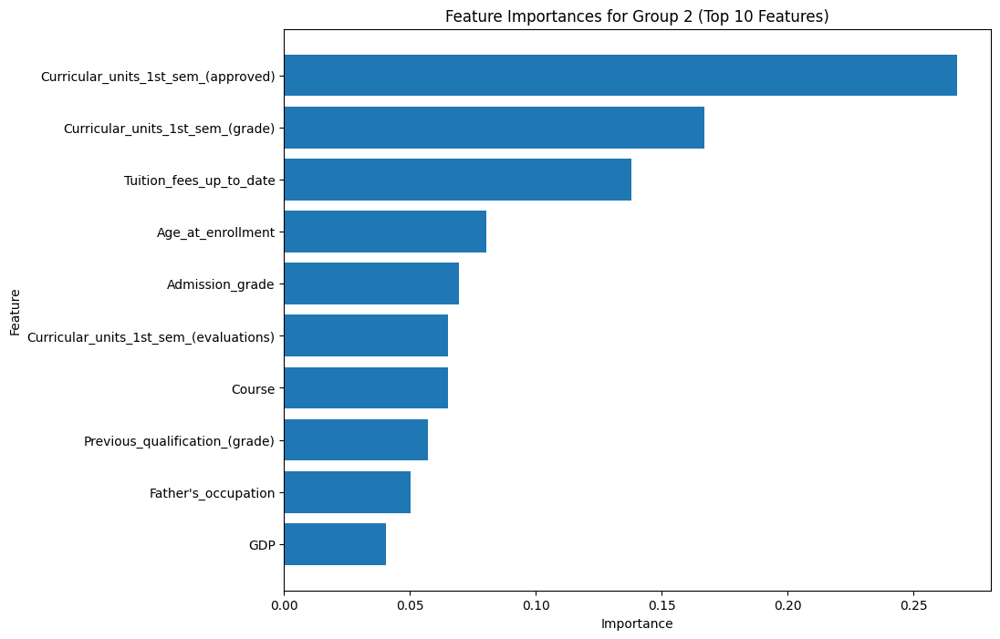

In [103]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import RFE
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Define the columns to use
all_features = [
    'Marital_status', 'Application_order', "Mother's_qualification", 
    "Father's_qualification", 'Previous_qualification', 'Application_mode', 
    'Course', "Mother's_occupation", "Father's_occupation",
    'Daytime/evening_attendance', 'Previous_qualification_(grade)', 'Admission_grade',
    'Displaced', 'Educational_special_needs', 'Debtor', 'Tuition_fees_up_to_date',
    'Gender', 'Scholarship_holder', 'Age_at_enrollment', 'International',
    'Curricular_units_1st_sem_(credited)', 'Curricular_units_1st_sem_(enrolled)',
    'Curricular_units_1st_sem_(evaluations)', 'Curricular_units_1st_sem_(approved)',
    'Curricular_units_1st_sem_(grade)', 'Curricular_units_1st_sem_(without_evaluations)',
    'Unemployment_rate', 'Inflation_rate', 'GDP'
    
]

# Step 1: Convert 'Target' to Binary
data['Binary_Target'] = data['Target'].apply(lambda x: 'Persist' if x in [1, 2] else 'Dropout')

# Step 2: Check the new target distribution
print("Value counts for each category in the 'Binary_Target' column:")
print(data['Binary_Target'].value_counts())

# Step 3: Split the "Persist" group into two balanced groups
dropout_data = data[data['Binary_Target'] == 'Dropout']
persist_data = data[data['Binary_Target'] == 'Persist']

# Ensure there is a balance in the 'Persist' group splits
persist_split1 = persist_data.iloc[:len(dropout_data)]
persist_split2 = persist_data.iloc[len(dropout_data):2*len(dropout_data)]

# Define each group combination
groups = {
    "Group 1": pd.concat([dropout_data, persist_split1]),
    "Group 2": pd.concat([dropout_data, persist_split2])
}

# Train and evaluate Random Forest model on each group using stratified 5-fold cross-validation
for group_name, group_data in groups.items():
    print(f"\nTraining and Evaluating on {group_name}")

    # Separate features and binary target
    X = group_data[all_features]
    y = group_data['Binary_Target'].apply(lambda x: 1 if x == 'Dropout' else 0)  # Encode: 1 for Dropout, 0 for Persist

    # Initialize the Random Forest model
    estimator = RandomForestClassifier(n_estimators=100, max_depth=10, random_state=42)

    # Initialize RFE with a desired number of features to select (e.g., 20)
    n_features_to_select = 10
    rfe = RFE(estimator=estimator, n_features_to_select=n_features_to_select, step=1)

    # Fit RFE on the entire dataset to select the top features
    rfe.fit(X, y)

    # Get the selected features
    selected_features = X.columns[rfe.support_]
    print("Selected Features:")
    print(selected_features)

    # Transform the data to keep only selected features
    X_selected = X[selected_features]

    # Initialize stratified K-Fold cross-validator
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    # Initialize an empty list to store evaluation results
    evaluation_reports = []

    # Start stratified 5-fold cross-validation
    for fold, (train_idx, test_idx) in enumerate(skf.split(X_selected, y)):
        print(f"\nTraining on Fold {fold + 1} of {group_name}")

        # Split data into training and testing sets for this fold
        X_train, X_test = X_selected.iloc[train_idx], X_selected.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

        # Initialize and train Random Forest model
        model = RandomForestClassifier(n_estimators=100, max_depth=10, random_state=42)
        model.fit(X_train, y_train)

        # Make predictions and evaluate the model
        y_pred = model.predict(X_test)
        report = classification_report(y_test, y_pred, target_names=['Persist', 'Dropout'])
        print(f"Classification Report for Fold {fold + 1} of {group_name}:\n{report}")

        # Compute and display the confusion matrix
        cm = confusion_matrix(y_test, y_pred)
        disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Persist', 'Dropout'])
        disp.plot(cmap=plt.cm.Blues)
        plt.title(f'Confusion Matrix for Fold {fold + 1} of {group_name}')
        plt.show()

        # Append the report for summary
        evaluation_reports.append(report)

    # Summary of the reports after all folds have been completed for each group
    print(f"\nSummary of 5-Fold Cross-Validation Results for {group_name}:")
    for i, report in enumerate(evaluation_reports, 1):
        print(f"Classification Report for Fold {i}:\n{report}")

    # Plot feature importances
    feature_importances = model.feature_importances_
    sorted_indices = feature_importances.argsort()[::-1]
    plt.figure(figsize=(10, 8))
    plt.barh([selected_features[i] for i in sorted_indices], feature_importances[sorted_indices])
    plt.xlabel('Importance')
    plt.ylabel('Feature')
    plt.title(f'Feature Importances for {group_name} (Top {n_features_to_select} Features)')
    plt.gca().invert_yaxis()
    plt.show()


# ==========================================================
# CATBOOST - original feutures 
# ==========================================================

0:	learn: 1.0221244	total: 222ms	remaining: 3m 41s
100:	learn: 0.5086687	total: 4.88s	remaining: 43.5s
200:	learn: 0.4243598	total: 9.56s	remaining: 38s
300:	learn: 0.3690095	total: 14.2s	remaining: 33s
400:	learn: 0.3276633	total: 18.9s	remaining: 28.3s
500:	learn: 0.2886735	total: 23.6s	remaining: 23.5s
600:	learn: 0.2561388	total: 28.4s	remaining: 18.8s
700:	learn: 0.2297910	total: 33.3s	remaining: 14.2s
800:	learn: 0.2013380	total: 38.3s	remaining: 9.5s
900:	learn: 0.1780287	total: 43s	remaining: 4.72s
999:	learn: 0.1593735	total: 47.7s	remaining: 0us
Classification Report:
              precision    recall  f1-score   support

     Dropout       0.81      0.75      0.78       271
    Enrolled       0.57      0.43      0.49       152
    Graduate       0.82      0.92      0.87       462

    accuracy                           0.79       885
   macro avg       0.73      0.70      0.71       885
weighted avg       0.77      0.79      0.78       885



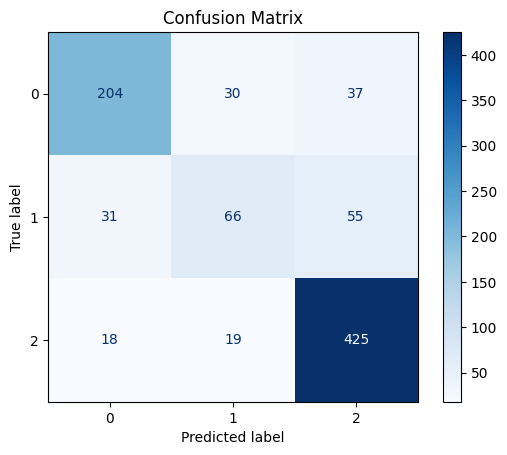

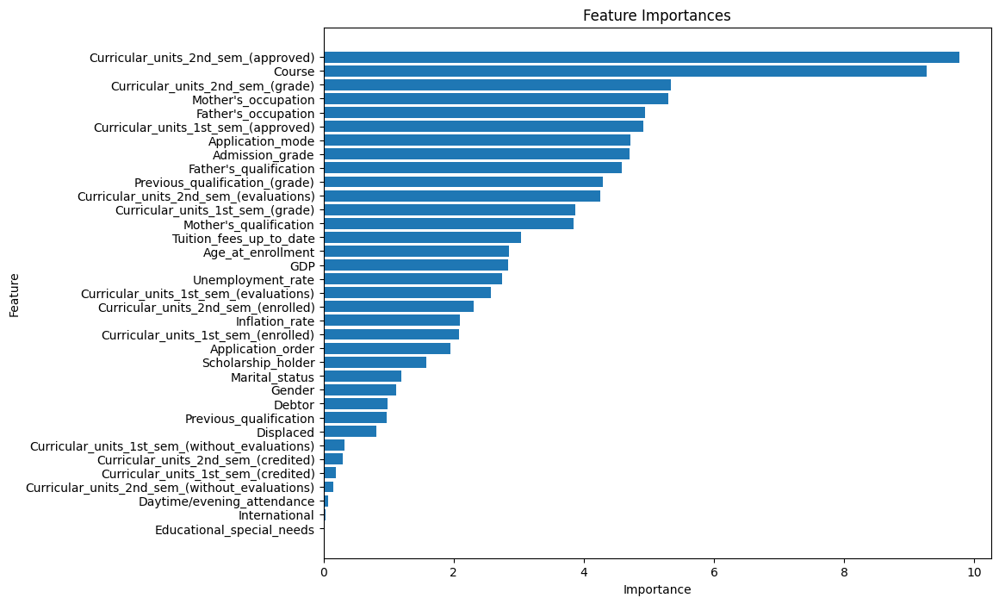

In [104]:
import pandas as pd
from catboost import CatBoostClassifier, Pool
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Define the columns to use, excluding original and grouped columns
all_features = [
    'Marital_status',  'Application_order',"Mother's_qualification", 
    "Father's_qualification", 
    'Previous_qualification',
    'Application_mode', 
    'Course',
    "Mother's_occupation", 
    "Father's_occupation",
    'Daytime/evening_attendance', 'Previous_qualification_(grade)', 'Admission_grade',
    'Displaced', 'Educational_special_needs', 'Debtor', 'Tuition_fees_up_to_date',
    'Gender', 'Scholarship_holder', 'Age_at_enrollment', 'International',
    'Curricular_units_1st_sem_(credited)', 'Curricular_units_1st_sem_(enrolled)',
    'Curricular_units_1st_sem_(evaluations)', 'Curricular_units_1st_sem_(approved)',
    'Curricular_units_1st_sem_(grade)', 'Curricular_units_1st_sem_(without_evaluations)',
    'Curricular_units_2nd_sem_(credited)', 'Curricular_units_2nd_sem_(enrolled)',
    'Curricular_units_2nd_sem_(evaluations)', 'Curricular_units_2nd_sem_(approved)',
    'Curricular_units_2nd_sem_(grade)', 'Curricular_units_2nd_sem_(without_evaluations)',
    'Unemployment_rate', 'Inflation_rate', 'GDP',
]

# Define categorical features for CatBoost
categ_features = [
    'Displaced',
    'Gender',
    'International',
    'Educational_special_needs',
    'Debtor',
    'Tuition_fees_up_to_date',
    'Scholarship_holder',
    'Daytime/evening_attendance', 
    'Marital_status',
    "Mother's_qualification", 
    "Father's_qualification", 
    'Previous_qualification',
    'Application_mode', 
    'Course',
    "Mother's_occupation", 
    "Father's_occupation"
]

# Separate features and target
X = data[all_features]
y = data['Target']

# Split data into training and testing sets (80% train, 20% test)
train_data = data.sample(frac=0.8, random_state=42)
test_data = data.drop(train_data.index)

X_train, y_train = train_data[all_features], train_data['Target']
X_test, y_test = test_data[all_features], test_data['Target']

# Define CatBoost Pool (needed for categorical features)
train_pool = Pool(X_train, y_train, cat_features=categ_features)
test_pool = Pool(X_test, y_test, cat_features=categ_features)

# Initialize and train CatBoost model
model = CatBoostClassifier(iterations=1000, learning_rate=0.1, depth=6, verbose=100, random_seed=42)
model.fit(train_pool)

# Make predictions and evaluate the model
y_pred = model.predict(test_pool)
report = classification_report(y_test, y_pred, target_names=['Dropout', 'Enrolled', 'Graduate'])
print(f"Classification Report:\n{report}")

# Compute confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.show()

# Plot feature importances
feature_importances = model.feature_importances_
sorted_indices = feature_importances.argsort()[::-1]
plt.figure(figsize=(10, 8))
plt.barh([all_features[i] for i in sorted_indices], feature_importances[sorted_indices])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importances')
plt.gca().invert_yaxis()
plt.show()



# CATBOOST - mapped feutures 


0:	learn: 1.0221244	total: 47.4ms	remaining: 47.4s
100:	learn: 0.5040166	total: 4.75s	remaining: 42.3s
200:	learn: 0.4275194	total: 9.43s	remaining: 37.5s
300:	learn: 0.3724954	total: 14.1s	remaining: 32.7s
400:	learn: 0.3270544	total: 18.8s	remaining: 28s
500:	learn: 0.2907290	total: 23.5s	remaining: 23.4s
600:	learn: 0.2572995	total: 28.2s	remaining: 18.7s
700:	learn: 0.2281388	total: 33s	remaining: 14.1s
800:	learn: 0.2038897	total: 37.9s	remaining: 9.41s
900:	learn: 0.1803075	total: 42.6s	remaining: 4.68s
999:	learn: 0.1599872	total: 47.3s	remaining: 0us
Classification Report:
              precision    recall  f1-score   support

     Dropout       0.81      0.76      0.78       271
    Enrolled       0.59      0.46      0.52       152
    Graduate       0.83      0.92      0.87       462

    accuracy                           0.79       885
   macro avg       0.75      0.71      0.73       885
weighted avg       0.78      0.79      0.79       885



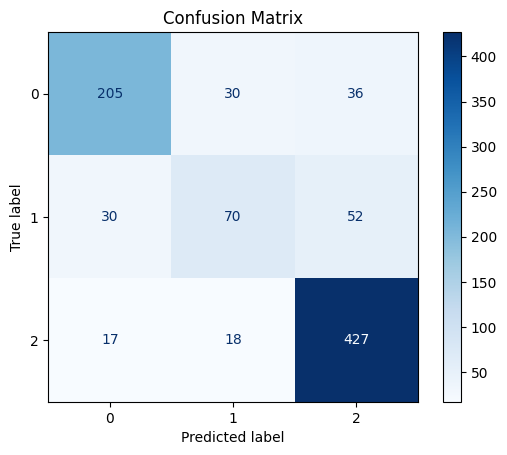

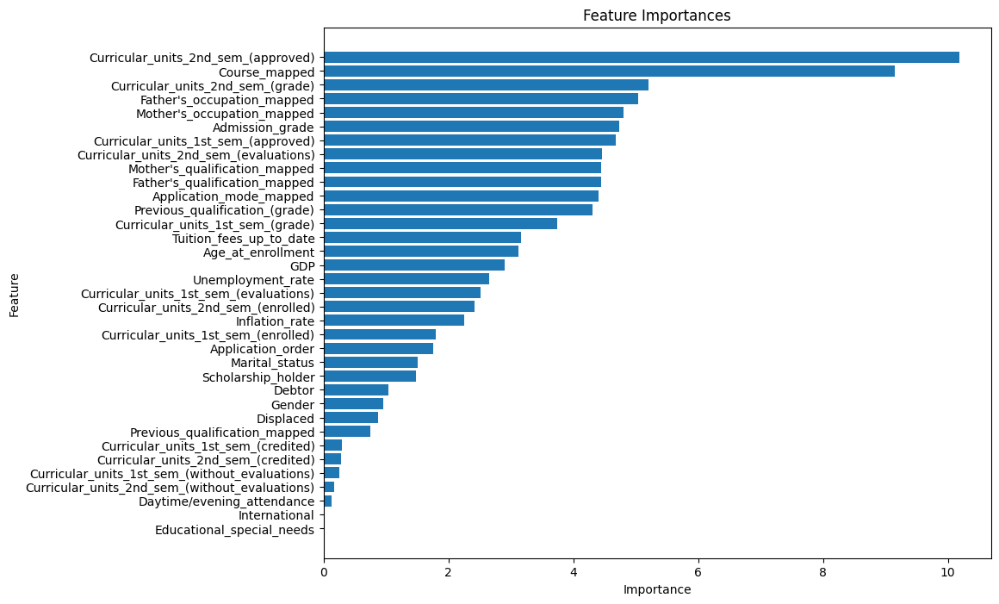

In [105]:
import pandas as pd
from catboost import CatBoostClassifier, Pool
from sklearn.metrics import classification_report
from sklearn.model_selection import StratifiedKFold

# Define the columns to use, excluding original and grouped columns
all_features = [
    'Marital_status',  'Application_order',
    'Daytime/evening_attendance', 'Previous_qualification_(grade)', 'Admission_grade',
    'Displaced', 'Educational_special_needs', 'Debtor', 'Tuition_fees_up_to_date',
    'Gender', 'Scholarship_holder', 'Age_at_enrollment', 'International',
    'Curricular_units_1st_sem_(credited)', 'Curricular_units_1st_sem_(enrolled)',
    'Curricular_units_1st_sem_(evaluations)', 'Curricular_units_1st_sem_(approved)',
    'Curricular_units_1st_sem_(grade)', 'Curricular_units_1st_sem_(without_evaluations)',
    'Curricular_units_2nd_sem_(credited)', 'Curricular_units_2nd_sem_(enrolled)',
    'Curricular_units_2nd_sem_(evaluations)', 'Curricular_units_2nd_sem_(approved)',
    'Curricular_units_2nd_sem_(grade)', 'Curricular_units_2nd_sem_(without_evaluations)',
    'Unemployment_rate', 'Inflation_rate', 'GDP', "Mother's_qualification_mapped",
    "Father's_qualification_mapped", 'Previous_qualification_mapped',
    'Application_mode_mapped', 'Course_mapped', "Mother's_occupation_mapped", "Father's_occupation_mapped"
]

# Define categorical features for CatBoost
categ_features = [
    'Displaced',
    'Gender',
    'International',
    'Educational_special_needs',
    'Debtor',
    'Tuition_fees_up_to_date',
    'Scholarship_holder',
    'Daytime/evening_attendance',
    'Marital_status',
    "Mother's_qualification_mapped", 
    "Father's_qualification_mapped", 
    'Previous_qualification_mapped',
    'Application_mode_mapped', 
    "Mother's_occupation_mapped", 
    "Father's_occupation_mapped",
    'Course_mapped'
]

# Separate features and target
X = data[all_features]
y = data['Target']

# Split data into training and testing sets (80% train, 20% test)
train_data = data.sample(frac=0.8, random_state=42)
test_data = data.drop(train_data.index)

X_train, y_train = train_data[all_features], train_data['Target']
X_test, y_test = test_data[all_features], test_data['Target']

# Define CatBoost Pool (needed for categorical features)
train_pool = Pool(X_train, y_train, cat_features=categ_features)
test_pool = Pool(X_test, y_test, cat_features=categ_features)

# Initialize and train CatBoost model
model = CatBoostClassifier(iterations=1000, learning_rate=0.1, depth=6, verbose=100, random_seed=42)
model.fit(train_pool)

# Make predictions and evaluate the model
y_pred = model.predict(test_pool)
report = classification_report(y_test, y_pred, target_names=['Dropout', 'Enrolled', 'Graduate'])
print(f"Classification Report:\n{report}")

# Compute confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.show()

# Plot feature importances
feature_importances = model.feature_importances_
sorted_indices = feature_importances.argsort()[::-1]
plt.figure(figsize=(10, 8))
plt.barh([all_features[i] for i in sorted_indices], feature_importances[sorted_indices])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importances')
plt.gca().invert_yaxis()
plt.show()


# CATBOOST - mapped feutures - controlled group splits with 5-Fold validation


Training and Evaluating on Group 1

Training on Fold 1 of Group 1
0:	learn: 1.0423162	total: 41.9ms	remaining: 41.9s
100:	learn: 0.5392945	total: 4.11s	remaining: 36.6s
200:	learn: 0.4154742	total: 8.26s	remaining: 32.8s
300:	learn: 0.3316296	total: 12.3s	remaining: 28.6s
400:	learn: 0.2688271	total: 16.5s	remaining: 24.6s
500:	learn: 0.2193826	total: 20.8s	remaining: 20.7s
600:	learn: 0.1794098	total: 24.9s	remaining: 16.5s
700:	learn: 0.1501380	total: 28.9s	remaining: 12.3s
800:	learn: 0.1282980	total: 33.1s	remaining: 8.21s
900:	learn: 0.1096146	total: 37.1s	remaining: 4.08s
999:	learn: 0.0941955	total: 41.2s	remaining: 0us
Classification Report for Fold 1 of Group 1:
               precision    recall  f1-score   support

     Dropout       0.82      0.70      0.75       142
    Enrolled       0.66      0.68      0.67       159
    Graduate       0.73      0.81      0.77       148

    accuracy                           0.73       449
   macro avg       0.74      0.73      0.73   

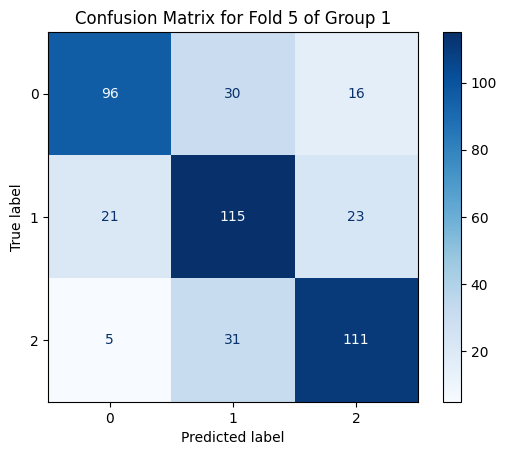

Classification Report for Fold 2:
               precision    recall  f1-score   support

     Dropout       0.79      0.65      0.71       143
    Enrolled       0.57      0.67      0.62       158
    Graduate       0.74      0.73      0.73       147

    accuracy                           0.68       448
   macro avg       0.70      0.68      0.69       448
weighted avg       0.70      0.68      0.69       448



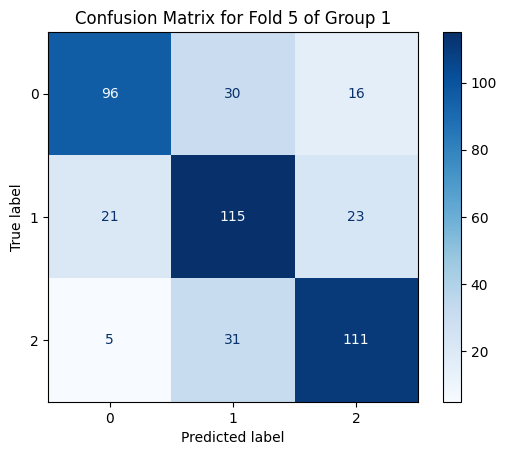

Classification Report for Fold 3:
               precision    recall  f1-score   support

     Dropout       0.79      0.63      0.70       142
    Enrolled       0.60      0.65      0.62       159
    Graduate       0.71      0.78      0.74       147

    accuracy                           0.69       448
   macro avg       0.70      0.69      0.69       448
weighted avg       0.69      0.69      0.69       448



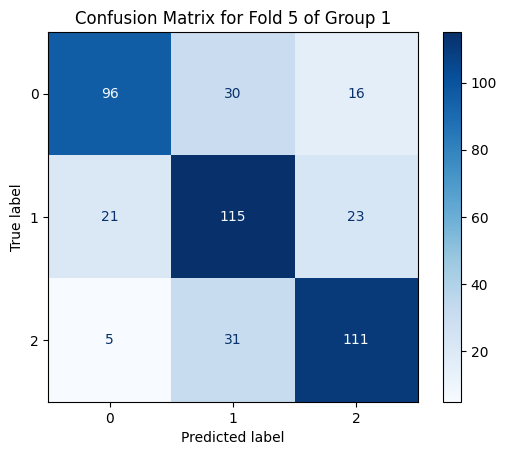

Classification Report for Fold 4:
               precision    recall  f1-score   support

     Dropout       0.83      0.76      0.79       142
    Enrolled       0.69      0.74      0.71       159
    Graduate       0.80      0.81      0.80       147

    accuracy                           0.77       448
   macro avg       0.77      0.77      0.77       448
weighted avg       0.77      0.77      0.77       448



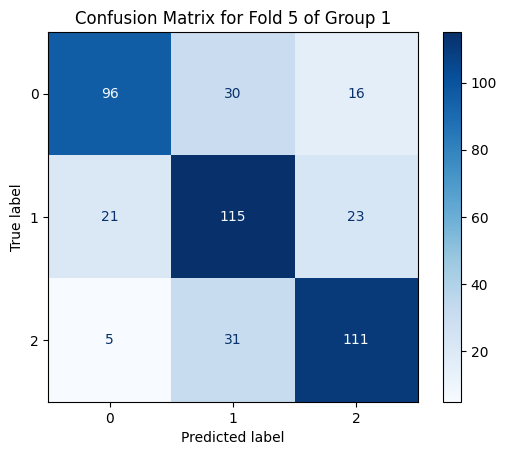

Classification Report for Fold 5:
               precision    recall  f1-score   support

     Dropout       0.79      0.68      0.73       142
    Enrolled       0.65      0.72      0.69       159
    Graduate       0.74      0.76      0.75       147

    accuracy                           0.72       448
   macro avg       0.73      0.72      0.72       448
weighted avg       0.72      0.72      0.72       448



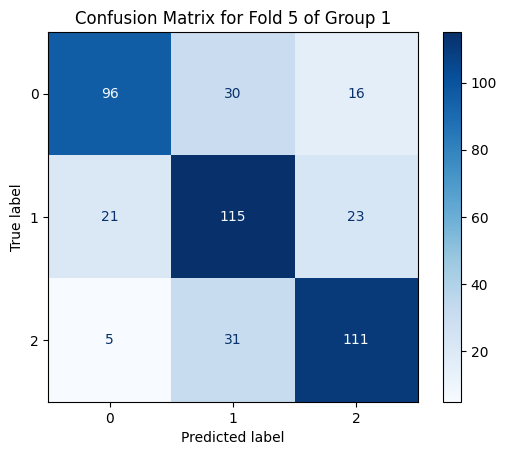

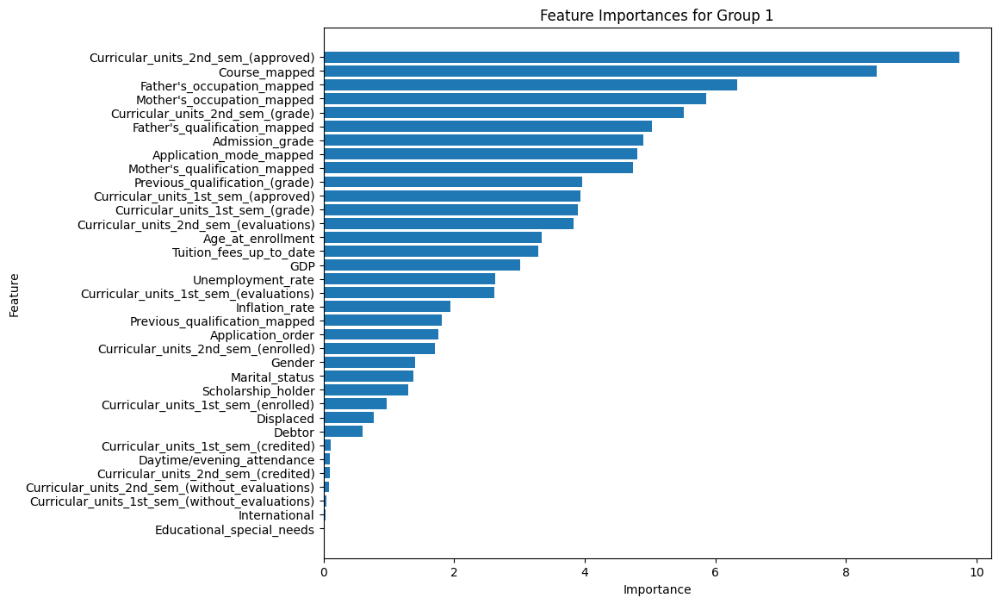


Training and Evaluating on Group 2

Training on Fold 1 of Group 2
0:	learn: 1.0491159	total: 32.3ms	remaining: 32.3s
100:	learn: 0.5632927	total: 3.87s	remaining: 34.5s
200:	learn: 0.4278042	total: 7.86s	remaining: 31.2s
300:	learn: 0.3355930	total: 11.9s	remaining: 27.6s
400:	learn: 0.2656803	total: 15.9s	remaining: 23.7s
500:	learn: 0.2135858	total: 19.9s	remaining: 19.8s
600:	learn: 0.1774168	total: 24s	remaining: 15.9s
700:	learn: 0.1471883	total: 28s	remaining: 11.9s
800:	learn: 0.1250938	total: 32.1s	remaining: 7.96s
900:	learn: 0.1062492	total: 36.1s	remaining: 3.97s
999:	learn: 0.0918205	total: 40.1s	remaining: 0us
Classification Report for Fold 1 of Group 2:
               precision    recall  f1-score   support

     Dropout       0.78      0.68      0.72       142
    Enrolled       0.71      0.65      0.68       158
    Graduate       0.72      0.88      0.79       148

    accuracy                           0.73       448
   macro avg       0.74      0.74      0.73       

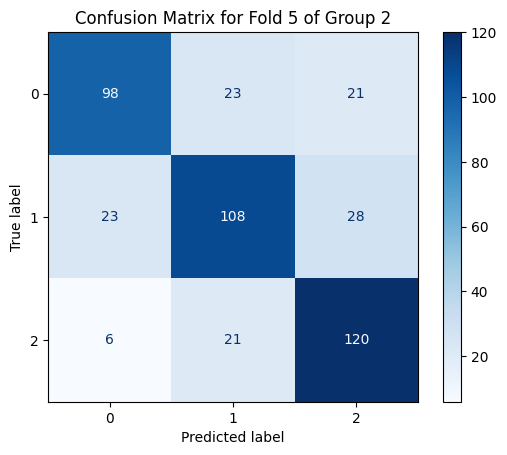

Classification Report for Fold 2:
               precision    recall  f1-score   support

     Dropout       0.81      0.73      0.77       142
    Enrolled       0.61      0.64      0.62       159
    Graduate       0.68      0.71      0.70       147

    accuracy                           0.69       448
   macro avg       0.70      0.69      0.70       448
weighted avg       0.70      0.69      0.69       448



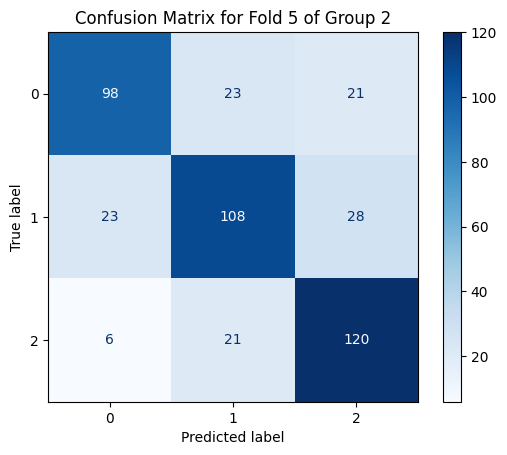

Classification Report for Fold 3:
               precision    recall  f1-score   support

     Dropout       0.74      0.66      0.70       142
    Enrolled       0.64      0.64      0.64       159
    Graduate       0.69      0.76      0.72       147

    accuracy                           0.69       448
   macro avg       0.69      0.69      0.69       448
weighted avg       0.69      0.69      0.68       448



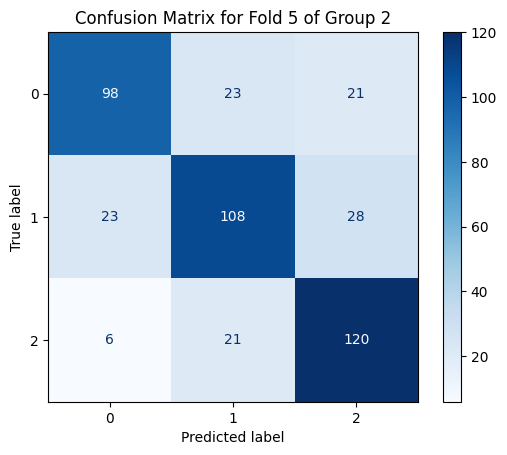

Classification Report for Fold 4:
               precision    recall  f1-score   support

     Dropout       0.82      0.68      0.74       142
    Enrolled       0.69      0.72      0.70       159
    Graduate       0.73      0.81      0.77       147

    accuracy                           0.74       448
   macro avg       0.74      0.74      0.74       448
weighted avg       0.74      0.74      0.74       448



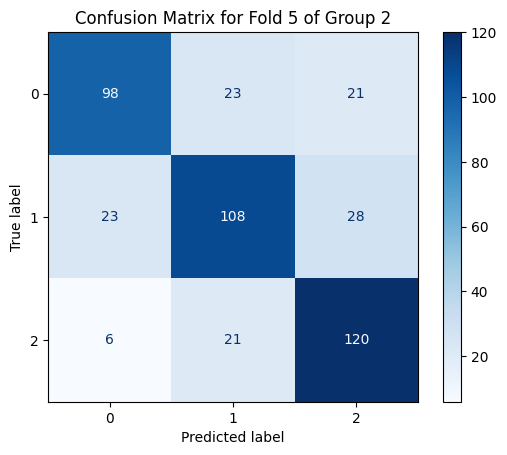

Classification Report for Fold 5:
               precision    recall  f1-score   support

     Dropout       0.77      0.69      0.73       142
    Enrolled       0.71      0.68      0.69       159
    Graduate       0.71      0.82      0.76       147

    accuracy                           0.73       448
   macro avg       0.73      0.73      0.73       448
weighted avg       0.73      0.73      0.73       448



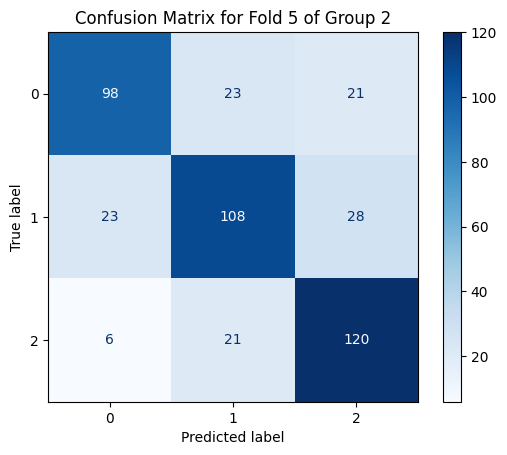

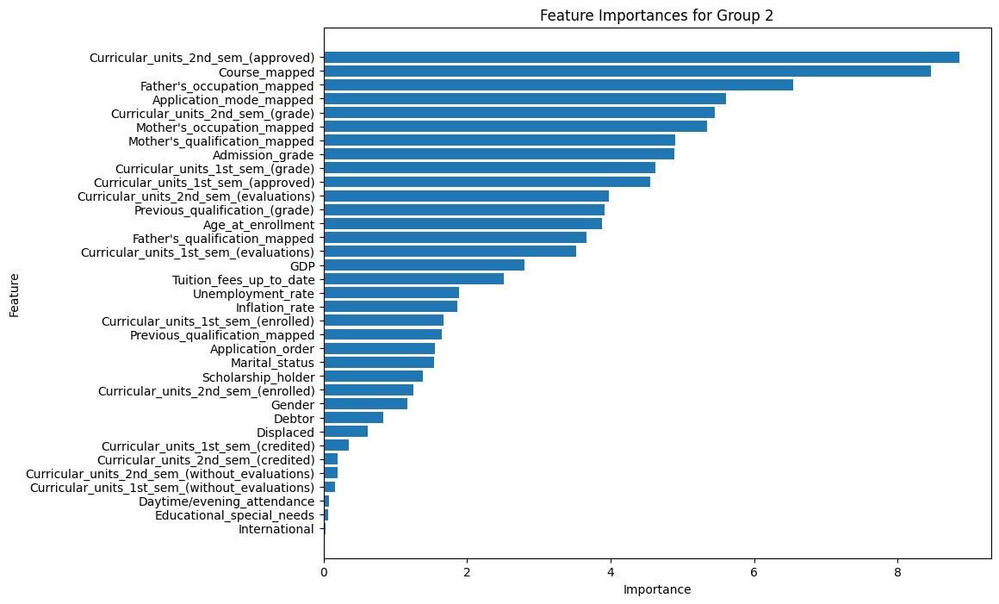


Training and Evaluating on Group 3

Training on Fold 1 of Group 3
0:	learn: 1.0508009	total: 33.7ms	remaining: 33.7s
100:	learn: 0.5334370	total: 4.07s	remaining: 36.2s
200:	learn: 0.4096289	total: 8.18s	remaining: 32.5s
300:	learn: 0.3297147	total: 12.3s	remaining: 28.5s
400:	learn: 0.2731578	total: 16.3s	remaining: 24.4s
500:	learn: 0.2253365	total: 20.5s	remaining: 20.4s
600:	learn: 0.1888953	total: 24.6s	remaining: 16.3s
700:	learn: 0.1600795	total: 28.7s	remaining: 12.2s
800:	learn: 0.1380950	total: 32.8s	remaining: 8.16s
900:	learn: 0.1178865	total: 36.9s	remaining: 4.06s
999:	learn: 0.1026654	total: 41s	remaining: 0us
Classification Report for Fold 1 of Group 3:
               precision    recall  f1-score   support

     Dropout       0.80      0.68      0.74       142
    Enrolled       0.64      0.67      0.66       159
    Graduate       0.72      0.79      0.75       148

    accuracy                           0.71       449
   macro avg       0.72      0.72      0.72     

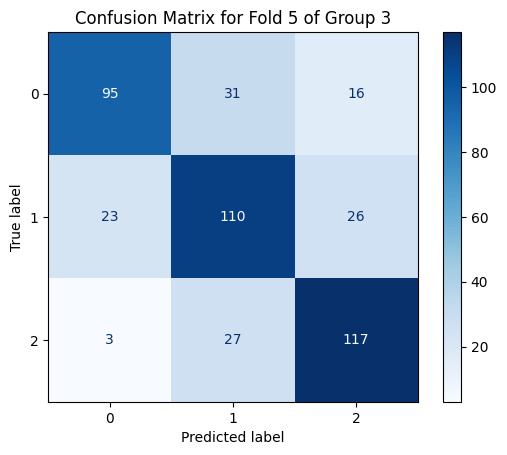

Classification Report for Fold 2:
               precision    recall  f1-score   support

     Dropout       0.81      0.67      0.73       142
    Enrolled       0.59      0.67      0.63       159
    Graduate       0.71      0.72      0.72       148

    accuracy                           0.69       449
   macro avg       0.70      0.69      0.69       449
weighted avg       0.70      0.69      0.69       449



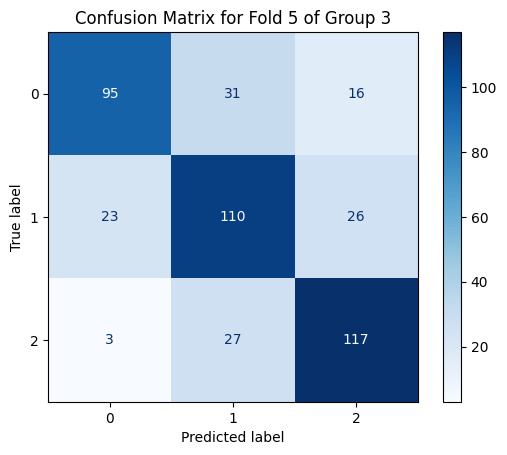

Classification Report for Fold 3:
               precision    recall  f1-score   support

     Dropout       0.80      0.63      0.70       143
    Enrolled       0.62      0.61      0.61       158
    Graduate       0.68      0.83      0.75       147

    accuracy                           0.69       448
   macro avg       0.70      0.69      0.69       448
weighted avg       0.69      0.69      0.69       448



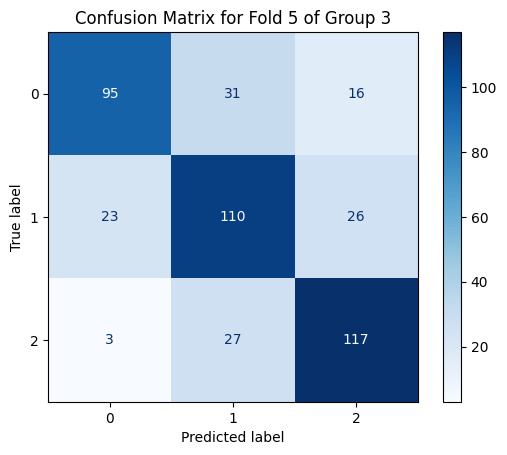

Classification Report for Fold 4:
               precision    recall  f1-score   support

     Dropout       0.80      0.79      0.79       142
    Enrolled       0.68      0.63      0.65       159
    Graduate       0.75      0.82      0.78       147

    accuracy                           0.74       448
   macro avg       0.74      0.74      0.74       448
weighted avg       0.74      0.74      0.74       448



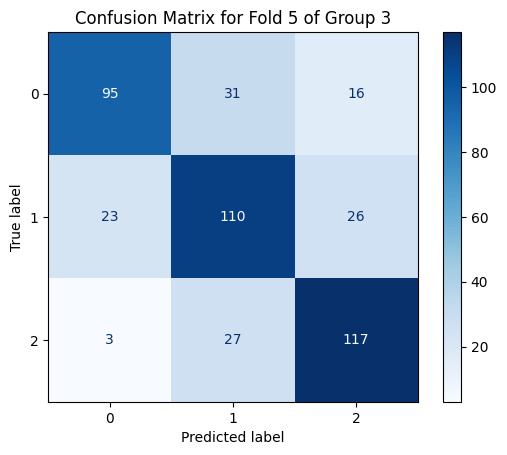

Classification Report for Fold 5:
               precision    recall  f1-score   support

     Dropout       0.79      0.67      0.72       142
    Enrolled       0.65      0.69      0.67       159
    Graduate       0.74      0.80      0.76       147

    accuracy                           0.72       448
   macro avg       0.73      0.72      0.72       448
weighted avg       0.72      0.72      0.72       448



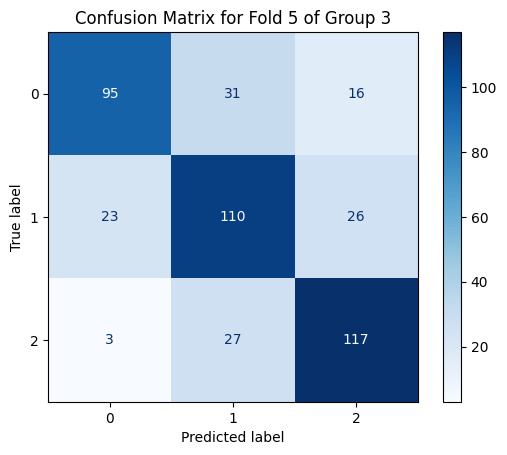

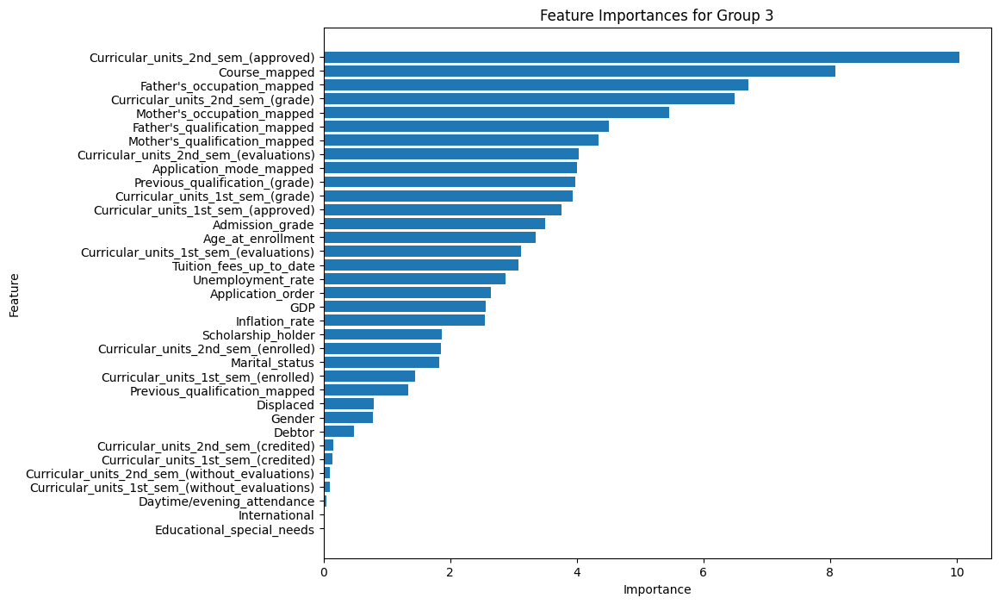

In [106]:
import pandas as pd
from catboost import CatBoostClassifier, Pool
from sklearn.metrics import classification_report
from collections import Counter

# Define the columns to use, excluding original and grouped columns
all_features = [
    'Marital_status',  'Application_order',
    'Daytime/evening_attendance', 'Previous_qualification_(grade)', 'Admission_grade',
    'Displaced', 'Educational_special_needs', 'Debtor', 'Tuition_fees_up_to_date',
    'Gender', 'Scholarship_holder', 'Age_at_enrollment', 'International',
    'Curricular_units_1st_sem_(credited)', 'Curricular_units_1st_sem_(enrolled)',
    'Curricular_units_1st_sem_(evaluations)', 'Curricular_units_1st_sem_(approved)',
    'Curricular_units_1st_sem_(grade)', 'Curricular_units_1st_sem_(without_evaluations)',
    'Curricular_units_2nd_sem_(credited)', 'Curricular_units_2nd_sem_(enrolled)',
    'Curricular_units_2nd_sem_(evaluations)', 'Curricular_units_2nd_sem_(approved)',
    'Curricular_units_2nd_sem_(grade)', 'Curricular_units_2nd_sem_(without_evaluations)',
    'Unemployment_rate', 'Inflation_rate', 'GDP', "Mother's_qualification_mapped",
    "Father's_qualification_mapped", 'Previous_qualification_mapped',
    'Application_mode_mapped', 'Course_mapped', "Mother's_occupation_mapped", "Father's_occupation_mapped"
]


# Define categorical features for CatBoost
categ_features = [
    'Displaced',
    'Gender',
    'International',
    'Educational_special_needs',
    'Debtor',
    'Tuition_fees_up_to_date',
    'Scholarship_holder',
    'Daytime/evening_attendance' , 

    'Marital_status',
    "Mother's_qualification_mapped", 
    "Father's_qualification_mapped", 
    'Previous_qualification_mapped',
    'Application_mode_mapped', 
    "Mother's_occupation_mapped", 
    "Father's_occupation_mapped",
    'Course_mapped'
]

# Split data into each class subset
graduate_data = data[data['Target'] == 2]
dropout_data = data[data['Target'] == 0]
enrolled_data = data[data['Target'] == 1]

# Define the split groups for Graduates and Dropouts
graduate_splits = [graduate_data.iloc[:736], graduate_data.iloc[736:1472], graduate_data.iloc[1472:]]
dropout_splits = [dropout_data.iloc[:711], dropout_data.iloc[711:]]

# Define each group combination
groups = {
    "Group 1": pd.concat([graduate_splits[0], dropout_splits[0], enrolled_data]),
    "Group 2": pd.concat([graduate_splits[1], dropout_splits[1], enrolled_data]),
    "Group 3": pd.concat([graduate_splits[2], dropout_splits[0], enrolled_data])
}

# Train and evaluate CatBoost model on each group using stratified 5-fold cross-validation
for group_name, group_data in groups.items():
    print(f"\nTraining and Evaluating on {group_name}")

    # Separate features and target
    X = group_data[all_features]
    y = group_data['Target']

    # Initialize stratified K-Fold cross-validator
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    # Initialize an empty list to store evaluation results
    evaluation_reports = []

    # Start stratified 5-fold cross-validation
    for fold, (train_idx, test_idx) in enumerate(skf.split(X, y)):
        print(f"\nTraining on Fold {fold + 1} of {group_name}")

        # Split data into training and testing sets for this fold
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

        # Define CatBoost Pool (needed for categorical features)
        train_pool = Pool(X_train, y_train, cat_features=categ_features)
        test_pool = Pool(X_test, y_test, cat_features=categ_features)

        # Initialize and train CatBoost model
        model = CatBoostClassifier(iterations=1000, learning_rate=0.1, depth=6, verbose=100, random_seed=42)
        model.fit(train_pool)

        # Make predictions and evaluate the model
        y_pred = model.predict(test_pool)
        report = classification_report(y_test, y_pred, target_names=['Dropout', 'Enrolled', 'Graduate'])
        print(f"Classification Report for Fold {fold + 1} of {group_name}:\n", report)

        # Append the report to the list for further analysis
        evaluation_reports.append(report)

    # summary of the reports after all folds have been completed for each group
    print(f"\nSummary of 5-Fold Cross-Validation Results for {group_name}:")
    for i, report in enumerate(evaluation_reports, 1):
        print(f"Classification Report for Fold {i}:\n", report)

 # Compute confusion matrix
        cm = confusion_matrix(y_test, y_pred)

        # Plot confusion matrix
        disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
        disp.plot(cmap=plt.cm.Blues)
        plt.title(f'Confusion Matrix for Fold {fold + 1} of {group_name}')
        plt.show()

        
    # Plot feature importances
    feature_importances = model.feature_importances_
    sorted_indices = feature_importances.argsort()[::-1]
    plt.figure(figsize=(10, 8))
    plt.barh([all_features[i] for i in sorted_indices], feature_importances[sorted_indices])
    plt.xlabel('Importance')
    plt.ylabel('Feature')
    plt.title(f'Feature Importances for {group_name}')
    plt.gca().invert_yaxis()
    plt.show()

## CATBOOST - mapped feutures - BINARY TARGET - controlled group splits with 5-Fold validation 

Value counts for each category in the 'Target_binary' column:
Target_binary
1    3003
0    1421
Name: count, dtype: int64

Training and Evaluating on Group 1

Training on Fold 1 of Group 1
0:	learn: 0.6298734	total: 54.5ms	remaining: 54.5s
100:	learn: 0.2355685	total: 2.89s	remaining: 25.7s
200:	learn: 0.1544717	total: 5.57s	remaining: 22.2s
300:	learn: 0.1023192	total: 8.28s	remaining: 19.2s
400:	learn: 0.0715735	total: 11s	remaining: 16.4s
500:	learn: 0.0524591	total: 13.6s	remaining: 13.6s
600:	learn: 0.0408218	total: 16.3s	remaining: 10.8s
700:	learn: 0.0326746	total: 19s	remaining: 8.11s
800:	learn: 0.0269075	total: 21.7s	remaining: 5.39s
900:	learn: 0.0227427	total: 24.4s	remaining: 2.68s
999:	learn: 0.0189990	total: 27s	remaining: 0us
Classification Report for Fold 1 of Group 1:
               precision    recall  f1-score   support

     Dropout       0.88      0.80      0.84       284
     Persist       0.83      0.90      0.86       301

    accuracy                          

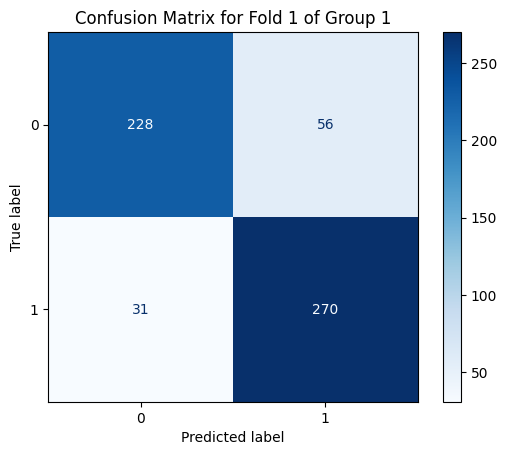


Training on Fold 2 of Group 1
0:	learn: 0.6238676	total: 24ms	remaining: 24s
100:	learn: 0.2462789	total: 2.76s	remaining: 24.6s
200:	learn: 0.1699024	total: 5.46s	remaining: 21.7s
300:	learn: 0.1128783	total: 8.1s	remaining: 18.8s
400:	learn: 0.0836792	total: 10.8s	remaining: 16.1s
500:	learn: 0.0624544	total: 13.5s	remaining: 13.4s
600:	learn: 0.0493804	total: 16.3s	remaining: 10.8s
700:	learn: 0.0398024	total: 19.3s	remaining: 8.25s
800:	learn: 0.0324541	total: 22s	remaining: 5.47s
900:	learn: 0.0281740	total: 24.7s	remaining: 2.71s
999:	learn: 0.0255108	total: 27.4s	remaining: 0us
Classification Report for Fold 2 of Group 1:
               precision    recall  f1-score   support

     Dropout       0.87      0.85      0.86       285
     Persist       0.86      0.88      0.87       300

    accuracy                           0.86       585
   macro avg       0.86      0.86      0.86       585
weighted avg       0.86      0.86      0.86       585



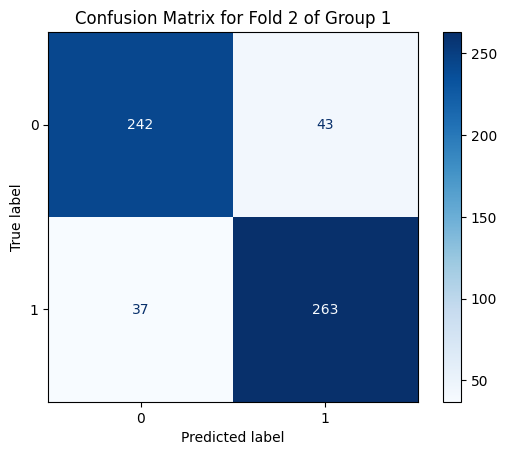


Training on Fold 3 of Group 1
0:	learn: 0.6278377	total: 24.1ms	remaining: 24.1s
100:	learn: 0.2323597	total: 2.67s	remaining: 23.8s
200:	learn: 0.1565213	total: 5.33s	remaining: 21.2s
300:	learn: 0.1123266	total: 8.02s	remaining: 18.6s
400:	learn: 0.0822873	total: 10.7s	remaining: 16s
500:	learn: 0.0622784	total: 13.3s	remaining: 13.3s
600:	learn: 0.0482245	total: 16s	remaining: 10.6s
700:	learn: 0.0368486	total: 18.6s	remaining: 7.93s
800:	learn: 0.0306017	total: 21.3s	remaining: 5.29s
900:	learn: 0.0267764	total: 24.5s	remaining: 2.69s
999:	learn: 0.0236893	total: 27.7s	remaining: 0us
Classification Report for Fold 3 of Group 1:
               precision    recall  f1-score   support

     Dropout       0.85      0.81      0.83       284
     Persist       0.82      0.86      0.84       300

    accuracy                           0.84       584
   macro avg       0.84      0.83      0.84       584
weighted avg       0.84      0.84      0.84       584



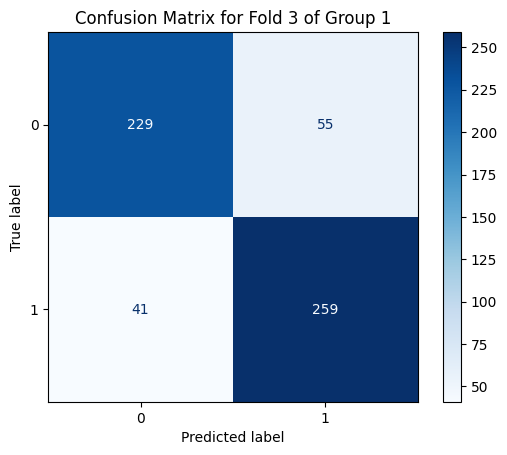


Training on Fold 4 of Group 1
0:	learn: 0.6247365	total: 28.6ms	remaining: 28.5s
100:	learn: 0.2346297	total: 2.93s	remaining: 26.1s
200:	learn: 0.1581422	total: 5.86s	remaining: 23.3s
300:	learn: 0.1034482	total: 8.95s	remaining: 20.8s
400:	learn: 0.0728318	total: 12.1s	remaining: 18s
500:	learn: 0.0523267	total: 15.4s	remaining: 15.3s
600:	learn: 0.0408576	total: 18.4s	remaining: 12.2s
700:	learn: 0.0330855	total: 21.3s	remaining: 9.1s
800:	learn: 0.0256541	total: 24.8s	remaining: 6.17s
900:	learn: 0.0216071	total: 27.5s	remaining: 3.02s
999:	learn: 0.0181197	total: 30.3s	remaining: 0us
Classification Report for Fold 4 of Group 1:
               precision    recall  f1-score   support

     Dropout       0.89      0.83      0.86       284
     Persist       0.85      0.90      0.87       300

    accuracy                           0.87       584
   macro avg       0.87      0.87      0.87       584
weighted avg       0.87      0.87      0.87       584



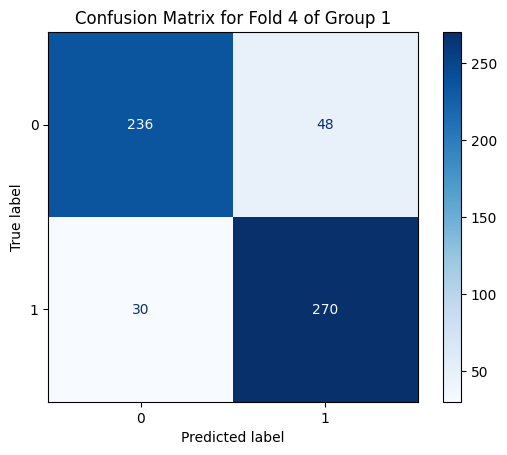


Training on Fold 5 of Group 1
0:	learn: 0.6269271	total: 23.7ms	remaining: 23.6s
100:	learn: 0.2550157	total: 2.63s	remaining: 23.4s
200:	learn: 0.1755648	total: 5.4s	remaining: 21.5s
300:	learn: 0.1208913	total: 8.25s	remaining: 19.2s
400:	learn: 0.0893004	total: 10.9s	remaining: 16.3s
500:	learn: 0.0696432	total: 13.7s	remaining: 13.6s
600:	learn: 0.0555053	total: 16.4s	remaining: 10.9s
700:	learn: 0.0457943	total: 19.1s	remaining: 8.13s
800:	learn: 0.0383949	total: 21.9s	remaining: 5.44s
900:	learn: 0.0314916	total: 24.7s	remaining: 2.71s
999:	learn: 0.0273327	total: 27.5s	remaining: 0us
Classification Report for Fold 5 of Group 1:
               precision    recall  f1-score   support

     Dropout       0.89      0.84      0.86       284
     Persist       0.86      0.90      0.88       300

    accuracy                           0.87       584
   macro avg       0.87      0.87      0.87       584
weighted avg       0.87      0.87      0.87       584



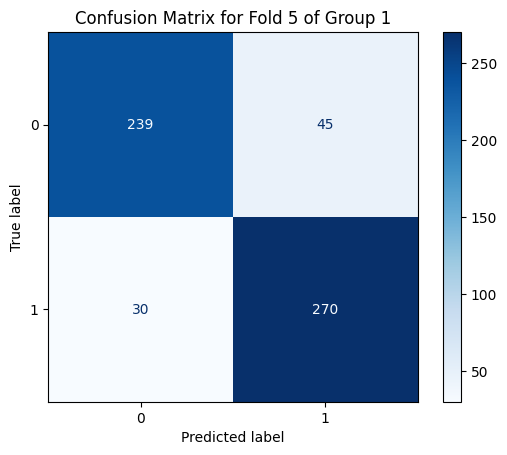


Summary of 5-Fold Cross-Validation Results for Group 1:
Classification Report for Fold 1:
               precision    recall  f1-score   support

     Dropout       0.88      0.80      0.84       284
     Persist       0.83      0.90      0.86       301

    accuracy                           0.85       585
   macro avg       0.85      0.85      0.85       585
weighted avg       0.85      0.85      0.85       585

Classification Report for Fold 2:
               precision    recall  f1-score   support

     Dropout       0.87      0.85      0.86       285
     Persist       0.86      0.88      0.87       300

    accuracy                           0.86       585
   macro avg       0.86      0.86      0.86       585
weighted avg       0.86      0.86      0.86       585

Classification Report for Fold 3:
               precision    recall  f1-score   support

     Dropout       0.85      0.81      0.83       284
     Persist       0.82      0.86      0.84       300

    accuracy        

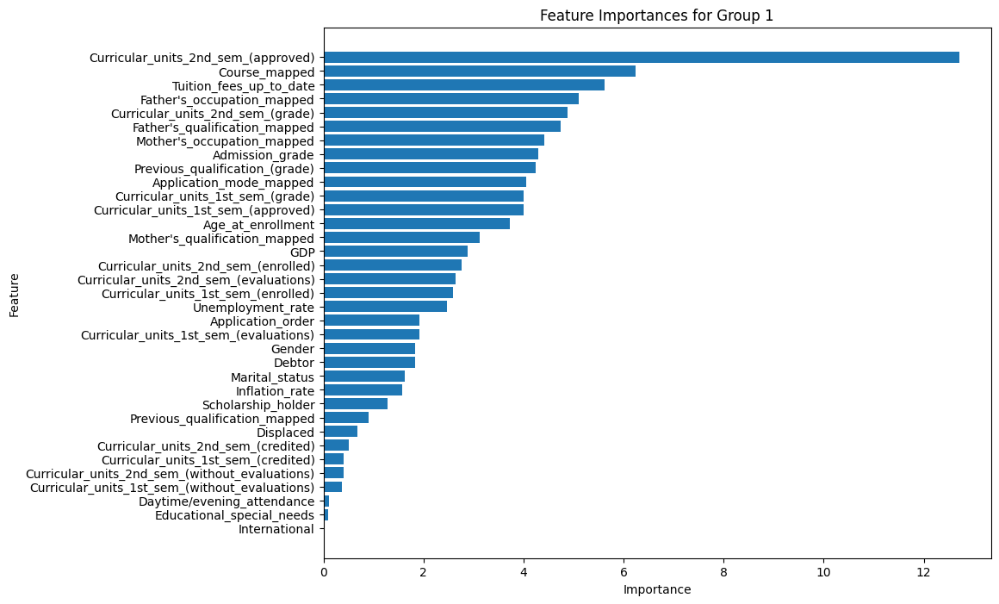


Training and Evaluating on Group 2

Training on Fold 1 of Group 2
0:	learn: 0.6280945	total: 24.8ms	remaining: 24.8s
100:	learn: 0.2492540	total: 2.64s	remaining: 23.5s
200:	learn: 0.1614936	total: 5.33s	remaining: 21.2s
300:	learn: 0.1106900	total: 8.04s	remaining: 18.7s
400:	learn: 0.0812085	total: 10.7s	remaining: 16s
500:	learn: 0.0592014	total: 13.4s	remaining: 13.3s
600:	learn: 0.0463735	total: 16.1s	remaining: 10.7s
700:	learn: 0.0360062	total: 18.7s	remaining: 7.99s
800:	learn: 0.0294220	total: 21.4s	remaining: 5.32s
900:	learn: 0.0248986	total: 24.2s	remaining: 2.66s
999:	learn: 0.0215613	total: 27s	remaining: 0us
Classification Report for Fold 1 of Group 2:
               precision    recall  f1-score   support

     Dropout       0.89      0.76      0.82       284
     Persist       0.80      0.91      0.85       301

    accuracy                           0.84       585
   macro avg       0.84      0.84      0.84       585
weighted avg       0.84      0.84      0.84       

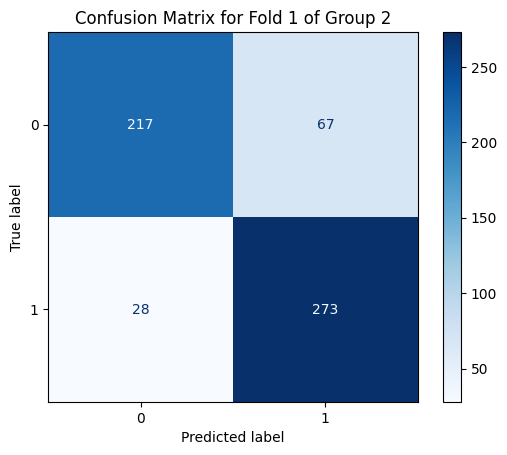


Training on Fold 2 of Group 2
0:	learn: 0.6260017	total: 23ms	remaining: 23s
100:	learn: 0.2654387	total: 2.77s	remaining: 24.6s
200:	learn: 0.1762774	total: 5.78s	remaining: 23s
300:	learn: 0.1291884	total: 8.66s	remaining: 20.1s
400:	learn: 0.0965749	total: 11.3s	remaining: 16.9s
500:	learn: 0.0699834	total: 14s	remaining: 14s
600:	learn: 0.0537272	total: 16.7s	remaining: 11.1s
700:	learn: 0.0422732	total: 19.4s	remaining: 8.26s
800:	learn: 0.0328338	total: 22.1s	remaining: 5.48s
900:	learn: 0.0270718	total: 24.8s	remaining: 2.72s
999:	learn: 0.0232445	total: 27.5s	remaining: 0us
Classification Report for Fold 2 of Group 2:
               precision    recall  f1-score   support

     Dropout       0.88      0.83      0.86       284
     Persist       0.85      0.90      0.87       301

    accuracy                           0.87       585
   macro avg       0.87      0.87      0.87       585
weighted avg       0.87      0.87      0.87       585



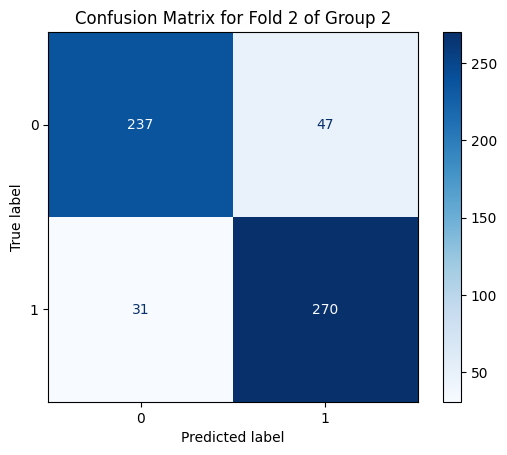


Training on Fold 3 of Group 2
0:	learn: 0.6288938	total: 26ms	remaining: 25.9s
100:	learn: 0.2523795	total: 2.63s	remaining: 23.4s
200:	learn: 0.1646322	total: 5.34s	remaining: 21.2s
300:	learn: 0.1136137	total: 8.03s	remaining: 18.6s
400:	learn: 0.0816094	total: 11s	remaining: 16.4s
500:	learn: 0.0609081	total: 13.9s	remaining: 13.8s
600:	learn: 0.0452986	total: 16.7s	remaining: 11.1s
700:	learn: 0.0357037	total: 19.4s	remaining: 8.29s
800:	learn: 0.0289627	total: 22.2s	remaining: 5.51s
900:	learn: 0.0238968	total: 24.9s	remaining: 2.74s
999:	learn: 0.0203749	total: 27.6s	remaining: 0us
Classification Report for Fold 3 of Group 2:
               precision    recall  f1-score   support

     Dropout       0.82      0.81      0.82       285
     Persist       0.82      0.84      0.83       300

    accuracy                           0.82       585
   macro avg       0.82      0.82      0.82       585
weighted avg       0.82      0.82      0.82       585



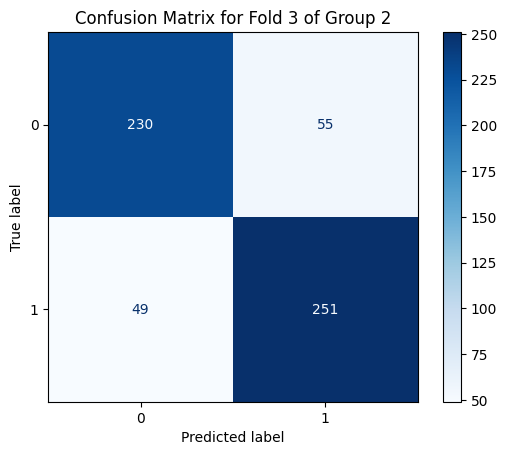


Training on Fold 4 of Group 2
0:	learn: 0.6363924	total: 25.4ms	remaining: 25.3s
100:	learn: 0.2430573	total: 2.68s	remaining: 23.8s
200:	learn: 0.1589455	total: 5.42s	remaining: 21.6s
300:	learn: 0.1114744	total: 8.48s	remaining: 19.7s
400:	learn: 0.0793566	total: 11.2s	remaining: 16.8s
500:	learn: 0.0595078	total: 14s	remaining: 13.9s
600:	learn: 0.0453359	total: 16.9s	remaining: 11.2s
700:	learn: 0.0372735	total: 19.9s	remaining: 8.48s
800:	learn: 0.0298361	total: 22.7s	remaining: 5.65s
900:	learn: 0.0242743	total: 25.6s	remaining: 2.81s
999:	learn: 0.0200818	total: 28.6s	remaining: 0us
Classification Report for Fold 4 of Group 2:
               precision    recall  f1-score   support

     Dropout       0.84      0.82      0.83       284
     Persist       0.84      0.85      0.84       300

    accuracy                           0.84       584
   macro avg       0.84      0.84      0.84       584
weighted avg       0.84      0.84      0.84       584



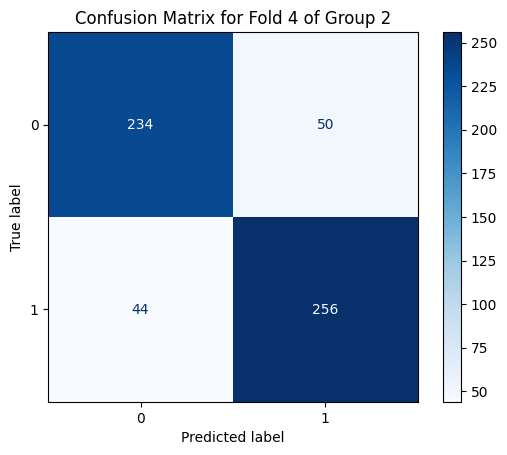


Training on Fold 5 of Group 2
0:	learn: 0.6372418	total: 29.5ms	remaining: 29.5s
100:	learn: 0.2588587	total: 2.92s	remaining: 26s
200:	learn: 0.1721136	total: 6.03s	remaining: 24s
300:	learn: 0.1176534	total: 9.19s	remaining: 21.3s
400:	learn: 0.0864318	total: 12s	remaining: 18s
500:	learn: 0.0625979	total: 14.9s	remaining: 14.8s
600:	learn: 0.0480736	total: 17.7s	remaining: 11.7s
700:	learn: 0.0385016	total: 20.5s	remaining: 8.73s
800:	learn: 0.0318917	total: 23.2s	remaining: 5.76s
900:	learn: 0.0267872	total: 25.9s	remaining: 2.84s
999:	learn: 0.0234658	total: 28.6s	remaining: 0us
Classification Report for Fold 5 of Group 2:
               precision    recall  f1-score   support

     Dropout       0.89      0.78      0.83       284
     Persist       0.81      0.91      0.86       300

    accuracy                           0.85       584
   macro avg       0.85      0.84      0.84       584
weighted avg       0.85      0.85      0.85       584



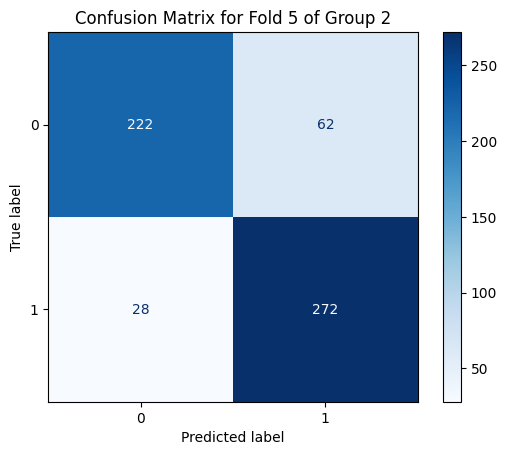


Summary of 5-Fold Cross-Validation Results for Group 2:
Classification Report for Fold 1:
               precision    recall  f1-score   support

     Dropout       0.89      0.76      0.82       284
     Persist       0.80      0.91      0.85       301

    accuracy                           0.84       585
   macro avg       0.84      0.84      0.84       585
weighted avg       0.84      0.84      0.84       585

Classification Report for Fold 2:
               precision    recall  f1-score   support

     Dropout       0.88      0.83      0.86       284
     Persist       0.85      0.90      0.87       301

    accuracy                           0.87       585
   macro avg       0.87      0.87      0.87       585
weighted avg       0.87      0.87      0.87       585

Classification Report for Fold 3:
               precision    recall  f1-score   support

     Dropout       0.82      0.81      0.82       285
     Persist       0.82      0.84      0.83       300

    accuracy        

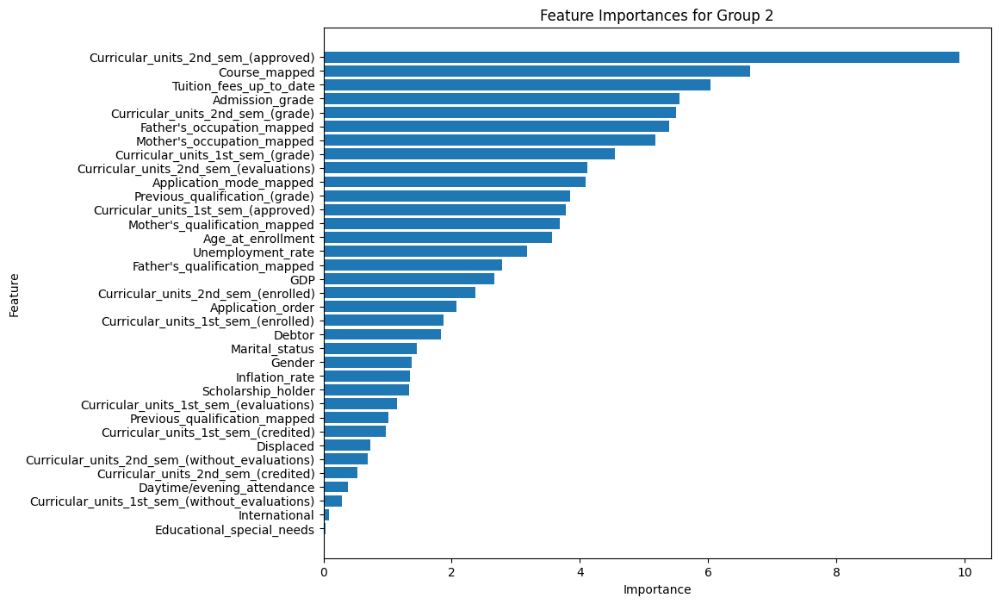

In [112]:
import pandas as pd
from catboost import CatBoostClassifier, Pool
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import StratifiedKFold
import matplotlib.pyplot as plt

# Define the columns to use, excluding original and grouped columns
all_features = [
    'Marital_status', 'Application_order',
    'Daytime/evening_attendance', 'Previous_qualification_(grade)', 'Admission_grade',
    'Displaced', 'Educational_special_needs', 'Debtor', 'Tuition_fees_up_to_date',
    'Gender', 'Scholarship_holder', 'Age_at_enrollment', 'International',
    'Curricular_units_1st_sem_(credited)', 'Curricular_units_1st_sem_(enrolled)',
    'Curricular_units_1st_sem_(evaluations)', 'Curricular_units_1st_sem_(approved)',
    'Curricular_units_1st_sem_(grade)', 'Curricular_units_1st_sem_(without_evaluations)',
    'Curricular_units_2nd_sem_(credited)', 'Curricular_units_2nd_sem_(enrolled)',
    'Curricular_units_2nd_sem_(evaluations)', 'Curricular_units_2nd_sem_(approved)',
    'Curricular_units_2nd_sem_(grade)', 'Curricular_units_2nd_sem_(without_evaluations)',
    'Unemployment_rate', 'Inflation_rate', 'GDP', "Mother's_qualification_mapped",
    "Father's_qualification_mapped", 'Previous_qualification_mapped',
    'Application_mode_mapped', 'Course_mapped', "Mother's_occupation_mapped", "Father's_occupation_mapped"
]

# Define categorical features for CatBoost
categ_features = [
    'Displaced',
    'Gender',
    'International',
    'Educational_special_needs',
    'Debtor',
    'Tuition_fees_up_to_date',
    'Scholarship_holder',
    'Daytime/evening_attendance',
    'Marital_status',
    "Mother's_qualification_mapped",
    "Father's_qualification_mapped",
    'Previous_qualification_mapped',
    'Application_mode_mapped',
    "Mother's_occupation_mapped",
    "Father's_occupation_mapped",
    'Course_mapped'
]

# Map original Target to binary
data['Target_binary'] = data['Target'].map({0: 0, 1: 1, 2: 1})

# Check the counts
print("Value counts for each category in the 'Target_binary' column:")
print(data['Target_binary'].value_counts())

# Split data into 'persist' and 'dropout' subsets
persist_data = data[data['Target_binary'] == 1]
dropout_data = data[data['Target_binary'] == 0]

# Split 'persist_data' into two subsets
persist_splits = [persist_data.iloc[:1501], persist_data.iloc[1501:]]

# Define groups by combining 'dropout_data' with each 'persist_split'
groups = {
    "Group 1": pd.concat([persist_splits[0], dropout_data]),
    "Group 2": pd.concat([persist_splits[1], dropout_data])
}

# Train and evaluate CatBoost model on each group using stratified 5-fold cross-validation
for group_name, group_data in groups.items():
    print(f"\nTraining and Evaluating on {group_name}")

    # Separate features and target
    X = group_data[all_features]
    y = group_data['Target_binary']

    # Initialize stratified K-Fold cross-validator
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    # Initialize an empty list to store evaluation results
    evaluation_reports = []

    # Start stratified 5-fold cross-validation
    for fold, (train_idx, test_idx) in enumerate(skf.split(X, y)):
        print(f"\nTraining on Fold {fold + 1} of {group_name}")

        # Split data into training and testing sets for this fold
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

        # Define CatBoost Pool (needed for categorical features)
        train_pool = Pool(X_train, y_train, cat_features=categ_features)
        test_pool = Pool(X_test, y_test, cat_features=categ_features)

        # Initialize and train CatBoost model
        model = CatBoostClassifier(
            iterations=1000,
            learning_rate=0.1,
            depth=6,
            verbose=100,
            random_seed=42
        )
        model.fit(train_pool)

        # Make predictions and evaluate the model
        y_pred = model.predict(test_pool)
        report = classification_report(y_test, y_pred, target_names=['Dropout', 'Persist'])
        print(f"Classification Report for Fold {fold + 1} of {group_name}:\n", report)

        # Append the report to the list for further analysis
        evaluation_reports.append(report)

        # Compute confusion matrix
        cm = confusion_matrix(y_test, y_pred)

        # Plot confusion matrix
        disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
        disp.plot(cmap=plt.cm.Blues)
        plt.title(f'Confusion Matrix for Fold {fold + 1} of {group_name}')
        plt.show()

    # Summary of the reports after all folds have been completed for each group
    print(f"\nSummary of 5-Fold Cross-Validation Results for {group_name}:")
    for i, report in enumerate(evaluation_reports, 1):
        print(f"Classification Report for Fold {i}:\n", report)

    # Plot feature importances
    feature_importances = model.feature_importances_
    sorted_indices = feature_importances.argsort()[::-1]
    plt.figure(figsize=(10, 8))
    plt.barh(
        [all_features[i] for i in sorted_indices],
        feature_importances[sorted_indices]
    )
    plt.xlabel('Importance')
    plt.ylabel('Feature')
    plt.title(f'Feature Importances for {group_name}')
    plt.gca().invert_yaxis()
    plt.show()


# CATBOOST - mapped feutures - binary target-  FEUTURE SELECTION -  controlled group splits with 5-Fold validation

Value counts for each category in the 'Target_binary' column:
Target_binary
1    3003
0    1421
Name: count, dtype: int64
0:	learn: 0.6144973	total: 35ms	remaining: 34.9s
100:	learn: 0.2429962	total: 3.27s	remaining: 29.1s
200:	learn: 0.1871901	total: 6.31s	remaining: 25.1s
300:	learn: 0.1507339	total: 9.72s	remaining: 22.6s
400:	learn: 0.1209026	total: 13s	remaining: 19.5s
500:	learn: 0.0988268	total: 16.2s	remaining: 16.1s
600:	learn: 0.0814943	total: 19.4s	remaining: 12.9s
700:	learn: 0.0672146	total: 22.8s	remaining: 9.72s
800:	learn: 0.0575436	total: 25.8s	remaining: 6.42s
900:	learn: 0.0496687	total: 28.9s	remaining: 3.18s
999:	learn: 0.0428068	total: 31.9s	remaining: 0us

Top features based on importance:
                                           Feature  Importance
22             Curricular_units_2nd_sem_(approved)    9.836142
32                                   Course_mapped    6.799458
8                          Tuition_fees_up_to_date    5.599769
23                Curricul

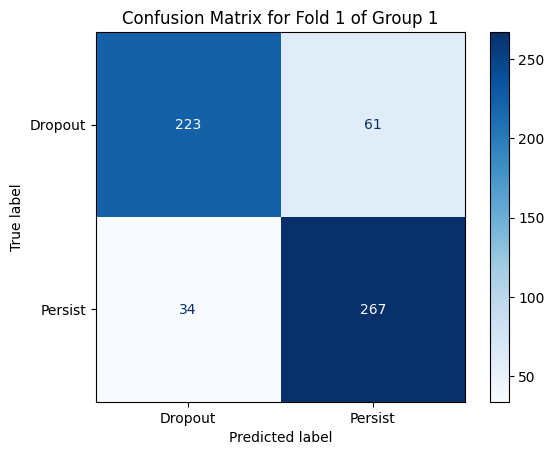


Training on Fold 2 of Group 1
0:	learn: 0.6307614	total: 22.1ms	remaining: 22s
100:	learn: 0.2657421	total: 2.58s	remaining: 22.9s
200:	learn: 0.1903445	total: 4.96s	remaining: 19.7s
300:	learn: 0.1445627	total: 7.47s	remaining: 17.3s
400:	learn: 0.1101548	total: 9.85s	remaining: 14.7s
500:	learn: 0.0844856	total: 12.2s	remaining: 12.2s
600:	learn: 0.0672859	total: 14.9s	remaining: 9.89s
700:	learn: 0.0532903	total: 17.3s	remaining: 7.39s
800:	learn: 0.0447712	total: 19.7s	remaining: 4.9s
900:	learn: 0.0378534	total: 22.2s	remaining: 2.44s
999:	learn: 0.0338844	total: 24.8s	remaining: 0us
Classification Report for Fold 2 of Group 1:
               precision    recall  f1-score   support

     Dropout       0.85      0.84      0.84       285
     Persist       0.85      0.86      0.85       300

    accuracy                           0.85       585
   macro avg       0.85      0.85      0.85       585
weighted avg       0.85      0.85      0.85       585



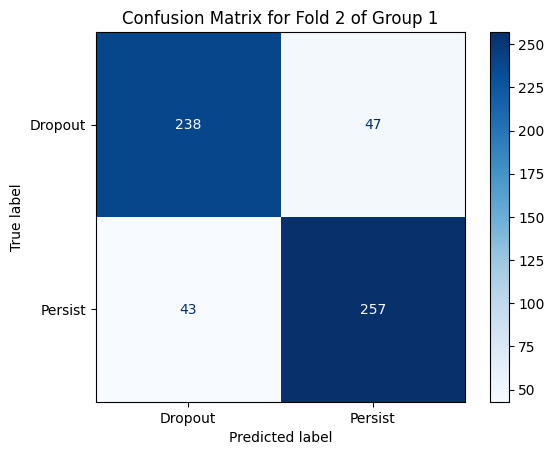


Training on Fold 3 of Group 1
0:	learn: 0.6248246	total: 22.6ms	remaining: 22.6s
100:	learn: 0.2492190	total: 2.38s	remaining: 21.2s
200:	learn: 0.1771950	total: 4.81s	remaining: 19.1s
300:	learn: 0.1323671	total: 7.23s	remaining: 16.8s
400:	learn: 0.1001987	total: 9.59s	remaining: 14.3s
500:	learn: 0.0770629	total: 12s	remaining: 11.9s
600:	learn: 0.0612707	total: 14.3s	remaining: 9.52s
700:	learn: 0.0496425	total: 16.7s	remaining: 7.13s
800:	learn: 0.0409623	total: 19.1s	remaining: 4.75s
900:	learn: 0.0342620	total: 21.5s	remaining: 2.36s
999:	learn: 0.0289425	total: 23.9s	remaining: 0us
Classification Report for Fold 3 of Group 1:
               precision    recall  f1-score   support

     Dropout       0.82      0.81      0.82       284
     Persist       0.82      0.83      0.83       300

    accuracy                           0.82       584
   macro avg       0.82      0.82      0.82       584
weighted avg       0.82      0.82      0.82       584



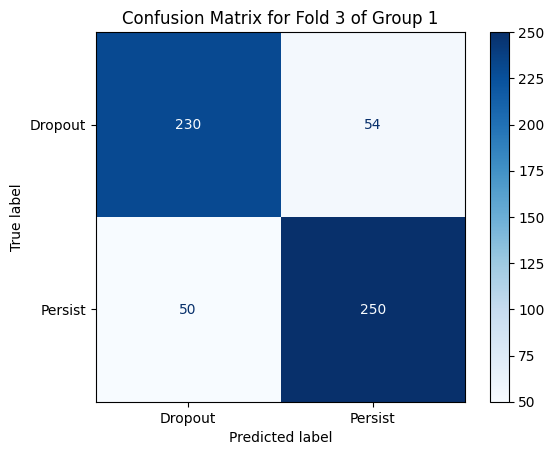


Training on Fold 4 of Group 1
0:	learn: 0.6200983	total: 24.8ms	remaining: 24.8s
100:	learn: 0.2543918	total: 2.45s	remaining: 21.8s
200:	learn: 0.1776446	total: 4.94s	remaining: 19.6s
300:	learn: 0.1303424	total: 7.29s	remaining: 16.9s
400:	learn: 0.0949046	total: 9.67s	remaining: 14.4s
500:	learn: 0.0732692	total: 12.1s	remaining: 12s
600:	learn: 0.0553212	total: 14.4s	remaining: 9.57s
700:	learn: 0.0440623	total: 16.8s	remaining: 7.15s
800:	learn: 0.0364153	total: 19.1s	remaining: 4.75s
900:	learn: 0.0306567	total: 21.5s	remaining: 2.36s
999:	learn: 0.0269209	total: 23.8s	remaining: 0us
Classification Report for Fold 4 of Group 1:
               precision    recall  f1-score   support

     Dropout       0.85      0.81      0.83       284
     Persist       0.83      0.86      0.85       300

    accuracy                           0.84       584
   macro avg       0.84      0.84      0.84       584
weighted avg       0.84      0.84      0.84       584



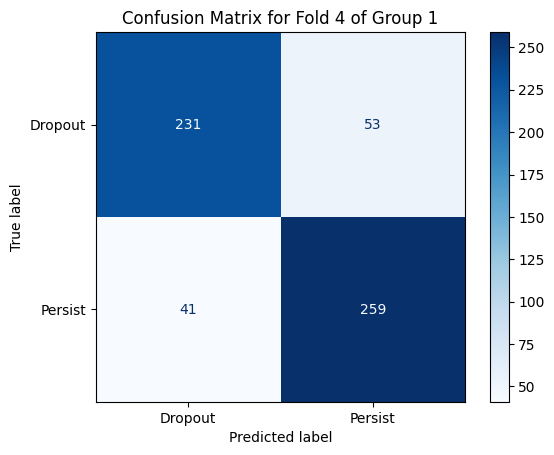


Training on Fold 5 of Group 1
0:	learn: 0.6290957	total: 23ms	remaining: 22.9s
100:	learn: 0.2613450	total: 2.33s	remaining: 20.8s
200:	learn: 0.1907992	total: 4.77s	remaining: 18.9s
300:	learn: 0.1438530	total: 7.18s	remaining: 16.7s
400:	learn: 0.1123995	total: 9.56s	remaining: 14.3s
500:	learn: 0.0871120	total: 11.9s	remaining: 11.9s
600:	learn: 0.0690157	total: 14.3s	remaining: 9.5s
700:	learn: 0.0561350	total: 16.7s	remaining: 7.12s
800:	learn: 0.0461539	total: 19.3s	remaining: 4.8s
900:	learn: 0.0388739	total: 21.8s	remaining: 2.4s
999:	learn: 0.0330564	total: 24.2s	remaining: 0us
Classification Report for Fold 5 of Group 1:
               precision    recall  f1-score   support

     Dropout       0.87      0.83      0.85       284
     Persist       0.85      0.88      0.87       300

    accuracy                           0.86       584
   macro avg       0.86      0.86      0.86       584
weighted avg       0.86      0.86      0.86       584



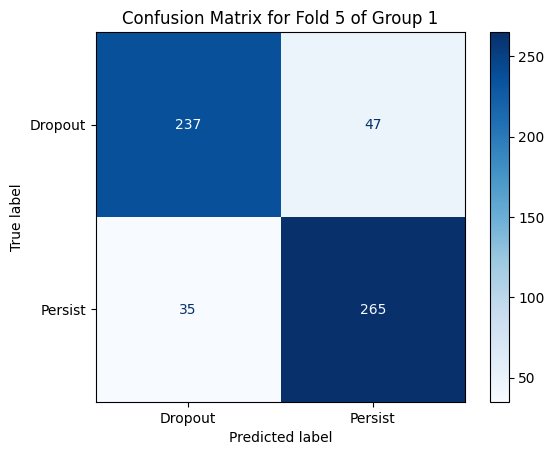


Summary of 5-Fold Cross-Validation Results for Group 1:
Classification Report for Fold 1:
               precision    recall  f1-score   support

     Dropout       0.87      0.79      0.82       284
     Persist       0.81      0.89      0.85       301

    accuracy                           0.84       585
   macro avg       0.84      0.84      0.84       585
weighted avg       0.84      0.84      0.84       585

Classification Report for Fold 2:
               precision    recall  f1-score   support

     Dropout       0.85      0.84      0.84       285
     Persist       0.85      0.86      0.85       300

    accuracy                           0.85       585
   macro avg       0.85      0.85      0.85       585
weighted avg       0.85      0.85      0.85       585

Classification Report for Fold 3:
               precision    recall  f1-score   support

     Dropout       0.82      0.81      0.82       284
     Persist       0.82      0.83      0.83       300

    accuracy        

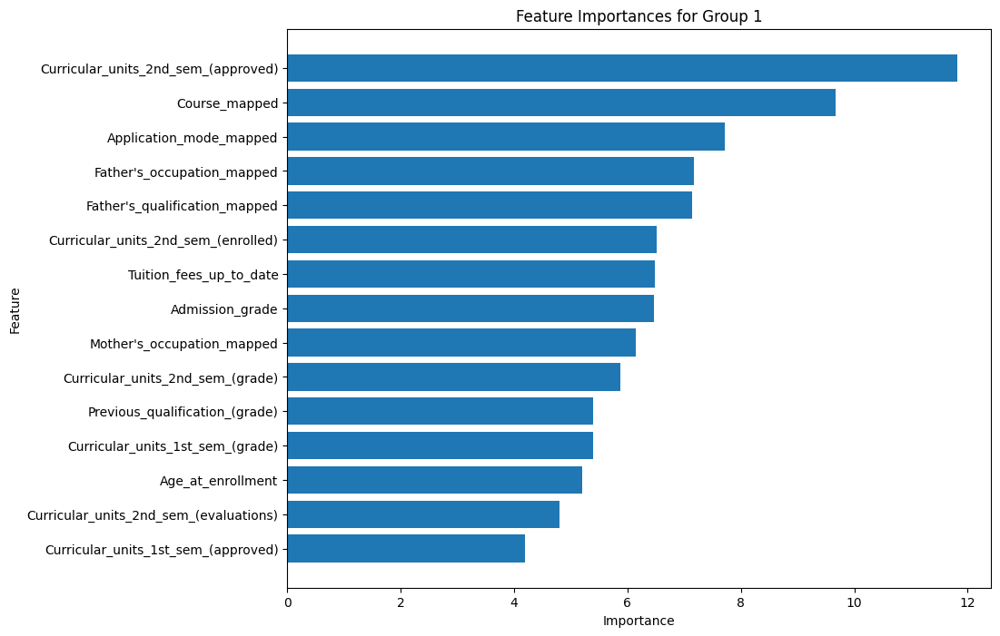


Training and Evaluating on Group 2

Training on Fold 1 of Group 2
0:	learn: 0.6269650	total: 21.9ms	remaining: 21.9s
100:	learn: 0.2564535	total: 2.46s	remaining: 21.9s
200:	learn: 0.1802962	total: 4.96s	remaining: 19.7s
300:	learn: 0.1267632	total: 7.46s	remaining: 17.3s
400:	learn: 0.0965160	total: 10.2s	remaining: 15.2s
500:	learn: 0.0763132	total: 12.6s	remaining: 12.6s
600:	learn: 0.0568678	total: 15.2s	remaining: 10.1s
700:	learn: 0.0458529	total: 17.8s	remaining: 7.58s
800:	learn: 0.0386013	total: 20.3s	remaining: 5.04s
900:	learn: 0.0329181	total: 22.8s	remaining: 2.5s
999:	learn: 0.0277783	total: 25.6s	remaining: 0us
Classification Report for Fold 1 of Group 2:
               precision    recall  f1-score   support

     Dropout       0.86      0.79      0.82       284
     Persist       0.82      0.88      0.85       301

    accuracy                           0.84       585
   macro avg       0.84      0.83      0.84       585
weighted avg       0.84      0.84      0.84    

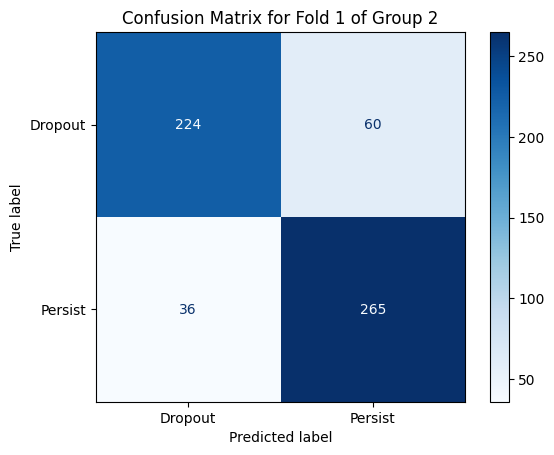


Training on Fold 2 of Group 2
0:	learn: 0.6307999	total: 21.1ms	remaining: 21.1s
100:	learn: 0.2817308	total: 2.69s	remaining: 24s
200:	learn: 0.1988920	total: 5.42s	remaining: 21.6s
300:	learn: 0.1434390	total: 7.98s	remaining: 18.5s
400:	learn: 0.1078469	total: 10.5s	remaining: 15.7s
500:	learn: 0.0847126	total: 13s	remaining: 13s
600:	learn: 0.0672874	total: 15.6s	remaining: 10.3s
700:	learn: 0.0532797	total: 18.1s	remaining: 7.71s
800:	learn: 0.0439611	total: 20.8s	remaining: 5.17s
900:	learn: 0.0364858	total: 23.5s	remaining: 2.58s
999:	learn: 0.0318073	total: 26s	remaining: 0us
Classification Report for Fold 2 of Group 2:
               precision    recall  f1-score   support

     Dropout       0.87      0.86      0.86       284
     Persist       0.87      0.87      0.87       301

    accuracy                           0.87       585
   macro avg       0.87      0.87      0.87       585
weighted avg       0.87      0.87      0.87       585



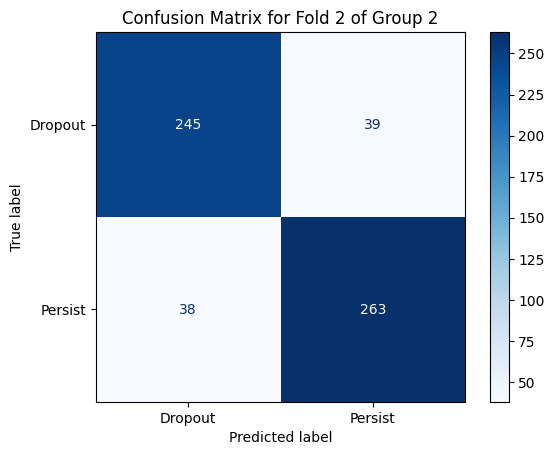


Training on Fold 3 of Group 2
0:	learn: 0.6260667	total: 26.8ms	remaining: 26.8s
100:	learn: 0.2684066	total: 2.55s	remaining: 22.7s
200:	learn: 0.1877487	total: 5.01s	remaining: 19.9s
300:	learn: 0.1406679	total: 7.79s	remaining: 18.1s
400:	learn: 0.1030137	total: 10.6s	remaining: 15.9s
500:	learn: 0.0774587	total: 13s	remaining: 13s
600:	learn: 0.0591226	total: 15.6s	remaining: 10.4s
700:	learn: 0.0466337	total: 18.3s	remaining: 7.81s
800:	learn: 0.0383606	total: 20.7s	remaining: 5.15s
900:	learn: 0.0320365	total: 23.1s	remaining: 2.54s
999:	learn: 0.0273843	total: 25.8s	remaining: 0us
Classification Report for Fold 3 of Group 2:
               precision    recall  f1-score   support

     Dropout       0.83      0.81      0.82       285
     Persist       0.82      0.84      0.83       300

    accuracy                           0.83       585
   macro avg       0.83      0.83      0.83       585
weighted avg       0.83      0.83      0.83       585



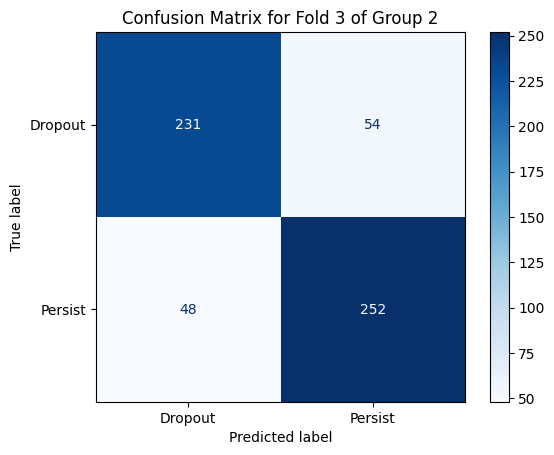


Training on Fold 4 of Group 2
0:	learn: 0.6249191	total: 21.8ms	remaining: 21.7s
100:	learn: 0.2604299	total: 2.65s	remaining: 23.6s
200:	learn: 0.1825340	total: 5.33s	remaining: 21.2s
300:	learn: 0.1361971	total: 7.76s	remaining: 18s
400:	learn: 0.1013351	total: 10.2s	remaining: 15.2s
500:	learn: 0.0759960	total: 12.6s	remaining: 12.6s
600:	learn: 0.0591740	total: 15.1s	remaining: 10s
700:	learn: 0.0470727	total: 17.6s	remaining: 7.49s
800:	learn: 0.0387642	total: 20.1s	remaining: 4.99s
900:	learn: 0.0320901	total: 22.7s	remaining: 2.5s
999:	learn: 0.0266900	total: 25.2s	remaining: 0us
Classification Report for Fold 4 of Group 2:
               precision    recall  f1-score   support

     Dropout       0.83      0.80      0.82       284
     Persist       0.82      0.84      0.83       300

    accuracy                           0.82       584
   macro avg       0.82      0.82      0.82       584
weighted avg       0.82      0.82      0.82       584



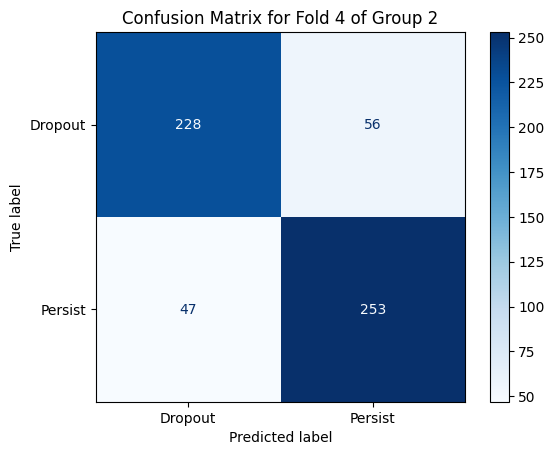


Training on Fold 5 of Group 2
0:	learn: 0.6306915	total: 24.9ms	remaining: 24.8s
100:	learn: 0.2769401	total: 2.35s	remaining: 20.9s
200:	learn: 0.1979482	total: 4.69s	remaining: 18.7s
300:	learn: 0.1513086	total: 7.38s	remaining: 17.1s
400:	learn: 0.1143151	total: 10.1s	remaining: 15.1s
500:	learn: 0.0898275	total: 12.5s	remaining: 12.5s
600:	learn: 0.0727309	total: 15s	remaining: 9.93s
700:	learn: 0.0582358	total: 17.3s	remaining: 7.39s
800:	learn: 0.0497228	total: 19.7s	remaining: 4.89s
900:	learn: 0.0423056	total: 22.1s	remaining: 2.42s
999:	learn: 0.0357716	total: 24.4s	remaining: 0us
Classification Report for Fold 5 of Group 2:
               precision    recall  f1-score   support

     Dropout       0.89      0.79      0.84       284
     Persist       0.82      0.91      0.86       300

    accuracy                           0.85       584
   macro avg       0.85      0.85      0.85       584
weighted avg       0.85      0.85      0.85       584



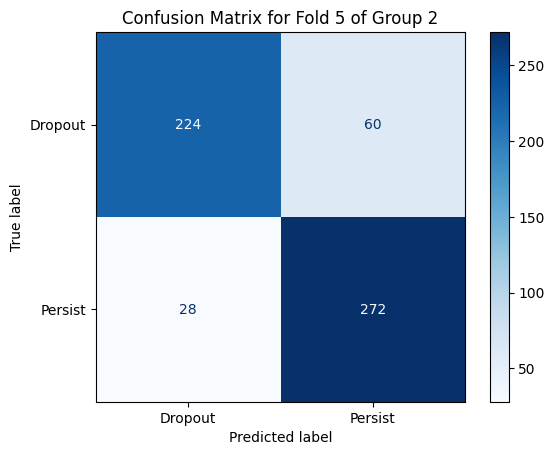


Summary of 5-Fold Cross-Validation Results for Group 2:
Classification Report for Fold 1:
               precision    recall  f1-score   support

     Dropout       0.86      0.79      0.82       284
     Persist       0.82      0.88      0.85       301

    accuracy                           0.84       585
   macro avg       0.84      0.83      0.84       585
weighted avg       0.84      0.84      0.84       585

Classification Report for Fold 2:
               precision    recall  f1-score   support

     Dropout       0.87      0.86      0.86       284
     Persist       0.87      0.87      0.87       301

    accuracy                           0.87       585
   macro avg       0.87      0.87      0.87       585
weighted avg       0.87      0.87      0.87       585

Classification Report for Fold 3:
               precision    recall  f1-score   support

     Dropout       0.83      0.81      0.82       285
     Persist       0.82      0.84      0.83       300

    accuracy        

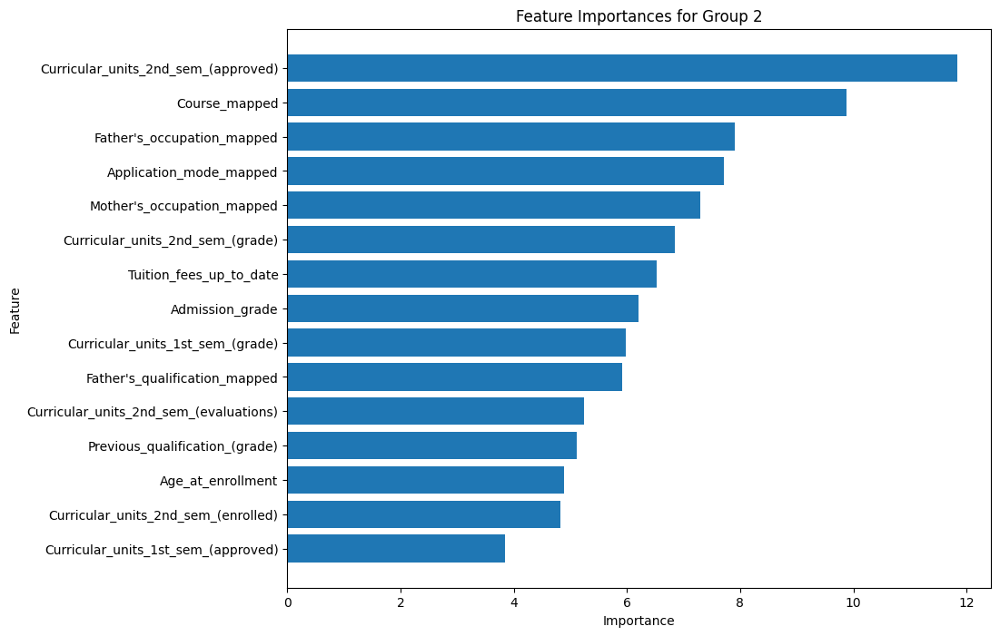

In [117]:
import pandas as pd
from catboost import CatBoostClassifier, Pool
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import StratifiedKFold
import matplotlib.pyplot as plt
import numpy as np


all_features = [
    'Marital_status', 'Application_order',
    'Daytime/evening_attendance', 'Previous_qualification_(grade)', 'Admission_grade',
    'Displaced', 'Educational_special_needs', 'Debtor', 'Tuition_fees_up_to_date',
    'Gender', 'Scholarship_holder', 'Age_at_enrollment', 'International',
    'Curricular_units_1st_sem_(credited)', 'Curricular_units_1st_sem_(enrolled)',
    'Curricular_units_1st_sem_(evaluations)', 'Curricular_units_1st_sem_(approved)',
    'Curricular_units_1st_sem_(grade)', 'Curricular_units_1st_sem_(without_evaluations)',
    
     'Curricular_units_2nd_sem_(credited)', 'Curricular_units_2nd_sem_(enrolled)',
    'Curricular_units_2nd_sem_(evaluations)', 'Curricular_units_2nd_sem_(approved)',
    'Curricular_units_2nd_sem_(grade)', 'Curricular_units_2nd_sem_(without_evaluations)',
    'Unemployment_rate', 'Inflation_rate', 'GDP', "Mother's_qualification_mapped",
    "Father's_qualification_mapped", 'Previous_qualification_mapped',
    'Application_mode_mapped', 'Course_mapped', "Mother's_occupation_mapped", "Father's_occupation_mapped"
]

# Define categorical features for CatBoost
categ_features = [
    'Displaced',
    'Gender',
    'International',
    'Educational_special_needs',
    'Debtor',
    'Tuition_fees_up_to_date',
    'Scholarship_holder',
    'Daytime/evening_attendance',
    'Marital_status',
    "Mother's_qualification_mapped",
    "Father's_qualification_mapped",
    'Previous_qualification_mapped',
    'Application_mode_mapped',
    "Mother's_occupation_mapped",
    "Father's_occupation_mapped",
    'Course_mapped'
]

# Map original Target to binary
data['Target_binary'] = data['Target'].map({0: 0, 1: 1, 2: 1})

# Check the counts
print("Value counts for each category in the 'Target_binary' column:")
print(data['Target_binary'].value_counts())

# Prepare data for feature importance analysis
X = data[all_features].copy()
y = data['Target_binary']

# Ensure categorical features are strings
for cat_col in categ_features:
    X[cat_col] = X[cat_col].astype(str)

# Define CatBoost Pool (needed for categorical features)
train_pool = Pool(X, y, cat_features=categ_features)

# Initialize and train CatBoost model to get feature importances
model = CatBoostClassifier(
    iterations=1000,
    learning_rate=0.1,
    depth=6,
    verbose=100,
    random_seed=42
)
model.fit(train_pool)

# Get feature importances
feature_importances = model.get_feature_importance(train_pool)
feature_names = X.columns

# Create a DataFrame for feature importances
fi_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importances
})

# Sort features by importance
fi_df = fi_df.sort_values(by='Importance', ascending=False)

# Display top features
print("\nTop features based on importance:")
print(fi_df)

# Select top N features based on importance scores
top_n = 15  # You can adjust this number as needed
selected_features = fi_df['Feature'].head(top_n).tolist()

print(f"\nSelected Top {top_n} Features:")
print(selected_features)

# Update feature lists
all_features = selected_features
categ_features = [feature for feature in categ_features if feature in selected_features]

# Now, retrain the model using only the selected features

# Split data into 'persist' and 'dropout' subsets
persist_data = data[data['Target_binary'] == 1]
dropout_data = data[data['Target_binary'] == 0]

# Split 'persist_data' into two subsets for group creation
persist_splits = [persist_data.iloc[:1501], persist_data.iloc[1501:]]

# Define groups by combining 'dropout_data' with each 'persist_split'
groups = {
    "Group 1": pd.concat([persist_splits[0], dropout_data]),
    "Group 2": pd.concat([persist_splits[1], dropout_data])
}

# Train and evaluate CatBoost model on each group using stratified 5-fold cross-validation
for group_name, group_data in groups.items():
    print(f"\nTraining and Evaluating on {group_name}")

    # Separate features and target
    X_group = group_data[all_features].copy()
    y_group = group_data['Target_binary']

    # Ensure categorical features are strings
    for cat_col in categ_features:
        X_group[cat_col] = X_group[cat_col].astype(str)

    # Initialize stratified K-Fold cross-validator
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    # Initialize an empty list to store evaluation results
    evaluation_reports = []

    # Start stratified 5-fold cross-validation
    for fold, (train_idx, test_idx) in enumerate(skf.split(X_group, y_group)):
        print(f"\nTraining on Fold {fold + 1} of {group_name}")

        # Split data into training and testing sets for this fold
        X_train, X_test = X_group.iloc[train_idx], X_group.iloc[test_idx]
        y_train, y_test = y_group.iloc[train_idx], y_group.iloc[test_idx]

        # Define CatBoost Pool (needed for categorical features)
        train_pool = Pool(X_train, y_train, cat_features=categ_features)
        test_pool = Pool(X_test, y_test, cat_features=categ_features)

        # Initialize and train CatBoost model
        model = CatBoostClassifier(
            iterations=1000,
            learning_rate=0.1,
            depth=6,
            verbose=100,
            random_seed=42
        )
        model.fit(train_pool)

        # Make predictions and evaluate the model
        y_pred = model.predict(test_pool)
        report = classification_report(y_test, y_pred, target_names=['Dropout', 'Persist'])
        print(f"Classification Report for Fold {fold + 1} of {group_name}:\n", report)

        # Append the report to the list for further analysis
        evaluation_reports.append(report)

        # Compute confusion matrix
        cm = confusion_matrix(y_test, y_pred)

        # Plot confusion matrix
        disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Dropout', 'Persist'])
        disp.plot(cmap=plt.cm.Blues)
        plt.title(f'Confusion Matrix for Fold {fold + 1} of {group_name}')
        plt.show()

    # Summary of the reports after all folds have been completed for each group
    print(f"\nSummary of 5-Fold Cross-Validation Results for {group_name}:")
    for i, report in enumerate(evaluation_reports, 1):
        print(f"Classification Report for Fold {i}:\n", report)

    # Plot feature importances
    feature_importances = model.get_feature_importance()
    sorted_indices = np.argsort(feature_importances)[::-1]
    plt.figure(figsize=(10, 8))
    plt.barh(
        [all_features[i] for i in sorted_indices],
        np.array(feature_importances)[sorted_indices]
    )
    plt.xlabel('Importance')
    plt.ylabel('Feature')
    plt.title(f'Feature Importances for {group_name}')
    plt.gca().invert_yaxis()
    plt.show()


# CATBOOST - mapped feutures - binary target-EXCLUDE 2ND SEMESTER +  FEUTURE SELECTION -  controlled group splits with 5-Fold validation

Value counts for each category in the 'Target_binary' column:
Target_binary
1    3003
0    1421
Name: count, dtype: int64
0:	learn: 0.6288199	total: 39ms	remaining: 39s
100:	learn: 0.2787511	total: 3.15s	remaining: 28s
200:	learn: 0.2213117	total: 6.69s	remaining: 26.6s
300:	learn: 0.1760309	total: 9.78s	remaining: 22.7s
400:	learn: 0.1454772	total: 12.9s	remaining: 19.2s
500:	learn: 0.1182871	total: 16s	remaining: 15.9s
600:	learn: 0.0992429	total: 19.1s	remaining: 12.7s
700:	learn: 0.0844597	total: 22.3s	remaining: 9.51s
800:	learn: 0.0713166	total: 25.4s	remaining: 6.31s
900:	learn: 0.0627253	total: 28.4s	remaining: 3.13s
999:	learn: 0.0536445	total: 31.8s	remaining: 0us

Top features based on importance:
                                           Feature  Importance
16             Curricular_units_1st_sem_(approved)   11.484478
26                                   Course_mapped    8.036094
8                          Tuition_fees_up_to_date    6.377451
4                             

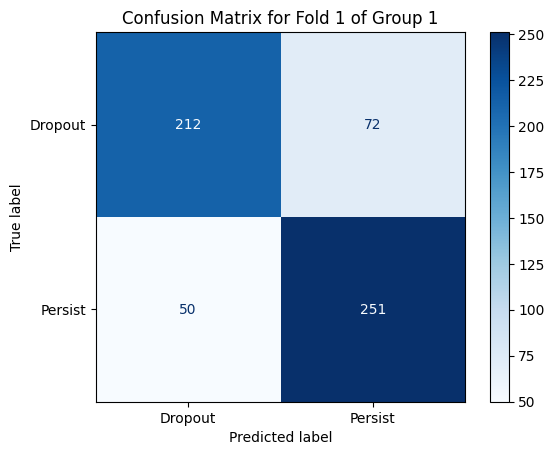


Training on Fold 2 of Group 1
0:	learn: 0.6358035	total: 22.8ms	remaining: 22.8s
100:	learn: 0.2958890	total: 2.57s	remaining: 22.9s
200:	learn: 0.2100505	total: 5.07s	remaining: 20.1s
300:	learn: 0.1518223	total: 7.46s	remaining: 17.3s
400:	learn: 0.1124176	total: 10s	remaining: 14.9s
500:	learn: 0.0855594	total: 12.8s	remaining: 12.7s
600:	learn: 0.0675730	total: 15.4s	remaining: 10.2s
700:	learn: 0.0544808	total: 17.8s	remaining: 7.58s
800:	learn: 0.0459120	total: 20.4s	remaining: 5.08s
900:	learn: 0.0397696	total: 23.2s	remaining: 2.55s
999:	learn: 0.0346511	total: 25.6s	remaining: 0us
Classification Report for Fold 2 of Group 1:
               precision    recall  f1-score   support

     Dropout       0.81      0.82      0.82       285
     Persist       0.83      0.82      0.82       300

    accuracy                           0.82       585
   macro avg       0.82      0.82      0.82       585
weighted avg       0.82      0.82      0.82       585



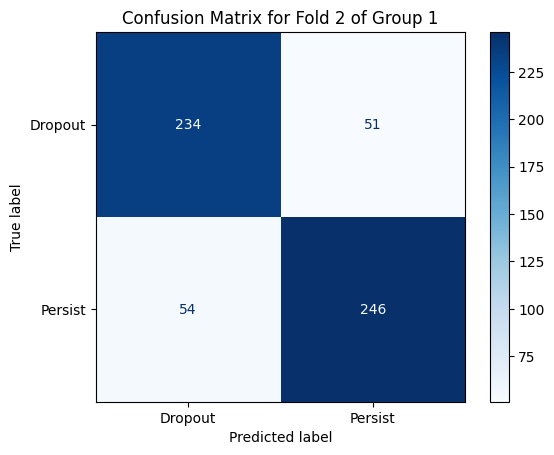


Training on Fold 3 of Group 1
0:	learn: 0.6315963	total: 21.2ms	remaining: 21.1s
100:	learn: 0.2771108	total: 2.37s	remaining: 21.1s
200:	learn: 0.2013538	total: 4.72s	remaining: 18.8s
300:	learn: 0.1512402	total: 7.08s	remaining: 16.4s
400:	learn: 0.1133269	total: 9.43s	remaining: 14.1s
500:	learn: 0.0867832	total: 11.8s	remaining: 11.8s
600:	learn: 0.0694239	total: 14.2s	remaining: 9.44s
700:	learn: 0.0565452	total: 16.6s	remaining: 7.07s
800:	learn: 0.0469597	total: 19.2s	remaining: 4.76s
900:	learn: 0.0398248	total: 21.8s	remaining: 2.39s
999:	learn: 0.0337076	total: 24.3s	remaining: 0us
Classification Report for Fold 3 of Group 1:
               precision    recall  f1-score   support

     Dropout       0.82      0.78      0.80       284
     Persist       0.80      0.84      0.82       300

    accuracy                           0.81       584
   macro avg       0.81      0.81      0.81       584
weighted avg       0.81      0.81      0.81       584



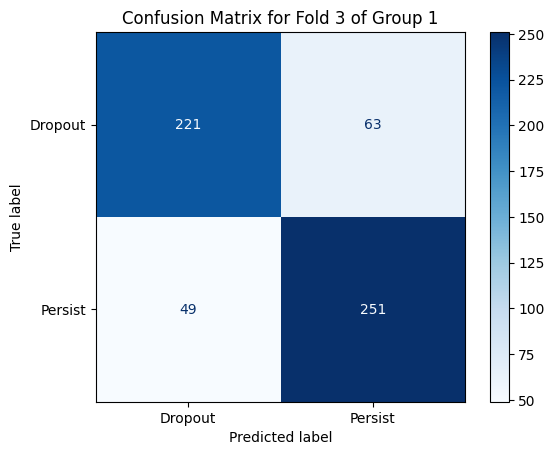


Training on Fold 4 of Group 1
0:	learn: 0.6273603	total: 21.6ms	remaining: 21.6s
100:	learn: 0.2821584	total: 2.36s	remaining: 21s
200:	learn: 0.1910232	total: 4.88s	remaining: 19.4s
300:	learn: 0.1427131	total: 7.35s	remaining: 17.1s
400:	learn: 0.1060358	total: 10.1s	remaining: 15s
500:	learn: 0.0814574	total: 12.5s	remaining: 12.4s
600:	learn: 0.0651271	total: 15.1s	remaining: 10.1s
700:	learn: 0.0525443	total: 17.6s	remaining: 7.49s
800:	learn: 0.0431300	total: 20s	remaining: 4.98s
900:	learn: 0.0357948	total: 22.5s	remaining: 2.47s
999:	learn: 0.0289341	total: 24.9s	remaining: 0us
Classification Report for Fold 4 of Group 1:
               precision    recall  f1-score   support

     Dropout       0.83      0.77      0.80       284
     Persist       0.80      0.85      0.82       300

    accuracy                           0.81       584
   macro avg       0.82      0.81      0.81       584
weighted avg       0.81      0.81      0.81       584



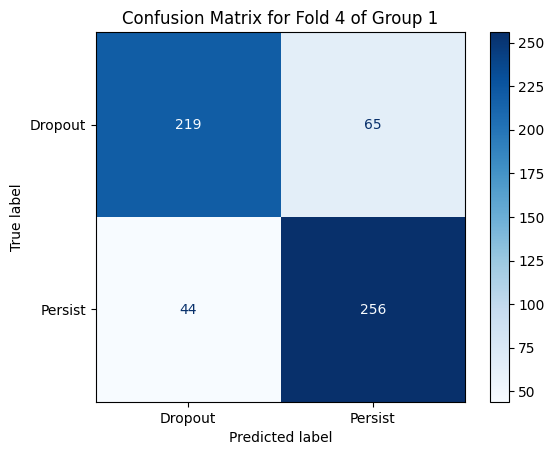


Training on Fold 5 of Group 1
0:	learn: 0.6320084	total: 21.7ms	remaining: 21.7s
100:	learn: 0.2936577	total: 2.46s	remaining: 21.9s
200:	learn: 0.2172554	total: 4.85s	remaining: 19.3s
300:	learn: 0.1614915	total: 7.2s	remaining: 16.7s
400:	learn: 0.1243634	total: 9.62s	remaining: 14.4s
500:	learn: 0.0951293	total: 12.2s	remaining: 12.2s
600:	learn: 0.0739444	total: 14.8s	remaining: 9.82s
700:	learn: 0.0575454	total: 17.3s	remaining: 7.37s
800:	learn: 0.0471236	total: 19.7s	remaining: 4.89s
900:	learn: 0.0395068	total: 22.2s	remaining: 2.44s
999:	learn: 0.0336021	total: 24.8s	remaining: 0us
Classification Report for Fold 5 of Group 1:
               precision    recall  f1-score   support

     Dropout       0.88      0.76      0.82       284
     Persist       0.80      0.90      0.85       300

    accuracy                           0.83       584
   macro avg       0.84      0.83      0.83       584
weighted avg       0.84      0.83      0.83       584



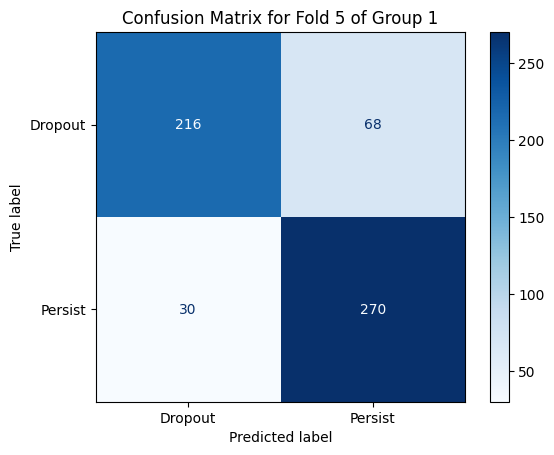


Summary of 5-Fold Cross-Validation Results for Group 1:
Classification Report for Fold 1:
               precision    recall  f1-score   support

     Dropout       0.81      0.75      0.78       284
     Persist       0.78      0.83      0.80       301

    accuracy                           0.79       585
   macro avg       0.79      0.79      0.79       585
weighted avg       0.79      0.79      0.79       585

Classification Report for Fold 2:
               precision    recall  f1-score   support

     Dropout       0.81      0.82      0.82       285
     Persist       0.83      0.82      0.82       300

    accuracy                           0.82       585
   macro avg       0.82      0.82      0.82       585
weighted avg       0.82      0.82      0.82       585

Classification Report for Fold 3:
               precision    recall  f1-score   support

     Dropout       0.82      0.78      0.80       284
     Persist       0.80      0.84      0.82       300

    accuracy        

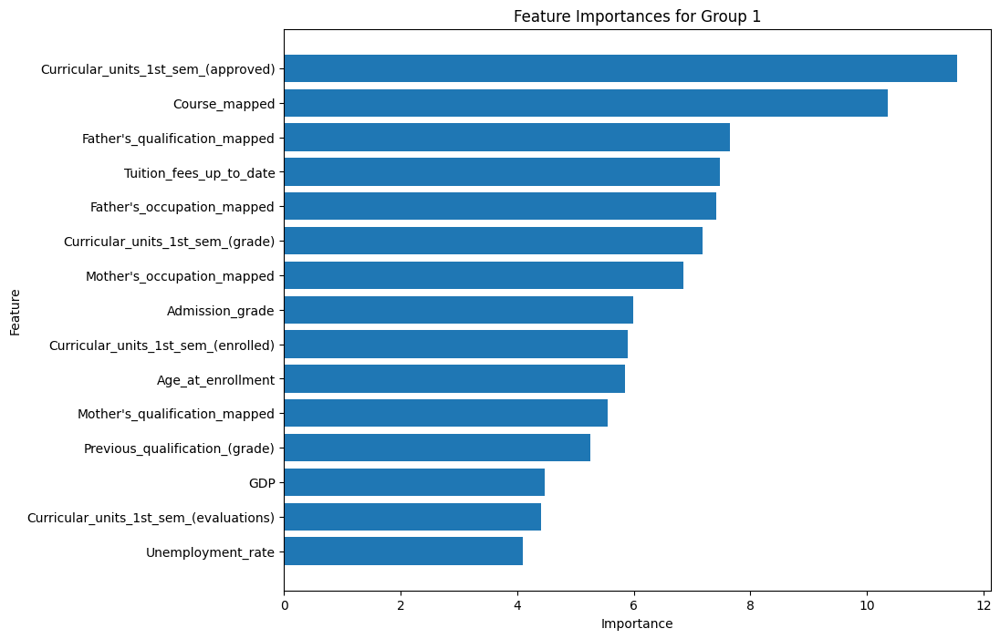


Training and Evaluating on Group 2

Training on Fold 1 of Group 2
0:	learn: 0.6401578	total: 21.8ms	remaining: 21.8s
100:	learn: 0.2886247	total: 2.62s	remaining: 23.3s
200:	learn: 0.1968967	total: 5.31s	remaining: 21.1s
300:	learn: 0.1425208	total: 7.74s	remaining: 18s
400:	learn: 0.1069709	total: 10.2s	remaining: 15.2s
500:	learn: 0.0795974	total: 12.6s	remaining: 12.5s
600:	learn: 0.0614007	total: 15s	remaining: 9.95s
700:	learn: 0.0487018	total: 17.4s	remaining: 7.42s
800:	learn: 0.0405622	total: 20s	remaining: 4.96s
900:	learn: 0.0333688	total: 22.4s	remaining: 2.46s
999:	learn: 0.0288433	total: 25s	remaining: 0us
Classification Report for Fold 1 of Group 2:
               precision    recall  f1-score   support

     Dropout       0.85      0.75      0.80       284
     Persist       0.79      0.87      0.83       301

    accuracy                           0.81       585
   macro avg       0.82      0.81      0.81       585
weighted avg       0.82      0.81      0.81       585


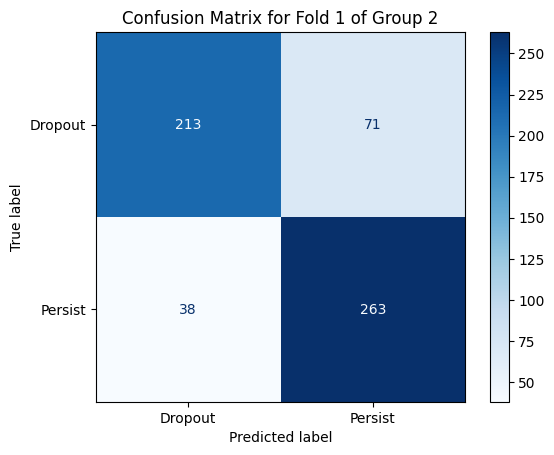


Training on Fold 2 of Group 2
0:	learn: 0.6362145	total: 21.2ms	remaining: 21.2s
100:	learn: 0.3107352	total: 2.35s	remaining: 21s
200:	learn: 0.2235260	total: 4.78s	remaining: 19s
300:	learn: 0.1637118	total: 7.2s	remaining: 16.7s
400:	learn: 0.1237655	total: 9.62s	remaining: 14.4s
500:	learn: 0.0963129	total: 12s	remaining: 12s
600:	learn: 0.0745864	total: 14.4s	remaining: 9.56s
700:	learn: 0.0590725	total: 16.8s	remaining: 7.15s
800:	learn: 0.0493223	total: 19.6s	remaining: 4.87s
900:	learn: 0.0409557	total: 22.3s	remaining: 2.45s
999:	learn: 0.0349306	total: 24.8s	remaining: 0us
Classification Report for Fold 2 of Group 2:
               precision    recall  f1-score   support

     Dropout       0.87      0.81      0.84       284
     Persist       0.83      0.88      0.86       301

    accuracy                           0.85       585
   macro avg       0.85      0.85      0.85       585
weighted avg       0.85      0.85      0.85       585



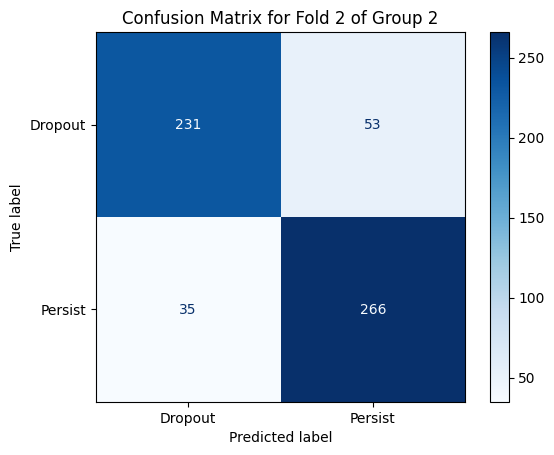


Training on Fold 3 of Group 2
0:	learn: 0.6382778	total: 21.5ms	remaining: 21.5s
100:	learn: 0.2908093	total: 2.57s	remaining: 22.9s
200:	learn: 0.2061609	total: 5.13s	remaining: 20.4s
300:	learn: 0.1482165	total: 7.67s	remaining: 17.8s
400:	learn: 0.1098164	total: 10.2s	remaining: 15.3s
500:	learn: 0.0848431	total: 12.8s	remaining: 12.8s
600:	learn: 0.0682446	total: 15.6s	remaining: 10.4s
700:	learn: 0.0552173	total: 18.1s	remaining: 7.73s
800:	learn: 0.0460318	total: 20.9s	remaining: 5.19s
900:	learn: 0.0380592	total: 23.3s	remaining: 2.56s
999:	learn: 0.0323566	total: 25.8s	remaining: 0us
Classification Report for Fold 3 of Group 2:
               precision    recall  f1-score   support

     Dropout       0.81      0.74      0.78       285
     Persist       0.77      0.84      0.81       300

    accuracy                           0.79       585
   macro avg       0.79      0.79      0.79       585
weighted avg       0.79      0.79      0.79       585



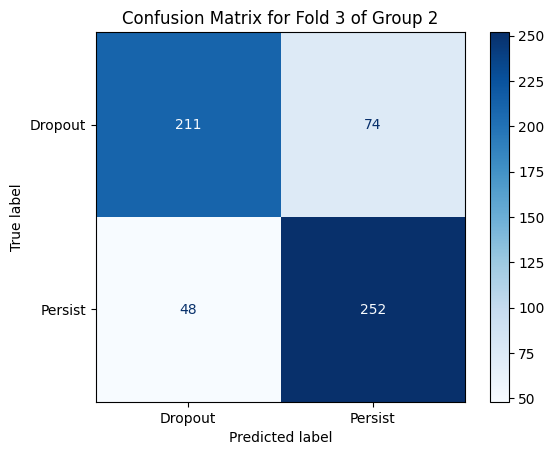


Training on Fold 4 of Group 2
0:	learn: 0.6340095	total: 22.8ms	remaining: 22.7s
100:	learn: 0.2929134	total: 2.69s	remaining: 24s
200:	learn: 0.2047102	total: 5.29s	remaining: 21s
300:	learn: 0.1508761	total: 7.74s	remaining: 18s
400:	learn: 0.1130135	total: 10.2s	remaining: 15.2s
500:	learn: 0.0878233	total: 12.6s	remaining: 12.6s
600:	learn: 0.0670302	total: 15s	remaining: 9.97s
700:	learn: 0.0543023	total: 17.5s	remaining: 7.47s
800:	learn: 0.0452228	total: 20.2s	remaining: 5.01s
900:	learn: 0.0369757	total: 22.9s	remaining: 2.51s
999:	learn: 0.0314694	total: 25.4s	remaining: 0us
Classification Report for Fold 4 of Group 2:
               precision    recall  f1-score   support

     Dropout       0.81      0.79      0.80       284
     Persist       0.80      0.82      0.81       300

    accuracy                           0.80       584
   macro avg       0.80      0.80      0.80       584
weighted avg       0.80      0.80      0.80       584



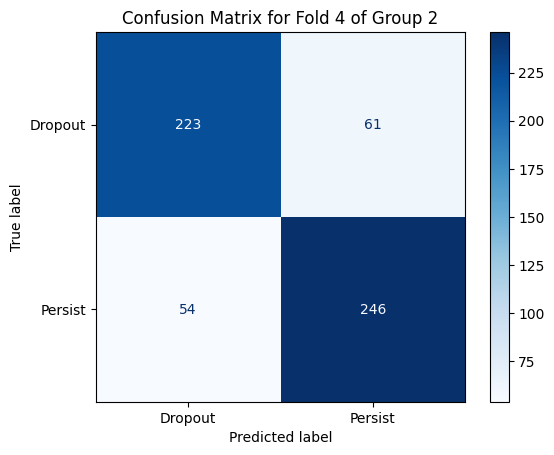


Training on Fold 5 of Group 2
0:	learn: 0.6381411	total: 21.4ms	remaining: 21.4s
100:	learn: 0.2953442	total: 2.42s	remaining: 21.6s
200:	learn: 0.2142870	total: 4.76s	remaining: 18.9s
300:	learn: 0.1621392	total: 7.15s	remaining: 16.6s
400:	learn: 0.1255054	total: 9.52s	remaining: 14.2s
500:	learn: 0.0986735	total: 11.9s	remaining: 11.8s
600:	learn: 0.0790310	total: 14.3s	remaining: 9.48s
700:	learn: 0.0637944	total: 16.8s	remaining: 7.14s
800:	learn: 0.0529671	total: 19.3s	remaining: 4.8s
900:	learn: 0.0454526	total: 22s	remaining: 2.42s
999:	learn: 0.0383637	total: 24.7s	remaining: 0us
Classification Report for Fold 5 of Group 2:
               precision    recall  f1-score   support

     Dropout       0.83      0.75      0.79       284
     Persist       0.78      0.85      0.82       300

    accuracy                           0.80       584
   macro avg       0.80      0.80      0.80       584
weighted avg       0.80      0.80      0.80       584



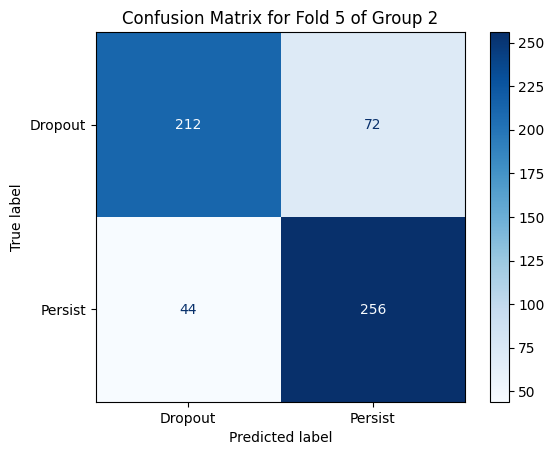


Summary of 5-Fold Cross-Validation Results for Group 2:
Classification Report for Fold 1:
               precision    recall  f1-score   support

     Dropout       0.85      0.75      0.80       284
     Persist       0.79      0.87      0.83       301

    accuracy                           0.81       585
   macro avg       0.82      0.81      0.81       585
weighted avg       0.82      0.81      0.81       585

Classification Report for Fold 2:
               precision    recall  f1-score   support

     Dropout       0.87      0.81      0.84       284
     Persist       0.83      0.88      0.86       301

    accuracy                           0.85       585
   macro avg       0.85      0.85      0.85       585
weighted avg       0.85      0.85      0.85       585

Classification Report for Fold 3:
               precision    recall  f1-score   support

     Dropout       0.81      0.74      0.78       285
     Persist       0.77      0.84      0.81       300

    accuracy        

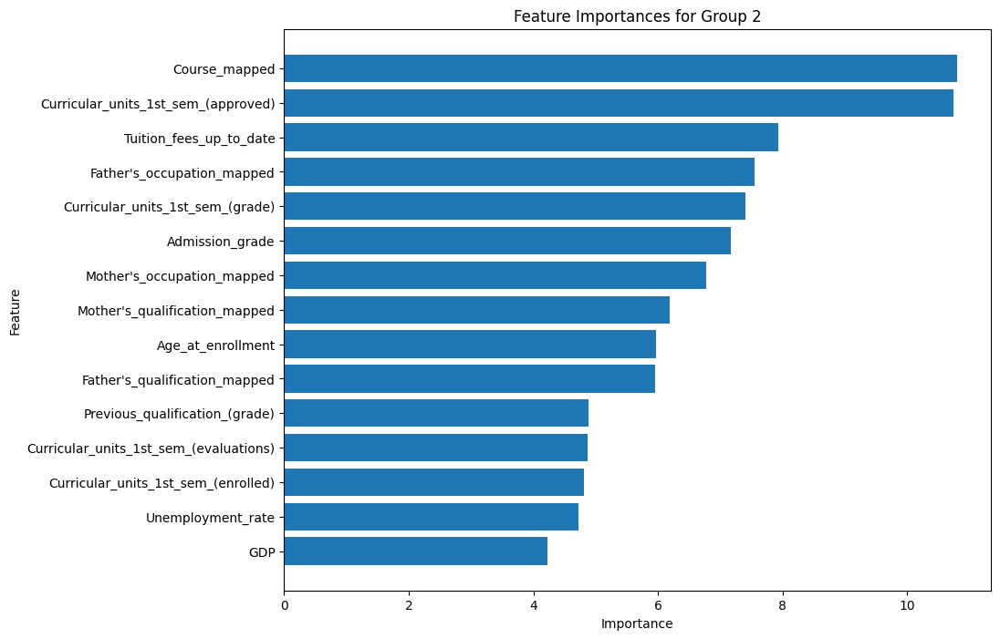

In [116]:
import pandas as pd
from catboost import CatBoostClassifier, Pool
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import StratifiedKFold
import matplotlib.pyplot as plt
import numpy as np


all_features = [
    'Marital_status', 'Application_order',
    'Daytime/evening_attendance', 'Previous_qualification_(grade)', 'Admission_grade',
    'Displaced', 'Educational_special_needs', 'Debtor', 'Tuition_fees_up_to_date',
    'Gender', 'Scholarship_holder', 'Age_at_enrollment', 'International',
    'Curricular_units_1st_sem_(credited)', 'Curricular_units_1st_sem_(enrolled)',
    'Curricular_units_1st_sem_(evaluations)', 'Curricular_units_1st_sem_(approved)',
    'Curricular_units_1st_sem_(grade)', 'Curricular_units_1st_sem_(without_evaluations)',
    # Exclude second-semester features
    # 'Curricular_units_2nd_sem_(credited)', 'Curricular_units_2nd_sem_(enrolled)',
    # 'Curricular_units_2nd_sem_(evaluations)', 'Curricular_units_2nd_sem_(approved)',
    # 'Curricular_units_2nd_sem_(grade)', 'Curricular_units_2nd_sem_(without_evaluations)',
    'Unemployment_rate', 'Inflation_rate', 'GDP', "Mother's_qualification_mapped",
    "Father's_qualification_mapped", 'Previous_qualification_mapped',
    'Application_mode_mapped', 'Course_mapped', "Mother's_occupation_mapped", "Father's_occupation_mapped"
]

# Define categorical features for CatBoost
categ_features = [
    'Displaced',
    'Gender',
    'International',
    'Educational_special_needs',
    'Debtor',
    'Tuition_fees_up_to_date',
    'Scholarship_holder',
    'Daytime/evening_attendance',
    'Marital_status',
    "Mother's_qualification_mapped",
    "Father's_qualification_mapped",
    'Previous_qualification_mapped',
    'Application_mode_mapped',
    "Mother's_occupation_mapped",
    "Father's_occupation_mapped",
    'Course_mapped'
]

# Map original Target to binary
data['Target_binary'] = data['Target'].map({0: 0, 1: 1, 2: 1})

# Check the counts
print("Value counts for each category in the 'Target_binary' column:")
print(data['Target_binary'].value_counts())

# Prepare data for feature importance analysis
X = data[all_features].copy()
y = data['Target_binary']

# Ensure categorical features are strings
for cat_col in categ_features:
    X[cat_col] = X[cat_col].astype(str)

# Define CatBoost Pool (needed for categorical features)
train_pool = Pool(X, y, cat_features=categ_features)

# Initialize and train CatBoost model to get feature importances
model = CatBoostClassifier(
    iterations=1000,
    learning_rate=0.1,
    depth=6,
    verbose=100,
    random_seed=42
)
model.fit(train_pool)

# Get feature importances
feature_importances = model.get_feature_importance(train_pool)
feature_names = X.columns

# Create a DataFrame for feature importances
fi_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importances
})

# Sort features by importance
fi_df = fi_df.sort_values(by='Importance', ascending=False)

# Display top features
print("\nTop features based on importance:")
print(fi_df)

# Select top N features based on importance scores
top_n = 15  # You can adjust this number as needed
selected_features = fi_df['Feature'].head(top_n).tolist()

print(f"\nSelected Top {top_n} Features:")
print(selected_features)

# Update feature lists
all_features = selected_features
categ_features = [feature for feature in categ_features if feature in selected_features]

# Now, retrain the model using only the selected features

# Split data into 'persist' and 'dropout' subsets
persist_data = data[data['Target_binary'] == 1]
dropout_data = data[data['Target_binary'] == 0]

# Split 'persist_data' into two subsets for group creation
persist_splits = [persist_data.iloc[:1501], persist_data.iloc[1501:]]

# Define groups by combining 'dropout_data' with each 'persist_split'
groups = {
    "Group 1": pd.concat([persist_splits[0], dropout_data]),
    "Group 2": pd.concat([persist_splits[1], dropout_data])
}

# Train and evaluate CatBoost model on each group using stratified 5-fold cross-validation
for group_name, group_data in groups.items():
    print(f"\nTraining and Evaluating on {group_name}")

    # Separate features and target
    X_group = group_data[all_features].copy()
    y_group = group_data['Target_binary']

    # Ensure categorical features are strings
    for cat_col in categ_features:
        X_group[cat_col] = X_group[cat_col].astype(str)

    # Initialize stratified K-Fold cross-validator
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    # Initialize an empty list to store evaluation results
    evaluation_reports = []

    # Start stratified 5-fold cross-validation
    for fold, (train_idx, test_idx) in enumerate(skf.split(X_group, y_group)):
        print(f"\nTraining on Fold {fold + 1} of {group_name}")

        # Split data into training and testing sets for this fold
        X_train, X_test = X_group.iloc[train_idx], X_group.iloc[test_idx]
        y_train, y_test = y_group.iloc[train_idx], y_group.iloc[test_idx]

        # Define CatBoost Pool (needed for categorical features)
        train_pool = Pool(X_train, y_train, cat_features=categ_features)
        test_pool = Pool(X_test, y_test, cat_features=categ_features)

        # Initialize and train CatBoost model
        model = CatBoostClassifier(
            iterations=1000,
            learning_rate=0.1,
            depth=6,
            verbose=100,
            random_seed=42
        )
        model.fit(train_pool)

        # Make predictions and evaluate the model
        y_pred = model.predict(test_pool)
        report = classification_report(y_test, y_pred, target_names=['Dropout', 'Persist'])
        print(f"Classification Report for Fold {fold + 1} of {group_name}:\n", report)

        # Append the report to the list for further analysis
        evaluation_reports.append(report)

        # Compute confusion matrix
        cm = confusion_matrix(y_test, y_pred)

        # Plot confusion matrix
        disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Dropout', 'Persist'])
        disp.plot(cmap=plt.cm.Blues)
        plt.title(f'Confusion Matrix for Fold {fold + 1} of {group_name}')
        plt.show()

    # Summary of the reports after all folds have been completed for each group
    print(f"\nSummary of 5-Fold Cross-Validation Results for {group_name}:")
    for i, report in enumerate(evaluation_reports, 1):
        print(f"Classification Report for Fold {i}:\n", report)

    # Plot feature importances
    feature_importances = model.get_feature_importance()
    sorted_indices = np.argsort(feature_importances)[::-1]
    plt.figure(figsize=(10, 8))
    plt.barh(
        [all_features[i] for i in sorted_indices],
        np.array(feature_importances)[sorted_indices]
    )
    plt.xlabel('Importance')
    plt.ylabel('Feature')
    plt.title(f'Feature Importances for {group_name}')
    plt.gca().invert_yaxis()
    plt.show()


# CATBOOST - mapped feutures - binary target- drop out 2nd semester -  controlled group splits with 5-Fold validation

Value counts for each category in the 'Target_binary' column:
Target_binary
1    3003
0    1421
Name: count, dtype: int64

Training and Evaluating on Group 1

Training on Fold 1 of Group 1
0:	learn: 0.6338354	total: 41.7ms	remaining: 41.6s
100:	learn: 0.2768548	total: 3.17s	remaining: 28.2s
200:	learn: 0.1916026	total: 5.84s	remaining: 23.2s
300:	learn: 0.1345332	total: 8.53s	remaining: 19.8s
400:	learn: 0.0983073	total: 11.2s	remaining: 16.8s
500:	learn: 0.0749868	total: 14.1s	remaining: 14.1s
600:	learn: 0.0590324	total: 16.9s	remaining: 11.2s
700:	learn: 0.0484141	total: 19.6s	remaining: 8.34s
800:	learn: 0.0393783	total: 22.3s	remaining: 5.53s
900:	learn: 0.0333908	total: 25s	remaining: 2.75s
999:	learn: 0.0284280	total: 27.7s	remaining: 0us
Classification Report for Fold 1 of Group 1:
               precision    recall  f1-score   support

     Dropout       0.84      0.77      0.80       284
     Persist       0.80      0.86      0.83       301

    accuracy                      

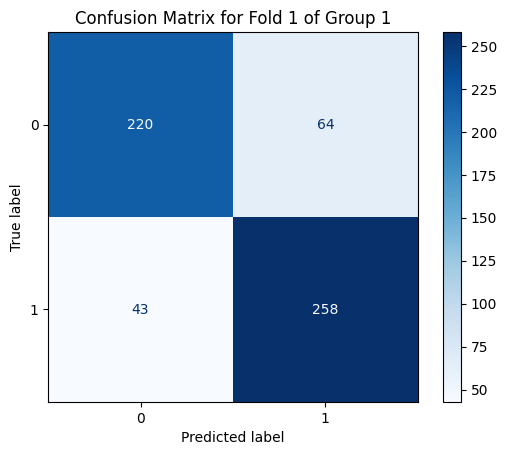


Training on Fold 2 of Group 1
0:	learn: 0.6418952	total: 24.5ms	remaining: 24.5s
100:	learn: 0.2824230	total: 2.63s	remaining: 23.4s
200:	learn: 0.1998091	total: 5.36s	remaining: 21.3s
300:	learn: 0.1397940	total: 8.11s	remaining: 18.8s
400:	learn: 0.1075017	total: 10.9s	remaining: 16.3s
500:	learn: 0.0854721	total: 13.7s	remaining: 13.7s
600:	learn: 0.0669291	total: 16.4s	remaining: 10.9s
700:	learn: 0.0556634	total: 19.1s	remaining: 8.15s
800:	learn: 0.0469297	total: 21.8s	remaining: 5.41s
900:	learn: 0.0392779	total: 24.4s	remaining: 2.68s
999:	learn: 0.0338498	total: 27.1s	remaining: 0us
Classification Report for Fold 2 of Group 1:
               precision    recall  f1-score   support

     Dropout       0.83      0.84      0.84       285
     Persist       0.85      0.84      0.84       300

    accuracy                           0.84       585
   macro avg       0.84      0.84      0.84       585
weighted avg       0.84      0.84      0.84       585



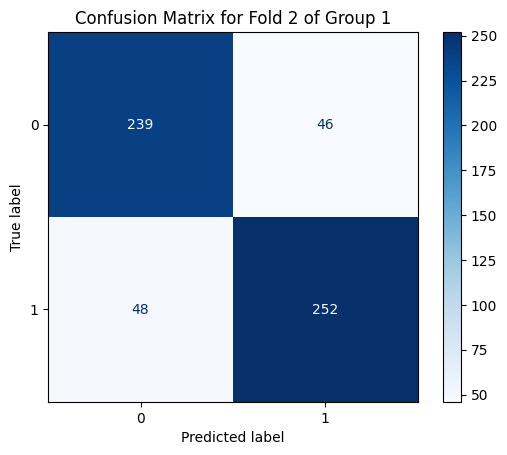


Training on Fold 3 of Group 1
0:	learn: 0.6293226	total: 24.3ms	remaining: 24.3s
100:	learn: 0.2724191	total: 2.63s	remaining: 23.5s
200:	learn: 0.1878958	total: 5.3s	remaining: 21.1s
300:	learn: 0.1417666	total: 7.96s	remaining: 18.5s
400:	learn: 0.1064543	total: 10.6s	remaining: 15.8s
500:	learn: 0.0805672	total: 13.4s	remaining: 13.4s
600:	learn: 0.0637269	total: 16.3s	remaining: 10.8s
700:	learn: 0.0527129	total: 19.2s	remaining: 8.18s
800:	learn: 0.0428092	total: 22s	remaining: 5.46s
900:	learn: 0.0358456	total: 24.7s	remaining: 2.71s
999:	learn: 0.0306092	total: 27.5s	remaining: 0us
Classification Report for Fold 3 of Group 1:
               precision    recall  f1-score   support

     Dropout       0.83      0.79      0.81       284
     Persist       0.81      0.84      0.82       300

    accuracy                           0.82       584
   macro avg       0.82      0.81      0.81       584
weighted avg       0.82      0.82      0.81       584



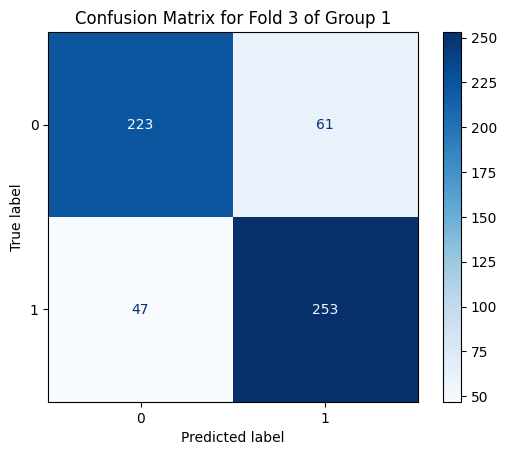


Training on Fold 4 of Group 1
0:	learn: 0.6311227	total: 24.3ms	remaining: 24.3s
100:	learn: 0.2752301	total: 2.75s	remaining: 24.4s
200:	learn: 0.1871775	total: 5.73s	remaining: 22.8s
300:	learn: 0.1354589	total: 8.64s	remaining: 20.1s
400:	learn: 0.0985010	total: 11.5s	remaining: 17.2s
500:	learn: 0.0751676	total: 14.5s	remaining: 14.5s
600:	learn: 0.0583146	total: 17.8s	remaining: 11.8s
700:	learn: 0.0465227	total: 20.9s	remaining: 8.91s
800:	learn: 0.0373164	total: 23.6s	remaining: 5.87s
900:	learn: 0.0310654	total: 26.5s	remaining: 2.91s
999:	learn: 0.0265896	total: 29.5s	remaining: 0us
Classification Report for Fold 4 of Group 1:
               precision    recall  f1-score   support

     Dropout       0.86      0.79      0.82       284
     Persist       0.82      0.88      0.85       300

    accuracy                           0.84       584
   macro avg       0.84      0.83      0.83       584
weighted avg       0.84      0.84      0.84       584



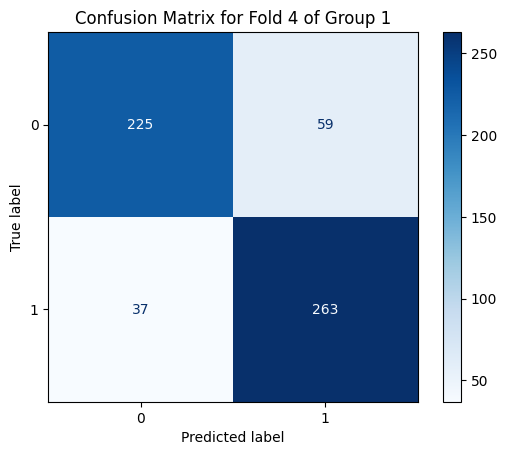


Training on Fold 5 of Group 1
0:	learn: 0.6339952	total: 32.3ms	remaining: 32.3s
100:	learn: 0.2783286	total: 2.84s	remaining: 25.3s
200:	learn: 0.1941092	total: 5.84s	remaining: 23.2s
300:	learn: 0.1404338	total: 8.6s	remaining: 20s
400:	learn: 0.1051826	total: 11.9s	remaining: 17.8s
500:	learn: 0.0805305	total: 14.6s	remaining: 14.6s
600:	learn: 0.0638828	total: 17.4s	remaining: 11.6s
700:	learn: 0.0511261	total: 20.9s	remaining: 8.93s
800:	learn: 0.0442323	total: 23.7s	remaining: 5.88s
900:	learn: 0.0380034	total: 26.4s	remaining: 2.9s
999:	learn: 0.0329901	total: 29.1s	remaining: 0us
Classification Report for Fold 5 of Group 1:
               precision    recall  f1-score   support

     Dropout       0.86      0.79      0.82       284
     Persist       0.82      0.88      0.85       300

    accuracy                           0.84       584
   macro avg       0.84      0.83      0.83       584
weighted avg       0.84      0.84      0.84       584



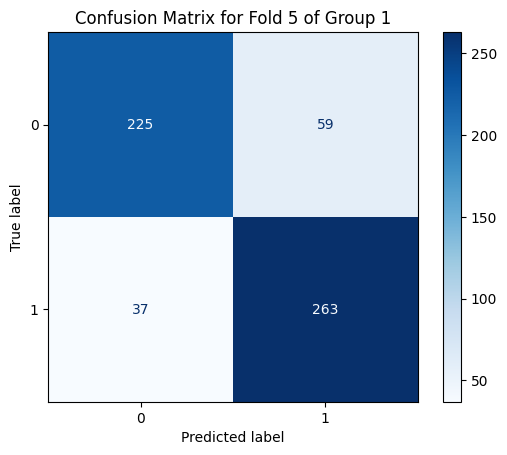


Summary of 5-Fold Cross-Validation Results for Group 1:
Classification Report for Fold 1:
               precision    recall  f1-score   support

     Dropout       0.84      0.77      0.80       284
     Persist       0.80      0.86      0.83       301

    accuracy                           0.82       585
   macro avg       0.82      0.82      0.82       585
weighted avg       0.82      0.82      0.82       585

Classification Report for Fold 2:
               precision    recall  f1-score   support

     Dropout       0.83      0.84      0.84       285
     Persist       0.85      0.84      0.84       300

    accuracy                           0.84       585
   macro avg       0.84      0.84      0.84       585
weighted avg       0.84      0.84      0.84       585

Classification Report for Fold 3:
               precision    recall  f1-score   support

     Dropout       0.83      0.79      0.81       284
     Persist       0.81      0.84      0.82       300

    accuracy        

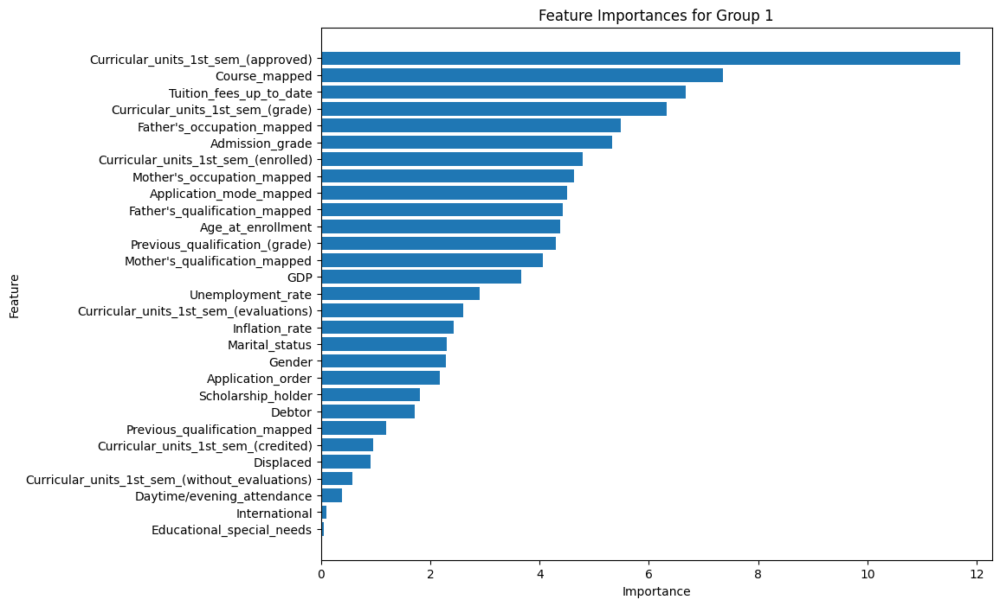


Training and Evaluating on Group 2

Training on Fold 1 of Group 2
0:	learn: 0.6341163	total: 23.4ms	remaining: 23.4s
100:	learn: 0.2868991	total: 2.64s	remaining: 23.5s
200:	learn: 0.1929991	total: 5.45s	remaining: 21.7s
300:	learn: 0.1395212	total: 8.19s	remaining: 19s
400:	learn: 0.1009871	total: 10.9s	remaining: 16.3s
500:	learn: 0.0755436	total: 13.7s	remaining: 13.7s
600:	learn: 0.0585175	total: 16.4s	remaining: 10.9s
700:	learn: 0.0470433	total: 19.2s	remaining: 8.17s
800:	learn: 0.0380203	total: 21.9s	remaining: 5.43s
900:	learn: 0.0313851	total: 24.6s	remaining: 2.7s
999:	learn: 0.0262835	total: 27.3s	remaining: 0us
Classification Report for Fold 1 of Group 2:
               precision    recall  f1-score   support

     Dropout       0.88      0.75      0.81       284
     Persist       0.80      0.90      0.85       301

    accuracy                           0.83       585
   macro avg       0.84      0.83      0.83       585
weighted avg       0.84      0.83      0.83      

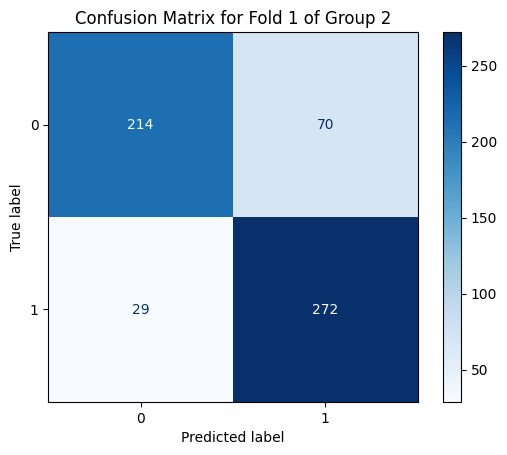


Training on Fold 2 of Group 2
0:	learn: 0.6431484	total: 25ms	remaining: 25s
100:	learn: 0.2974293	total: 2.72s	remaining: 24.2s
200:	learn: 0.2070113	total: 5.41s	remaining: 21.5s
300:	learn: 0.1474376	total: 8.13s	remaining: 18.9s
400:	learn: 0.1077676	total: 10.9s	remaining: 16.3s
500:	learn: 0.0803753	total: 13.8s	remaining: 13.8s
600:	learn: 0.0637207	total: 16.6s	remaining: 11s
700:	learn: 0.0503667	total: 19.3s	remaining: 8.24s
800:	learn: 0.0409304	total: 22s	remaining: 5.47s
900:	learn: 0.0333371	total: 24.7s	remaining: 2.72s
999:	learn: 0.0281233	total: 27.4s	remaining: 0us
Classification Report for Fold 2 of Group 2:
               precision    recall  f1-score   support

     Dropout       0.87      0.81      0.84       284
     Persist       0.83      0.89      0.86       301

    accuracy                           0.85       585
   macro avg       0.85      0.85      0.85       585
weighted avg       0.85      0.85      0.85       585



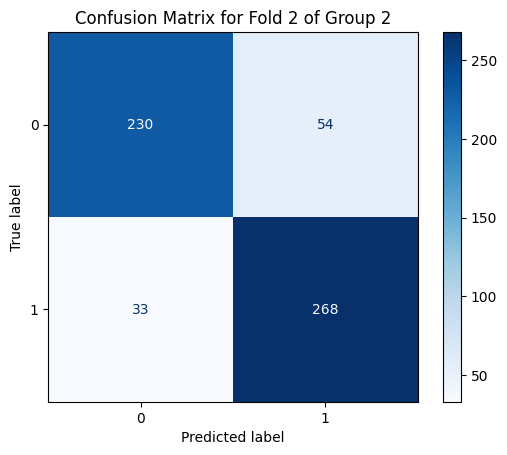


Training on Fold 3 of Group 2
0:	learn: 0.6364874	total: 23.8ms	remaining: 23.7s
100:	learn: 0.2849297	total: 2.63s	remaining: 23.4s
200:	learn: 0.1964747	total: 5.32s	remaining: 21.1s
300:	learn: 0.1413588	total: 8.12s	remaining: 18.9s
400:	learn: 0.1029428	total: 10.8s	remaining: 16.2s
500:	learn: 0.0818490	total: 13.5s	remaining: 13.5s
600:	learn: 0.0663863	total: 16.3s	remaining: 10.8s
700:	learn: 0.0522062	total: 19s	remaining: 8.1s
800:	learn: 0.0439487	total: 21.7s	remaining: 5.38s
900:	learn: 0.0379368	total: 24.4s	remaining: 2.68s
999:	learn: 0.0332292	total: 27.1s	remaining: 0us
Classification Report for Fold 3 of Group 2:
               precision    recall  f1-score   support

     Dropout       0.84      0.75      0.79       285
     Persist       0.78      0.86      0.82       300

    accuracy                           0.81       585
   macro avg       0.81      0.81      0.81       585
weighted avg       0.81      0.81      0.81       585



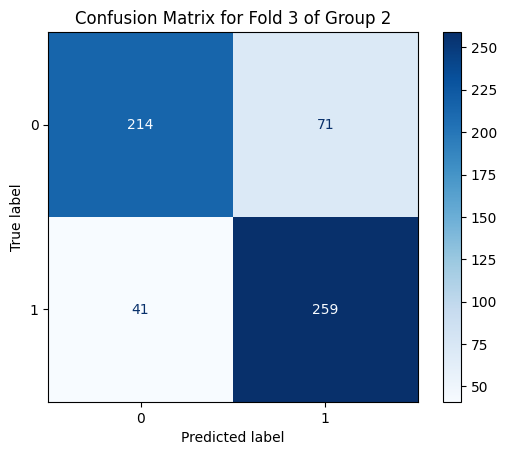


Training on Fold 4 of Group 2
0:	learn: 0.6371271	total: 24.2ms	remaining: 24.2s
100:	learn: 0.2766209	total: 2.69s	remaining: 24s
200:	learn: 0.1919409	total: 5.37s	remaining: 21.4s
300:	learn: 0.1389839	total: 8.05s	remaining: 18.7s
400:	learn: 0.1027001	total: 10.8s	remaining: 16.1s
500:	learn: 0.0786392	total: 13.7s	remaining: 13.7s
600:	learn: 0.0615058	total: 16.5s	remaining: 10.9s
700:	learn: 0.0489570	total: 19.4s	remaining: 8.27s
800:	learn: 0.0401765	total: 22.1s	remaining: 5.49s
900:	learn: 0.0337279	total: 25s	remaining: 2.75s
999:	learn: 0.0279927	total: 27.7s	remaining: 0us
Classification Report for Fold 4 of Group 2:
               precision    recall  f1-score   support

     Dropout       0.82      0.78      0.80       284
     Persist       0.80      0.84      0.82       300

    accuracy                           0.81       584
   macro avg       0.81      0.81      0.81       584
weighted avg       0.81      0.81      0.81       584



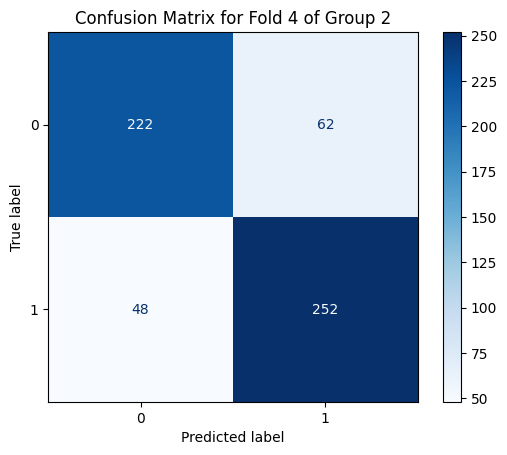


Training on Fold 5 of Group 2
0:	learn: 0.6333278	total: 23.9ms	remaining: 23.8s
100:	learn: 0.2894257	total: 2.66s	remaining: 23.7s
200:	learn: 0.2013388	total: 5.34s	remaining: 21.2s
300:	learn: 0.1433613	total: 8.23s	remaining: 19.1s
400:	learn: 0.1065203	total: 11.2s	remaining: 16.7s
500:	learn: 0.0815687	total: 14s	remaining: 14s
600:	learn: 0.0633823	total: 17s	remaining: 11.3s
700:	learn: 0.0506984	total: 19.9s	remaining: 8.49s
800:	learn: 0.0426418	total: 22.7s	remaining: 5.63s
900:	learn: 0.0352735	total: 25.5s	remaining: 2.81s
999:	learn: 0.0298727	total: 28.3s	remaining: 0us
Classification Report for Fold 5 of Group 2:
               precision    recall  f1-score   support

     Dropout       0.83      0.76      0.79       284
     Persist       0.79      0.85      0.82       300

    accuracy                           0.81       584
   macro avg       0.81      0.81      0.81       584
weighted avg       0.81      0.81      0.81       584



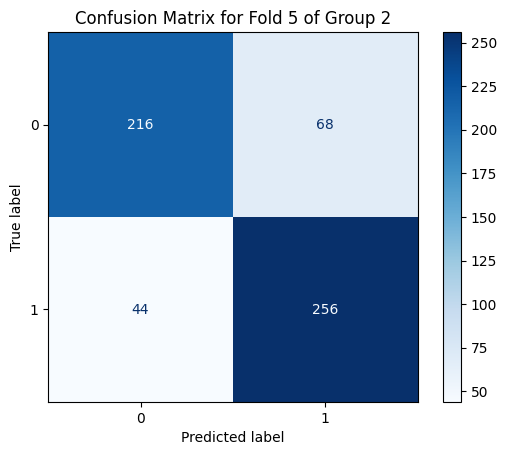


Summary of 5-Fold Cross-Validation Results for Group 2:
Classification Report for Fold 1:
               precision    recall  f1-score   support

     Dropout       0.88      0.75      0.81       284
     Persist       0.80      0.90      0.85       301

    accuracy                           0.83       585
   macro avg       0.84      0.83      0.83       585
weighted avg       0.84      0.83      0.83       585

Classification Report for Fold 2:
               precision    recall  f1-score   support

     Dropout       0.87      0.81      0.84       284
     Persist       0.83      0.89      0.86       301

    accuracy                           0.85       585
   macro avg       0.85      0.85      0.85       585
weighted avg       0.85      0.85      0.85       585

Classification Report for Fold 3:
               precision    recall  f1-score   support

     Dropout       0.84      0.75      0.79       285
     Persist       0.78      0.86      0.82       300

    accuracy        

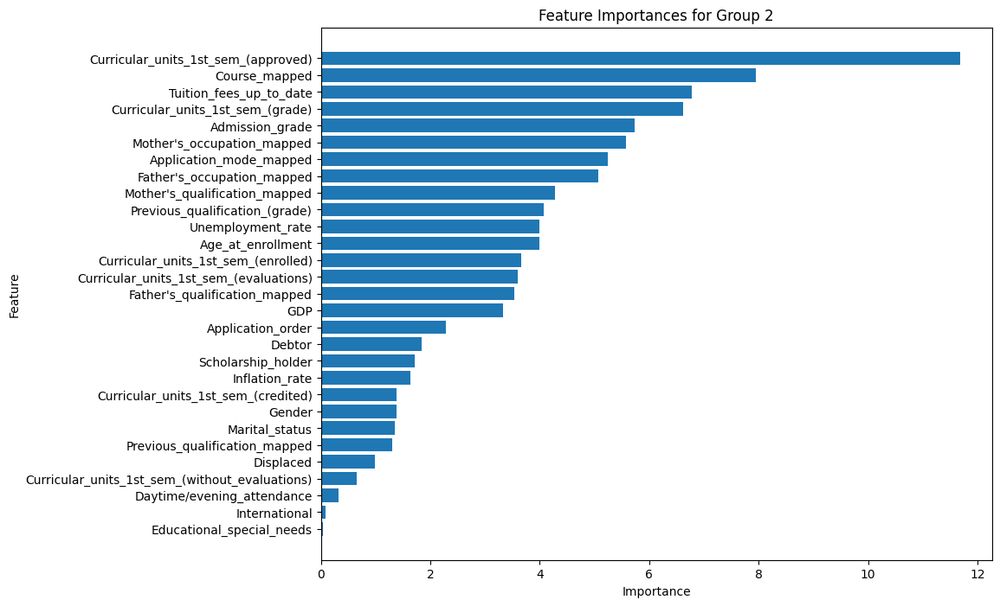

In [113]:
import pandas as pd
from catboost import CatBoostClassifier, Pool
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import StratifiedKFold
import matplotlib.pyplot as plt

# Define the columns to use, excluding original and grouped columns
all_features = [
    'Marital_status', 'Application_order',
    'Daytime/evening_attendance', 'Previous_qualification_(grade)', 'Admission_grade',
    'Displaced', 'Educational_special_needs', 'Debtor', 'Tuition_fees_up_to_date',
    'Gender', 'Scholarship_holder', 'Age_at_enrollment', 'International',
    'Curricular_units_1st_sem_(credited)', 'Curricular_units_1st_sem_(enrolled)',
    'Curricular_units_1st_sem_(evaluations)', 'Curricular_units_1st_sem_(approved)',
    'Curricular_units_1st_sem_(grade)', 'Curricular_units_1st_sem_(without_evaluations)',
    
    'Unemployment_rate', 'Inflation_rate', 'GDP', "Mother's_qualification_mapped",
    "Father's_qualification_mapped", 'Previous_qualification_mapped',
    'Application_mode_mapped', 'Course_mapped', "Mother's_occupation_mapped", "Father's_occupation_mapped"
]

# Define categorical features for CatBoost
categ_features = [
    'Displaced',
    'Gender',
    'International',
    'Educational_special_needs',
    'Debtor',
    'Tuition_fees_up_to_date',
    'Scholarship_holder',
    'Daytime/evening_attendance',
    'Marital_status',
    "Mother's_qualification_mapped",
    "Father's_qualification_mapped",
    'Previous_qualification_mapped',
    'Application_mode_mapped',
    "Mother's_occupation_mapped",
    "Father's_occupation_mapped",
    'Course_mapped'
]

# Map original Target to binary
data['Target_binary'] = data['Target'].map({0: 0, 1: 1, 2: 1})

# Check the counts
print("Value counts for each category in the 'Target_binary' column:")
print(data['Target_binary'].value_counts())

# Split data into 'persist' and 'dropout' subsets
persist_data = data[data['Target_binary'] == 1]
dropout_data = data[data['Target_binary'] == 0]

# Split 'persist_data' into two subsets
persist_splits = [persist_data.iloc[:1501], persist_data.iloc[1501:]]

# Define groups by combining 'dropout_data' with each 'persist_split'
groups = {
    "Group 1": pd.concat([persist_splits[0], dropout_data]),
    "Group 2": pd.concat([persist_splits[1], dropout_data])
}

# Train and evaluate CatBoost model on each group using stratified 5-fold cross-validation
for group_name, group_data in groups.items():
    print(f"\nTraining and Evaluating on {group_name}")

    # Separate features and target
    X = group_data[all_features]
    y = group_data['Target_binary']

    # Initialize stratified K-Fold cross-validator
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    # Initialize an empty list to store evaluation results
    evaluation_reports = []

    # Start stratified 5-fold cross-validation
    for fold, (train_idx, test_idx) in enumerate(skf.split(X, y)):
        print(f"\nTraining on Fold {fold + 1} of {group_name}")

        # Split data into training and testing sets for this fold
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

        # Define CatBoost Pool (needed for categorical features)
        train_pool = Pool(X_train, y_train, cat_features=categ_features)
        test_pool = Pool(X_test, y_test, cat_features=categ_features)

        # Initialize and train CatBoost model
        model = CatBoostClassifier(
            iterations=1000,
            learning_rate=0.1,
            depth=6,
            verbose=100,
            random_seed=42
        )
        model.fit(train_pool)

        # Make predictions and evaluate the model
        y_pred = model.predict(test_pool)
        report = classification_report(y_test, y_pred, target_names=['Dropout', 'Persist'])
        print(f"Classification Report for Fold {fold + 1} of {group_name}:\n", report)

        # Append the report to the list for further analysis
        evaluation_reports.append(report)

        # Compute confusion matrix
        cm = confusion_matrix(y_test, y_pred)

        # Plot confusion matrix
        disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
        disp.plot(cmap=plt.cm.Blues)
        plt.title(f'Confusion Matrix for Fold {fold + 1} of {group_name}')
        plt.show()

    # Summary of the reports after all folds have been completed for each group
    print(f"\nSummary of 5-Fold Cross-Validation Results for {group_name}:")
    for i, report in enumerate(evaluation_reports, 1):
        print(f"Classification Report for Fold {i}:\n", report)

    # Plot feature importances
    feature_importances = model.feature_importances_
    sorted_indices = feature_importances.argsort()[::-1]
    plt.figure(figsize=(10, 8))
    plt.barh(
        [all_features[i] for i in sorted_indices],
        feature_importances[sorted_indices]
    )
    plt.xlabel('Importance')
    plt.ylabel('Feature')
    plt.title(f'Feature Importances for {group_name}')
    plt.gca().invert_yaxis()
    plt.show()


# CATBOOST - mapped feutures - binary target- drop out 2nd semester & low impact feutures - controlled group splits with 5-Fold validation

Value counts for each category in the 'Target_binary' column:
Target_binary
1    3003
0    1421
Name: count, dtype: int64

Training and Evaluating on Group 1

Training on Fold 1 of Group 1
0:	learn: 0.6305168	total: 40.5ms	remaining: 40.5s
100:	learn: 0.2895670	total: 2.7s	remaining: 24.1s
200:	learn: 0.2056910	total: 5.23s	remaining: 20.8s
300:	learn: 0.1569831	total: 8.02s	remaining: 18.6s
400:	learn: 0.1151819	total: 10.6s	remaining: 15.9s
500:	learn: 0.0900655	total: 13.3s	remaining: 13.2s
600:	learn: 0.0731589	total: 15.8s	remaining: 10.5s
700:	learn: 0.0605985	total: 18.3s	remaining: 7.82s
800:	learn: 0.0501657	total: 20.8s	remaining: 5.18s
900:	learn: 0.0426681	total: 23.4s	remaining: 2.57s
999:	learn: 0.0368436	total: 25.9s	remaining: 0us
Classification Report for Fold 1 of Group 1:
               precision    recall  f1-score   support

     Dropout       0.81      0.77      0.79       284
     Persist       0.79      0.83      0.81       301

    accuracy                     

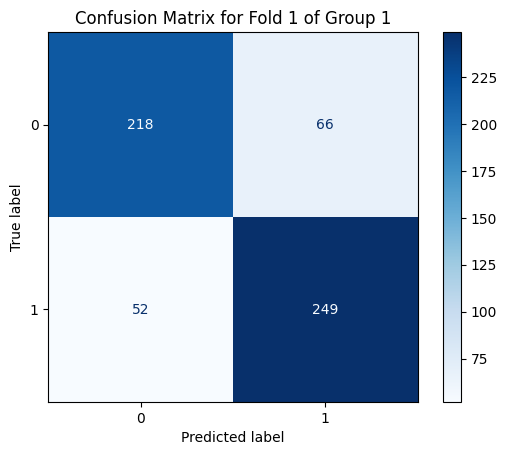


Training on Fold 2 of Group 1
0:	learn: 0.6341402	total: 22.7ms	remaining: 22.7s
100:	learn: 0.2990183	total: 2.51s	remaining: 22.3s
200:	learn: 0.2255002	total: 5.1s	remaining: 20.3s
300:	learn: 0.1661754	total: 8.11s	remaining: 18.8s
400:	learn: 0.1298237	total: 10.8s	remaining: 16.1s
500:	learn: 0.1020023	total: 13.5s	remaining: 13.4s
600:	learn: 0.0816725	total: 16.1s	remaining: 10.7s
700:	learn: 0.0674105	total: 18.6s	remaining: 7.91s
800:	learn: 0.0560364	total: 21.1s	remaining: 5.24s
900:	learn: 0.0491772	total: 24.1s	remaining: 2.65s
999:	learn: 0.0424520	total: 26.8s	remaining: 0us
Classification Report for Fold 2 of Group 1:
               precision    recall  f1-score   support

     Dropout       0.84      0.81      0.82       285
     Persist       0.82      0.85      0.84       300

    accuracy                           0.83       585
   macro avg       0.83      0.83      0.83       585
weighted avg       0.83      0.83      0.83       585



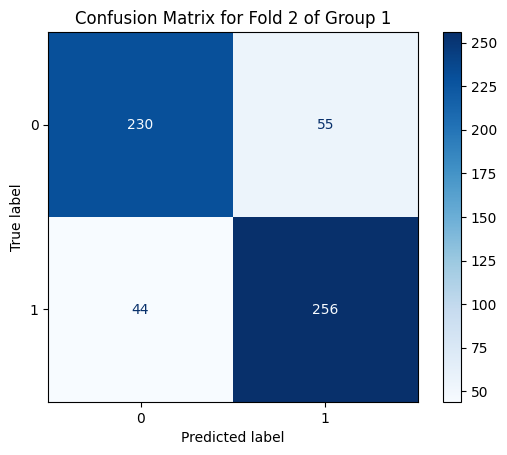


Training on Fold 3 of Group 1
0:	learn: 0.6305556	total: 22.5ms	remaining: 22.5s
100:	learn: 0.2786365	total: 2.6s	remaining: 23.2s
200:	learn: 0.2098006	total: 5.29s	remaining: 21s
300:	learn: 0.1593529	total: 7.86s	remaining: 18.3s
400:	learn: 0.1223914	total: 10.4s	remaining: 15.5s
500:	learn: 0.0988456	total: 13.4s	remaining: 13.4s
600:	learn: 0.0793922	total: 16.2s	remaining: 10.7s
700:	learn: 0.0644969	total: 18.8s	remaining: 8.01s
800:	learn: 0.0549753	total: 21.5s	remaining: 5.34s
900:	learn: 0.0461833	total: 24.7s	remaining: 2.71s
999:	learn: 0.0382342	total: 27.7s	remaining: 0us
Classification Report for Fold 3 of Group 1:
               precision    recall  f1-score   support

     Dropout       0.82      0.77      0.79       284
     Persist       0.79      0.84      0.81       300

    accuracy                           0.80       584
   macro avg       0.81      0.80      0.80       584
weighted avg       0.81      0.80      0.80       584



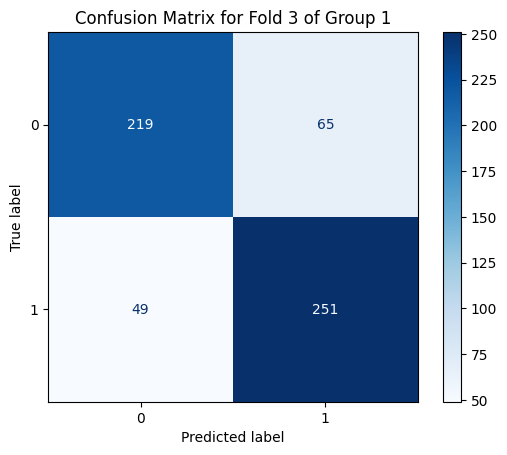


Training on Fold 4 of Group 1
0:	learn: 0.6291399	total: 24.3ms	remaining: 24.3s
100:	learn: 0.2792750	total: 3.09s	remaining: 27.5s
200:	learn: 0.2062144	total: 5.92s	remaining: 23.5s
300:	learn: 0.1508692	total: 8.98s	remaining: 20.9s
400:	learn: 0.1132996	total: 11.9s	remaining: 17.7s
500:	learn: 0.0881986	total: 14.7s	remaining: 14.7s
600:	learn: 0.0669961	total: 17.6s	remaining: 11.7s
700:	learn: 0.0525579	total: 20.4s	remaining: 8.69s
800:	learn: 0.0436658	total: 23.2s	remaining: 5.78s
900:	learn: 0.0374365	total: 26s	remaining: 2.86s
999:	learn: 0.0317485	total: 28.7s	remaining: 0us
Classification Report for Fold 4 of Group 1:
               precision    recall  f1-score   support

     Dropout       0.85      0.79      0.82       284
     Persist       0.81      0.86      0.84       300

    accuracy                           0.83       584
   macro avg       0.83      0.83      0.83       584
weighted avg       0.83      0.83      0.83       584



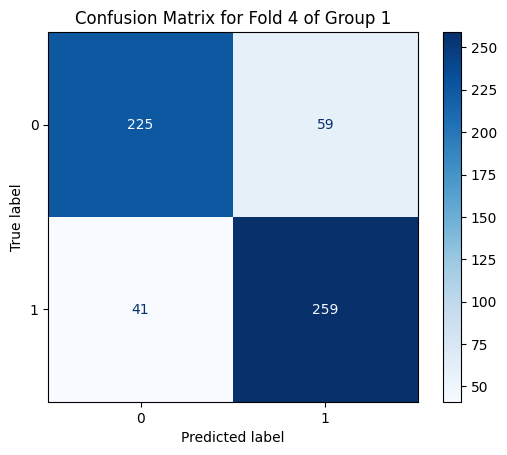


Training on Fold 5 of Group 1
0:	learn: 0.6314019	total: 22.3ms	remaining: 22.2s
100:	learn: 0.2918731	total: 2.99s	remaining: 26.7s
200:	learn: 0.2177000	total: 5.88s	remaining: 23.4s
300:	learn: 0.1682776	total: 8.49s	remaining: 19.7s
400:	learn: 0.1312340	total: 11.2s	remaining: 16.7s
500:	learn: 0.1010750	total: 13.8s	remaining: 13.7s
600:	learn: 0.0815241	total: 16.3s	remaining: 10.8s
700:	learn: 0.0668089	total: 18.9s	remaining: 8.08s
800:	learn: 0.0557091	total: 21.6s	remaining: 5.37s
900:	learn: 0.0478543	total: 24.2s	remaining: 2.65s
999:	learn: 0.0413459	total: 26.7s	remaining: 0us
Classification Report for Fold 5 of Group 1:
               precision    recall  f1-score   support

     Dropout       0.86      0.81      0.83       284
     Persist       0.83      0.88      0.85       300

    accuracy                           0.84       584
   macro avg       0.85      0.84      0.84       584
weighted avg       0.85      0.84      0.84       584



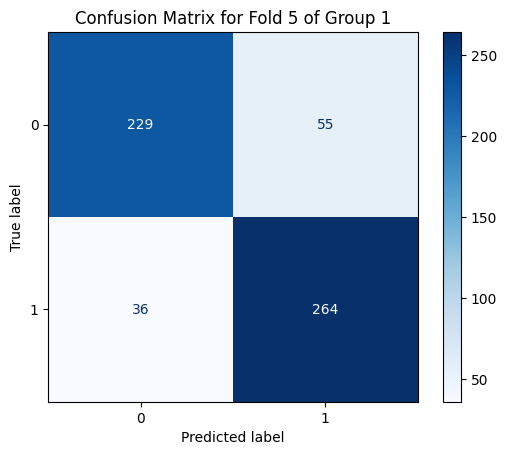


Summary of 5-Fold Cross-Validation Results for Group 1:
Classification Report for Fold 1:
               precision    recall  f1-score   support

     Dropout       0.81      0.77      0.79       284
     Persist       0.79      0.83      0.81       301

    accuracy                           0.80       585
   macro avg       0.80      0.80      0.80       585
weighted avg       0.80      0.80      0.80       585

Classification Report for Fold 2:
               precision    recall  f1-score   support

     Dropout       0.84      0.81      0.82       285
     Persist       0.82      0.85      0.84       300

    accuracy                           0.83       585
   macro avg       0.83      0.83      0.83       585
weighted avg       0.83      0.83      0.83       585

Classification Report for Fold 3:
               precision    recall  f1-score   support

     Dropout       0.82      0.77      0.79       284
     Persist       0.79      0.84      0.81       300

    accuracy        

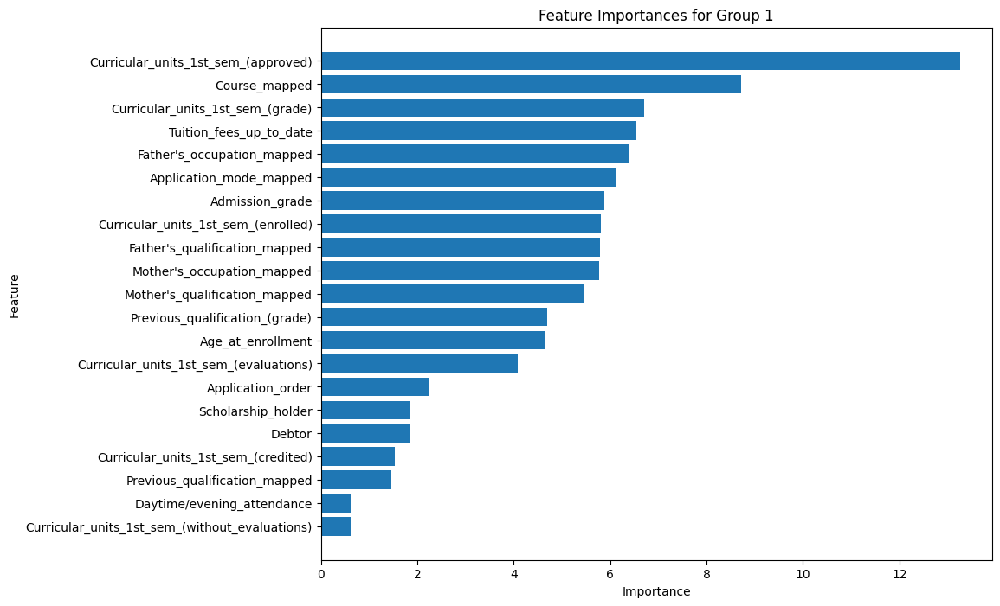


Training and Evaluating on Group 2

Training on Fold 1 of Group 2
0:	learn: 0.6327021	total: 24.7ms	remaining: 24.7s
100:	learn: 0.2891312	total: 2.69s	remaining: 24s
200:	learn: 0.2050949	total: 5.25s	remaining: 20.9s
300:	learn: 0.1509332	total: 7.82s	remaining: 18.2s
400:	learn: 0.1123528	total: 10.5s	remaining: 15.7s
500:	learn: 0.0871629	total: 13.2s	remaining: 13.2s
600:	learn: 0.0709016	total: 16.3s	remaining: 10.8s
700:	learn: 0.0565431	total: 19s	remaining: 8.1s
800:	learn: 0.0463801	total: 23s	remaining: 5.71s
900:	learn: 0.0376731	total: 26.2s	remaining: 2.88s
999:	learn: 0.0323783	total: 28.9s	remaining: 0us
Classification Report for Fold 1 of Group 2:
               precision    recall  f1-score   support

     Dropout       0.86      0.77      0.81       284
     Persist       0.80      0.88      0.84       301

    accuracy                           0.83       585
   macro avg       0.83      0.83      0.83       585
weighted avg       0.83      0.83      0.83       585

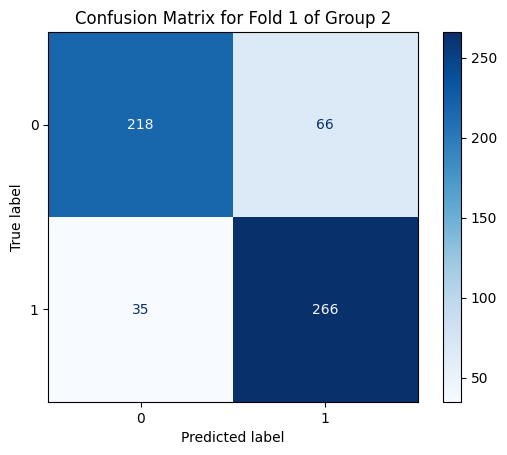


Training on Fold 2 of Group 2
0:	learn: 0.6384299	total: 22.7ms	remaining: 22.7s
100:	learn: 0.3077321	total: 2.91s	remaining: 25.9s
200:	learn: 0.2320463	total: 6.22s	remaining: 24.7s
300:	learn: 0.1734877	total: 9.19s	remaining: 21.4s
400:	learn: 0.1341078	total: 11.9s	remaining: 17.8s
500:	learn: 0.1018748	total: 14.6s	remaining: 14.5s
600:	learn: 0.0798615	total: 17.4s	remaining: 11.5s
700:	learn: 0.0644098	total: 20s	remaining: 8.54s
800:	learn: 0.0536817	total: 22.7s	remaining: 5.65s
900:	learn: 0.0456837	total: 25.4s	remaining: 2.79s
999:	learn: 0.0390611	total: 28.2s	remaining: 0us
Classification Report for Fold 2 of Group 2:
               precision    recall  f1-score   support

     Dropout       0.85      0.80      0.83       284
     Persist       0.82      0.87      0.85       301

    accuracy                           0.84       585
   macro avg       0.84      0.83      0.84       585
weighted avg       0.84      0.84      0.84       585



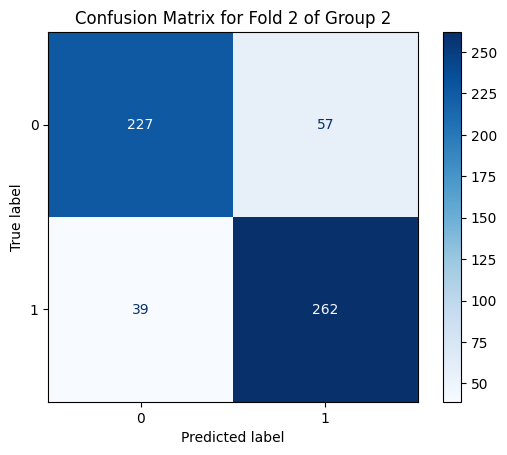


Training on Fold 3 of Group 2
0:	learn: 0.6375116	total: 26.9ms	remaining: 26.8s
100:	learn: 0.2930983	total: 2.79s	remaining: 24.9s
200:	learn: 0.2095155	total: 5.84s	remaining: 23.2s
300:	learn: 0.1559268	total: 9.17s	remaining: 21.3s
400:	learn: 0.1221075	total: 12.3s	remaining: 18.3s
500:	learn: 0.0948492	total: 15.1s	remaining: 15s
600:	learn: 0.0766192	total: 18.1s	remaining: 12s
700:	learn: 0.0630303	total: 21.4s	remaining: 9.15s
800:	learn: 0.0528070	total: 24.1s	remaining: 5.99s
900:	learn: 0.0435236	total: 26.8s	remaining: 2.95s
999:	learn: 0.0385379	total: 30.1s	remaining: 0us
Classification Report for Fold 3 of Group 2:
               precision    recall  f1-score   support

     Dropout       0.82      0.74      0.78       285
     Persist       0.78      0.84      0.81       300

    accuracy                           0.79       585
   macro avg       0.80      0.79      0.79       585
weighted avg       0.79      0.79      0.79       585



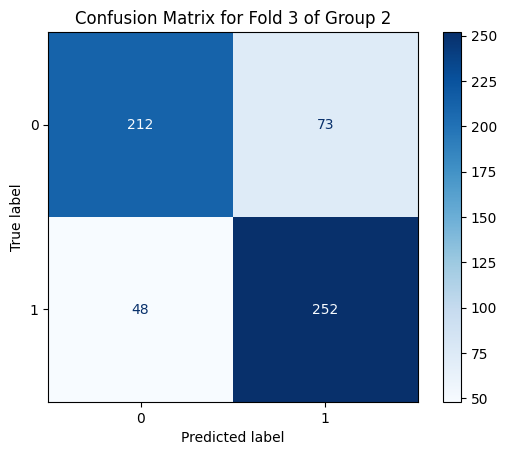


Training on Fold 4 of Group 2
0:	learn: 0.6388121	total: 32.2ms	remaining: 32.1s
100:	learn: 0.2951976	total: 3.68s	remaining: 32.7s
200:	learn: 0.2121683	total: 7.5s	remaining: 29.8s
300:	learn: 0.1631153	total: 10.9s	remaining: 25.3s
400:	learn: 0.1222678	total: 14.3s	remaining: 21.3s
500:	learn: 0.0962181	total: 17.4s	remaining: 17.4s
600:	learn: 0.0773680	total: 20.7s	remaining: 13.8s
700:	learn: 0.0625946	total: 23.7s	remaining: 10.1s
800:	learn: 0.0523304	total: 26.5s	remaining: 6.59s
900:	learn: 0.0440285	total: 29.5s	remaining: 3.24s
999:	learn: 0.0376478	total: 32.5s	remaining: 0us
Classification Report for Fold 4 of Group 2:
               precision    recall  f1-score   support

     Dropout       0.83      0.77      0.80       284
     Persist       0.80      0.85      0.82       300

    accuracy                           0.81       584
   macro avg       0.82      0.81      0.81       584
weighted avg       0.81      0.81      0.81       584



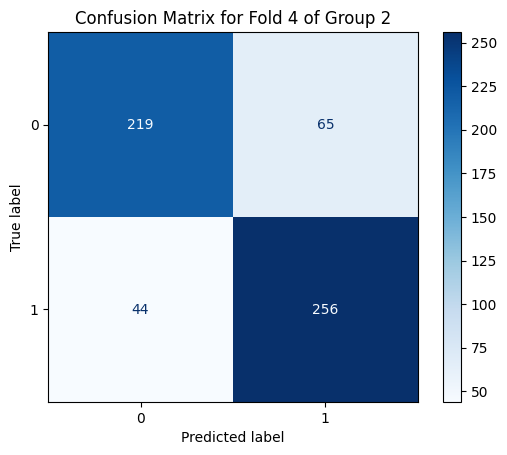


Training on Fold 5 of Group 2
0:	learn: 0.6421143	total: 29.5ms	remaining: 29.5s
100:	learn: 0.3017429	total: 2.97s	remaining: 26.4s
200:	learn: 0.2206814	total: 6.14s	remaining: 24.4s
300:	learn: 0.1670159	total: 8.85s	remaining: 20.6s
400:	learn: 0.1288351	total: 11.6s	remaining: 17.4s
500:	learn: 0.1012666	total: 14.9s	remaining: 14.9s
600:	learn: 0.0789426	total: 17.9s	remaining: 11.9s
700:	learn: 0.0647299	total: 20.6s	remaining: 8.78s
800:	learn: 0.0540788	total: 23.5s	remaining: 5.83s
900:	learn: 0.0461373	total: 26.5s	remaining: 2.91s
999:	learn: 0.0396092	total: 29s	remaining: 0us
Classification Report for Fold 5 of Group 2:
               precision    recall  f1-score   support

     Dropout       0.84      0.76      0.80       284
     Persist       0.79      0.86      0.83       300

    accuracy                           0.82       584
   macro avg       0.82      0.81      0.81       584
weighted avg       0.82      0.82      0.81       584



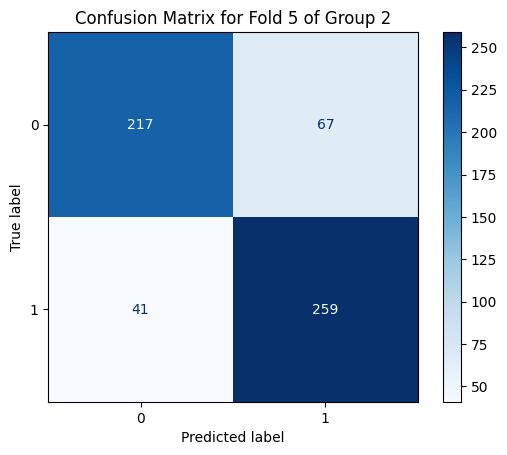


Summary of 5-Fold Cross-Validation Results for Group 2:
Classification Report for Fold 1:
               precision    recall  f1-score   support

     Dropout       0.86      0.77      0.81       284
     Persist       0.80      0.88      0.84       301

    accuracy                           0.83       585
   macro avg       0.83      0.83      0.83       585
weighted avg       0.83      0.83      0.83       585

Classification Report for Fold 2:
               precision    recall  f1-score   support

     Dropout       0.85      0.80      0.83       284
     Persist       0.82      0.87      0.85       301

    accuracy                           0.84       585
   macro avg       0.84      0.83      0.84       585
weighted avg       0.84      0.84      0.84       585

Classification Report for Fold 3:
               precision    recall  f1-score   support

     Dropout       0.82      0.74      0.78       285
     Persist       0.78      0.84      0.81       300

    accuracy        

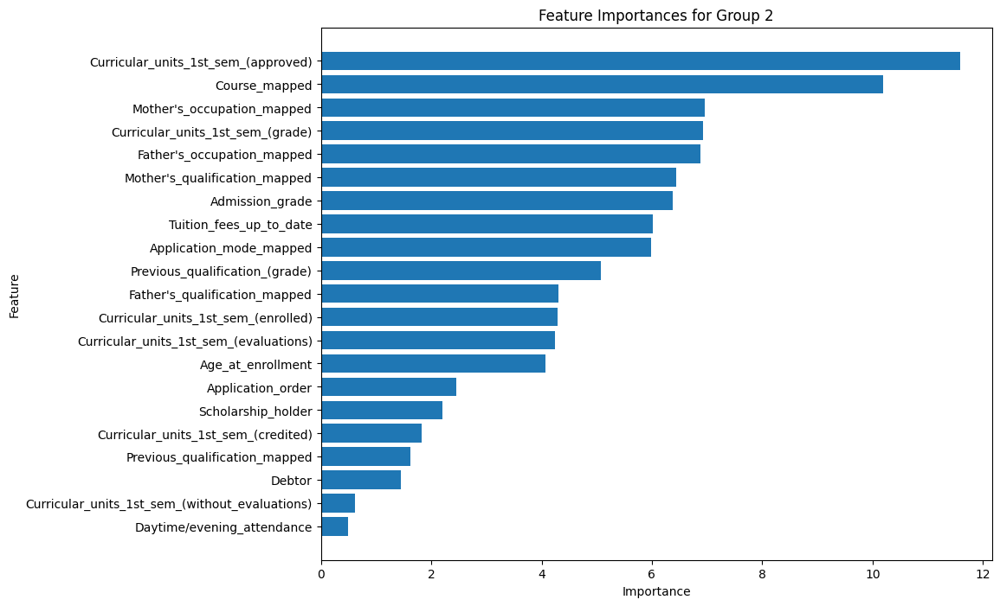

In [115]:
import pandas as pd
from catboost import CatBoostClassifier, Pool
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import StratifiedKFold
import matplotlib.pyplot as plt

# Define the columns to use, excluding original and grouped columns
all_features = [
    'Application_order',
    'Daytime/evening_attendance', 'Previous_qualification_(grade)', 'Admission_grade', 'Debtor', 'Tuition_fees_up_to_date',
    'Scholarship_holder', 'Age_at_enrollment',
    'Curricular_units_1st_sem_(credited)', 'Curricular_units_1st_sem_(enrolled)',
    'Curricular_units_1st_sem_(evaluations)', 'Curricular_units_1st_sem_(approved)',
    'Curricular_units_1st_sem_(grade)', 'Curricular_units_1st_sem_(without_evaluations)',
    
    "Mother's_qualification_mapped",
    "Father's_qualification_mapped", 'Previous_qualification_mapped',
    'Application_mode_mapped', 'Course_mapped', "Mother's_occupation_mapped", "Father's_occupation_mapped"
]

# Define categorical features for CatBoost
categ_features = [
  
   
    'Debtor',
    'Tuition_fees_up_to_date',
    'Scholarship_holder',
    'Daytime/evening_attendance',
    "Mother's_qualification_mapped",
    "Father's_qualification_mapped",
    'Previous_qualification_mapped',
    'Application_mode_mapped',
    "Mother's_occupation_mapped",
    "Father's_occupation_mapped",
    'Course_mapped'
]

# Map original Target to binary
data['Target_binary'] = data['Target'].map({0: 0, 1: 1, 2: 1})

# Check the counts
print("Value counts for each category in the 'Target_binary' column:")
print(data['Target_binary'].value_counts())

# Split data into 'persist' and 'dropout' subsets
persist_data = data[data['Target_binary'] == 1]
dropout_data = data[data['Target_binary'] == 0]

# Split 'persist_data' into two subsets
persist_splits = [persist_data.iloc[:1501], persist_data.iloc[1501:]]

# Define groups by combining 'dropout_data' with each 'persist_split'
groups = {
    "Group 1": pd.concat([persist_splits[0], dropout_data]),
    "Group 2": pd.concat([persist_splits[1], dropout_data])
}

# Train and evaluate CatBoost model on each group using stratified 5-fold cross-validation
for group_name, group_data in groups.items():
    print(f"\nTraining and Evaluating on {group_name}")

    # Separate features and target
    X = group_data[all_features]
    y = group_data['Target_binary']

    # Initialize stratified K-Fold cross-validator
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    # Initialize an empty list to store evaluation results
    evaluation_reports = []

    # Start stratified 5-fold cross-validation
    for fold, (train_idx, test_idx) in enumerate(skf.split(X, y)):
        print(f"\nTraining on Fold {fold + 1} of {group_name}")

        # Split data into training and testing sets for this fold
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

        # Define CatBoost Pool (needed for categorical features)
        train_pool = Pool(X_train, y_train, cat_features=categ_features)
        test_pool = Pool(X_test, y_test, cat_features=categ_features)

        # Initialize and train CatBoost model
        model = CatBoostClassifier(
            iterations=1000,
            learning_rate=0.1,
            depth=6,
            verbose=100,
            random_seed=42
        )
        model.fit(train_pool)

        # Make predictions and evaluate the model
        y_pred = model.predict(test_pool)
        report = classification_report(y_test, y_pred, target_names=['Dropout', 'Persist'])
        print(f"Classification Report for Fold {fold + 1} of {group_name}:\n", report)

        # Append the report to the list for further analysis
        evaluation_reports.append(report)

        # Compute confusion matrix
        cm = confusion_matrix(y_test, y_pred)

        # Plot confusion matrix
        disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
        disp.plot(cmap=plt.cm.Blues)
        plt.title(f'Confusion Matrix for Fold {fold + 1} of {group_name}')
        plt.show()

    # Summary of the reports after all folds have been completed for each group
    print(f"\nSummary of 5-Fold Cross-Validation Results for {group_name}:")
    for i, report in enumerate(evaluation_reports, 1):
        print(f"Classification Report for Fold {i}:\n", report)

    # Plot feature importances
    feature_importances = model.feature_importances_
    sorted_indices = feature_importances.argsort()[::-1]
    plt.figure(figsize=(10, 8))
    plt.barh(
        [all_features[i] for i in sorted_indices],
        feature_importances[sorted_indices]
    )
    plt.xlabel('Importance')
    plt.ylabel('Feature')
    plt.title(f'Feature Importances for {group_name}')
    plt.gca().invert_yaxis()
    plt.show()


Running CatBoost CV for Group 1
Training on fold [0/5]
0:	learn: 0.6283501	test: 0.6331947	best: 0.6331947 (0)	total: 25.3ms	remaining: 25.3s
100:	learn: 0.2549614	test: 0.4098409	best: 0.4094499 (99)	total: 2.58s	remaining: 23s
200:	learn: 0.1756202	test: 0.4108160	best: 0.4089316 (138)	total: 5.17s	remaining: 20.5s
300:	learn: 0.1239369	test: 0.4328861	best: 0.4089316 (138)	total: 7.77s	remaining: 18.1s
400:	learn: 0.0934259	test: 0.4500081	best: 0.4089316 (138)	total: 10.4s	remaining: 15.5s
500:	learn: 0.0721017	test: 0.4651318	best: 0.4089316 (138)	total: 13s	remaining: 12.9s
600:	learn: 0.0571400	test: 0.4801977	best: 0.4089316 (138)	total: 15.6s	remaining: 10.4s
700:	learn: 0.0463455	test: 0.4967877	best: 0.4089316 (138)	total: 18.2s	remaining: 7.77s
800:	learn: 0.0373938	test: 0.5105604	best: 0.4089316 (138)	total: 20.8s	remaining: 5.18s
900:	learn: 0.0307824	test: 0.5252830	best: 0.4089316 (138)	total: 23.5s	remaining: 2.58s
999:	learn: 0.0267167	test: 0.5371751	best: 0.408931

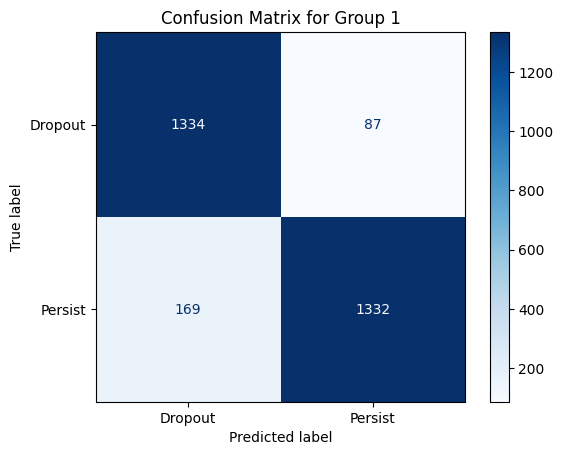


Running CatBoost CV for Group 2
Training on fold [0/5]
0:	learn: 0.6346351	test: 0.6318120	best: 0.6318120 (0)	total: 20.4ms	remaining: 3.97s
100:	learn: 0.2760668	test: 0.4026389	best: 0.4023098 (98)	total: 2.24s	remaining: 2.1s
195:	learn: 0.1970938	test: 0.4099517	best: 0.4012337 (107)	total: 4.28s	remaining: 0us

bestTest = 0.4012337134
bestIteration = 107

Training on fold [1/5]
0:	learn: 0.6291599	test: 0.6321194	best: 0.6321194 (0)	total: 19.8ms	remaining: 3.86s
100:	learn: 0.2751228	test: 0.4046515	best: 0.4043828 (98)	total: 2.29s	remaining: 2.16s
195:	learn: 0.1872595	test: 0.4150557	best: 0.4043828 (98)	total: 4.42s	remaining: 0us

bestTest = 0.404382772
bestIteration = 98

Training on fold [2/5]
0:	learn: 0.6281626	test: 0.6291799	best: 0.6291799 (0)	total: 18.8ms	remaining: 3.67s
100:	learn: 0.2864189	test: 0.3809757	best: 0.3804686 (99)	total: 2.19s	remaining: 2.06s
195:	learn: 0.2075865	test: 0.3812737	best: 0.3770223 (147)	total: 4.18s	remaining: 0us

bestTest = 0.3770

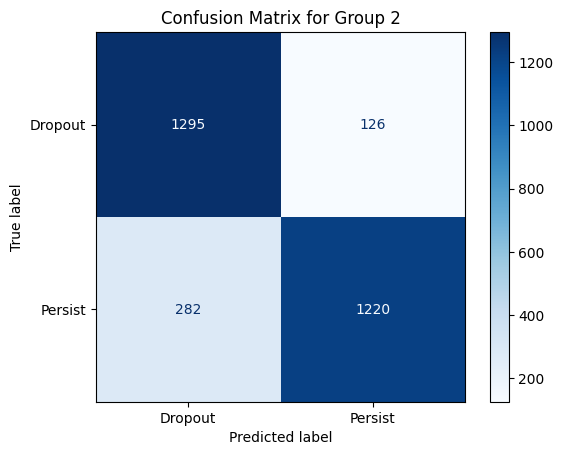

In [125]:
import pandas as pd
from catboost import CatBoostClassifier, Pool, cv
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Define the columns to use, excluding original and grouped columns
all_features = [
    'Marital_status', 'Application_order', 'Daytime/evening_attendance', 'Previous_qualification_(grade)',
    'Admission_grade', 'Displaced', 'Educational_special_needs', 'Debtor', 'Tuition_fees_up_to_date', 'Gender',
    'Scholarship_holder', 'Age_at_enrollment', 'International', 'Curricular_units_1st_sem_(credited)',
    'Curricular_units_1st_sem_(enrolled)', 'Curricular_units_1st_sem_(evaluations)',
    'Curricular_units_1st_sem_(approved)', 'Curricular_units_1st_sem_(grade)',
    'Curricular_units_1st_sem_(without_evaluations)', 'Unemployment_rate', 'Inflation_rate', 'GDP',
    "Mother's_qualification_mapped", "Father's_qualification_mapped", 'Previous_qualification_mapped',
    'Application_mode_mapped', 'Course_mapped', "Mother's_occupation_mapped", "Father's_occupation_mapped"
]

# Define categorical features for CatBoost
categ_features = [
    'Displaced', 'Gender', 'International', 'Educational_special_needs', 'Debtor', 'Tuition_fees_up_to_date',
    'Scholarship_holder', 'Daytime/evening_attendance', 'Marital_status', "Mother's_qualification_mapped",
    "Father's_qualification_mapped", 'Previous_qualification_mapped', 'Application_mode_mapped',
    "Mother's_occupation_mapped", "Father's_occupation_mapped", 'Course_mapped'
]

# Ensure categorical columns are strings
for cat_col in categ_features:
    data[cat_col] = data[cat_col].astype(str)

# Map original Target to binary
data['Target_binary'] = data['Target'].map({0: 0, 1: 1, 2: 1})

# Split data into 'persist' and 'dropout' subsets
persist_data = data[data['Target_binary'] == 1]
dropout_data = data[data['Target_binary'] == 0]

# Split 'persist_data' into two subsets
persist_splits = [persist_data.iloc[:1501], persist_data.iloc[1501:]]

# Define groups by combining 'dropout_data' with each 'persist_split'
groups = {
    "Group 1": pd.concat([persist_splits[0], dropout_data]),
    "Group 2": pd.concat([persist_splits[1], dropout_data])
}

# CatBoost cross-validation parameters
params = {
    'loss_function': 'Logloss',
    'iterations': 1000,
    'depth': 6,
    'learning_rate': 0.1,
    'class_weights': [2, 1],  # Higher weight for dropout class (0)
    'random_seed': 42,
    'verbose': 100
}

# Run CatBoost's cross-validation in each group
for group_name, group_data in groups.items():
    print(f"\nRunning CatBoost CV for {group_name}")

    # Separate features and target
    X = group_data[all_features]
    y = group_data['Target_binary']

    # Perform cross-validation using CatBoost's native cv function
    cv_data = cv(
        Pool(X, y, cat_features=categ_features),
        params=params,
        fold_count=5,
        partition_random_seed=42,
        shuffle=True,
        stratified=True,
        plot=False # Optional: plot the learning curve
    )

    # Extract the best number of iterations based on cross-validation results
    best_iteration = cv_data['test-Logloss-mean'].idxmin()
    print(f"Best iteration for {group_name}: {best_iteration}")

    # Update the number of iterations in params
    params['iterations'] = best_iteration

    # Train final model on the entire group data with the updated params
    final_model = CatBoostClassifier(**params)

    final_model.fit(Pool(X, y, cat_features=categ_features))

    # Predictions and evaluation
    y_pred = final_model.predict(X)

    # Print classification report
    print(f"\nClassification Report for {group_name}:")
    print(classification_report(y, y_pred, target_names=['Dropout', 'Persist']))

    # Display the confusion matrix
    cm = confusion_matrix(y, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Dropout', 'Persist'])
    disp.plot(cmap='Blues')
    plt.title(f'Confusion Matrix for {group_name}')
    plt.show()



Training final CatBoost model for Group 1

Classification Report for Group 1:
              precision    recall  f1-score   support

     Dropout       0.89      0.94      0.91      1421
     Persist       0.94      0.89      0.91      1501

    accuracy                           0.91      2922
   macro avg       0.91      0.91      0.91      2922
weighted avg       0.91      0.91      0.91      2922



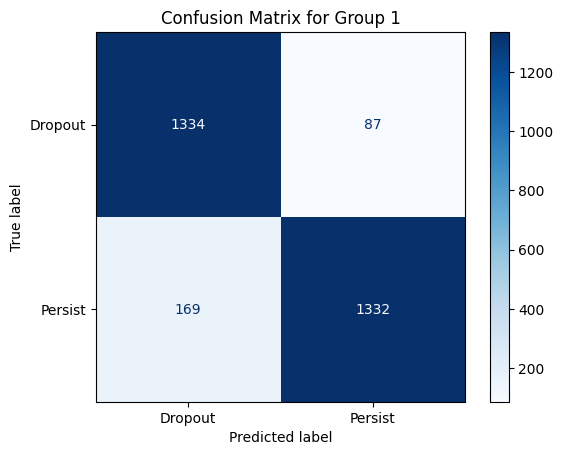


Training final CatBoost model for Group 2

Classification Report for Group 2:
              precision    recall  f1-score   support

     Dropout       0.82      0.91      0.86      1421
     Persist       0.91      0.81      0.86      1502

    accuracy                           0.86      2923
   macro avg       0.86      0.86      0.86      2923
weighted avg       0.86      0.86      0.86      2923



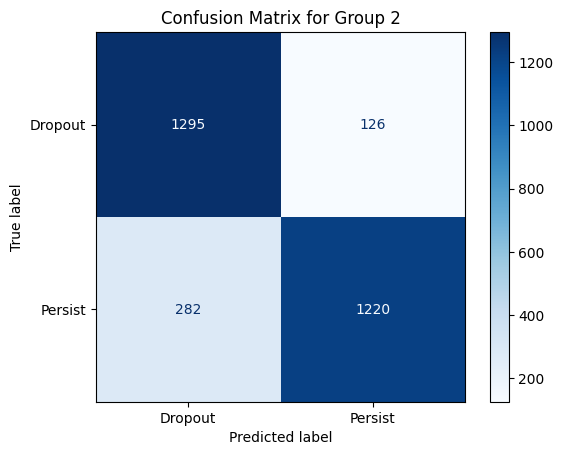

In [126]:
import pandas as pd
from catboost import CatBoostClassifier, Pool
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Define your features, target, and categorical features (as you have done previously)
all_features = [
    'Marital_status', 'Application_order', 'Daytime/evening_attendance', 
    'Previous_qualification_(grade)', 'Admission_grade', 'Displaced', 
    'Educational_special_needs', 'Debtor', 'Tuition_fees_up_to_date', 
    'Gender', 'Scholarship_holder', 'Age_at_enrollment', 'International',
    'Curricular_units_1st_sem_(credited)', 'Curricular_units_1st_sem_(enrolled)',
    'Curricular_units_1st_sem_(evaluations)', 'Curricular_units_1st_sem_(approved)',
    'Curricular_units_1st_sem_(grade)', 'Curricular_units_1st_sem_(without_evaluations)',
    'Unemployment_rate', 'Inflation_rate', 'GDP', "Mother's_qualification_mapped",
    "Father's_qualification_mapped", 'Previous_qualification_mapped', 
    'Application_mode_mapped', 'Course_mapped', "Mother's_occupation_mapped", 
    "Father's_occupation_mapped"
]

categ_features = [
    'Displaced', 'Gender', 'International', 'Educational_special_needs', 
    'Debtor', 'Tuition_fees_up_to_date', 'Scholarship_holder', 
    'Daytime/evening_attendance', 'Marital_status', "Mother's_qualification_mapped",
    "Father's_qualification_mapped", 'Previous_qualification_mapped', 
    'Application_mode_mapped', "Mother's_occupation_mapped", 
    "Father's_occupation_mapped", 'Course_mapped'
]

# Mapping binary target for dropout prediction
data['Target_binary'] = data['Target'].map({0: 0, 1: 1, 2: 1})

# Split data into 'persist' and 'dropout' subsets and create groups
persist_data = data[data['Target_binary'] == 1]
dropout_data = data[data['Target_binary'] == 0]
persist_splits = [persist_data.iloc[:1501], persist_data.iloc[1501:]]
groups = {
    "Group 1": pd.concat([persist_splits[0], dropout_data]),
    "Group 2": pd.concat([persist_splits[1], dropout_data])
}

# Parameters with the best iteration counts for each group
best_iterations = {
    "Group 1": 196,  # Replace with the best iteration found for Group 1
    "Group 2": 110   # Replace with the best iteration found for Group 2
}

# Train and evaluate the final model for each group
for group_name, group_data in groups.items():
    print(f"\nTraining final CatBoost model for {group_name}")
    
    # Separate features and target
    X = group_data[all_features]
    y = group_data['Target_binary']
    
    # Define model with the best iteration
    final_model = CatBoostClassifier(
        loss_function='Logloss',
        iterations=best_iterations[group_name],
        depth=6,
        learning_rate=0.1,
        class_weights=[2, 1],  # Assuming dropout is the minority class
        random_seed=42,
        verbose=False
    )
    
    # Train on the full data of the group
    final_model.fit(Pool(X, y, cat_features=categ_features))
    
    # Predict and evaluate
    predictions = final_model.predict(X)
    print(f"\nClassification Report for {group_name}:")
    print(classification_report(y, predictions, target_names=['Dropout', 'Persist']))
    
    # Confusion matrix
    cm = confusion_matrix(y, predictions)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Dropout', 'Persist'])
    disp.plot(cmap='Blues')
    plt.title(f"Confusion Matrix for {group_name}")
    plt.show()


0:	learn: 0.6251689	total: 32.6ms	remaining: 3.55s
100:	learn: 0.2806992	total: 2.42s	remaining: 216ms
109:	learn: 0.2729105	total: 2.62s	remaining: 0us
Classification Report for Group 2 (Test Set):
              precision    recall  f1-score   support

           0       0.77      0.91      0.84      1421
           1       0.90      0.75      0.82      1502

    accuracy                           0.83      2923
   macro avg       0.84      0.83      0.83      2923
weighted avg       0.84      0.83      0.83      2923



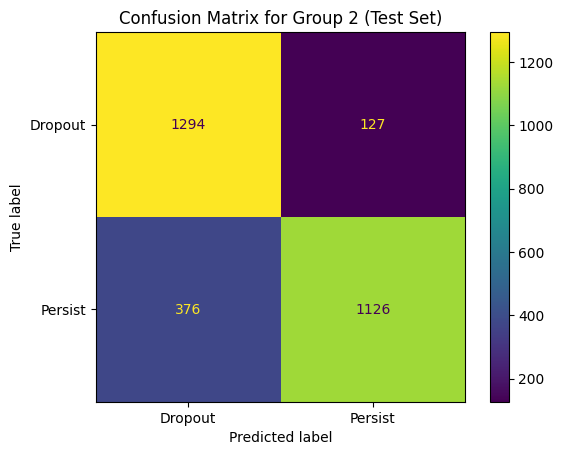

In [127]:
from catboost import Pool
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Separate features and target for Group 1 and Group 2
X_group1 = groups["Group 1"][all_features]
y_group1 = groups["Group 1"]['Target_binary']
X_group2 = groups["Group 2"][all_features]
y_group2 = groups["Group 2"]['Target_binary']

# Train the final model on Group 1 data
final_model_group1 = CatBoostClassifier(**params)
final_model_group1.fit(Pool(X_group1, y_group1, cat_features=categ_features))

# Use Group 2 data as a test set
y_pred_group2 = final_model_group1.predict(X_group2)

# Evaluate performance on Group 2
print("Classification Report for Group 2 (Test Set):")
print(classification_report(y_group2, y_pred_group2))

# Plot confusion matrix
conf_matrix = confusion_matrix(y_group2, y_pred_group2)
ConfusionMatrixDisplay(conf_matrix, display_labels=["Dropout", "Persist"]).plot()
plt.title("Confusion Matrix for Group 2 (Test Set)")
plt.show()


## CATBOOST - mapped & grouped feutures - controlled group splits with 5-Fold validation 

In [ ]:
import pandas as pd
from catboost import CatBoostClassifier, Pool
from sklearn.metrics import classification_report
from collections import Counter
from sklearn.model_selection import StratifiedKFold
from catboost import cv

# Define the columns to use
all_features = [
    'Application_order',
    'Daytime/evening_attendance', 'Previous_qualification_(grade)', 'Admission_grade',
    'Displaced', 'Educational_special_needs', 'Debtor', 'Tuition_fees_up_to_date',
    'Gender', 'Scholarship_holder', 'Age_at_enrollment', 'International',
    'Curricular_units_1st_sem_(credited)', 'Curricular_units_1st_sem_(enrolled)',
    'Curricular_units_1st_sem_(evaluations)', 'Curricular_units_1st_sem_(approved)',
    'Curricular_units_1st_sem_(grade)', 'Curricular_units_1st_sem_(without_evaluations)',
    'Curricular_units_2nd_sem_(credited)', 'Curricular_units_2nd_sem_(enrolled)',
    'Curricular_units_2nd_sem_(evaluations)', 'Curricular_units_2nd_sem_(approved)',
    'Curricular_units_2nd_sem_(grade)', 'Curricular_units_2nd_sem_(without_evaluations)',
    'Unemployment_rate', 'Inflation_rate', 'GDP',
    'Application_mode_mapped', 'Course_mapped',
    "Mother's_qualification_grouped", 
    "Father's_qualification_grouped",
    'Previous_qualification_grouped',
    'Marital_status_grouped', 
    'Mother_Occupation_Grouped', 
    'Father_Occupation_Grouped', 
    
]

# Define categorical features for CatBoost
categ_features = [
    'Displaced',
    'Gender',
    'International',
    'Educational_special_needs',
    'Debtor',
    'Tuition_fees_up_to_date',
    'Scholarship_holder',
    'Daytime/evening_attendance' , 

    'Application_mode_mapped',
    'Course_mapped',
    "Mother's_qualification_grouped", 
    "Father's_qualification_grouped",
    'Previous_qualification_grouped',
    'Marital_status_grouped', 
    'Mother_Occupation_Grouped', 
    'Father_Occupation_Grouped',
]

# Split data into each class subset
graduate_data = data[data['Target'] == 2]
dropout_data = data[data['Target'] == 0]
enrolled_data = data[data['Target'] == 1]

# Define the split groups for Graduates and Dropouts
graduate_splits = [graduate_data.iloc[:736], graduate_data.iloc[736:1472], graduate_data.iloc[1472:]]
dropout_splits = [dropout_data.iloc[:711], dropout_data.iloc[711:]]

# Define each group combination
groups = {
    "Group 1": pd.concat([graduate_splits[0], dropout_splits[0], enrolled_data]),
    "Group 2": pd.concat([graduate_splits[1], dropout_splits[1], enrolled_data]),
    "Group 3": pd.concat([graduate_splits[2], dropout_splits[0], enrolled_data])
}

# Train and evaluate CatBoost model on each group using stratified 5-fold cross-validation
for group_name, group_data in groups.items():
    print(f"\nTraining and Evaluating on {group_name}")

    # Separate features and target
    X = group_data[all_features]
    y = group_data['Target']

    # Initialize stratified K-Fold cross-validator
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    # Initialize an empty list to store evaluation results
    evaluation_reports = []

    # Start stratified 5-fold cross-validation
    for fold, (train_idx, test_idx) in enumerate(skf.split(X, y)):
        print(f"\nTraining on Fold {fold + 1} of {group_name}")

        # Split data into training and testing sets for this fold
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

        # Define CatBoost Pool (needed for categorical features)
        train_pool = Pool(X_train, y_train, cat_features=categ_features)
        test_pool = Pool(X_test, y_test, cat_features=categ_features)

        # Initialize and train CatBoost model
        model = CatBoostClassifier(iterations=1000, learning_rate=0.1, depth=6, verbose=100, random_seed=42)
        model.fit(train_pool)

        # Make predictions and evaluate the model
        y_pred = model.predict(test_pool)
        report = classification_report(y_test, y_pred, target_names=['Dropout', 'Enrolled', 'Graduate'])
        print(f"Classification Report for Fold {fold + 1} of {group_name}:\n", report)

        # Append the report to the list for further analysis
        evaluation_reports.append(report)

    # summary the reports after all folds have been completed for each group
    print(f"\nSummary of 5-Fold Cross-Validation Results for {group_name}:")
    for i, report in enumerate(evaluation_reports, 1):
        print(f"Classification Report for Fold {i}:\n", report)

 # Compute confusion matrix
        cm = confusion_matrix(y_test, y_pred)

        # Plot confusion matrix
        disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
        disp.plot(cmap=plt.cm.Blues)
        plt.title(f'Confusion Matrix for Fold {fold + 1} of {group_name}')
        plt.show()

        
    # Plot feature importances
    feature_importances = model.feature_importances_
    sorted_indices = feature_importances.argsort()[::-1]
    plt.figure(figsize=(10, 8))
    plt.barh([all_features[i] for i in sorted_indices], feature_importances[sorted_indices])
    plt.xlabel('Importance')
    plt.ylabel('Feature')
    plt.title(f'Feature Importances for {group_name}')
    plt.gca().invert_yaxis()
    plt.show()
